In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.sparse as sp
from time import time
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import pairwise_distances
from scipy.stats.stats import pearsonr
import graphlab
from sklearn.cross_validation import train_test_split
from math import sqrt
import scipy.sparse as sp
from scipy.sparse.linalg import svds
%matplotlib inline
from pattern.vector import stem, PORTER, LEMMA
punctuation = list(".,;:!?()[]{}`'\"@#$^&*+-|=~_")
from mrjob.job import MRJob
from collections import Counter, defaultdict
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
import gensim
import string
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
import string
from gensim import corpora
from sklearn.utils import shuffle

/home/anusha/anaconda2/lib/python2.7/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


This non-commercial license of GraphLab Create for academic use is assigned to anushadevimohan@gmail.com and will expire on July 27, 2018.


[INFO] graphlab.cython.cy_server: GraphLab Create v2.1 started. Logging: /tmp/graphlab_server_1504578474.log
Using TensorFlow backend.


In [2]:
df = pd.read_csv("reg_text.csv")

/home/anusha/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (41) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
df["bad_review"] = df["rating"] < df["course_rating_avg"]

In [4]:
df.bad_review = df.bad_review.astype(int)

In [5]:
dummies_text = pd.get_dummies(df["topic"])

In [6]:
lda_data = pd.read_csv("reg_lda")

In [7]:
dummies_lda = pd.get_dummies(lda_data["topic"], prefix="topic_")

In [8]:
lda_data = pd.concat([lda_data, dummies_lda], axis = 1)

In [9]:
df = pd.concat([df, dummies_text], axis = 1)

In [10]:
df.new_course_id.nunique()

933

In [11]:
lda_data = lda_data[["id", 'topic__0', u'topic__1', u'topic__2', u'topic__3',
       u'topic__4', u'topic__5', u'topic__6', u'topic__7', u'topic__8',
       u'topic__9', u'topic__10', u'topic__11', u'topic__12', u'topic__13',
       u'topic__14', u'topic__15']]

In [12]:
df = df.merge(lda_data, on = "id")

In [13]:
df.shape

(46887, 62)

In [14]:
len(df[df["user_review_count"] < 3])

0

In [15]:
df.columns

Index([u'Unnamed: 0', u'Unnamed: 0.1', u'_class_x', u'content', u'course_id',
       u'created', u'id', u'modified', u'rating', u'title_x', u'user',
       u'userid', u'_class_y', u'image_125_H', u'image_240x135',
       u'image_480x270', u'input_features', u'is_paid',
       u'is_practice_test_course', u'lecture_search_result',
       u'predictive_score', u'price', u'published_title', u'relevancy_score',
       u'title_y', u'url', u'visible_instructors', u'user_rating_avg',
       u'user_review_count', u'course_review_count', u'course_rating_avg',
       u'instructor_name', u'instructor_title', u'new_course_id',
       u'new_user_id', u'course_category', u'Unnamed: 35', u'resp',
       u'valid_char', u'clean_content', u'review', u'topic', u'bad_review',
       u'course content and video quality', u'instructor and explanations',
       u'no topic', u'topic__0', u'topic__1', u'topic__2', u'topic__3',
       u'topic__4', u'topic__5', u'topic__6', u'topic__7', u'topic__8',
       u'topic_

In [16]:
df = df[["id", "new_course_id", "rating", "new_user_id", "bad_review", "is_paid", "is_practice_test_course", 
         "price", "course content and video quality", "instructor and explanations", "no topic",'topic__0', u'topic__1', u'topic__2', u'topic__3',
       u'topic__4', u'topic__5', u'topic__6', u'topic__7', u'topic__8',
       u'topic__9', u'topic__10', u'topic__11', u'topic__12', u'topic__13',
       u'topic__14', u'topic__15'  ]]

In [17]:
df.new_user_id.nunique()

12275

In [18]:
item_data = df[["new_course_id", "is_paid", "is_practice_test_course", "price", 'topic__0', u'topic__1', u'topic__2',
               u'topic__3',  u'topic__4', u'topic__5', u'topic__6', u'topic__7', u'topic__8',
       u'topic__9', u'topic__10', u'topic__11', u'topic__12', u'topic__13',
       u'topic__14', u'topic__15']]

In [19]:
item_data.drop_duplicates(inplace=True)

/home/anusha/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [20]:
item_data.shape

(933, 20)

In [21]:
user_data = df[["id", "new_user_id", "bad_review", "course content and video quality", "instructor and explanations", "no topic"]]

In [22]:
user_data.shape

(46887, 6)

In [24]:
sfobs = graphlab.SFrame(df)

In [25]:
itemdata = graphlab.SFrame(item_data)

In [26]:
train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")
validate_df = pd.read_csv("validation.csv")

In [28]:
ids = train_df.id.tolist()
userdata = pd.DataFrame()
for i in xrange(len(user_data)):
    if user_data.iloc[i]["id"] in ids:
        userdata.append(user_data.iloc[i])

In [29]:
userdata = graphlab.SFrame(userdata)

In [30]:
train_df = train_df[["new_course_id", "new_user_id", "rating"]]
validate_df = validate_df[["new_course_id", "new_user_id", "rating"]]
test_df = test_df[["new_course_id", "new_user_id", "rating"]]

In [31]:
train_df = pd.concat([train_df, validate_df])

In [32]:
train_df = shuffle(train_df)

In [33]:
train_df.shape

(34716, 3)

In [88]:
#train_df.new_user_id.nunique()

12294

In [60]:
#validate_df.new_user_id.nunique()

9725

In [61]:
#test_df.new_user_id.nunique()

12294

In [34]:
sf_train = graphlab.SFrame(train_df)
#sf_validation = graphlab.SFrame(validate_df)
sf_test = graphlab.SFrame(test_df)

In [35]:
folds = graphlab.cross_validation.KFold(sf_train, 2)

In [36]:
sf_train.shape

(34716, 3)

In [138]:
folds = graphlab.cross_validation.KFold(sf_train, 2)
rmse = []
for train, valid in folds:
    model= graphlab.recommender.factorization_recommender.create(train, user_id='new_user_id', item_id='new_course_id',target='rating', item_data = itemdata, side_data_factorization=True, num_factors = 10, regularization=0.001, linear_regularization=0.001)
    predictions_valid = model.predict(valid)
    predictions_valid = np.array(predictions_valid)
    predictions_valid[predictions_valid > 5] = 5
    mse = mean_squared_error(valid["rating"], predictions_valid)
    rmse.append(np.sqrt(mse))

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055265s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | No Decrease (0.354208 >= 0.336927)       |

| 4       | 0.0093006         | 0.320464                                 |

| 5       | 0.0046503         | 0.321162                                 |

| 6       | 0.00232515        | 0.325662                                 |

| 7       | 0.00116257        | 0.330617                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.320464                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 117us        | 0.349613          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 64.04ms      | 0.36337           | 0.587765              | 0.0093006   |

| 2       | 94.47ms      | 0.354221          | 0.572938              | 0.0093006   |

| 3       | 141.907ms    | 0.347841          | 0.563505              | 0.0093006   |

| 4       | 230.003ms    | 0.341934          | 0.55627               | 0.0093006   |

| 5       | 282.416ms    | 0.337819          | 0.549919              | 0.0093006   |

| 6       | 409.026ms    | 0.334435          | 0.54389               | 0.0093006   |

| 11      | 892.153ms    | 0.321336          | 0.51579               | 0.0093006   |

| 25      | 2.17s        | 0.304044          | 0.461313              | 0.0093006   |

| 50      | 4.32s        | 0.298406          | 0.417115              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.298128

Final training RMSE: 0.416782

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.070984s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | No Decrease (0.379276 >= 0.373281)       |

| 4       | 0.0093006         | 0.352988                                 |

| 5       | 0.0046503         | 0.355864                                 |

| 6       | 0.00232515        | 0.360918                                 |

| 7       | 0.00116257        | 0.366432                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.352988                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.370385          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 109.2ms      | 0.38504           | 0.605438              | 0.0093006   |

| 2       | 190.183ms    | 0.375829          | 0.590141              | 0.0093006   |

| 3       | 228.187ms    | 0.369039          | 0.579922              | 0.0093006   |

| 4       | 268.585ms    | 0.362571          | 0.57173               | 0.0093006   |

| 5       | 305.493ms    | 0.357965          | 0.564438              | 0.0093006   |

| 6       | 343.5ms      | 0.35402           | 0.557474              | 0.0093006   |

| 11      | 841.423ms    | 0.338764          | 0.525792              | 0.0093006   |

| 25      | 1.92s        | 0.320227          | 0.471463              | 0.0093006   |

| 50      | 4.09s        | 0.31328           | 0.431419              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.312816

Final training RMSE: 0.430881

In [142]:
model= graphlab.recommender.factorization_recommender.create(train, user_id='new_user_id', item_id='new_course_id',target='rating', item_data = itemdata, side_data_factorization=True)

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.047216s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-08    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-10    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.301912                                 |

| 5       | 0.0046503         | 0.339262                                 |

| 6       | 0.00232515        | 0.355145                                 |

| 7       | 0.00116257        | 0.364641                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.301912                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 132us        | 0.37038           | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 128.629ms    | 0.366376          | 0.60529               | 0.0093006   |

| 2       | 253.26ms     | 0.347333          | 0.589349              | 0.0093006   |

| 3       | 314.27ms     | 0.333424          | 0.577429              | 0.0093006   |

| 4       | 457.035ms    | 0.320566          | 0.566185              | 0.0093006   |

| 5       | 599.389ms    | 0.307723          | 0.554728              | 0.0093006   |

| 6       | 691.649ms    | 0.295422          | 0.543526              | 0.0093006   |

| 10      | 1.23s        | 0.256057          | 0.50602               | 0.0093006   |

| 11      | 1.43s        | 0.248538          | 0.498535              | 0.0093006   |

| 20      | 2.32s        | 0.205188          | 0.452975              | 0.0093006   |

| 30      | 3.22s        | 0.180933          | 0.42536               | 0.0093006   |

| 40      | 4.11s        | 0.165813          | 0.407199              | 0.0093006   |

| 50      | 5.19s        | 0.155028          | 0.393734              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.153109

Final training RMSE: 0.391289

In [149]:
dic = {}
for reg in [0, 0.000001, 0.00001, 0.0001, 0.001, 0.01, 0.1, 1]:
    print reg
    for lin_reg in [0, 0.000001, 0.00001, 0.0001, 0.001, 0.01, 0.1, 1]:
        print lin_reg
        for num_fac in [6,8,10,12,14]:
            print num_fac
            folds = graphlab.cross_validation.KFold(sf_train, 2)
            rmse = []
            for train, valid in folds:
                model= graphlab.recommender.factorization_recommender.create(train, user_id='new_user_id', item_id='new_course_id',target='rating', item_data = itemdata, side_data_factorization=True, num_factors = num_fac, regularization=reg, linear_regularization=lin_reg)
                predictions_valid = model.predict(valid)
                predictions_valid = np.array(predictions_valid)
                predictions_valid[predictions_valid > 5] = 5
                mse = mean_squared_error(valid["rating"], predictions_valid)
                rmse.append(np.sqrt(mse))
            dic[(reg, lin_reg, num_fac)] = np.mean(rmse)

0
0
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056164s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.168217                                 |

| 4       | 0.0186012         | 0.231225                                 |

| 5       | 0.0093006         | 0.275053                                 |

| 6       | 0.0046503         | 0.309191                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.168217                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.349621          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 195.742ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 203.382ms    | 0.349612          | 0.59128               |             |

| 1       | 241.373ms    | 0.343692          | 0.586252              | 0.0186012   |

| 2       | 298.524ms    | 0.310896          | 0.55758               | 0.0186012   |

| 3       | 369.161ms    | 0.288313          | 0.536947              | 0.0186012   |

| 4       | 462.595ms    | 0.26644           | 0.516178              | 0.0186012   |

| 5       | 617.41ms     | 0.246613          | 0.496601              | 0.0186012   |

| 6       | 662.015ms    | 0.229733          | 0.479305              | 0.0186012   |

| 11      | 1.22s        | 0.180007          | 0.424273              | 0.0186012   |

| 24      | 2.00s        | 0.134385          | 0.366586              | 0.0186012   |

| 49      | 4.17s        | 0.101905          | 0.319225              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0986565

Final training RMSE: 0.314096

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058494s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.194734                                 |

| 4       | 0.0186012         | 0.24729                                  |

| 5       | 0.0093006         | 0.303946                                 |

| 6       | 0.0046503         | 0.33904                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.194734                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 125us        | 0.370381          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 52.453ms     | 0.363038          | 0.602525              | 0.0372024   |

| 2       | 158.197ms    | 0.308059          | 0.55503               | 0.0372024   |

| 3       | 302.923ms    | 0.276284          | 0.525627              | 0.0372024   |

| 4       | 363.621ms    | 0.249527          | 0.499527              | 0.0372024   |

| 5       | 503.63ms     | 0.226201          | 0.475606              | 0.0372024   |

| 6       | 619.112ms    | 0.205611          | 0.453443              | 0.0372024   |

| 10      | 878.935ms    | 0.146427          | 0.382657              | 0.0372024   |

| 11      | 1.03s        | 0.135451          | 0.368037              | 0.0372024   |

| 20      | 1.75s        | 0.0744801         | 0.27291               | 0.0372024   |

| 30      | 2.71s        | 0.0473477         | 0.217595              | 0.0372024   |

| 40      | 3.61s        | 0.0345356         | 0.185838              | 0.0372024   |

| 50      | 4.50s        | 0.0272386         | 0.165041              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0254981

Final training RMSE: 0.159681

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05789s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.148896                                 |

| 4       | 0.0186012         | 0.232816                                 |

| 5       | 0.0093006         | 0.271407                                 |

| 6       | 0.0046503         | 0.304485                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.148896                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 197us        | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 109.21ms     | 0.342765          | 0.58546               | 0.0372024   |

| 2       | 217.865ms    | 0.286469          | 0.535228              | 0.0372024   |

| 3       | 275.748ms    | 0.248735          | 0.498733              | 0.0372024   |

| 4       | 386.542ms    | 0.215713          | 0.464449              | 0.0372024   |

| 5       | 442.873ms    | 0.186961          | 0.43239               | 0.0372024   |

| 6       | 530.719ms    | 0.162743          | 0.403414              | 0.0372024   |

| 11      | 942.192ms    | 0.089012          | 0.298349              | 0.0372024   |

| 25      | 2.26s        | 0.0298606         | 0.172802              | 0.0372024   |

| 50      | 4.62s        | 0.0115499         | 0.10747               | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0104704

Final training RMSE: 0.102325

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.063214s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.296828                                 |

| 5       | 0.0046503         | 0.335878                                 |

| 6       | 0.00232515        | 0.355127                                 |

| 7       | 0.00116257        | 0.365093                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.296828                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 129us        | 0.370375          | 0.608585              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 104.975ms    | 0.366432          | 0.605336              | 0.0093006   |

| 2       | 253.064ms    | 0.346714          | 0.588824              | 0.0093006   |

| 3       | 378.069ms    | 0.331914          | 0.57612               | 0.0093006   |

| 4       | 486.894ms    | 0.318002          | 0.563917              | 0.0093006   |

| 5       | 631.942ms    | 0.304453          | 0.551773              | 0.0093006   |

| 6       | 708.327ms    | 0.29158           | 0.539982              | 0.0093006   |

| 10      | 918.357ms    | 0.249243          | 0.499242              | 0.0093006   |

| 11      | 1.03s        | 0.240893          | 0.490808              | 0.0093006   |

| 20      | 2.09s        | 0.190984          | 0.437018              | 0.0093006   |

| 30      | 2.98s        | 0.161588          | 0.40198               | 0.0093006   |

| 40      | 3.79s        | 0.14297           | 0.378113              | 0.0093006   |

| 50      | 4.81s        | 0.129703          | 0.360142              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.127798

Final training RMSE: 0.357489

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056218s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.276003                                 |

| 5       | 0.0046503         | 0.301853                                 |

| 6       | 0.00232515        | 0.319418                                 |

| 7       | 0.00116257        | 0.328444                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.276003                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.349615          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 41.327ms     | 0.344822          | 0.587215              | 0.0093006   |

| 2       | 184.281ms    | 0.324348          | 0.569516              | 0.0093006   |

| 3       | 333.894ms    | 0.311924          | 0.558502              | 0.0093006   |

| 4       | 404.362ms    | 0.300935          | 0.548576              | 0.0093006   |

| 5       | 458.505ms    | 0.287279          | 0.535984              | 0.0093006   |

| 6       | 539.784ms    | 0.27392           | 0.523374              | 0.0093006   |

| 10      | 857.951ms    | 0.232546          | 0.482231              | 0.0093006   |

| 11      | 935.638ms    | 0.224855          | 0.474188              | 0.0093006   |

| 20      | 1.53s        | 0.181429          | 0.425945              | 0.0093006   |

| 30      | 2.30s        | 0.15797           | 0.397455              | 0.0093006   |

| 40      | 3.03s        | 0.143567          | 0.378902              | 0.0093006   |

| 50      | 3.86s        | 0.133294          | 0.365095              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.13135

Final training RMSE: 0.362422

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051022s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.170628                                 |

| 4       | 0.0186012         | 0.213835                                 |

| 5       | 0.0093006         | 0.305422                                 |

| 6       | 0.0046503         | 0.335867                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.170628                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 130us        | 0.370385          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 97.325ms     | 0.363075          | 0.602555              | 0.0372024   |

| 2       | 207.315ms    | 0.299847          | 0.547582              | 0.0372024   |

| 3       | 248.737ms    | 0.257383          | 0.507329              | 0.0372024   |

| 4       | 324.197ms    | 0.220808          | 0.469902              | 0.0372024   |

| 5       | 359.737ms    | 0.191573          | 0.437691              | 0.0372024   |

| 6       | 393.534ms    | 0.167839          | 0.409681              | 0.0372024   |

| 11      | 711.879ms    | 0.097296          | 0.311923              | 0.0372024   |

| 25      | 1.98s        | 0.0371964         | 0.192864              | 0.0372024   |

| 50      | 3.80s        | 0.0170168         | 0.130448              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0154169

Final training RMSE: 0.124165

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.063067s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.14198                                  |

| 4       | 0.0186012         | 0.188919                                 |

| 5       | 0.0093006         | 0.263416                                 |

| 6       | 0.0046503         | 0.30184                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.14198                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 134us        | 0.349614          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 128.658ms    | 0.343328          | 0.58594               | 0.0372024   |

| 2       | 178.853ms    | 0.283308          | 0.532267              | 0.0372024   |

| 3       | 260.594ms    | 0.242093          | 0.49203               | 0.0372024   |

| 4       | 299.094ms    | 0.203116          | 0.450684              | 0.0372024   |

| 5       | 322.378ms    | 0.169848          | 0.412126              | 0.0372024   |

| 6       | 435.141ms    | 0.143023          | 0.378183              | 0.0372024   |

| 11      | 1.00s        | 0.0671457         | 0.259125              | 0.0372024   |

| 25      | 1.98s        | 0.0165126         | 0.128502              | 0.0372024   |

| 50      | 4.17s        | 0.00543079        | 0.0736939             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.00474738

Final training RMSE: 0.0689012

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057069s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.290063                                 |

| 5       | 0.0046503         | 0.339658                                 |

| 6       | 0.00232515        | 0.352071                                 |

| 7       | 0.00116257        | 0.36316                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.290063                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 115us        | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 69.817ms     | 0.366243          | 0.60518               | 0.0093006   |

| 2       | 223.692ms    | 0.346477          | 0.588623              | 0.0093006   |

| 3       | 277.834ms    | 0.332527          | 0.576652              | 0.0093006   |

| 4       | 382.088ms    | 0.319039          | 0.564836              | 0.0093006   |

| 5       | 485.443ms    | 0.305713          | 0.552913              | 0.0093006   |

| 6       | 550.927ms    | 0.292738          | 0.541053              | 0.0093006   |

| 10      | 783.2ms      | 0.247076          | 0.497068              | 0.0093006   |

| 11      | 825.234ms    | 0.237698          | 0.487543              | 0.0093006   |

| 20      | 1.58s        | 0.181425          | 0.42594               | 0.0093006   |

| 30      | 2.55s        | 0.149402          | 0.386526              | 0.0093006   |

| 40      | 3.27s        | 0.130017          | 0.360578              | 0.0093006   |

| 50      | 4.12s        | 0.116602          | 0.341471              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.114635

Final training RMSE: 0.338579

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060755s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.261432                                 |

| 5       | 0.0046503         | 0.301028                                 |

| 6       | 0.00232515        | 0.31761                                  |

| 7       | 0.00116257        | 0.327553                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.261432                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 115us        | 0.349615          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 38.55ms      | 0.343428          | 0.586027              | 0.0093006   |

| 2       | 92.396ms     | 0.358304          | 0.598585              | 0.0093006   |

| 3       | 172.139ms    | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 206.889ms    | 0.349612          | 0.59128               |             |

| 1       | 300.75ms     | 0.34687           | 0.588957              | 0.0046503   |

| 2       | 433.179ms    | 0.336014          | 0.579667              | 0.0046503   |

| 3       | 469.424ms    | 0.327607          | 0.572369              | 0.0046503   |

| 4       | 593.598ms    | 0.319789          | 0.565499              | 0.0046503   |

| 9       | 943.495ms    | 0.285048          | 0.533899              | 0.0046503   |

| 22      | 1.87s        | 0.22532           | 0.474679              | 0.0046503   |

| 47      | 3.68s        | 0.172194          | 0.414962              | 0.0046503   |

| 49      | 3.86s        | 0.169514          | 0.411721              | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.166714

Final training RMSE: 0.408306

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058867s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.303751                                 |

| 5       | 0.0046503         | 0.33254                                  |

| 6       | 0.00232515        | 0.351335                                 |

| 7       | 0.00116257        | 0.363604                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.303751                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.370382          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 127.889ms    | 0.365992          | 0.604972              | 0.0093006   |

| 2       | 206.077ms    | 0.343387          | 0.585993              | 0.0093006   |

| 3       | 273.746ms    | 0.325593          | 0.570607              | 0.0093006   |

| 4       | 319.964ms    | 0.307177          | 0.554236              | 0.0093006   |

| 5       | 365.185ms    | 0.289722          | 0.538258              | 0.0093006   |

| 6       | 404.778ms    | 0.274273          | 0.523711              | 0.0093006   |

| 11      | 844.836ms    | 0.223352          | 0.472601              | 0.0093006   |

| 25      | 1.75s        | 0.170649          | 0.413097              | 0.0093006   |

| 50      | 3.43s        | 0.13681           | 0.369878              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.134623

Final training RMSE: 0.366911

1e-06
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060629s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.144055                                 |

| 4       | 0.0186012         | 0.214732                                 |

| 5       | 0.0093006         | 0.277422                                 |

| 6       | 0.0046503         | 0.308121                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.144055                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 177.677ms    | 0.342523          | 0.585228              | 0.0372024   |

| 2       | 263.091ms    | 0.292761          | 0.541026              | 0.0372024   |

| 3       | 408.112ms    | 0.259872          | 0.509709              | 0.0372024   |

| 4       | 558.969ms    | 0.22946           | 0.478935              | 0.0372024   |

| 5       | 681.088ms    | 0.202405          | 0.449792              | 0.0372024   |

| 6       | 810.471ms    | 0.178731          | 0.422647              | 0.0372024   |

| 10      | 1.28s        | 0.112428          | 0.335119              | 0.0372024   |

| 11      | 1.44s        | 0.101208          | 0.317932              | 0.0372024   |

| 20      | 2.25s        | 0.0468027         | 0.215999              | 0.0372024   |

| 30      | 2.87s        | 0.0254262         | 0.158959              | 0.0372024   |

| 40      | 3.67s        | 0.0164359         | 0.127558              | 0.0372024   |

| 50      | 4.73s        | 0.0120694         | 0.109087              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0109991

Final training RMSE: 0.104066

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053964s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.157736                                 |

| 4       | 0.0186012         | 0.236587                                 |

| 5       | 0.0093006         | 0.306164                                 |

| 6       | 0.0046503         | 0.343134                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.157736                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.370386          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 57.672ms     | 0.362741          | 0.602254              | 0.0372024   |

| 2       | 94.175ms     | 0.30257           | 0.55002               | 0.0372024   |

| 3       | 135.18ms     | 0.260294          | 0.51013               | 0.0372024   |

| 4       | 250.866ms    | 0.22172           | 0.470796              | 0.0372024   |

| 5       | 375.817ms    | 0.189971          | 0.435766              | 0.0372024   |

| 6       | 494.097ms    | 0.164234          | 0.405153              | 0.0372024   |

| 11      | 769.349ms    | 0.0932354         | 0.305178              | 0.0372024   |

| 25      | 1.92s        | 0.0393582         | 0.198082              | 0.0372024   |

| 50      | 4.57s        | 0.0196898         | 0.139829              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0181823

Final training RMSE: 0.13433

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053033s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.138331                                 |

| 4       | 0.0186012         | 0.212168                                 |

| 5       | 0.0093006         | 0.275189                                 |

| 6       | 0.0046503         | 0.302932                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.138331                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.349617          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 106.767ms    | 0.342775          | 0.585443              | 0.0372024   |

| 2       | 218.199ms    | 0.284265          | 0.53312               | 0.0372024   |

| 3       | 315.503ms    | 0.243547          | 0.493441              | 0.0372024   |

| 4       | 389.231ms    | 0.208139          | 0.456143              | 0.0372024   |

| 5       | 470.745ms    | 0.178019          | 0.421827              | 0.0372024   |

| 6       | 570.672ms    | 0.153447          | 0.391613              | 0.0372024   |

| 11      | 847.267ms    | 0.0810447         | 0.284503              | 0.0372024   |

| 25      | 2.36s        | 0.0260652         | 0.161083              | 0.0372024   |

| 50      | 4.66s        | 0.0100024         | 0.0993771             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.00906604

Final training RMSE: 0.0945489

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051824s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.158401                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.335999                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.158401                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.370383          | 0.608591              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 142.867ms    | 0.363553          | 0.602928              | 0.0372024   |

| 2       | 290.892ms    | 0.303563          | 0.550922              | 0.0372024   |

| 3       | 442.311ms    | 0.262421          | 0.51221               | 0.0372024   |

| 4       | 523.776ms    | 0.224456          | 0.473692              | 0.0372024   |

| 5       | 634.869ms    | 0.191738          | 0.437787              | 0.0372024   |

| 6       | 732.923ms    | 0.164369          | 0.405317              | 0.0372024   |

| 10      | 1.04s        | 0.0966647         | 0.310746              | 0.0372024   |

| 11      | 1.15s        | 0.0864251         | 0.293804              | 0.0372024   |

| 20      | 1.95s        | 0.0405725         | 0.201135              | 0.0372024   |

| 30      | 2.86s        | 0.0238167         | 0.153922              | 0.0372024   |

| 40      | 3.44s        | 0.0167252         | 0.128824              | 0.0372024   |

| 50      | 4.54s        | 0.0129156         | 0.11306               | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0118871

Final training RMSE: 0.108416

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.063476s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.266437                                 |

| 5       | 0.0046503         | 0.303993                                 |

| 6       | 0.00232515        | 0.320476                                 |

| 7       | 0.00116257        | 0.328698                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.266437                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.349626          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 76.644ms     | 0.345997          | 0.588213              | 0.0093006   |

| 2       | 117.984ms    | 0.327046          | 0.571876              | 0.0093006   |

| 3       | 177.845ms    | 0.31331           | 0.559736              | 0.0093006   |

| 4       | 309.752ms    | 0.299793          | 0.547527              | 0.0093006   |

| 5       | 350.018ms    | 0.286723          | 0.535458              | 0.0093006   |

| 6       | 440.781ms    | 0.274148          | 0.523583              | 0.0093006   |

| 11      | 790.539ms    | 0.223108          | 0.472329              | 0.0093006   |

| 25      | 1.76s        | 0.152548          | 0.390548              | 0.0093006   |

| 50      | 3.54s        | 0.103944          | 0.322357              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.102093

Final training RMSE: 0.319473

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.056614s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.14175                                  |

| 4       | 0.0186012         | 0.268056                                 |

| 5       | 0.0093006         | 0.307858                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.14175                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.37039           | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 83.607ms     | 0.362641          | 0.60217               | 0.0372024   |

| 2       | 224.812ms    | 0.300212          | 0.547872              | 0.0372024   |

| 3       | 274.299ms    | 0.254882          | 0.504798              | 0.0372024   |

| 4       | 320.918ms    | 0.21415           | 0.462688              | 0.0372024   |

| 5       | 448.515ms    | 0.180074          | 0.424261              | 0.0372024   |

| 6       | 543.056ms    | 0.152546          | 0.390466              | 0.0372024   |

| 11      | 875.257ms    | 0.0766443         | 0.276672              | 0.0372024   |

| 25      | 1.92s        | 0.0238846         | 0.154191              | 0.0372024   |

| 50      | 3.65s        | 0.00933101        | 0.0959876             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.00838121

Final training RMSE: 0.0909055

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057185s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.266909                                 |

| 5       | 0.0046503         | 0.30183                                  |

| 6       | 0.00232515        | 0.318068                                 |

| 7       | 0.00116257        | 0.32797                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.266909                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 109us        | 0.349612          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 102.906ms    | 0.345921          | 0.588148              | 0.0093006   |

| 2       | 231.731ms    | 0.326242          | 0.571172              | 0.0093006   |

| 3       | 287.525ms    | 0.311157          | 0.557809              | 0.0093006   |

| 4       | 334.1ms      | 0.296238          | 0.544272              | 0.0093006   |

| 5       | 460.955ms    | 0.281685          | 0.530733              | 0.0093006   |

| 6       | 538.816ms    | 0.267738          | 0.517426              | 0.0093006   |

| 11      | 1.03s        | 0.212274          | 0.460719              | 0.0093006   |

| 25      | 2.10s        | 0.139378          | 0.373309              | 0.0093006   |

| 50      | 4.15s        | 0.0916063         | 0.302624              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0897521

Final training RMSE: 0.299545

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.065331s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.28616                                  |

| 5       | 0.0046503         | 0.33495                                  |

| 6       | 0.00232515        | 0.352112                                 |

| 7       | 0.00116257        | 0.363887                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.28616                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 53.658ms     | 0.366287          | 0.605215              | 0.0093006   |

| 2       | 166.527ms    | 0.344778          | 0.587174              | 0.0093006   |

| 3       | 201.44ms     | 0.327785          | 0.572521              | 0.0093006   |

| 4       | 250.144ms    | 0.310851          | 0.557535              | 0.0093006   |

| 5       | 335.713ms    | 0.294663          | 0.542822              | 0.0093006   |

| 6       | 374.802ms    | 0.279793          | 0.528946              | 0.0093006   |

| 11      | 884.751ms    | 0.226363          | 0.475763              | 0.0093006   |

| 25      | 2.07s        | 0.168078          | 0.409952              | 0.0093006   |

| 50      | 4.29s        | 0.132797          | 0.364377              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.130661

Final training RMSE: 0.361435

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.066461s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.256938                                 |

| 5       | 0.0046503         | 0.296433                                 |

| 6       | 0.00232515        | 0.318893                                 |

| 7       | 0.00116257        | 0.327575                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.256938                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.349624          | 0.59129               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 85.189ms     | 0.345822          | 0.588064              | 0.0093006   |

| 2       | 167.694ms    | 0.324159          | 0.569347              | 0.0093006   |

| 3       | 221.83ms     | 0.306567          | 0.553681              | 0.0093006   |

| 4       | 268.585ms    | 0.288633          | 0.53724               | 0.0093006   |

| 5       | 385.877ms    | 0.271384          | 0.520938              | 0.0093006   |

| 6       | 432.467ms    | 0.255428          | 0.50539               | 0.0093006   |

| 11      | 786.645ms    | 0.198413          | 0.445423              | 0.0093006   |

| 25      | 1.93s        | 0.131399          | 0.362466              | 0.0093006   |

| 50      | 4.04s        | 0.0854763         | 0.292322              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.083582

Final training RMSE: 0.289064

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053939s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.130269                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.335065                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.130269                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 107us        | 0.370375          | 0.608584              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 143.943ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 159.959ms    | 0.3704            | 0.608605              |             |

| 1       | 279.555ms    | 0.365383          | 0.604462              | 0.0186012   |

| 2       | 381.873ms    | 0.323883          | 0.569095              | 0.0186012   |

| 3       | 489.212ms    | 0.292883          | 0.54117               | 0.0186012   |

| 4       | 535.128ms    | 0.262831          | 0.51265               | 0.0186012   |

| 5       | 612.486ms    | 0.235114          | 0.484862              | 0.0186012   |

| 6       | 744.36ms     | 0.210954          | 0.45927               | 0.0186012   |

| 11      | 1.05s        | 0.137682          | 0.371011              | 0.0186012   |

| 24      | 1.80s        | 0.0727021         | 0.269557              | 0.0186012   |

| 49      | 3.52s        | 0.0390096         | 0.197381              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0364828

Final training RMSE: 0.190873

1e-05
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052642s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.161958                                 |

| 4       | 0.0186012         | 0.23341                                  |

| 5       | 0.0093006         | 0.278363                                 |

| 6       | 0.0046503         | 0.305727                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.161958                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 105us        | 0.349626          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 55.949ms     | 0.342325          | 0.584829              | 0.0372024   |

| 2       | 123.14ms     | 0.288093          | 0.536287              | 0.0372024   |

| 3       | 270.759ms    | 0.250621          | 0.499989              | 0.0372024   |

| 4       | 328.416ms    | 0.217101          | 0.465148              | 0.0372024   |

| 5       | 464.802ms    | 0.188149          | 0.432813              | 0.0372024   |

| 6       | 597.911ms    | 0.164541          | 0.404542              | 0.0372024   |

| 10      | 937.052ms    | 0.106494          | 0.324712              | 0.0372024   |

| 11      | 982.825ms    | 0.0974856         | 0.310482              | 0.0372024   |

| 20      | 1.82s        | 0.0526329         | 0.226632              | 0.0372024   |

| 30      | 2.75s        | 0.0331148         | 0.17812               | 0.0372024   |

| 40      | 3.94s        | 0.0240995         | 0.150459              | 0.0372024   |

| 50      | 4.89s        | 0.019282          | 0.13331               | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0179194

Final training RMSE: 0.128097

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.059673s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.176874                                 |

| 4       | 0.0186012         | 0.236203                                 |

| 5       | 0.0093006         | 0.314425                                 |

| 6       | 0.0046503         | 0.340667                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.176874                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 118us        | 0.370385          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 86.936ms     | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 133.16ms     | 0.370385          | 0.608593              |             |

| 1       | 291.826ms    | 0.365056          | 0.60413               | 0.0186012   |

| 2       | 335.132ms    | 0.333462          | 0.577333              | 0.0186012   |

| 3       | 412.577ms    | 0.313386          | 0.559631              | 0.0186012   |

| 4       | 516.534ms    | 0.296029          | 0.543864              | 0.0186012   |

| 5       | 599.334ms    | 0.278692          | 0.527649              | 0.0186012   |

| 6       | 713.256ms    | 0.262207          | 0.511758              | 0.0186012   |

| 11      | 961.812ms    | 0.202025          | 0.448985              | 0.0186012   |

| 24      | 1.94s        | 0.138037          | 0.37067               | 0.0186012   |

| 49      | 3.84s        | 0.0944426         | 0.305827              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.091029

Final training RMSE: 0.300178

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056275s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.269551                                 |

| 5       | 0.0046503         | 0.305044                                 |

| 6       | 0.00232515        | 0.321811                                 |

| 7       | 0.00116257        | 0.32938                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.269551                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.349613          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 112.01ms     | 0.345935          | 0.588143              | 0.0093006   |

| 2       | 279.609ms    | 0.326138          | 0.57105               | 0.0093006   |

| 3       | 329.154ms    | 0.311627          | 0.558188              | 0.0093006   |

| 4       | 470.411ms    | 0.297719          | 0.545577              | 0.0093006   |

| 5       | 575.793ms    | 0.284468          | 0.533284              | 0.0093006   |

| 6       | 606.857ms    | 0.272099          | 0.521549              | 0.0093006   |

| 10      | 930.208ms    | 0.233095          | 0.482679              | 0.0093006   |

| 11      | 1.04s        | 0.225685          | 0.474934              | 0.0093006   |

| 20      | 2.00s        | 0.182815          | 0.427372              | 0.0093006   |

| 30      | 2.92s        | 0.158931          | 0.398403              | 0.0093006   |

| 40      | 3.81s        | 0.144291          | 0.37954               | 0.0093006   |

| 50      | 4.59s        | 0.13393           | 0.365594              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.13209

Final training RMSE: 0.363069

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055053s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.301127                                 |

| 5       | 0.0046503         | 0.338093                                 |

| 6       | 0.00232515        | 0.354816                                 |

| 7       | 0.00116257        | 0.36471                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.301127                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 139us        | 0.37039           | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 122.214ms    | 0.366262          | 0.605178              | 0.0093006   |

| 2       | 268.307ms    | 0.346408          | 0.58853               | 0.0093006   |

| 3       | 337.343ms    | 0.331813          | 0.575985              | 0.0093006   |

| 4       | 395.068ms    | 0.31824           | 0.564069              | 0.0093006   |

| 5       | 543.932ms    | 0.304713          | 0.551939              | 0.0093006   |

| 6       | 617.473ms    | 0.291732          | 0.540043              | 0.0093006   |

| 10      | 975.257ms    | 0.250392          | 0.500275              | 0.0093006   |

| 11      | 1.12s        | 0.242503          | 0.49232               | 0.0093006   |

| 20      | 1.64s        | 0.197688          | 0.44443               | 0.0093006   |

| 30      | 2.45s        | 0.173361          | 0.416116              | 0.0093006   |

| 40      | 3.24s        | 0.158666          | 0.398026              | 0.0093006   |

| 50      | 4.13s        | 0.148496          | 0.385                 | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.14656

Final training RMSE: 0.382477

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.059592s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.264471                                 |

| 5       | 0.0046503         | 0.300977                                 |

| 6       | 0.00232515        | 0.319757                                 |

| 7       | 0.00116257        | 0.329065                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.264471                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 114us        | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 112.213ms    | 0.345703          | 0.587946              | 0.0093006   |

| 2       | 167.039ms    | 0.325982          | 0.570913              | 0.0093006   |

| 3       | 231.616ms    | 0.311287          | 0.557883              | 0.0093006   |

| 4       | 342.336ms    | 0.297181          | 0.545082              | 0.0093006   |

| 5       | 486.097ms    | 0.283653          | 0.532518              | 0.0093006   |

| 6       | 654.941ms    | 0.270865          | 0.520364              | 0.0093006   |

| 11      | 1.05s        | 0.221879          | 0.470908              | 0.0093006   |

| 25      | 2.08s        | 0.159752          | 0.399447              | 0.0093006   |

| 50      | 4.17s        | 0.117327          | 0.342115              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.115394

Final training RMSE: 0.339279

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058681s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.152269                                 |

| 4       | 0.0186012         | 0.216046                                 |

| 5       | 0.0093006         | 0.297419                                 |

| 6       | 0.0046503         | 0.33347                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.152269                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.370376          | 0.608585              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 58.727ms     | 0.363125          | 0.602354              | 0.0372024   |

| 2       | 141.492ms    | 0.296963          | 0.544522              | 0.0372024   |

| 3       | 241.85ms     | 0.252401          | 0.501821              | 0.0372024   |

| 4       | 399.355ms    | 0.213482          | 0.461325              | 0.0372024   |

| 5       | 490.655ms    | 0.183153          | 0.427118              | 0.0372024   |

| 6       | 617.528ms    | 0.159132          | 0.397949              | 0.0372024   |

| 10      | 874.249ms    | 0.10172           | 0.317552              | 0.0372024   |

| 11      | 976.503ms    | 0.0927207         | 0.303021              | 0.0372024   |

| 20      | 1.59s        | 0.0485086         | 0.217963              | 0.0372024   |

| 30      | 2.49s        | 0.0304115         | 0.171328              | 0.0372024   |

| 40      | 3.24s        | 0.0219183         | 0.144311              | 0.0372024   |

| 50      | 3.86s        | 0.0172074         | 0.12686               | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0157404

Final training RMSE: 0.12094

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055395s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.26596                                  |

| 5       | 0.0046503         | 0.300396                                 |

| 6       | 0.00232515        | 0.318876                                 |

| 7       | 0.00116257        | 0.328495                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.26596                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.34962           | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 43.47ms      | 0.345437          | 0.58772               | 0.0093006   |

| 2       | 105.11ms     | 0.323561          | 0.56879               | 0.0093006   |

| 3       | 177.934ms    | 0.306632          | 0.553696              | 0.0093006   |

| 4       | 226.967ms    | 0.289895          | 0.538359              | 0.0093006   |

| 5       | 270.047ms    | 0.273907          | 0.52329               | 0.0093006   |

| 6       | 380.887ms    | 0.259086          | 0.508923              | 0.0093006   |

| 11      | 806.191ms    | 0.205343          | 0.453018              | 0.0093006   |

| 25      | 2.19s        | 0.141981          | 0.376572              | 0.0093006   |

| 50      | 4.31s        | 0.100068          | 0.315947              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0980875

Final training RMSE: 0.312797

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052403s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.292987                                 |

| 5       | 0.0046503         | 0.334249                                 |

| 6       | 0.00232515        | 0.351843                                 |

| 7       | 0.00116257        | 0.363926                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.292987                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.370387          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 79.17ms      | 0.367006          | 0.605792              | 0.0093006   |

| 2       | 130.339ms    | 0.3481            | 0.589965              | 0.0093006   |

| 3       | 177.996ms    | 0.334772          | 0.578547              | 0.0093006   |

| 4       | 261.966ms    | 0.322066          | 0.567448              | 0.0093006   |

| 5       | 323.944ms    | 0.309601          | 0.556346              | 0.0093006   |

| 6       | 486.813ms    | 0.297583          | 0.545428              | 0.0093006   |

| 11      | 894.286ms    | 0.248966          | 0.49883               | 0.0093006   |

| 25      | 2.47s        | 0.177364          | 0.420886              | 0.0093006   |

| 50      | 5.01s        | 0.123287          | 0.350655              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.121147

Final training RMSE: 0.347591

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.062909s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.257223                                 |

| 5       | 0.0046503         | 0.307701                                 |

| 6       | 0.00232515        | 0.3186                                   |

| 7       | 0.00116257        | 0.327555                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.257223                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.349612          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 164.393ms    | 0.345403          | 0.587691              | 0.0093006   |

| 2       | 277.401ms    | 0.323101          | 0.568385              | 0.0093006   |

| 3       | 389.535ms    | 0.306286          | 0.553385              | 0.0093006   |

| 4       | 460.749ms    | 0.288468          | 0.537034              | 0.0093006   |

| 5       | 601.408ms    | 0.271086          | 0.52059               | 0.0093006   |

| 6       | 668.394ms    | 0.254884          | 0.50478               | 0.0093006   |

| 10      | 926.864ms    | 0.206313          | 0.454097              | 0.0093006   |

| 11      | 991.631ms    | 0.197546          | 0.444333              | 0.0093006   |

| 20      | 1.87s        | 0.148121          | 0.384664              | 0.0093006   |

| 30      | 2.97s        | 0.119581          | 0.34553               | 0.0093006   |

| 40      | 3.75s        | 0.101157          | 0.317706              | 0.0093006   |

| 50      | 4.41s        | 0.0878511         | 0.295979              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0859855

Final training RMSE: 0.292811

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.08043s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.136577                                 |

| 4       | 0.0186012         | 0.200049                                 |

| 5       | 0.0093006         | 0.289027                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.136577                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.370391          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 127.746ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 158.169ms    | 0.370385          | 0.608592              |             |

| 1       | 239.349ms    | 0.362308          | 0.601853              | 0.0186012   |

| 2       | 299.775ms    | 0.326053          | 0.570908              | 0.0186012   |

| 3       | 396.769ms    | 0.292452          | 0.540646              | 0.0186012   |

| 4       | 497.314ms    | 0.259366          | 0.5091                | 0.0186012   |

| 5       | 572.923ms    | 0.231961          | 0.481409              | 0.0186012   |

| 6       | 620.87ms     | 0.210477          | 0.458533              | 0.0186012   |

| 11      | 988.175ms    | 0.152402          | 0.390027              | 0.0186012   |

| 24      | 2.13s        | 0.101766          | 0.318445              | 0.0186012   |

| 49      | 4.36s        | 0.0681771         | 0.260243              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0645888

Final training RMSE: 0.253249

0.0001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.065148s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.170064                                 |

| 4       | 0.0186012         | 0.243878                                 |

| 5       | 0.0093006         | 0.279884                                 |

| 6       | 0.0046503         | 0.307241                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.170064                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.349621          | 0.591288              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 77.69ms      | 0.345264          | 0.585306              | 0.0372024   |

| 2       | 191.341ms    | 0.291656          | 0.536081              | 0.0372024   |

| 3       | 255.658ms    | 0.256941          | 0.501561              | 0.0372024   |

| 4       | 373.285ms    | 0.225026          | 0.467778              | 0.0372024   |

| 5       | 583.339ms    | 0.196815          | 0.435868              | 0.0372024   |

| 6       | 792.333ms    | 0.173399          | 0.407557              | 0.0372024   |

| 10      | 1.06s        | 0.11594           | 0.328053              | 0.0372024   |

| 11      | 1.16s        | 0.107011          | 0.313918              | 0.0372024   |

| 20      | 2.08s        | 0.063414          | 0.23328               | 0.0372024   |

| 30      | 3.01s        | 0.0441789         | 0.187719              | 0.0372024   |

| 40      | 3.73s        | 0.034554          | 0.160972              | 0.0372024   |

| 50      | 4.81s        | 0.0288228         | 0.143469              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0272788

Final training RMSE: 0.137984

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.067399s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.190712                                 |

| 4       | 0.0186012         | 0.257001                                 |

| 5       | 0.0093006         | 0.309083                                 |

| 6       | 0.0046503         | 0.336483                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.190712                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.370384          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 117.275ms    | 0.365905          | 0.602561              | 0.0372024   |

| 2       | 257.063ms    | 0.314545          | 0.556717              | 0.0372024   |

| 3       | 304.252ms    | 0.279373          | 0.522947              | 0.0372024   |

| 4       | 357.319ms    | 0.247049          | 0.490123              | 0.0372024   |

| 5       | 464.279ms    | 0.219217          | 0.460077              | 0.0372024   |

| 6       | 653.308ms    | 0.195951          | 0.433429              | 0.0372024   |

| 11      | 1.02s        | 0.127463          | 0.343379              | 0.0372024   |

| 25      | 2.36s        | 0.0625127         | 0.228064              | 0.0372024   |

| 50      | 5.11s        | 0.0332414         | 0.152759              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0316595

Final training RMSE: 0.14749

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.06486s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.274993                                 |

| 5       | 0.0046503         | 0.305165                                 |

| 6       | 0.00232515        | 0.320649                                 |

| 7       | 0.00116257        | 0.329154                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.274993                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 137us        | 0.349615          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 147.646ms    | 0.34577           | 0.587833              | 0.0093006   |

| 2       | 256.226ms    | 0.327053          | 0.571536              | 0.0093006   |

| 3       | 398.23ms     | 0.313241          | 0.559199              | 0.0093006   |

| 4       | 438.8ms      | 0.299883          | 0.547017              | 0.0093006   |

| 5       | 483.472ms    | 0.287077          | 0.535088              | 0.0093006   |

| 6       | 556.149ms    | 0.274876          | 0.523475              | 0.0093006   |

| 11      | 995.559ms    | 0.225956          | 0.47407               | 0.0093006   |

| 25      | 2.54s        | 0.159415          | 0.396941              | 0.0093006   |

| 50      | 5.80s        | 0.113706          | 0.333316              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.111969

Final training RMSE: 0.3307

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.064193s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.195609                                 |

| 4       | 0.0186012         | 0.236645                                 |

| 5       | 0.0093006         | 0.30535                                  |

| 6       | 0.0046503         | 0.338213                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.195609                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 111us        | 0.370384          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 49.235ms     | 0.367105          | 0.603685              | 0.0372024   |

| 2       | 221.236ms    | 0.315894          | 0.558032              | 0.0372024   |

| 3       | 345.774ms    | 0.286404          | 0.529579              | 0.0372024   |

| 4       | 399.32ms     | 0.26088           | 0.503782              | 0.0372024   |

| 5       | 554.024ms    | 0.237617          | 0.479192              | 0.0372024   |

| 6       | 575.761ms    | 0.215244          | 0.454459              | 0.0372024   |

| 10      | 1.00s        | 0.146727          | 0.369237              | 0.0372024   |

| 11      | 1.17s        | 0.134754          | 0.352323              | 0.0372024   |

| 20      | 2.44s        | 0.0762754         | 0.254656              | 0.0372024   |

| 30      | 3.26s        | 0.0531            | 0.204396              | 0.0372024   |

| 40      | 4.67s        | 0.0420501         | 0.176321              | 0.0372024   |

| 50      | 5.97s        | 0.0355455         | 0.158159              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.033779

Final training RMSE: 0.152472

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.069502s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.264838                                 |

| 5       | 0.0046503         | 0.299325                                 |

| 6       | 0.00232515        | 0.32006                                  |

| 7       | 0.00116257        | 0.328878                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.264838                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.349623          | 0.591289              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 175.367ms    | 0.346055          | 0.588075              | 0.0093006   |

| 2       | 246.538ms    | 0.327223          | 0.571684              | 0.0093006   |

| 3       | 317.398ms    | 0.312586          | 0.558612              | 0.0093006   |

| 4       | 430.965ms    | 0.298433          | 0.545689              | 0.0093006   |

| 5       | 616.067ms    | 0.28541           | 0.533524              | 0.0093006   |

| 6       | 769.921ms    | 0.273443          | 0.522098              | 0.0093006   |

| 10      | 1.09s        | 0.235448          | 0.484016              | 0.0093006   |

| 11      | 1.19s        | 0.228169          | 0.476364              | 0.0093006   |

| 20      | 2.09s        | 0.185826          | 0.429006              | 0.0093006   |

| 30      | 3.42s        | 0.161617          | 0.39918               | 0.0093006   |

| 40      | 4.67s        | 0.146305          | 0.378931              | 0.0093006   |

| 50      | 6.00s        | 0.135226          | 0.363448              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.133253

Final training RMSE: 0.360724

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.0649s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.298168                                 |

| 5       | 0.0046503         | 0.33378                                  |

| 6       | 0.00232515        | 0.353506                                 |

| 7       | 0.00116257        | 0.364333                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.298168                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 147us        | 0.370377          | 0.608586              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 67.707ms     | 0.366493          | 0.605204              | 0.0093006   |

| 2       | 202.031ms    | 0.348051          | 0.589617              | 0.0093006   |

| 3       | 434.317ms    | 0.33516           | 0.578458              | 0.0093006   |

| 4       | 498.065ms    | 0.322874          | 0.56763               | 0.0093006   |

| 5       | 564.904ms    | 0.310861          | 0.55685               | 0.0093006   |

| 6       | 686.799ms    | 0.299488          | 0.546453              | 0.0093006   |

| 10      | 1.26s        | 0.259636          | 0.508357              | 0.0093006   |

| 11      | 1.30s        | 0.25138           | 0.500099              | 0.0093006   |

| 20      | 2.25s        | 0.200556          | 0.445794              | 0.0093006   |

| 30      | 3.37s        | 0.170609          | 0.410245              | 0.0093006   |

| 40      | 4.12s        | 0.151956          | 0.386294              | 0.0093006   |

| 50      | 5.04s        | 0.138765          | 0.368299              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.13674

Final training RMSE: 0.36554

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.06093s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.149486                                 |

| 4       | 0.0186012         | 0.238438                                 |

| 5       | 0.0093006         | 0.263648                                 |

| 6       | 0.0046503         | 0.299503                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.149486                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.349613          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 65.873ms     | 0.345075          | 0.585095              | 0.0372024   |

| 2       | 155.72ms     | 0.283439          | 0.528408              | 0.0372024   |

| 3       | 256.701ms    | 0.238301          | 0.482772              | 0.0372024   |

| 4       | 384.537ms    | 0.196422          | 0.436457              | 0.0372024   |

| 5       | 449.442ms    | 0.161047          | 0.393253              | 0.0372024   |

| 6       | 519.621ms    | 0.133263          | 0.355751              | 0.0372024   |

| 11      | 973.556ms    | 0.0617893         | 0.233755              | 0.0372024   |

| 25      | 2.31s        | 0.0197213         | 0.115629              | 0.0372024   |

| 50      | 4.96s        | 0.00906006        | 0.0665951             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.00846742

Final training RMSE: 0.061986

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.059605s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.136486                                 |

| 4       | 0.0186012         | 0.240986                                 |

| 5       | 0.0093006         | 0.287192                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.136486                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 106us        | 0.370385          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 210.488ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 232.344ms    | 0.370392          | 0.608598              |             |

| 1       | 367.253ms    | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 399.454ms    | 0.370395          | 0.608601              |             |

| 1       | 503.464ms    | 0.36631           | 0.605053              | 0.0093006   |

| 2       | 600.205ms    | 0.346103          | 0.587964              | 0.0093006   |

| 3       | 782.617ms    | 0.332131          | 0.575839              | 0.0093006   |

| 4       | 1.06s        | 0.318982          | 0.564203              | 0.0093006   |

| 5       | 1.11s        | 0.305423          | 0.551962              | 0.0093006   |

| 6       | 1.23s        | 0.291778          | 0.539372              | 0.0093006   |

| 8       | 1.42s        | 0.266274          | 0.515026              | 0.0093006   |

| 11      | 1.68s        | 0.235031          | 0.483526              | 0.0093006   |

| 18      | 2.24s        | 0.188213          | 0.431975              | 0.0093006   |

| 28      | 3.14s        | 0.152053          | 0.387353              | 0.0093006   |

| 38      | 4.48s        | 0.130168          | 0.357531              | 0.0093006   |

| 48      | 5.45s        | 0.114919          | 0.335096              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.110335

Final training RMSE: 0.3281

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.061743s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.270132                                 |

| 5       | 0.0046503         | 0.297724                                 |

| 6       | 0.00232515        | 0.319839                                 |

| 7       | 0.00116257        | 0.327531                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.270132                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.349621          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 52.347ms     | 0.345329          | 0.587464              | 0.0093006   |

| 2       | 114.943ms    | 0.324176          | 0.569036              | 0.0093006   |

| 3       | 224.204ms    | 0.307621          | 0.554183              | 0.0093006   |

| 4       | 311.937ms    | 0.290205          | 0.538136              | 0.0093006   |

| 5       | 385.797ms    | 0.273829          | 0.522603              | 0.0093006   |

| 6       | 435.611ms    | 0.259079          | 0.508206              | 0.0093006   |

| 11      | 941.334ms    | 0.210531          | 0.457582              | 0.0093006   |

| 25      | 2.19s        | 0.160176          | 0.398012              | 0.0093006   |

| 50      | 4.51s        | 0.127094          | 0.352891              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.125035

Final training RMSE: 0.349962

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.068996s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.311702                                 |

| 5       | 0.0046503         | 0.32681                                  |

| 6       | 0.00232515        | 0.35195                                  |

| 7       | 0.00116257        | 0.363499                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.311702                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370391          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 48.022ms     | 0.365853          | 0.604676              | 0.0093006   |

| 2       | 116.896ms    | 0.343976          | 0.58616               | 0.0093006   |

| 3       | 256.855ms    | 0.329196          | 0.573302              | 0.0093006   |

| 4       | 306.563ms    | 0.313443          | 0.559297              | 0.0093006   |

| 5       | 420.014ms    | 0.297115          | 0.544414              | 0.0093006   |

| 6       | 466.703ms    | 0.281463          | 0.52976               | 0.0093006   |

| 11      | 981.325ms    | 0.222546          | 0.470519              | 0.0093006   |

| 25      | 2.14s        | 0.153367          | 0.389416              | 0.0093006   |

| 50      | 4.26s        | 0.112472          | 0.331774              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.110475

Final training RMSE: 0.328752

0.001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.062613s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.180154                                 |

| 4       | 0.0186012         | 0.240764                                 |

| 5       | 0.0093006         | 0.288885                                 |

| 6       | 0.0046503         | 0.307774                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.180154                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.349627          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 175.452ms    | 0.359192          | 0.585345              | 0.0372024   |

| 2       | 328.194ms    | 0.324364          | 0.547985              | 0.0372024   |

| 3       | 381.074ms    | 0.298827          | 0.520539              | 0.0372024   |

| 4       | 444.647ms    | 0.273006          | 0.493435              | 0.0372024   |

| 5       | 480.41ms     | 0.247586          | 0.466558              | 0.0372024   |

| 6       | 551.436ms    | 0.223509          | 0.440514              | 0.0372024   |

| 11      | 1.24s        | 0.135928          | 0.336055              | 0.0372024   |

| 25      | 2.71s        | 0.052112          | 0.206218              | 0.0372024   |

| 50      | 4.98s        | 0.0208398         | 0.132841              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0196795

Final training RMSE: 0.128399

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.079163s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.322003                                 |

| 5       | 0.0046503         | 0.343234                                 |

| 6       | 0.00232515        | 0.357898                                 |

| 7       | 0.00116257        | 0.365653                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.322003                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 145us        | 0.370389          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 187.658ms    | 0.368328          | 0.605335              | 0.0093006   |

| 2       | 294.864ms    | 0.3531            | 0.591333              | 0.0093006   |

| 3       | 382.104ms    | 0.341769          | 0.580696              | 0.0093006   |

| 4       | 455.034ms    | 0.331593          | 0.571098              | 0.0093006   |

| 5       | 514.332ms    | 0.321903          | 0.561915              | 0.0093006   |

| 6       | 670.314ms    | 0.312518          | 0.552956              | 0.0093006   |

| 11      | 1.29s        | 0.271015          | 0.512004              | 0.0093006   |

| 25      | 2.67s        | 0.205805          | 0.440971              | 0.0093006   |

| 50      | 5.33s        | 0.158964          | 0.382639              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.157299

Final training RMSE: 0.380457

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.062007s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.279691                                 |

| 5       | 0.0046503         | 0.307017                                 |

| 6       | 0.00232515        | 0.321154                                 |

| 7       | 0.00116257        | 0.329091                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.279691                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 117us        | 0.349624          | 0.591289              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 104.929ms    | 0.346792          | 0.587287              | 0.0093006   |

| 2       | 258.336ms    | 0.328535          | 0.570332              | 0.0093006   |

| 3       | 338.315ms    | 0.315951          | 0.558337              | 0.0093006   |

| 4       | 490.032ms    | 0.304182          | 0.547015              | 0.0093006   |

| 5       | 517.958ms    | 0.29241           | 0.535563              | 0.0093006   |

| 6       | 650.568ms    | 0.281079          | 0.524365              | 0.0093006   |

| 10      | 1.05s        | 0.244399          | 0.486585              | 0.0093006   |

| 11      | 1.09s        | 0.237245          | 0.478898              | 0.0093006   |

| 20      | 2.13s        | 0.194809          | 0.430678              | 0.0093006   |

| 30      | 3.21s        | 0.169978          | 0.399965              | 0.0093006   |

| 40      | 4.49s        | 0.154026          | 0.379029              | 0.0093006   |

| 50      | 5.40s        | 0.142226          | 0.362837              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.140486

Final training RMSE: 0.36043

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.062943s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.156923                                 |

| 4       | 0.0186012         | 0.250491                                 |

| 5       | 0.0093006         | 0.305715                                 |

| 6       | 0.0046503         | 0.337485                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.156923                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 141us        | 0.370391          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 204.629ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 209.513ms    | 0.370391          | 0.608597              |             |

| 1       | 295.283ms    | 0.370381          | 0.603604              | 0.0186012   |

| 2       | 527.598ms    | 0.342812          | 0.577161              | 0.0186012   |

| 3       | 608.582ms    | 0.321683          | 0.556493              | 0.0186012   |

| 4       | 761.982ms    | 0.301082          | 0.536159              | 0.0186012   |

| 5       | 891.381ms    | 0.281686          | 0.516706              | 0.0186012   |

| 6       | 960.585ms    | 0.264074          | 0.498632              | 0.0186012   |

| 9       | 1.20s        | 0.222542          | 0.454142              | 0.0186012   |

| 11      | 1.37s        | 0.202714          | 0.4318                | 0.0186012   |

| 19      | 2.04s        | 0.155306          | 0.37487               | 0.0186012   |

| 29      | 3.23s        | 0.125349          | 0.335635              | 0.0186012   |

| 39      | 4.36s        | 0.107564          | 0.310631              | 0.0186012   |

| 49      | 5.44s        | 0.0954881         | 0.292668              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0921456

Final training RMSE: 0.287087

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060809s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.278916                                 |

| 5       | 0.0046503         | 0.306647                                 |

| 6       | 0.00232515        | 0.320396                                 |

| 7       | 0.00116257        | 0.328935                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.278916                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 124us        | 0.349619          | 0.591285              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 146.652ms    | 0.348168          | 0.588449              | 0.0093006   |

| 2       | 226.123ms    | 0.33182           | 0.573159              | 0.0093006   |

| 3       | 367.634ms    | 0.319348          | 0.561262              | 0.0093006   |

| 4       | 512.32ms     | 0.30696           | 0.549391              | 0.0093006   |

| 5       | 541.816ms    | 0.294927          | 0.537725              | 0.0093006   |

| 6       | 598.035ms    | 0.283296          | 0.526278              | 0.0093006   |

| 11      | 1.12s        | 0.234706          | 0.475976              | 0.0093006   |

| 25      | 2.57s        | 0.164505          | 0.393065              | 0.0093006   |

| 50      | 4.83s        | 0.117149          | 0.326526              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.115427

Final training RMSE: 0.323878

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058207s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.222826                                 |

| 4       | 0.0186012         | 0.238789                                 |

| 5       | 0.0093006         | 0.294791                                 |

| 6       | 0.0046503         | 0.336978                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.222826                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.370375          | 0.608584              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 83.7ms       | 0.379595          | 0.602707              | 0.0372024   |

| 2       | 157.276ms    | 0.333812          | 0.557692              | 0.0372024   |

| 3       | 342.538ms    | 0.292866          | 0.517287              | 0.0372024   |

| 4       | 418.795ms    | 0.251152          | 0.474834              | 0.0372024   |

| 5       | 555.299ms    | 0.213579          | 0.434389              | 0.0372024   |

| 6       | 631.899ms    | 0.181899          | 0.398091              | 0.0372024   |

| 10      | 957.619ms    | 0.105243          | 0.297934              | 0.0372024   |

| 11      | 1.08s        | 0.0937771         | 0.280738              | 0.0372024   |

| 20      | 2.04s        | 0.0419438         | 0.188119              | 0.0372024   |

| 30      | 3.08s        | 0.0232379         | 0.14199               | 0.0372024   |

| 40      | 3.90s        | 0.0153972         | 0.117104              | 0.0372024   |

| 50      | 4.95s        | 0.0113734         | 0.101665              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0103629

Final training RMSE: 0.0965674

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.068674s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.170276                                 |

| 4       | 0.0186012         | 0.216733                                 |

| 5       | 0.0093006         | 0.26931                                  |

| 6       | 0.0046503         | 0.299779                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.170276                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.349617          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 102.182ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 118.825ms    | 0.349621          | 0.591287              |             |

| 1       | 269.472ms    | 0.349418          | 0.586264              | 0.0186012   |

| 2       | 444.927ms    | 0.314702          | 0.553111              | 0.0186012   |

| 3       | 503.094ms    | 0.283598          | 0.52242               | 0.0186012   |

| 4       | 553.553ms    | 0.253086          | 0.491161              | 0.0186012   |

| 5       | 654.322ms    | 0.227819          | 0.46407               | 0.0186012   |

| 6       | 725.07ms     | 0.208037          | 0.441919              | 0.0186012   |

| 11      | 1.06s        | 0.154648          | 0.377316              | 0.0186012   |

| 24      | 2.38s        | 0.10652           | 0.311386              | 0.0186012   |

| 49      | 5.03s        | 0.0708088         | 0.253297              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0674052

Final training RMSE: 0.246642

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.056817s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.294871                                 |

| 5       | 0.0046503         | 0.335718                                 |

| 6       | 0.00232515        | 0.353233                                 |

| 7       | 0.00116257        | 0.364129                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.294871                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.370384          | 0.608591              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 100.145ms    | 0.368521          | 0.605502              | 0.0093006   |

| 2       | 296.105ms    | 0.351659          | 0.590137              | 0.0093006   |

| 3       | 329.792ms    | 0.339064          | 0.578391              | 0.0093006   |

| 4       | 436.018ms    | 0.328298          | 0.568271              | 0.0093006   |

| 5       | 479.458ms    | 0.318356          | 0.558869              | 0.0093006   |

| 6       | 586.788ms    | 0.307537          | 0.54859               | 0.0093006   |

| 11      | 1.12s        | 0.254313          | 0.495781              | 0.0093006   |

| 25      | 2.29s        | 0.174836          | 0.405787              | 0.0093006   |

| 50      | 5.07s        | 0.129001          | 0.344537              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.127081

Final training RMSE: 0.34174

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.062216s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.259513                                 |

| 5       | 0.0046503         | 0.311896                                 |

| 6       | 0.00232515        | 0.318483                                 |

| 7       | 0.00116257        | 0.327957                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.259513                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 131us        | 0.349626          | 0.591291              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 141.522ms    | 0.346911          | 0.587401              | 0.0093006   |

| 2       | 203.431ms    | 0.326808          | 0.56888               | 0.0093006   |

| 3       | 270.04ms     | 0.310188          | 0.553226              | 0.0093006   |

| 4       | 335.428ms    | 0.293216          | 0.536976              | 0.0093006   |

| 5       | 461.666ms    | 0.276885          | 0.520981              | 0.0093006   |

| 6       | 529.127ms    | 0.261638          | 0.50566               | 0.0093006   |

| 11      | 883.569ms    | 0.207415          | 0.447322              | 0.0093006   |

| 25      | 2.18s        | 0.145762          | 0.370773              | 0.0093006   |

| 50      | 4.48s        | 0.10682           | 0.313822              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.105032

Final training RMSE: 0.31096

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.061023s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.283036                                 |

| 5       | 0.0046503         | 0.336349                                 |

| 6       | 0.00232515        | 0.352351                                 |

| 7       | 0.00116257        | 0.363411                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.283036                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.370374          | 0.608583              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 139.474ms    | 0.367526          | 0.604664              | 0.0093006   |

| 2       | 242.528ms    | 0.348639          | 0.58755               | 0.0093006   |

| 3       | 306.427ms    | 0.334462          | 0.574407              | 0.0093006   |

| 4       | 392.142ms    | 0.324477          | 0.564989              | 0.0093006   |

| 5       | 436.045ms    | 0.315115          | 0.556102              | 0.0093006   |

| 6       | 546.015ms    | 0.304025          | 0.545538              | 0.0093006   |

| 11      | 1.00s        | 0.251752          | 0.493295              | 0.0093006   |

| 25      | 2.28s        | 0.176597          | 0.407644              | 0.0093006   |

| 50      | 4.26s        | 0.126643          | 0.339963              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.124571

Final training RMSE: 0.336902

0.01
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.06076s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.250214                                 |

| 3       | 0.0132372         | 0.287145                                 |

| 4       | 0.00661858        | 0.312012                                 |

| 5       | 0.00330929        | 0.322509                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.250214                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.349629          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 42.431ms     | 0.358318          | 0.586135              | 0.0264743   |

| 2       | 76.585ms     | 0.327941          | 0.563589              | 0.0264743   |

| 3       | 156.275ms    | 0.29776           | 0.537485              | 0.0264743   |

| 4       | 243.117ms    | 0.268289          | 0.510777              | 0.0264743   |

| 5       | 307.301ms    | 0.242764          | 0.48648               | 0.0264743   |

| 6       | 363.559ms    | 0.221511          | 0.465209              | 0.0264743   |

| 11      | 625.569ms    | 0.154859          | 0.390272              | 0.0264743   |

| 25      | 2.01s        | 0.0858289         | 0.291212              | 0.0264743   |

| 50      | 4.39s        | 0.0492188         | 0.220619              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0473207

Final training RMSE: 0.216275

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.063967s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.230472                                 |

| 3       | 0.0132372         | 0.30505                                  |

| 4       | 0.00661858        | 0.341891                                 |

| 5       | 0.00330929        | 0.357915                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.230472                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.370394          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 152.181ms    | 0.379938          | 0.603996              | 0.0264743   |

| 2       | 175.634ms    | 0.352792          | 0.584715              | 0.0264743   |

| 3       | 344.872ms    | 0.324027          | 0.560998              | 0.0264743   |

| 4       | 501.074ms    | 0.293535          | 0.534466              | 0.0264743   |

| 5       | 651.968ms    | 0.264163          | 0.507481              | 0.0264743   |

| 6       | 815.805ms    | 0.238424          | 0.482621              | 0.0264743   |

| 10      | 1.12s        | 0.170707          | 0.409603              | 0.0264743   |

| 11      | 1.26s        | 0.159986          | 0.39674               | 0.0264743   |

| 20      | 2.05s        | 0.106109          | 0.3237                | 0.0264743   |

| 30      | 2.96s        | 0.0801549         | 0.281461              | 0.0264743   |

| 40      | 4.08s        | 0.0656321         | 0.254706              | 0.0264743   |

| 50      | 4.97s        | 0.0562623         | 0.235798              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0542674

Final training RMSE: 0.23153

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.061573s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.30603                                  |

| 4       | 0.00330929        | 0.321018                                 |

| 5       | 0.00165464        | 0.328756                                 |

| 6       | 0.000827322       | 0.332386                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.30603                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 135us        | 0.349625          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 41.513ms     | 0.350794          | 0.588765              | 0.00661858  |

| 2       | 88.017ms     | 0.341991          | 0.579622              | 0.00661858  |

| 3       | 242.136ms    | 0.333223          | 0.571327              | 0.00661858  |

| 4       | 339.429ms    | 0.324781          | 0.563655              | 0.00661858  |

| 5       | 391.449ms    | 0.316568          | 0.556286              | 0.00661858  |

| 6       | 554.45ms     | 0.308601          | 0.549128              | 0.00661858  |

| 11      | 1.06s        | 0.274383          | 0.517749              | 0.00661858  |

| 25      | 2.15s        | 0.217886          | 0.461998              | 0.00661858  |

| 50      | 4.59s        | 0.173795          | 0.413008              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.172384

Final training RMSE: 0.411296

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052079s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.33511                                  |

| 4       | 0.00330929        | 0.353213                                 |

| 5       | 0.00165464        | 0.36399                                  |

| 6       | 0.000827322       | 0.368345                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.33511                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 103us        | 0.370395          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 155.258ms    | 0.371018          | 0.605642              | 0.00661858  |

| 2       | 271.167ms    | 0.363691          | 0.597509              | 0.00661858  |

| 3       | 370.54ms     | 0.355981          | 0.589844              | 0.00661858  |

| 4       | 485.878ms    | 0.347759          | 0.582215              | 0.00661858  |

| 5       | 609.542ms    | 0.340146          | 0.575373              | 0.00661858  |

| 6       | 690.831ms    | 0.332793          | 0.568899              | 0.00661858  |

| 10      | 1.04s        | 0.310135          | 0.549482              | 0.00661858  |

| 11      | 1.16s        | 0.307173          | 0.547094              | 0.00661858  |

| 20      | 2.11s        | 0.271835          | 0.5151                | 0.00661858  |

| 30      | 3.00s        | 0.242395          | 0.486742              | 0.00661858  |

| 40      | 3.84s        | 0.22255           | 0.466597              | 0.00661858  |

| 50      | 4.76s        | 0.208147          | 0.451331              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.206763

Final training RMSE: 0.449795

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.068622s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.191272                                 |

| 3       | 0.0132372         | 0.267015                                 |

| 4       | 0.00661858        | 0.302524                                 |

| 5       | 0.00330929        | 0.318801                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.191272                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 114us        | 0.34962           | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 104.787ms    | 0.356682          | 0.584874              | 0.0264743   |

| 2       | 229.138ms    | 0.315636          | 0.553951              | 0.0264743   |

| 3       | 270.066ms    | 0.279495          | 0.521674              | 0.0264743   |

| 4       | 336.501ms    | 0.241328          | 0.485205              | 0.0264743   |

| 5       | 473.574ms    | 0.207381          | 0.450299              | 0.0264743   |

| 6       | 604.405ms    | 0.179858          | 0.419831              | 0.0264743   |

| 11      | 928.782ms    | 0.104643          | 0.321256              | 0.0264743   |

| 25      | 2.23s        | 0.0432862         | 0.207038              | 0.0264743   |

| 50      | 4.53s        | 0.0209099         | 0.144039              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.019525

Final training RMSE: 0.139149

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.061136s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.240277                                 |

| 3       | 0.0132372         | Not Viable                               |

| 4       | 0.00330929        | 0.352293                                 |

| 5       | 0.00165464        | 0.362673                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.240277                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.370395          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 167.034ms    | 0.37784           | 0.603061              | 0.0264743   |

| 2       | 217.058ms    | 0.333093          | 0.569131              | 0.0264743   |

| 3       | 253.727ms    | 0.289383          | 0.530761              | 0.0264743   |

| 4       | 369.261ms    | 0.250615          | 0.494568              | 0.0264743   |

| 5       | 537.105ms    | 0.221331          | 0.465382              | 0.0264743   |

| 6       | 638.251ms    | 0.199393          | 0.442324              | 0.0264743   |

| 11      | 1.12s        | 0.141371          | 0.373856              | 0.0264743   |

| 25      | 2.58s        | 0.0901171         | 0.299148              | 0.0264743   |

| 50      | 4.58s        | 0.0590657         | 0.242251              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0561569

Final training RMSE: 0.236171

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056137s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.299747                                 |

| 4       | 0.00330929        | 0.316316                                 |

| 5       | 0.00165464        | 0.326263                                 |

| 6       | 0.000827322       | 0.331794                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.299747                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.349628          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 81.449ms     | 0.350778          | 0.588743              | 0.00661858  |

| 2       | 144.341ms    | 0.34451           | 0.581635              | 0.00661858  |

| 3       | 231.281ms    | 0.339493          | 0.576405              | 0.00661858  |

| 4       | 312.679ms    | 0.334463          | 0.571591              | 0.00661858  |

| 5       | 443.394ms    | 0.329371          | 0.566934              | 0.00661858  |

| 6       | 527.122ms    | 0.324188          | 0.562291              | 0.00661858  |

| 11      | 808.041ms    | 0.296476          | 0.537502              | 0.00661858  |

| 25      | 2.21s        | 0.233622          | 0.477424              | 0.00661858  |

| 50      | 4.57s        | 0.188084          | 0.428593              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.186563

Final training RMSE: 0.426815

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.060341s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.184703                                 |

| 3       | 0.0132372         | 0.295907                                 |

| 4       | 0.00661858        | 0.329088                                 |

| 5       | 0.00330929        | 0.35091                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.184703                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 137us        | 0.37039           | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 51.723ms     | 0.382791          | 0.605408              | 0.0264743   |

| 2       | 229.712ms    | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 243.666ms    | 0.370397          | 0.608595              |             |

| 1       | 394.499ms    | 0.372727          | 0.603806              | 0.0132372   |

| 2       | 471.079ms    | 0.350749          | 0.58463               | 0.0132372   |

| 3       | 622.975ms    | 0.333612          | 0.570293              | 0.0132372   |

| 4       | 729.563ms    | 0.317025          | 0.555944              | 0.0132372   |

| 5       | 809.989ms    | 0.297166          | 0.538208              | 0.0132372   |

| 8       | 1.01s        | 0.245705          | 0.489739              | 0.0132372   |

| 10      | 1.14s        | 0.220748          | 0.46457               | 0.0132372   |

| 18      | 1.93s        | 0.165001          | 0.402615              | 0.0132372   |

| 28      | 2.81s        | 0.132282          | 0.360883              | 0.0132372   |

| 38      | 3.70s        | 0.112872          | 0.333438              | 0.0132372   |

| 48      | 4.59s        | 0.0993572         | 0.312806              | 0.0132372   |

| 50      | 4.86s        | 0.0970788         | 0.309188              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0949857

Final training RMSE: 0.305785

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.058629s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.302541                                 |

| 4       | 0.00330929        | 0.31553                                  |

| 5       | 0.00165464        | 0.325833                                 |

| 6       | 0.000827322       | 0.331423                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.302541                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.34962           | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 53.855ms     | 0.350019          | 0.588034              | 0.00661858  |

| 2       | 165.429ms    | 0.342404          | 0.579491              | 0.00661858  |

| 3       | 227.414ms    | 0.33634           | 0.573174              | 0.00661858  |

| 4       | 365.867ms    | 0.331131          | 0.568206              | 0.00661858  |

| 5       | 447.65ms     | 0.326713          | 0.564193              | 0.00661858  |

| 6       | 514.212ms    | 0.322926          | 0.560872              | 0.00661858  |

| 11      | 875.59ms     | 0.30196           | 0.542267              | 0.00661858  |

| 25      | 1.63s        | 0.250432          | 0.493892              | 0.00661858  |

| 50      | 3.60s        | 0.200069          | 0.440864              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.198507

Final training RMSE: 0.439089

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057237s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.32478                                  |

| 4       | 0.00330929        | 0.350058                                 |

| 5       | 0.00165464        | 0.360839                                 |

| 6       | 0.000827322       | 0.367555                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.32478                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.370396          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 86.204ms     | 0.371204          | 0.605813              | 0.00661858  |

| 2       | 186.012ms    | 0.363303          | 0.597302              | 0.00661858  |

| 3       | 245.462ms    | 0.355497          | 0.589737              | 0.00661858  |

| 4       | 312.672ms    | 0.34772           | 0.582698              | 0.00661858  |

| 5       | 373.022ms    | 0.340349          | 0.576211              | 0.00661858  |

| 6       | 429.843ms    | 0.333332          | 0.570128              | 0.00661858  |

| 11      | 898.423ms    | 0.302226          | 0.542919              | 0.00661858  |

| 25      | 2.01s        | 0.235833          | 0.479733              | 0.00661858  |

| 50      | 3.71s        | 0.179874          | 0.419262              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.178121

Final training RMSE: 0.417166

0.1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057997s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.308298                                 |

| 2       | 0.00529486        | 0.315561                                 |

| 3       | 0.00264743        | 0.33137                                  |

| 4       | 0.00132372        | 0.334469                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.308298                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 93us         | 0.349707          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 112.972ms    | 0.352045          | 0.588381              | 0.0105897   |

| 2       | 207.023ms    | 0.339806          | 0.580206              | 0.0105897   |

| 3       | 296.428ms    | 0.329477          | 0.57211               | 0.0105897   |

| 4       | 370.158ms    | 0.318283          | 0.562608              | 0.0105897   |

| 5       | 473.387ms    | 0.306777          | 0.552509              | 0.0105897   |

| 6       | 535.041ms    | 0.295866          | 0.542783              | 0.0105897   |

| 11      | 923.77ms     | 0.25345           | 0.502658              | 0.0105897   |

| 25      | 2.27s        | 0.194418          | 0.440465              | 0.0105897   |

| 50      | 4.39s        | 0.155322          | 0.393755              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.153648

Final training RMSE: 0.391623

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052885s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.326598                                 |

| 2       | 0.00529486        | 0.366551                                 |

| 3       | 0.00264743        | 0.364383                                 |

| 4       | 0.00132372        | 0.370749                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.326598                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.370477          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 96.967ms     | 0.373308          | 0.606236              | 0.0105897   |

| 2       | 217.705ms    | 0.361129          | 0.597982              | 0.0105897   |

| 3       | 362.204ms    | 0.350331          | 0.589835              | 0.0105897   |

| 4       | 391.363ms    | 0.340835          | 0.582232              | 0.0105897   |

| 5       | 558.87ms     | 0.330892          | 0.573875              | 0.0105897   |

| 6       | 622.95ms     | 0.320516          | 0.564914              | 0.0105897   |

| 10      | 945.987ms    | 0.283478          | 0.531606              | 0.0105897   |

| 11      | 972.6ms      | 0.275468          | 0.524068              | 0.0105897   |

| 20      | 1.60s        | 0.220936          | 0.469484              | 0.0105897   |

| 30      | 2.50s        | 0.184093          | 0.4286                | 0.0105897   |

| 40      | 3.53s        | 0.160676          | 0.400434              | 0.0105897   |

| 50      | 4.37s        | 0.144541          | 0.379793              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.142716

Final training RMSE: 0.377382

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053138s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.279601                                 |

| 2       | 0.00529486        | 0.315468                                 |

| 3       | 0.00264743        | 0.327648                                 |

| 4       | 0.00132372        | 0.334021                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.279601                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.349712          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 53.058ms     | 0.351865          | 0.588202              | 0.0105897   |

| 2       | 200.054ms    | 0.335282          | 0.575991              | 0.0105897   |

| 3       | 297.48ms     | 0.324077          | 0.567423              | 0.0105897   |

| 4       | 420.599ms    | 0.318664          | 0.562927              | 0.0105897   |

| 5       | 573.135ms    | 0.307564          | 0.553296              | 0.0105897   |

| 6       | 734.606ms    | 0.295376          | 0.542317              | 0.0105897   |

| 10      | 1.02s        | 0.256471          | 0.505571              | 0.0105897   |

| 11      | 1.07s        | 0.249069          | 0.498274              | 0.0105897   |

| 20      | 1.90s        | 0.206285          | 0.453593              | 0.0105897   |

| 30      | 2.71s        | 0.182465          | 0.426646              | 0.0105897   |

| 40      | 3.50s        | 0.167605          | 0.408921              | 0.0105897   |

| 50      | 4.53s        | 0.156878          | 0.395632              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.155105

Final training RMSE: 0.393386

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055917s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.311937                                 |

| 2       | 0.00529486        | 0.346791                                 |

| 3       | 0.00264743        | 0.361411                                 |

| 4       | 0.00132372        | 0.370059                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.311937                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 119us        | 0.370472          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 130.792ms    | 0.37304           | 0.605924              | 0.0105897   |

| 2       | 211.431ms    | 0.359129          | 0.596435              | 0.0105897   |

| 3       | 243.158ms    | 0.346536          | 0.586664              | 0.0105897   |

| 4       | 310.375ms    | 0.333024          | 0.575495              | 0.0105897   |

| 5       | 377.318ms    | 0.31912           | 0.563585              | 0.0105897   |

| 6       | 474.13ms     | 0.306072          | 0.552024              | 0.0105897   |

| 11      | 1.06s        | 0.254762          | 0.503996              | 0.0105897   |

| 25      | 2.28s        | 0.189016          | 0.434314              | 0.0105897   |

| 50      | 4.55s        | 0.147196          | 0.383296              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.145222

Final training RMSE: 0.380713

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.058209s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.295962                                 |

| 2       | 0.00529486        | 0.309859                                 |

| 3       | 0.00264743        | 0.32498                                  |

| 4       | 0.00132372        | 0.333406                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.295962                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.349707          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 102.828ms    | 0.352611          | 0.588558              | 0.0105897   |

| 2       | 192.299ms    | 0.33832           | 0.578888              | 0.0105897   |

| 3       | 249.748ms    | 0.326949          | 0.569836              | 0.0105897   |

| 4       | 325.083ms    | 0.316094          | 0.560663              | 0.0105897   |

| 5       | 360.822ms    | 0.30548           | 0.551374              | 0.0105897   |

| 6       | 419.198ms    | 0.294864          | 0.541868              | 0.0105897   |

| 11      | 709.958ms    | 0.249756          | 0.498938              | 0.0105897   |

| 25      | 1.87s        | 0.185459          | 0.43014               | 0.0105897   |

| 50      | 3.69s        | 0.137593          | 0.370518              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.135579

Final training RMSE: 0.367789

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053949s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.313288                                 |

| 2       | 0.00529486        | 0.334558                                 |

| 3       | 0.00264743        | 0.359851                                 |

| 4       | 0.00132372        | 0.368732                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.313288                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 105us        | 0.370477          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 127.722ms    | 0.372322          | 0.605477              | 0.0105897   |

| 2       | 287.031ms    | 0.35529           | 0.593102              | 0.0105897   |

| 3       | 357.561ms    | 0.342669          | 0.583488              | 0.0105897   |

| 4       | 425.619ms    | 0.333561          | 0.576013              | 0.0105897   |

| 5       | 500.26ms     | 0.319297          | 0.56383               | 0.0105897   |

| 6       | 587.087ms    | 0.30414           | 0.550351              | 0.0105897   |

| 11      | 858.901ms    | 0.242263          | 0.491521              | 0.0105897   |

| 25      | 1.90s        | 0.162807          | 0.403105              | 0.0105897   |

| 50      | 3.94s        | 0.114171          | 0.337586              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.112268

Final training RMSE: 0.334756

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.06355s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.264589                                 |

| 2       | 0.00529486        | 0.305603                                 |

| 3       | 0.00264743        | 0.324079                                 |

| 4       | 0.00132372        | 0.332484                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.264589                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 109us        | 0.349706          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 46.781ms     | 0.352201          | 0.588048              | 0.0105897   |

| 2       | 168.863ms    | 0.331575          | 0.572721              | 0.0105897   |

| 3       | 317.274ms    | 0.318993          | 0.563009              | 0.0105897   |

| 4       | 385.136ms    | 0.313103          | 0.558053              | 0.0105897   |

| 5       | 432.739ms    | 0.299024          | 0.545505              | 0.0105897   |

| 6       | 503.782ms    | 0.283518          | 0.531314              | 0.0105897   |

| 11      | 881.401ms    | 0.228634          | 0.477325              | 0.0105897   |

| 25      | 1.86s        | 0.162651          | 0.402725              | 0.0105897   |

| 50      | 3.96s        | 0.11445           | 0.337774              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.112626

Final training RMSE: 0.335062

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054201s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.312059                                 |

| 2       | 0.00529486        | 0.340299                                 |

| 3       | 0.00264743        | 0.356269                                 |

| 4       | 0.00132372        | 0.368497                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.312059                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.37048           | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 62.011ms     | 0.372816          | 0.605628              | 0.0105897   |

| 2       | 122.969ms    | 0.35473           | 0.592915              | 0.0105897   |

| 3       | 257.485ms    | 0.341859          | 0.582754              | 0.0105897   |

| 4       | 386.53ms     | 0.327108          | 0.570361              | 0.0105897   |

| 5       | 424.49ms     | 0.309857          | 0.555367              | 0.0105897   |

| 6       | 575.538ms    | 0.293212          | 0.540333              | 0.0105897   |

| 11      | 1.05s        | 0.229714          | 0.478571              | 0.0105897   |

| 25      | 2.24s        | 0.157489          | 0.396425              | 0.0105897   |

| 50      | 4.34s        | 0.116392          | 0.340822              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.114434

Final training RMSE: 0.337936

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053721s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.257474                                 |

| 2       | 0.00529486        | 0.305321                                 |

| 3       | 0.00264743        | 0.322296                                 |

| 4       | 0.00132372        | 0.332249                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.257474                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 79us         | 0.349704          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 55.822ms     | 0.897035          | 0.943869              | 0.0105897   |

| 2       | 116.954ms    | 0.331851          | 0.572278              | 0.0105897   |

| 3       | 238.338ms    | 0.314869          | 0.558482              | 0.0105897   |

| 4       | 322.433ms    | 0.311961          | 0.55457               | 0.0105897   |

| 5       | 388.758ms    | DIVERGED          | DIVERGED              | 0.0105897   |

| RESET   | 411.012ms    | 0.349706          | 0.591283              |             |

| 1       | 440.179ms    | 0.350394          | 0.589356              | 0.00529486  |

| 2       | 538.237ms    | 0.341109          | 0.582336              | 0.00529486  |

| 7       | 993.715ms    | 0.308232          | 0.554369              | 0.00529486  |

| 20      | 1.94s        | 0.238367          | 0.487717              | 0.00529486  |

| 45      | 3.85s        | 0.172849          | 0.415339              | 0.00529486  |

| 47      | 4.03s        | 0.169603          | 0.411418              | 0.00529486  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.163555

Final training RMSE: 0.404008

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05536s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | Not Viable                               |

| 2       | 0.00264743        | 0.357259                                 |

| 3       | 0.00132372        | 0.36775                                  |

| 4       | 0.000661858       | 0.371112                                 |

| 5       | 0.000330929       | 0.372137                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.357259                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.370482          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 96.794ms     | 0.370587          | 0.607375              | 0.00264743  |

| 2       | 202.297ms    | 0.367145          | 0.604606              | 0.00264743  |

| 3       | 251.699ms    | 0.362996          | 0.601175              | 0.00264743  |

| 4       | 308.107ms    | 0.358864          | 0.597811              | 0.00264743  |

| 5       | 354.492ms    | 0.355143          | 0.594786              | 0.00264743  |

| 6       | 400.087ms    | 0.35172           | 0.591988              | 0.00264743  |

| 11      | 709.309ms    | 0.338835          | 0.581241              | 0.00264743  |

| 25      | 1.80s        | 0.311696          | 0.557528              | 0.00264743  |

| 50      | 3.98s        | 0.274626          | 0.523335              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.27363

Final training RMSE: 0.522383

1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053856s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.323109                                 |

| 1       | 0.00211794        | 0.332713                                 |

| 2       | 0.00105897        | 0.335422                                 |

| 3       | 0.000529486       | 0.336732                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.323109                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.350531          | 0.591285              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 171.737ms    | 0.350788          | 0.590415              | 0.00423589  |

| 2       | 225.696ms    | 0.349657          | 0.589934              | 0.00423589  |

| 3       | 285.912ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 307.809ms    | 0.350538          | 0.591284              |             |

| 1       | 399.482ms    | 0.350464          | 0.590861              | 0.00211794  |

| 2       | 598.811ms    | 0.348958          | 0.590019              | 0.00211794  |

| 3       | 672.966ms    | 0.3473            | 0.588799              | 0.00211794  |

| 4       | 734.595ms    | 0.345502          | 0.587388              | 0.00211794  |

| 7       | 1.05s        | 0.340395          | 0.583171              | 0.00211794  |

| 9       | 1.18s        | 0.337412          | 0.580649              | 0.00211794  |

| 17      | 2.06s        | 0.328214          | 0.57275               | 0.00211794  |

| 27      | 2.89s        | 0.319921          | 0.56549               | 0.00211794  |

| 37      | 3.72s        | 0.31358           | 0.559867              | 0.00211794  |

| 47      | 4.80s        | 0.308541          | 0.555343              | 0.00211794  |

| 49      | 5.02s        | 0.307607          | 0.554498              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.306868

Final training RMSE: 0.553838

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054636s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.395575 >= 0.374186)       |

| 1       | 0.00105897        | 0.371951                                 |

| 2       | 0.000529486       | 0.372981                                 |

| 3       | 0.000264743       | 0.373224                                 |

| 4       | 0.000132372       | 0.373241                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.371951                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 71us         | 0.371293          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 124.511ms    | 0.370815          | 0.608412              | 0.00105897  |

| 2       | 261.671ms    | 0.370328          | 0.608178              | 0.00105897  |

| 3       | 324.648ms    | 0.369839          | 0.607865              | 0.00105897  |

| 4       | 455.024ms    | 0.369285          | 0.607464              | 0.00105897  |

| 5       | 556.291ms    | 0.36875           | 0.607054              | 0.00105897  |

| 6       | 673.692ms    | 0.368223          | 0.606639              | 0.00105897  |

| 10      | 1.17s        | 0.366161          | 0.604972              | 0.00105897  |

| 11      | 1.23s        | 0.365675          | 0.604578              | 0.00105897  |

| 20      | 1.93s        | 0.361836          | 0.601413              | 0.00105897  |

| 30      | 3.08s        | 0.358441          | 0.598586              | 0.00105897  |

| 40      | 4.10s        | 0.355584          | 0.596196              | 0.00105897  |

| 50      | 5.08s        | 0.353085          | 0.594089              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.352993

Final training RMSE: 0.594012

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055637s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.320959                                 |

| 1       | 0.00211794        | 0.330862                                 |

| 2       | 0.00105897        | 0.335034                                 |

| 3       | 0.000529486       | 0.33648                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.320959                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.350529          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 40.123ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 57.433ms     | 0.350546          | 0.591284              |             |

| 1       | 220.629ms    | 0.350333          | 0.590848              | 0.00211794  |

| 2       | 253.512ms    | 0.348632          | 0.589765              | 0.00211794  |

| 3       | 409.596ms    | 0.346352          | 0.588014              | 0.00211794  |

| 4       | 551.544ms    | 0.34399           | 0.586115              | 0.00211794  |

| 5       | 601.905ms    | 0.341776          | 0.58428               | 0.00211794  |

| 6       | 671.693ms    | 0.339696          | 0.582564              | 0.00211794  |

| 11      | 1.01s        | 0.331944          | 0.575968              | 0.00211794  |

| 24      | 2.42s        | 0.319326          | 0.564973              | 0.00211794  |

| 49      | 4.61s        | 0.297427          | 0.545263              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.296151

Final training RMSE: 0.544098

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052854s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.352901                                 |

| 1       | 0.00211794        | 0.365962                                 |

| 2       | 0.00105897        | 0.371269                                 |

| 3       | 0.000529486       | 0.372827                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.352901                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.371296          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 97.6ms       | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 112.124ms    | 0.371304          | 0.608599              |             |

| 1       | 202.018ms    | 0.371056          | 0.608223              | 0.00211794  |

| 2       | 296.986ms    | 0.369616          | 0.607248              | 0.00211794  |

| 3       | 379.223ms    | 0.367718          | 0.605875              | 0.00211794  |

| 4       | 486.411ms    | 0.365652          | 0.604311              | 0.00211794  |

| 5       | 592.821ms    | 0.363705          | 0.602757              | 0.00211794  |

| 6       | 665.633ms    | 0.361843          | 0.601249              | 0.00211794  |

| 11      | 1.22s        | 0.354281          | 0.595038              | 0.00211794  |

| 24      | 2.44s        | 0.340087          | 0.58305               | 0.00211794  |

| 49      | 4.75s        | 0.317961          | 0.56377               | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.316642

Final training RMSE: 0.562603

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053375s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.31604                                  |

| 1       | 0.00211794        | 0.330788                                 |

| 2       | 0.00105897        | 0.334568                                 |

| 3       | 0.000529486       | 0.33635                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.31604                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.350532          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 73.171ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 92.232ms     | 0.350529          | 0.591284              |             |

| 1       | 143.961ms    | DIVERGED          | DIVERGED              | 0.00211794  |

| RESET   | 155.401ms    | 0.350535          | 0.591284              |             |

| 1       | 243.163ms    | 0.350017          | 0.591074              | 0.00105897  |

| 2       | 300.974ms    | 0.34937           | 0.59071               | 0.00105897  |

| 3       | 413.742ms    | 0.348565          | 0.590123              | 0.00105897  |

| 4       | 498.49ms     | 0.347725          | 0.589455              | 0.00105897  |

| 5       | 559.732ms    | 0.346862          | 0.588763              | 0.00105897  |

| 6       | 641.747ms    | 0.346023          | 0.588073              | 0.00105897  |

| 11      | 1.03s        | 0.342342          | 0.584977              | 0.00105897  |

| 23      | 1.99s        | 0.335981          | 0.579538              | 0.00105897  |

| 48      | 4.23s        | 0.327022          | 0.571751              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.326263

Final training RMSE: 0.571084

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054938s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.352743                                 |

| 1       | 0.00211794        | 0.36507                                  |

| 2       | 0.00105897        | 0.370778                                 |

| 3       | 0.000529486       | 0.372604                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.352743                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 131us        | 0.371297          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 126.69ms     | 0.37159           | 0.607574              | 0.00423589  |

| 2       | 164.566ms    | 0.366524          | 0.604167              | 0.00423589  |

| 3       | 274.92ms     | 0.361596          | 0.600452              | 0.00423589  |

| 4       | 405.652ms    | 0.357136          | 0.596908              | 0.00423589  |

| 5       | 560.837ms    | 0.353074          | 0.59364               | 0.00423589  |

| 6       | 642.973ms    | 0.349324          | 0.590561              | 0.00423589  |

| 10      | 922.785ms    | 0.336096          | 0.579419              | 0.00423589  |

| 11      | 1.00s        | 0.333066          | 0.57681               | 0.00423589  |

| 20      | 1.69s        | 0.309495          | 0.556081              | 0.00423589  |

| 30      | 2.68s        | 0.289221          | 0.537609              | 0.00423589  |

| 40      | 3.37s        | 0.27347           | 0.522785              | 0.00423589  |

| 50      | 4.41s        | 0.26109           | 0.510806              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.259885

Final training RMSE: 0.509626

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057541s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.334047                                 |

| 2       | 0.000529486       | 0.336251                                 |

| 3       | 0.000264743       | 0.336745                                 |

| 4       | 0.000132372       | 0.336862                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.334047                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 111us        | 0.350537          | 0.59129               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 58.032ms     | 0.349978          | 0.591064              | 0.00105897  |

| 2       | 107.188ms    | 0.349431          | 0.590754              | 0.00105897  |

| 3       | 258.969ms    | 0.348593          | 0.590139              | 0.00105897  |

| 4       | 394.078ms    | 0.347662          | 0.589403              | 0.00105897  |

| 5       | 426.205ms    | 0.346705          | 0.588617              | 0.00105897  |

| 6       | 470.637ms    | 0.345728          | 0.587816              | 0.00105897  |

| 11      | 952.195ms    | 0.341323          | 0.584099              | 0.00105897  |

| 25      | 2.46s        | 0.332661          | 0.576666              | 0.00105897  |

| 50      | 5.03s        | 0.323153          | 0.568356              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.323013

Final training RMSE: 0.568233

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.044074s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.370182                                 |

| 2       | 0.000529486       | 0.372604                                 |

| 3       | 0.000264743       | 0.373104                                 |

| 4       | 0.000132372       | 0.373213                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.370182                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.371293          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 121.94ms     | 0.37074           | 0.608389              | 0.00105897  |

| 2       | 163.009ms    | 0.370149          | 0.608031              | 0.00105897  |

| 3       | 239.403ms    | 0.369345          | 0.607454              | 0.00105897  |

| 4       | 349.566ms    | 0.368431          | 0.606762              | 0.00105897  |

| 5       | 402.912ms    | 0.36751           | 0.606031              | 0.00105897  |

| 6       | 543.456ms    | 0.366582          | 0.605285              | 0.00105897  |

| 11      | 1.02s        | 0.362305          | 0.601791              | 0.00105897  |

| 25      | 2.59s        | 0.353715          | 0.594637              | 0.00105897  |

| 50      | 4.80s        | 0.342959          | 0.585516              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.342763

Final training RMSE: 0.585348

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054531s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.31249                                  |

| 1       | 0.00211794        | 0.327                                    |

| 2       | 0.00105897        | 0.333942                                 |

| 3       | 0.000529486       | 0.336057                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.31249                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 138us        | 0.35053           | 0.591285              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 42.086ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 59.134ms     | 0.350545          | 0.591284              |             |

| 1       | 154.471ms    | 0.658779          | 0.81094               | 0.00211794  |

| 2       | 227.468ms    | 0.347786          | 0.588971              | 0.00211794  |

| 3       | 339.538ms    | 0.345107          | 0.586928              | 0.00211794  |

| 4       | 448.711ms    | 0.34251           | 0.58482               | 0.00211794  |

| 5       | 593.427ms    | 0.340317          | 0.582976              | 0.00211794  |

| 6       | 711.285ms    | 0.339066          | 0.581934              | 0.00211794  |

| 9       | 836.705ms    | 0.408288          | 0.637959              | 0.00211794  |

| 10      | 894.644ms    | DIVERGED          | DIVERGED              | 0.00211794  |

| RESET   | 916.355ms    | 0.35054           | 0.591284              |             |

| 2       | 1.05s        | 0.349049          | 0.590435              | 0.00105897  |

| 9       | 1.72s        | 0.340952          | 0.583774              | 0.00105897  |

| 19      | 2.49s        | 0.333042          | 0.576994              | 0.00105897  |

| 29      | 3.39s        | 0.327809          | 0.572447              | 0.00105897  |

| 39      | 4.19s        | 0.323721          | 0.56886               | 0.00105897  |

| 42      | 4.48s        | 0.322528          | 0.567809              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.321545

Final training RMSE: 0.566941

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.063446s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.538431 >= 0.374187)       |

| 1       | 0.00105897        | 0.369615                                 |

| 2       | 0.000529486       | 0.372335                                 |

| 3       | 0.000264743       | 0.37305                                  |

| 4       | 0.000132372       | 0.373211                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.369615                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 115us        | 0.371293          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 64.921ms     | 0.370717          | 0.608372              | 0.00105897  |

| 2       | 140.87ms     | 0.369913          | 0.607832              | 0.00105897  |

| 3       | 297.808ms    | 0.368893          | 0.607082              | 0.00105897  |

| 4       | 401.289ms    | 0.367724          | 0.60618               | 0.00105897  |

| 5       | 516.103ms    | 0.366559          | 0.605249              | 0.00105897  |

| 6       | 610.721ms    | 0.365403          | 0.604314              | 0.00105897  |

| 10      | 825.102ms    | 0.361159          | 0.600831              | 0.00105897  |

| 11      | 889.814ms    | 0.360205          | 0.600044              | 0.00105897  |

| 20      | 1.59s        | 0.353136          | 0.594147              | 0.00105897  |

| 30      | 2.43s        | 0.347258          | 0.589181              | 0.00105897  |

| 40      | 3.13s        | 0.342399          | 0.585045              | 0.00105897  |

| 50      | 3.96s        | 0.338103          | 0.581355              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.337866

Final training RMSE: 0.581151

1e-06
0
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057464s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.183383                                 |

| 4       | 0.0186012         | 0.244805                                 |

| 5       | 0.0093006         | 0.275351                                 |

| 6       | 0.0046503         | 0.307955                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.183383                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.349612          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 182.354ms    | 0.342122          | 0.584797              | 0.0372024   |

| 2       | 233.644ms    | 0.287692          | 0.53618               | 0.0372024   |

| 3       | 348.511ms    | 0.251589          | 0.501317              | 0.0372024   |

| 4       | 410.721ms    | 0.218242          | 0.466809              | 0.0372024   |

| 5       | 540.847ms    | 0.188496          | 0.43372               | 0.0372024   |

| 6       | 717.756ms    | 0.163733          | 0.404113              | 0.0372024   |

| 11      | 1.16s        | 0.0935772         | 0.304988              | 0.0372024   |

| 25      | 2.70s        | 0.039033          | 0.195767              | 0.0372024   |

| 50      | 5.72s        | 0.0188083         | 0.134151              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0174444

Final training RMSE: 0.128967

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057842s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.209466                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.338531                                 |

| 6       | 0.00232515        | 0.356644                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.209466                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.370387          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 152.179ms    | 0.362473          | 0.601937              | 0.0372024   |

| 2       | 298.43ms     | 0.302115          | 0.549446              | 0.0372024   |

| 3       | 368.079ms    | 0.260648          | 0.510245              | 0.0372024   |

| 4       | 487.092ms    | 0.224064          | 0.472971              | 0.0372024   |

| 5       | 534.515ms    | 0.194088          | 0.440083              | 0.0372024   |

| 6       | 617.054ms    | 0.169473          | 0.411114              | 0.0372024   |

| 11      | 1.07s        | 0.10062           | 0.316269              | 0.0372024   |

| 25      | 2.38s        | 0.0450833         | 0.210557              | 0.0372024   |

| 50      | 4.85s        | 0.0236725         | 0.151071              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0219503

Final training RMSE: 0.145259

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057707s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.172477                                 |

| 4       | 0.0186012         | 0.218617                                 |

| 5       | 0.0093006         | 0.267897                                 |

| 6       | 0.0046503         | 0.305051                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.172477                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.349617          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 167.72ms     | 0.341592          | 0.584304              | 0.0372024   |

| 2       | 333.592ms    | 0.285252          | 0.533833              | 0.0372024   |

| 3       | 402.402ms    | 0.246786          | 0.496404              | 0.0372024   |

| 4       | 559.141ms    | 0.211535          | 0.459434              | 0.0372024   |

| 5       | 715.184ms    | 0.180581          | 0.424329              | 0.0372024   |

| 6       | 865.748ms    | 0.154703          | 0.392577              | 0.0372024   |

| 10      | 1.25s        | 0.0899412         | 0.298662              | 0.0372024   |

| 11      | 1.32s        | 0.0800834         | 0.281628              | 0.0372024   |

| 20      | 2.37s        | 0.0349645         | 0.184516              | 0.0372024   |

| 30      | 3.25s        | 0.0189822         | 0.134101              | 0.0372024   |

| 40      | 4.05s        | 0.0126876         | 0.107901              | 0.0372024   |

| 50      | 5.10s        | 0.00955172        | 0.0920687             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.00868152

Final training RMSE: 0.087215

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05968s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.313522                                 |

| 5       | 0.0046503         | 0.338091                                 |

| 6       | 0.00232515        | 0.355213                                 |

| 7       | 0.00116257        | 0.364724                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.313522                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 83us         | 0.370385          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 130.32ms     | 0.366829          | 0.605652              | 0.0093006   |

| 2       | 164.569ms    | 0.349314          | 0.591007              | 0.0093006   |

| 3       | 282.724ms    | 0.337696          | 0.581085              | 0.0093006   |

| 4       | 411.117ms    | 0.327124          | 0.571907              | 0.0093006   |

| 5       | 518.845ms    | 0.317207          | 0.563162              | 0.0093006   |

| 6       | 580.724ms    | 0.30777           | 0.554713              | 0.0093006   |

| 11      | 1.06s        | 0.269335          | 0.518878              | 0.0093006   |

| 25      | 2.57s        | 0.209027          | 0.457015              | 0.0093006   |

| 50      | 5.10s        | 0.155353          | 0.39386               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.15309

Final training RMSE: 0.390976

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056783s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.262705                                 |

| 5       | 0.0046503         | 0.300357                                 |

| 6       | 0.00232515        | 0.32046                                  |

| 7       | 0.00116257        | 0.328786                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.262705                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.349617          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 66.273ms     | 0.344796          | 0.587176              | 0.0093006   |

| 2       | 152.546ms    | 0.324706          | 0.569798              | 0.0093006   |

| 3       | 252.831ms    | 0.309549          | 0.556325              | 0.0093006   |

| 4       | 298.57ms     | 0.298176          | 0.545999              | 0.0093006   |

| 5       | 358.25ms     | 0.290043          | 0.538494              | 0.0093006   |

| 6       | 394.891ms    | 0.278843          | 0.527984              | 0.0093006   |

| 11      | 888.516ms    | 0.228118          | 0.477492              | 0.0093006   |

| 25      | 2.12s        | 0.163334          | 0.403912              | 0.0093006   |

| 50      | 4.64s        | 0.12141           | 0.34808               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.119534

Final training RMSE: 0.345375

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.04988s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.296371                                 |

| 5       | 0.0046503         | 0.335441                                 |

| 6       | 0.00232515        | 0.353984                                 |

| 7       | 0.00116257        | 0.364224                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.296371                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.370386          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 55.564ms     | 0.366095          | 0.605042              | 0.0093006   |

| 2       | 116.145ms    | 0.346761          | 0.588838              | 0.0093006   |

| 3       | 193.086ms    | 0.333135          | 0.577141              | 0.0093006   |

| 4       | 271.651ms    | 0.319992          | 0.56563               | 0.0093006   |

| 5       | 362.164ms    | 0.306978          | 0.553996              | 0.0093006   |

| 6       | 536.117ms    | 0.29449           | 0.542598              | 0.0093006   |

| 11      | 827.986ms    | 0.243703          | 0.493539              | 0.0093006   |

| 25      | 1.93s        | 0.16921           | 0.411111              | 0.0093006   |

| 50      | 4.72s        | 0.120734          | 0.347085              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.118764

Final training RMSE: 0.344235

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.066047s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.2646                                   |

| 5       | 0.0046503         | 0.302243                                 |

| 6       | 0.00232515        | 0.318891                                 |

| 7       | 0.00116257        | 0.32792                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.2646                                   |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 132us        | 0.349613          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 65.645ms     | 0.34608           | 0.588268              | 0.0093006   |

| 2       | 146.651ms    | 0.326756          | 0.571597              | 0.0093006   |

| 3       | 229ms        | 0.31284           | 0.55928               | 0.0093006   |

| 4       | 330.159ms    | 0.299527          | 0.547238              | 0.0093006   |

| 5       | 463.136ms    | 0.286977          | 0.535639              | 0.0093006   |

| 6       | 614.982ms    | 0.275191          | 0.524512              | 0.0093006   |

| 11      | 884.63ms     | 0.229979          | 0.479438              | 0.0093006   |

| 25      | 2.12s        | 0.173958          | 0.416868              | 0.0093006   |

| 50      | 4.48s        | 0.136128          | 0.368644              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.134055

Final training RMSE: 0.365822

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.061595s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.293197                                 |

| 5       | 0.0046503         | 0.333059                                 |

| 6       | 0.00232515        | 0.352297                                 |

| 7       | 0.00116257        | 0.363969                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.293197                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 155us        | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 132.924ms    | 0.366214          | 0.605137              | 0.0093006   |

| 2       | 305.041ms    | 0.344571          | 0.586968              | 0.0093006   |

| 3       | 429.359ms    | 0.327264          | 0.572021              | 0.0093006   |

| 4       | 471.187ms    | 0.310012          | 0.556723              | 0.0093006   |

| 5       | 508.431ms    | 0.293315          | 0.541507              | 0.0093006   |

| 6       | 601.606ms    | 0.277612          | 0.526795              | 0.0093006   |

| 11      | 811.308ms    | 0.219092          | 0.467909              | 0.0093006   |

| 25      | 2.06s        | 0.152132          | 0.389746              | 0.0093006   |

| 50      | 4.12s        | 0.112563          | 0.335067              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.110659

Final training RMSE: 0.332213

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053495s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.257295                                 |

| 5       | 0.0046503         | 0.293179                                 |

| 6       | 0.00232515        | 0.317668                                 |

| 7       | 0.00116257        | 0.327807                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.257295                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 143us        | 0.349616          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 75.186ms     | 0.343197          | 0.5858                | 0.0093006   |

| 2       | 165.327ms    | 0.316402          | 0.56243               | 0.0093006   |

| 3       | 261.361ms    | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 277.871ms    | 0.34962           | 0.591286              |             |

| 1       | 350.873ms    | 0.346623          | 0.588741              | 0.0046503   |

| 2       | 450.518ms    | 0.335353          | 0.579085              | 0.0046503   |

| 3       | 546.571ms    | 0.326846          | 0.571688              | 0.0046503   |

| 4       | 703.134ms    | 0.318863          | 0.564659              | 0.0046503   |

| 9       | 1.03s        | 0.283654          | 0.532549              | 0.0046503   |

| 22      | 2.18s        | 0.230367          | 0.479878              | 0.0046503   |

| 47      | 4.09s        | 0.187239          | 0.432567              | 0.0046503   |

| 49      | 4.26s        | 0.185089          | 0.430073              | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.182643

Final training RMSE: 0.427217

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.070792s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.301745                                 |

| 5       | 0.0046503         | 0.328188                                 |

| 6       | 0.00232515        | 0.349526                                 |

| 7       | 0.00116257        | 0.363507                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.301745                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 111us        | 0.370392          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 124.072ms    | 0.365899          | 0.604874              | 0.0093006   |

| 2       | 165.263ms    | 0.344143          | 0.586599              | 0.0093006   |

| 3       | 275.449ms    | 0.327258          | 0.57201               | 0.0093006   |

| 4       | 439.165ms    | 0.30994           | 0.556651              | 0.0093006   |

| 5       | 533.47ms     | 0.292425          | 0.540675              | 0.0093006   |

| 6       | 611.413ms    | 0.27569           | 0.524957              | 0.0093006   |

| 10      | 867.488ms    | 0.221437          | 0.470398              | 0.0093006   |

| 11      | 906.773ms    | 0.21113           | 0.4593                | 0.0093006   |

| 20      | 1.61s        | 0.153158          | 0.391044              | 0.0093006   |

| 30      | 2.55s        | 0.121387          | 0.347991              | 0.0093006   |

| 40      | 3.41s        | 0.10198           | 0.318836              | 0.0093006   |

| 50      | 4.16s        | 0.0885136         | 0.296924              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0866084

Final training RMSE: 0.293698

1e-06
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055798s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.166757                                 |

| 4       | 0.0186012         | 0.238625                                 |

| 5       | 0.0093006         | 0.277342                                 |

| 6       | 0.0046503         | 0.309714                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.166757                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.349612          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 77.621ms     | 0.342767          | 0.585324              | 0.0372024   |

| 2       | 113.034ms    | 0.285598          | 0.534173              | 0.0372024   |

| 3       | 276.084ms    | 0.24299           | 0.492592              | 0.0372024   |

| 4       | 338.123ms    | 0.207607          | 0.45519               | 0.0372024   |

| 5       | 442.277ms    | 0.180073          | 0.423807              | 0.0372024   |

| 6       | 589.163ms    | 0.158565          | 0.397571              | 0.0372024   |

| 11      | 866.988ms    | 0.0972449         | 0.310819              | 0.0372024   |

| 25      | 2.27s        | 0.0438465         | 0.207456              | 0.0372024   |

| 50      | 4.50s        | 0.022744          | 0.147687              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0211178

Final training RMSE: 0.142075

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052907s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.198405                                 |

| 4       | 0.0186012         | 0.25157                                  |

| 5       | 0.0093006         | 0.307783                                 |

| 6       | 0.0046503         | 0.338624                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.198405                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 116us        | 0.370387          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 128.36ms     | 0.363519          | 0.602788              | 0.0372024   |

| 2       | 260.726ms    | 0.306357          | 0.55326               | 0.0372024   |

| 3       | 386.216ms    | 0.263819          | 0.513295              | 0.0372024   |

| 4       | 560.2ms      | 0.225907          | 0.474858              | 0.0372024   |

| 5       | 696.194ms    | 0.195607          | 0.441741              | 0.0372024   |

| 6       | 781.483ms    | 0.171422          | 0.413408              | 0.0372024   |

| 10      | 1.15s        | 0.11262           | 0.334649              | 0.0372024   |

| 11      | 1.28s        | 0.103363          | 0.320486              | 0.0372024   |

| 20      | 2.15s        | 0.0588529         | 0.240996              | 0.0372024   |

| 30      | 2.92s        | 0.040823          | 0.199936              | 0.0372024   |

| 40      | 3.72s        | 0.0320653         | 0.176547              | 0.0372024   |

| 50      | 4.62s        | 0.0268349         | 0.160947              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0250278

Final training RMSE: 0.155232

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053985s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.267405                                 |

| 5       | 0.0046503         | 0.303809                                 |

| 6       | 0.00232515        | 0.320849                                 |

| 7       | 0.00116257        | 0.329216                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.267405                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.349625          | 0.591291              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 70.027ms     | 0.346093          | 0.588282              | 0.0093006   |

| 2       | 186.312ms    | 0.327495          | 0.572245              | 0.0093006   |

| 3       | 254.621ms    | 0.314174          | 0.560474              | 0.0093006   |

| 4       | 404.932ms    | 0.301525          | 0.549063              | 0.0093006   |

| 5       | 503.367ms    | 0.289317          | 0.537821              | 0.0093006   |

| 6       | 655.299ms    | 0.277552          | 0.526759              | 0.0093006   |

| 10      | 1.03s        | 0.23789           | 0.487623              | 0.0093006   |

| 11      | 1.13s        | 0.229892          | 0.479344              | 0.0093006   |

| 20      | 1.98s        | 0.180744          | 0.424935              | 0.0093006   |

| 30      | 2.94s        | 0.150705          | 0.38793               | 0.0093006   |

| 40      | 3.92s        | 0.13113           | 0.36178               | 0.0093006   |

| 50      | 4.95s        | 0.116744          | 0.341282              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.114861

Final training RMSE: 0.338513

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05199s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.314499                                 |

| 5       | 0.0046503         | 0.337906                                 |

| 6       | 0.00232515        | 0.355333                                 |

| 7       | 0.00116257        | 0.364837                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.314499                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 141us        | 0.370384          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 142.348ms    | 0.366471          | 0.605354              | 0.0093006   |

| 2       | 217.136ms    | 0.347143          | 0.589162              | 0.0093006   |

| 3       | 344.656ms    | 0.332735          | 0.576793              | 0.0093006   |

| 4       | 455.667ms    | 0.31916           | 0.564892              | 0.0093006   |

| 5       | 513.167ms    | 0.306126          | 0.553225              | 0.0093006   |

| 6       | 653.148ms    | 0.29365           | 0.541822              | 0.0093006   |

| 11      | 1.19s        | 0.242417          | 0.492233              | 0.0093006   |

| 25      | 2.43s        | 0.171103          | 0.413404              | 0.0093006   |

| 50      | 5.11s        | 0.124453          | 0.352393              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.122612

Final training RMSE: 0.349771

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055212s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.264861                                 |

| 5       | 0.0046503         | 0.302492                                 |

| 6       | 0.00232515        | 0.320308                                 |

| 7       | 0.00116257        | 0.328824                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.264861                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.34962           | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 67.73ms      | 0.346142          | 0.58832               | 0.0093006   |

| 2       | 138.204ms    | 0.327512          | 0.572256              | 0.0093006   |

| 3       | 189.054ms    | 0.314446          | 0.560711              | 0.0093006   |

| 4       | 233.943ms    | 0.301556          | 0.549084              | 0.0093006   |

| 5       | 372.187ms    | 0.28893           | 0.537451              | 0.0093006   |

| 6       | 424.822ms    | 0.276743          | 0.525979              | 0.0093006   |

| 11      | 908.67ms     | 0.228152          | 0.477505              | 0.0093006   |

| 25      | 2.07s        | 0.160474          | 0.400312              | 0.0093006   |

| 50      | 4.09s        | 0.111176          | 0.332975              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.109244

Final training RMSE: 0.330062

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05616s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.137445                                 |

| 4       | 0.0186012         | 0.206615                                 |

| 5       | 0.0093006         | 0.310592                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.137445                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 76.144ms     | 0.364297          | 0.603367              | 0.0372024   |

| 2       | 162.686ms    | 0.302498          | 0.549657              | 0.0372024   |

| 3       | 297.556ms    | 0.257716          | 0.507165              | 0.0372024   |

| 4       | 350.715ms    | 0.215714          | 0.463795              | 0.0372024   |

| 5       | 406.587ms    | 0.179598          | 0.422968              | 0.0372024   |

| 6       | 525.088ms    | 0.150205          | 0.38657               | 0.0372024   |

| 11      | 996.132ms    | 0.0718592         | 0.266227              | 0.0372024   |

| 25      | 2.41s        | 0.0227693         | 0.146886              | 0.0372024   |

| 50      | 4.68s        | 0.00938609        | 0.0898478             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.00853441

Final training RMSE: 0.0849761

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05933s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.137659                                 |

| 4       | 0.0186012         | 0.211468                                 |

| 5       | 0.0093006         | 0.264123                                 |

| 6       | 0.0046503         | 0.306853                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.137659                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 83us         | 0.349616          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 139.959ms    | 0.342418          | 0.584915              | 0.0372024   |

| 2       | 263.037ms    | 0.278524          | 0.527345              | 0.0372024   |

| 3       | 394.932ms    | 0.233401          | 0.482532              | 0.0372024   |

| 4       | 541.95ms     | 0.19226           | 0.437699              | 0.0372024   |

| 5       | 611.39ms     | 0.157121          | 0.395406              | 0.0372024   |

| 6       | 653.376ms    | 0.128729          | 0.357601              | 0.0372024   |

| 10      | 817.477ms    | 0.0639612         | 0.250852              | 0.0372024   |

| 11      | 899.913ms    | 0.0552097         | 0.232693              | 0.0372024   |

| 20      | 1.39s        | 0.0199975         | 0.137064              | 0.0372024   |

| 30      | 2.33s        | 0.0103341         | 0.0951402             | 0.0372024   |

| 40      | 3.21s        | 0.00699267        | 0.0753096             | 0.0372024   |

| 50      | 3.84s        | 0.00533232        | 0.0631355             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.00479758

Final training RMSE: 0.0587482

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.065379s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.298694                                 |

| 5       | 0.0046503         | 0.331792                                 |

| 6       | 0.00232515        | 0.352711                                 |

| 7       | 0.00116257        | 0.363605                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.298694                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.370378          | 0.608587              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 193.195ms    | 0.366514          | 0.605385              | 0.0093006   |

| 2       | 300.849ms    | 0.34722           | 0.58922               | 0.0093006   |

| 3       | 458.357ms    | 0.332969          | 0.576986              | 0.0093006   |

| 4       | 620.822ms    | 0.319621          | 0.565287              | 0.0093006   |

| 5       | 722.282ms    | 0.307093          | 0.554083              | 0.0093006   |

| 6       | 775.331ms    | 0.295364          | 0.543385              | 0.0093006   |

| 10      | 1.02s        | 0.256768          | 0.506584              | 0.0093006   |

| 11      | 1.07s        | 0.248822          | 0.49867               | 0.0093006   |

| 20      | 1.81s        | 0.197946          | 0.444673              | 0.0093006   |

| 30      | 2.47s        | 0.165171          | 0.406095              | 0.0093006   |

| 40      | 3.22s        | 0.14377           | 0.378784              | 0.0093006   |

| 50      | 4.10s        | 0.128598          | 0.358153              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.126486

Final training RMSE: 0.355192

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.062443s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.258256                                 |

| 5       | 0.0046503         | 0.296536                                 |

| 6       | 0.00232515        | 0.319168                                 |

| 7       | 0.00116257        | 0.327699                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.258256                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 115us        | 0.349619          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 48.032ms     | 0.344323          | 0.586763              | 0.0093006   |

| 2       | 201.01ms     | 0.32217           | 0.567558              | 0.0093006   |

| 3       | 251.59ms     | 0.308442          | 0.555319              | 0.0093006   |

| 4       | 364.614ms    | 0.292527          | 0.540785              | 0.0093006   |

| 5       | 532.839ms    | 0.276253          | 0.525508              | 0.0093006   |

| 6       | 682.325ms    | 0.261059          | 0.510833              | 0.0093006   |

| 10      | 1.00s        | 0.215314          | 0.463851              | 0.0093006   |

| 11      | 1.07s        | 0.207175          | 0.454982              | 0.0093006   |

| 20      | 1.76s        | 0.163138          | 0.403627              | 0.0093006   |

| 30      | 2.60s        | 0.139391          | 0.373001              | 0.0093006   |

| 40      | 3.43s        | 0.124598          | 0.352573              | 0.0093006   |

| 50      | 4.19s        | 0.113973          | 0.337135              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.111891

Final training RMSE: 0.334033

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050648s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.27479                                  |

| 5       | 0.0046503         | 0.329255                                 |

| 6       | 0.00232515        | 0.350906                                 |

| 7       | 0.00116257        | 0.36305                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.27479                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 160.665ms    | 0.36628           | 0.605188              | 0.0093006   |

| 2       | 232.523ms    | 0.345349          | 0.587623              | 0.0093006   |

| 3       | 312.859ms    | 0.329246          | 0.573741              | 0.0093006   |

| 4       | 437.541ms    | 0.313167          | 0.559538              | 0.0093006   |

| 5       | 588.863ms    | 0.297319          | 0.545177              | 0.0093006   |

| 6       | 799.144ms    | 0.281836          | 0.530773              | 0.0093006   |

| 10      | 1.02s        | 0.229187          | 0.478559              | 0.0093006   |

| 11      | 1.10s        | 0.21862           | 0.467375              | 0.0093006   |

| 20      | 1.77s        | 0.156372          | 0.395116              | 0.0093006   |

| 30      | 2.38s        | 0.121477          | 0.348091              | 0.0093006   |

| 40      | 3.18s        | 0.100299          | 0.316148              | 0.0093006   |

| 50      | 4.11s        | 0.0857745         | 0.292222              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.083872

Final training RMSE: 0.288948

1e-05
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053173s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.157816                                 |

| 4       | 0.0186012         | 0.2295                                   |

| 5       | 0.0093006         | 0.277414                                 |

| 6       | 0.0046503         | 0.306753                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.157816                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.349617          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 110.235ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 123.776ms    | 0.349618          | 0.591285              |             |

| 1       | 291.921ms    | 0.344175          | 0.586558              | 0.0186012   |

| 2       | 347.061ms    | 0.312091          | 0.55846               | 0.0186012   |

| 3       | 397.432ms    | 0.291139          | 0.53931               | 0.0186012   |

| 4       | 533.973ms    | 0.271869          | 0.521081              | 0.0186012   |

| 5       | 580.386ms    | 0.253235          | 0.50283               | 0.0186012   |

| 6       | 681.961ms    | 0.235628          | 0.484956              | 0.0186012   |

| 11      | 1.05s        | 0.172402          | 0.414455              | 0.0186012   |

| 24      | 2.14s        | 0.10396           | 0.321044              | 0.0186012   |

| 49      | 4.44s        | 0.0587508         | 0.23994               | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0558312

Final training RMSE: 0.233758

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050073s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.185686                                 |

| 4       | 0.0186012         | 0.246687                                 |

| 5       | 0.0093006         | 0.303637                                 |

| 6       | 0.0046503         | 0.339185                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.185686                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.370387          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 90.059ms     | 0.3644            | 0.603303              | 0.0372024   |

| 2       | 247.934ms    | 0.309845          | 0.556017              | 0.0372024   |

| 3       | 289.928ms    | 0.277739          | 0.526141              | 0.0372024   |

| 4       | 467.363ms    | 0.249681          | 0.498582              | 0.0372024   |

| 5       | 596.077ms    | 0.224669          | 0.472673              | 0.0372024   |

| 6       | 712.568ms    | 0.202911          | 0.448929              | 0.0372024   |

| 10      | 1.06s        | 0.143768          | 0.376915              | 0.0372024   |

| 11      | 1.13s        | 0.133553          | 0.363032              | 0.0372024   |

| 20      | 1.94s        | 0.0797729         | 0.278713              | 0.0372024   |

| 30      | 2.92s        | 0.0546128         | 0.228717              | 0.0372024   |

| 40      | 4.10s        | 0.0413084         | 0.197133              | 0.0372024   |

| 50      | 4.99s        | 0.0330958         | 0.17475               | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0310601

Final training RMSE: 0.168825

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056345s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.275898                                 |

| 5       | 0.0046503         | 0.304063                                 |

| 6       | 0.00232515        | 0.32057                                  |

| 7       | 0.00116257        | 0.328978                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.275898                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.349616          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 86.229ms     | 0.345679          | 0.587913              | 0.0093006   |

| 2       | 220.289ms    | 0.326974          | 0.571759              | 0.0093006   |

| 3       | 372.188ms    | 0.313903          | 0.560189              | 0.0093006   |

| 4       | 507.887ms    | 0.301503          | 0.54899               | 0.0093006   |

| 5       | 595.569ms    | 0.289492          | 0.537921              | 0.0093006   |

| 6       | 694.206ms    | 0.278062          | 0.527171              | 0.0093006   |

| 10      | 968.205ms    | 0.240825          | 0.490518              | 0.0093006   |

| 11      | 1.16s        | 0.23352           | 0.483001              | 0.0093006   |

| 20      | 2.01s        | 0.189942          | 0.435449              | 0.0093006   |

| 30      | 2.89s        | 0.164186          | 0.404699              | 0.0093006   |

| 40      | 3.91s        | 0.147791          | 0.383827              | 0.0093006   |

| 50      | 4.87s        | 0.13585           | 0.367864              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.134001

Final training RMSE: 0.365343

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054786s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.17036                                  |

| 4       | 0.0186012         | 0.231301                                 |

| 5       | 0.0093006         | 0.301226                                 |

| 6       | 0.0046503         | 0.3359                                   |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.17036                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370377          | 0.608586              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 49.302ms     | 0.363815          | 0.602777              | 0.0372024   |

| 2       | 168.334ms    | 0.302014          | 0.548874              | 0.0372024   |

| 3       | 331.678ms    | 0.256291          | 0.505285              | 0.0372024   |

| 4       | 369.631ms    | 0.213538          | 0.460853              | 0.0372024   |

| 5       | 480.587ms    | 0.177964          | 0.42033               | 0.0372024   |

| 6       | 645.326ms    | 0.149647          | 0.385046              | 0.0372024   |

| 10      | 1.07s        | 0.0864133         | 0.291183              | 0.0372024   |

| 11      | 1.12s        | 0.0775062         | 0.275396              | 0.0372024   |

| 20      | 1.75s        | 0.0389118         | 0.192489              | 0.0372024   |

| 30      | 2.80s        | 0.0249159         | 0.151493              | 0.0372024   |

| 40      | 3.87s        | 0.0185406         | 0.128495              | 0.0372024   |

| 50      | 4.86s        | 0.0148861         | 0.113194              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0136977

Final training RMSE: 0.107817

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.0558s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.161677                                 |

| 4       | 0.0186012         | 0.196972                                 |

| 5       | 0.0093006         | 0.266466                                 |

| 6       | 0.0046503         | 0.302329                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.161677                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.349613          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 148.663ms    | 0.345932          | 0.587746              | 0.0372024   |

| 2       | 301.623ms    | 0.28595           | 0.534044              | 0.0372024   |

| 3       | 389.213ms    | 0.248084          | 0.497112              | 0.0372024   |

| 4       | 569.566ms    | 0.213526          | 0.460853              | 0.0372024   |

| 5       | 647.311ms    | 0.183212          | 0.426533              | 0.0372024   |

| 6       | 678.912ms    | 0.157848          | 0.395546              | 0.0372024   |

| 10      | 1.02s        | 0.0943526         | 0.304446              | 0.0372024   |

| 11      | 1.06s        | 0.084688          | 0.288058              | 0.0372024   |

| 20      | 1.81s        | 0.0405891         | 0.196549              | 0.0372024   |

| 30      | 2.52s        | 0.0243838         | 0.149298              | 0.0372024   |

| 40      | 3.60s        | 0.0175671         | 0.124077              | 0.0372024   |

| 50      | 4.72s        | 0.0140833         | 0.108918              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0128817

Final training RMSE: 0.103254

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058461s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.293053                                 |

| 5       | 0.0046503         | 0.337811                                 |

| 6       | 0.00232515        | 0.353752                                 |

| 7       | 0.00116257        | 0.364394                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.293053                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 140us        | 0.370386          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 61.687ms     | 0.366457          | 0.605324              | 0.0093006   |

| 2       | 270.058ms    | 0.346912          | 0.58893               | 0.0093006   |

| 3       | 365.241ms    | 0.332336          | 0.576398              | 0.0093006   |

| 4       | 414.02ms     | 0.318626          | 0.564359              | 0.0093006   |

| 5       | 456.268ms    | 0.305343          | 0.552445              | 0.0093006   |

| 6       | 498.535ms    | 0.292539          | 0.540713              | 0.0093006   |

| 11      | 1.10s        | 0.239237          | 0.488859              | 0.0093006   |

| 25      | 2.16s        | 0.166702          | 0.407797              | 0.0093006   |

| 50      | 4.40s        | 0.121692          | 0.348033              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.119836

Final training RMSE: 0.345357

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051569s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.260728                                 |

| 5       | 0.0046503         | 0.300051                                 |

| 6       | 0.00232515        | 0.318884                                 |

| 7       | 0.00116257        | 0.328503                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.260728                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.349616          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 116.776ms    | 0.344873          | 0.58722               | 0.0093006   |

| 2       | 246.66ms     | 0.324281          | 0.569389              | 0.0093006   |

| 3       | 312.335ms    | 0.309387          | 0.556132              | 0.0093006   |

| 4       | 426.714ms    | 0.293413          | 0.541558              | 0.0093006   |

| 5       | 575.068ms    | 0.277206          | 0.526359              | 0.0093006   |

| 6       | 615.406ms    | 0.262081          | 0.511768              | 0.0093006   |

| 10      | 1.10s        | 0.217715          | 0.466339              | 0.0093006   |

| 11      | 1.24s        | 0.209991          | 0.457968              | 0.0093006   |

| 20      | 1.99s        | 0.169154          | 0.410864              | 0.0093006   |

| 30      | 2.88s        | 0.148196          | 0.384432              | 0.0093006   |

| 40      | 3.80s        | 0.135757          | 0.367829              | 0.0093006   |

| 50      | 4.84s        | 0.127233          | 0.355992              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.125253

Final training RMSE: 0.3532

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052976s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.157489                                 |

| 4       | 0.0186012         | 0.223661                                 |

| 5       | 0.0093006         | 0.29453                                  |

| 6       | 0.0046503         | 0.333927                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.157489                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 143.572ms    | 0.363876          | 0.602766              | 0.0372024   |

| 2       | 296.948ms    | 0.298461          | 0.545544              | 0.0372024   |

| 3       | 408.595ms    | 0.256721          | 0.50558               | 0.0372024   |

| 4       | 486.745ms    | 0.218465          | 0.465987              | 0.0372024   |

| 5       | 671.895ms    | 0.185092          | 0.428486              | 0.0372024   |

| 6       | 721.436ms    | 0.156878          | 0.394018              | 0.0372024   |

| 10      | 1.02s        | 0.0870598         | 0.291737              | 0.0372024   |

| 11      | 1.18s        | 0.0770416         | 0.273942              | 0.0372024   |

| 20      | 1.82s        | 0.034116          | 0.178561              | 0.0372024   |

| 30      | 2.57s        | 0.0198526         | 0.132348              | 0.0372024   |

| 40      | 3.73s        | 0.0137743         | 0.10669               | 0.0372024   |

| 50      | 4.50s        | 0.0106042         | 0.0904405             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.00967352

Final training RMSE: 0.0851399

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054457s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.253857                                 |

| 5       | 0.0046503         | 0.309689                                 |

| 6       | 0.00232515        | 0.317323                                 |

| 7       | 0.00116257        | 0.327848                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.253857                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 126us        | 0.349622          | 0.591289              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 93.74ms      | 0.345415          | 0.587678              | 0.0093006   |

| 2       | 304.996ms    | 0.321909          | 0.567297              | 0.0093006   |

| 3       | 366.087ms    | 0.303308          | 0.55063               | 0.0093006   |

| 4       | 512.152ms    | 0.285004          | 0.533725              | 0.0093006   |

| 5       | 607.463ms    | 0.268013          | 0.517538              | 0.0093006   |

| 6       | 655.344ms    | 0.252826          | 0.502628              | 0.0093006   |

| 10      | 888.629ms    | 0.209474          | 0.457398              | 0.0093006   |

| 11      | 1.03s        | 0.201933          | 0.449063              | 0.0093006   |

| 20      | 1.42s        | 0.160384          | 0.40002               | 0.0093006   |

| 30      | 2.21s        | 0.137213          | 0.36983               | 0.0093006   |

| 40      | 3.01s        | 0.122474          | 0.349254              | 0.0093006   |

| 50      | 3.86s        | 0.111822          | 0.33358               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.109736

Final training RMSE: 0.33044

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052105s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.140061                                 |

| 4       | 0.0186012         | 0.192496                                 |

| 5       | 0.0093006         | 0.306812                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.140061                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.37038           | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 144.888ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 164.058ms    | 0.37039           | 0.608597              |             |

| 1       | 218.452ms    | 0.364718          | 0.603776              | 0.0186012   |

| 2       | 310.778ms    | 0.324942          | 0.569792              | 0.0186012   |

| 3       | 344.146ms    | 0.294963          | 0.542763              | 0.0186012   |

| 4       | 474.082ms    | 0.264442          | 0.513798              | 0.0186012   |

| 5       | 584.97ms     | 0.235904          | 0.48516               | 0.0186012   |

| 6       | 643.602ms    | 0.211496          | 0.459252              | 0.0186012   |

| 11      | 921.623ms    | 0.139453          | 0.372406              | 0.0186012   |

| 24      | 1.84s        | 0.0769441         | 0.275607              | 0.0186012   |

| 49      | 3.83s        | 0.0426177         | 0.203531              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0399417

Final training RMSE: 0.196832

0.0001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057874s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.165483                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.308226                                 |

| 6       | 0.00232515        | 0.322825                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.165483                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 103.558ms    | 0.343988          | 0.58405               | 0.0372024   |

| 2       | 156.702ms    | 0.290238          | 0.534507              | 0.0372024   |

| 3       | 240.23ms     | 0.255679          | 0.499984              | 0.0372024   |

| 4       | 310.085ms    | 0.22355           | 0.465828              | 0.0372024   |

| 5       | 360.703ms    | 0.196389          | 0.434977              | 0.0372024   |

| 6       | 438.253ms    | 0.174444          | 0.408432              | 0.0372024   |

| 11      | 898.412ms    | 0.109234          | 0.317177              | 0.0372024   |

| 25      | 2.16s        | 0.0510057         | 0.20553               | 0.0372024   |

| 50      | 4.76s        | 0.0283033         | 0.14316               | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0266628

Final training RMSE: 0.137311

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.056383s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.312183                                 |

| 5       | 0.0046503         | 0.34436                                  |

| 6       | 0.00232515        | 0.35621                                  |

| 7       | 0.00116257        | 0.365424                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.312183                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 347us        | 0.370381          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 119.908ms    | 0.366777          | 0.60543               | 0.0093006   |

| 2       | 317.19ms     | 0.348803          | 0.590232              | 0.0093006   |

| 3       | 472.743ms    | 0.335811          | 0.578985              | 0.0093006   |

| 4       | 565.874ms    | 0.324481          | 0.568999              | 0.0093006   |

| 5       | 592.985ms    | 0.313874          | 0.559498              | 0.0093006   |

| 6       | 699.657ms    | 0.303666          | 0.550205              | 0.0093006   |

| 10      | 971.968ms    | 0.268727          | 0.517143              | 0.0093006   |

| 11      | 1.05s        | 0.261512          | 0.510045              | 0.0093006   |

| 20      | 1.63s        | 0.217174          | 0.46397               | 0.0093006   |

| 30      | 2.72s        | 0.19081           | 0.434112              | 0.0093006   |

| 40      | 3.66s        | 0.174428          | 0.414355              | 0.0093006   |

| 50      | 4.57s        | 0.162993          | 0.399891              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.161162

Final training RMSE: 0.397594

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055792s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.282685                                 |

| 5       | 0.0046503         | 0.305837                                 |

| 6       | 0.00232515        | 0.321809                                 |

| 7       | 0.00116257        | 0.328964                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.282685                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 134us        | 0.34962           | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 167.159ms    | 0.346068          | 0.588077              | 0.0093006   |

| 2       | 236.15ms     | 0.327167          | 0.571618              | 0.0093006   |

| 3       | 299.696ms    | 0.313226          | 0.559156              | 0.0093006   |

| 4       | 441.942ms    | 0.299846          | 0.546943              | 0.0093006   |

| 5       | 560.868ms    | 0.287131          | 0.535087              | 0.0093006   |

| 6       | 695.698ms    | 0.275243          | 0.523761              | 0.0093006   |

| 11      | 1.18s        | 0.230396          | 0.478621              | 0.0093006   |

| 25      | 2.62s        | 0.172723          | 0.41318               | 0.0093006   |

| 50      | 4.77s        | 0.133254          | 0.361175              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.131386

Final training RMSE: 0.358579

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051376s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.173569                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.335017                                 |

| 6       | 0.00232515        | 0.355593                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.173569                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 72.065ms     | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 90.274ms     | 0.370396          | 0.608602              |             |

| 1       | 135.794ms    | 0.365729          | 0.604067              | 0.0186012   |

| 2       | 282.529ms    | 0.330017          | 0.573239              | 0.0186012   |

| 3       | 332.708ms    | 0.304171          | 0.549833              | 0.0186012   |

| 4       | 468.297ms    | 0.278806          | 0.525921              | 0.0186012   |

| 5       | 610.611ms    | 0.255698          | 0.503182              | 0.0186012   |

| 6       | 795.346ms    | 0.235901          | 0.48286               | 0.0186012   |

| 9       | 1.23s        | 0.194361          | 0.437144              | 0.0186012   |

| 11      | 1.36s        | 0.176366          | 0.415758              | 0.0186012   |

| 19      | 1.90s        | 0.13528           | 0.362104              | 0.0186012   |

| 29      | 2.80s        | 0.10902           | 0.323026              | 0.0186012   |

| 39      | 3.58s        | 0.0926011         | 0.295892              | 0.0186012   |

| 49      | 4.53s        | 0.0809749         | 0.27501               | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0775235

Final training RMSE: 0.268613

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.0543s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.266784                                 |

| 5       | 0.0046503         | 0.303874                                 |

| 6       | 0.00232515        | 0.319918                                 |

| 7       | 0.00116257        | 0.329145                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.266784                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 106us        | 0.349616          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 67.645ms     | 0.346031          | 0.588041              | 0.0093006   |

| 2       | 110.509ms    | 0.327717          | 0.57209               | 0.0093006   |

| 3       | 213.528ms    | 0.314786          | 0.560536              | 0.0093006   |

| 4       | 328.558ms    | 0.30243           | 0.549284              | 0.0093006   |

| 5       | 411.195ms    | 0.290322          | 0.53804               | 0.0093006   |

| 6       | 459.555ms    | 0.278497          | 0.526835              | 0.0093006   |

| 11      | 942.972ms    | 0.229833          | 0.477981              | 0.0093006   |

| 25      | 2.22s        | 0.161606          | 0.399361              | 0.0093006   |

| 50      | 4.35s        | 0.117873          | 0.338949              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.116059

Final training RMSE: 0.336264

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052221s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.184798                                 |

| 4       | 0.0186012         | 0.245107                                 |

| 5       | 0.0093006         | 0.288234                                 |

| 6       | 0.0046503         | 0.333485                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.184798                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.370386          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 59.547ms     | 0.366028          | 0.602548              | 0.0372024   |

| 2       | 176.216ms    | 0.303967          | 0.547127              | 0.0372024   |

| 3       | 248.652ms    | 0.262356          | 0.506468              | 0.0372024   |

| 4       | 274.739ms    | 0.225514          | 0.467758              | 0.0372024   |

| 5       | 328.875ms    | 0.194798          | 0.432976              | 0.0372024   |

| 6       | 373.068ms    | 0.169371          | 0.402017              | 0.0372024   |

| 11      | 724.547ms    | 0.0950042         | 0.293907              | 0.0372024   |

| 25      | 1.89s        | 0.0370614         | 0.169279              | 0.0372024   |

| 50      | 4.13s        | 0.0188642         | 0.108622              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0178432

Final training RMSE: 0.103816

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053045s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.131724                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.303283                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.131724                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 133us        | 0.349619          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 117.53ms     | 0.345585          | 0.585281              | 0.0372024   |

| 2       | 282.281ms    | 0.290358          | 0.534352              | 0.0372024   |

| 3       | 336.1ms      | 0.251523          | 0.495307              | 0.0372024   |

| 4       | 429.648ms    | 0.214735          | 0.455565              | 0.0372024   |

| 5       | 491.651ms    | 0.18175           | 0.416917              | 0.0372024   |

| 6       | 629.142ms    | 0.153845          | 0.381287              | 0.0372024   |

| 11      | 1.03s        | 0.0741924         | 0.254209              | 0.0372024   |

| 25      | 2.46s        | 0.0238348         | 0.121001              | 0.0372024   |

| 50      | 4.70s        | 0.0112775         | 0.0627626             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0107586

Final training RMSE: 0.0584827

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058567s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.284882                                 |

| 5       | 0.0046503         | 0.331736                                 |

| 6       | 0.00232515        | 0.353298                                 |

| 7       | 0.00116257        | 0.363691                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.284882                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.37039           | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 46.097ms     | 0.366832          | 0.605468              | 0.0093006   |

| 2       | 93.879ms     | 0.345261          | 0.587223              | 0.0093006   |

| 3       | 289.776ms    | 0.32775           | 0.571989              | 0.0093006   |

| 4       | 344.937ms    | 0.310178          | 0.5563                | 0.0093006   |

| 5       | 374.22ms     | 0.293294          | 0.540808              | 0.0093006   |

| 6       | 409.59ms     | 0.27774           | 0.526134              | 0.0093006   |

| 11      | 806.701ms    | 0.221043          | 0.468769              | 0.0093006   |

| 25      | 1.85s        | 0.154338          | 0.390435              | 0.0093006   |

| 50      | 3.44s        | 0.109829          | 0.327503              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.107825

Final training RMSE: 0.324428

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.063747s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.250911                                 |

| 5       | 0.0046503         | 0.297436                                 |

| 6       | 0.00232515        | 0.319749                                 |

| 7       | 0.00116257        | 0.329214                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.250911                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.349616          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 154.886ms    | 0.344318          | 0.586577              | 0.0093006   |

| 2       | 196.618ms    | 0.323495          | 0.56841               | 0.0093006   |

| 3       | 273.823ms    | 0.308425          | 0.554876              | 0.0093006   |

| 4       | 346.236ms    | 0.291484          | 0.53928               | 0.0093006   |

| 5       | 413.281ms    | 0.275141          | 0.523803              | 0.0093006   |

| 6       | 460.001ms    | 0.26012           | 0.509166              | 0.0093006   |

| 11      | 790.123ms    | 0.208121          | 0.454847              | 0.0093006   |

| 25      | 1.62s        | 0.154413          | 0.390628              | 0.0093006   |

| 50      | 3.21s        | 0.122001          | 0.345662              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.119933

Final training RMSE: 0.342658

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055975s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | 0.0344071                                |

| 3       | 0.0744048         | Not Viable                               |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.330419                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.14881           | 0.0344071                                |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 115us        | 0.370382          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 64.065ms     | DIVERGED          | DIVERGED              | 0.14881     |

| RESET   | 74.292ms     | 0.370394          | 0.6086                |             |

| 1       | 251.435ms    | DIVERGED          | DIVERGED              | 0.0744048   |

| RESET   | 273.832ms    | 0.370401          | 0.608605              |             |

| 1       | 352.865ms    | 0.365508          | 0.602019              | 0.0372024   |

| 2       | 492.592ms    | 0.298067          | 0.541588              | 0.0372024   |

| 3       | 577.703ms    | 0.246813          | 0.49085               | 0.0372024   |

| 4       | 759.998ms    | 0.200697          | 0.440528              | 0.0372024   |

| 5       | 824.814ms    | 0.16351           | 0.395486              | 0.0372024   |

| 6       | 858.418ms    | 0.134726          | 0.356817              | 0.0372024   |

| 8       | 1.01s        | 0.0947445         | 0.294993              | 0.0372024   |

| 11      | 1.15s        | 0.0617645         | 0.232236              | 0.0372024   |

| 18      | 1.84s        | 0.0317762         | 0.155597              | 0.0372024   |

| 28      | 2.66s        | 0.0187098         | 0.108462              | 0.0372024   |

| 38      | 3.62s        | 0.0133743         | 0.0839491             | 0.0372024   |

| 48      | 4.45s        | 0.0104164         | 0.0682779             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.00943271

Final training RMSE: 0.0615293

0.001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060529s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.288159                                 |

| 5       | 0.0046503         | 0.30838                                  |

| 6       | 0.00232515        | 0.322696                                 |

| 7       | 0.00116257        | 0.329455                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.288159                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.349618          | 0.591285              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 173.475ms    | 0.348171          | 0.58845               | 0.0093006   |

| 2       | 232.525ms    | 0.332437          | 0.573658              | 0.0093006   |

| 3       | 337.561ms    | 0.321399          | 0.563006              | 0.0093006   |

| 4       | 422.4ms      | 0.310881          | 0.552818              | 0.0093006   |

| 5       | 461.085ms    | 0.300827          | 0.542995              | 0.0093006   |

| 6       | 544.987ms    | 0.291256          | 0.533533              | 0.0093006   |

| 11      | 861.982ms    | 0.253455          | 0.494666              | 0.0093006   |

| 25      | 2.30s        | 0.202313          | 0.436808              | 0.0093006   |

| 50      | 4.40s        | 0.167511          | 0.392438              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.165936

Final training RMSE: 0.390426

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.049729s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.31389                                  |

| 5       | 0.0046503         | 0.342266                                 |

| 6       | 0.00232515        | 0.358556                                 |

| 7       | 0.00116257        | 0.365469                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.31389                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.370383          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 74.308ms     | 0.368283          | 0.605301              | 0.0093006   |

| 2       | 232.689ms    | 0.352067          | 0.590502              | 0.0093006   |

| 3       | 270.809ms    | 0.340068          | 0.579318              | 0.0093006   |

| 4       | 433.136ms    | 0.328979          | 0.568915              | 0.0093006   |

| 5       | 462.431ms    | 0.31849           | 0.558991              | 0.0093006   |

| 6       | 610.447ms    | 0.308578          | 0.549506              | 0.0093006   |

| 11      | 1.04s        | 0.268454          | 0.509673              | 0.0093006   |

| 25      | 1.84s        | 0.2083            | 0.444152              | 0.0093006   |

| 50      | 4.26s        | 0.163895          | 0.389581              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.162174

Final training RMSE: 0.387365

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053153s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.279197                                 |

| 5       | 0.0046503         | 0.305975                                 |

| 6       | 0.00232515        | 0.321832                                 |

| 7       | 0.00116257        | 0.329192                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.279197                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.349618          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 158.687ms    | 0.347258          | 0.587678              | 0.0093006   |

| 2       | 320.843ms    | 0.32916           | 0.57089               | 0.0093006   |

| 3       | 465.197ms    | 0.315845          | 0.558251              | 0.0093006   |

| 4       | 515.907ms    | 0.302659          | 0.545612              | 0.0093006   |

| 5       | 623.896ms    | 0.289811          | 0.533108              | 0.0093006   |

| 6       | 647.099ms    | 0.277995          | 0.521386              | 0.0093006   |

| 10      | 987.359ms    | 0.241992          | 0.484081              | 0.0093006   |

| 11      | 1.14s        | 0.235343          | 0.476887              | 0.0093006   |

| 20      | 1.90s        | 0.197958          | 0.43428               | 0.0093006   |

| 30      | 2.68s        | 0.177556          | 0.409185              | 0.0093006   |

| 40      | 3.79s        | 0.165271          | 0.393289              | 0.0093006   |

| 50      | 4.91s        | 0.156778          | 0.381892              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.155103

Final training RMSE: 0.379693

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052749s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.30931                                  |

| 5       | 0.0046503         | 0.338772                                 |

| 6       | 0.00232515        | 0.355882                                 |

| 7       | 0.00116257        | 0.364748                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.30931                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.370379          | 0.608587              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 122.26ms     | 0.367989          | 0.605047              | 0.0093006   |

| 2       | 213.39ms     | 0.351627          | 0.590102              | 0.0093006   |

| 3       | 272.504ms    | 0.339003          | 0.578326              | 0.0093006   |

| 4       | 397.845ms    | 0.328761          | 0.568673              | 0.0093006   |

| 5       | 549.595ms    | 0.319285          | 0.559695              | 0.0093006   |

| 6       | 629.519ms    | 0.309561          | 0.550432              | 0.0093006   |

| 10      | 985.37ms     | 0.273325          | 0.514865              | 0.0093006   |

| 11      | 1.04s        | 0.265691          | 0.507104              | 0.0093006   |

| 20      | 1.81s        | 0.216374          | 0.454193              | 0.0093006   |

| 30      | 3.07s        | 0.185565          | 0.418204              | 0.0093006   |

| 40      | 4.32s        | 0.166144          | 0.394098              | 0.0093006   |

| 50      | 5.34s        | 0.152546          | 0.376464              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.150654

Final training RMSE: 0.373942

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.059665s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.274283                                 |

| 5       | 0.0046503         | 0.309856                                 |

| 6       | 0.00232515        | 0.320509                                 |

| 7       | 0.00116257        | 0.329094                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.274283                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 122us        | 0.34962           | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 123.065ms    | 0.346561          | 0.587039              | 0.0093006   |

| 2       | 284.159ms    | 0.328822          | 0.570508              | 0.0093006   |

| 3       | 412.5ms      | 0.317176          | 0.559336              | 0.0093006   |

| 4       | 511.781ms    | 0.3055            | 0.548082              | 0.0093006   |

| 5       | 732.66ms     | 0.29408           | 0.536951              | 0.0093006   |

| 6       | 770.574ms    | 0.282975          | 0.525971              | 0.0093006   |

| 10      | 1.18s        | 0.244428          | 0.486235              | 0.0093006   |

| 11      | 1.32s        | 0.236578          | 0.477768              | 0.0093006   |

| 20      | 2.08s        | 0.189263          | 0.42327               | 0.0093006   |

| 30      | 3.02s        | 0.16204           | 0.388543              | 0.0093006   |

| 40      | 3.83s        | 0.145305          | 0.365607              | 0.0093006   |

| 50      | 4.74s        | 0.133398          | 0.348404              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.131737

Final training RMSE: 0.346012

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050718s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.30789                                  |

| 5       | 0.0046503         | 0.344218                                 |

| 6       | 0.00232515        | 0.354446                                 |

| 7       | 0.00116257        | 0.364432                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.30789                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 135us        | 0.370389          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 130.516ms    | 0.368429          | 0.605413              | 0.0093006   |

| 2       | 195.701ms    | 0.350718          | 0.589375              | 0.0093006   |

| 3       | 260.298ms    | 0.337162          | 0.576858              | 0.0093006   |

| 4       | 438.856ms    | 0.324273          | 0.56486               | 0.0093006   |

| 5       | 617.72ms     | 0.311465          | 0.552809              | 0.0093006   |

| 6       | 756.273ms    | 0.298829          | 0.540731              | 0.0093006   |

| 10      | 1.05s        | 0.255007          | 0.496913              | 0.0093006   |

| 11      | 1.18s        | 0.246076          | 0.487538              | 0.0093006   |

| 20      | 1.83s        | 0.192848          | 0.427643              | 0.0093006   |

| 30      | 2.64s        | 0.16254           | 0.389698              | 0.0093006   |

| 40      | 3.53s        | 0.143862          | 0.364518              | 0.0093006   |

| 50      | 4.50s        | 0.130684          | 0.345758              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.128881

Final training RMSE: 0.343142

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055101s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.267018                                 |

| 5       | 0.0046503         | 0.302994                                 |

| 6       | 0.00232515        | 0.319029                                 |

| 7       | 0.00116257        | 0.328324                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.267018                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 113us        | 0.349613          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 128.487ms    | 0.346774          | 0.587226              | 0.0093006   |

| 2       | 271.722ms    | 0.32873           | 0.570391              | 0.0093006   |

| 3       | 340.174ms    | 0.315651          | 0.557919              | 0.0093006   |

| 4       | 401.841ms    | 0.303648          | 0.546371              | 0.0093006   |

| 5       | 457.577ms    | 0.291308          | 0.534381              | 0.0093006   |

| 6       | 538.099ms    | 0.278709          | 0.521951              | 0.0093006   |

| 11      | 1.18s        | 0.226281          | 0.467207              | 0.0093006   |

| 25      | 2.43s        | 0.156575          | 0.383583              | 0.0093006   |

| 50      | 4.58s        | 0.108874          | 0.315037              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.107048

Final training RMSE: 0.312127

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052827s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.162254                                 |

| 4       | 0.0186012         | 0.220777                                 |

| 5       | 0.0093006         | 0.291035                                 |

| 6       | 0.0046503         | 0.330984                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.162254                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.370389          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 44.795ms     | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 61.023ms     | 0.370393          | 0.608599              |             |

| 1       | 160.097ms    | 0.370303          | 0.60355               | 0.0186012   |

| 2       | 227.765ms    | 0.336984          | 0.572399              | 0.0186012   |

| 3       | 301.474ms    | 0.308205          | 0.544822              | 0.0186012   |

| 4       | 341.562ms    | 0.279381          | 0.5164                | 0.0186012   |

| 5       | 464.903ms    | 0.253313          | 0.489699              | 0.0186012   |

| 6       | 501.273ms    | 0.231837          | 0.466788              | 0.0186012   |

| 11      | 768.411ms    | 0.167177          | 0.39164               | 0.0186012   |

| 24      | 1.81s        | 0.104953          | 0.306725              | 0.0186012   |

| 49      | 4.02s        | 0.0643213         | 0.238728              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.061079

Final training RMSE: 0.232041

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052349s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.264842                                 |

| 5       | 0.0046503         | 0.319815                                 |

| 6       | 0.00232515        | 0.321099                                 |

| 7       | 0.00116257        | 0.328368                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.264842                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.349627          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 101.823ms    | 0.347322          | 0.587754              | 0.0093006   |

| 2       | 190.356ms    | 0.326979          | 0.569055              | 0.0093006   |

| 3       | 263.617ms    | 0.309859          | 0.552941              | 0.0093006   |

| 4       | 306.469ms    | 0.29246           | 0.536242              | 0.0093006   |

| 5       | 341.367ms    | 0.276176          | 0.520217              | 0.0093006   |

| 6       | 432.654ms    | 0.261532          | 0.505411              | 0.0093006   |

| 11      | 734.885ms    | 0.211946          | 0.451876              | 0.0093006   |

| 25      | 1.91s        | 0.157361          | 0.384724              | 0.0093006   |

| 50      | 3.74s        | 0.119728          | 0.33117               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.117764

Final training RMSE: 0.328193

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057715s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.290652                                 |

| 5       | 0.0046503         | 0.33325                                  |

| 6       | 0.00232515        | 0.352263                                 |

| 7       | 0.00116257        | 0.363234                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.290652                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.370391          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 67.537ms     | 0.36723           | 0.604437              | 0.0093006   |

| 2       | 129.853ms    | 0.347825          | 0.587067              | 0.0093006   |

| 3       | 183.806ms    | 0.333952          | 0.574327              | 0.0093006   |

| 4       | 318.218ms    | 0.318703          | 0.560208              | 0.0093006   |

| 5       | 428.87ms     | 0.302608          | 0.545048              | 0.0093006   |

| 6       | 458.508ms    | 0.287573          | 0.530543              | 0.0093006   |

| 11      | 812.038ms    | 0.235192          | 0.476749              | 0.0093006   |

| 25      | 2.00s        | 0.180771          | 0.413543              | 0.0093006   |

| 50      | 4.00s        | 0.147264          | 0.36928               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.14518

Final training RMSE: 0.366447

0.01
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054612s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.220391                                 |

| 3       | 0.0132372         | 0.286366                                 |

| 4       | 0.00661858        | 0.310332                                 |

| 5       | 0.00330929        | 0.323229                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.220391                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 107us        | 0.349616          | 0.591276              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 79.472ms     | 0.436092          | 0.64168               | 0.0264743   |

| 2       | 237.859ms    | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 254.362ms    | 0.349626          | 0.591284              |             |

| 1       | 304.62ms     | 0.353616          | 0.58763               | 0.0132372   |

| 2       | 362.462ms    | 0.339852          | 0.575065              | 0.0132372   |

| 3       | 401.645ms    | 0.326129          | 0.563221              | 0.0132372   |

| 4       | 504.623ms    | 0.312572          | 0.551378              | 0.0132372   |

| 5       | 595.162ms    | 0.298486          | 0.53882               | 0.0132372   |

| 10      | 1.21s        | 0.240919          | 0.484614              | 0.0132372   |

| 23      | 2.43s        | 0.176844          | 0.41617               | 0.0132372   |

| 48      | 5.13s        | 0.132777          | 0.360717              | 0.0132372   |

| 50      | 5.35s        | 0.130524          | 0.357627              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.128621

Final training RMSE: 0.354956

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057773s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.0688281                                |

| 2       | 0.0529486         | Not Viable                               |

| 3       | 0.0132372         | 0.32488                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.0688281                                |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 112us        | 0.370398          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 132.839ms    | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 145.867ms    | 0.370403          | 0.608599              |             |

| 1       | 228.467ms    | DIVERGED          | DIVERGED              | 0.0529486   |

| RESET   | 237.017ms    | 0.370403          | 0.608599              |             |

| 1       | 366.742ms    | 0.378603          | 0.602884              | 0.0264743   |

| 2       | 440.833ms    | 0.346225          | 0.579799              | 0.0264743   |

| 3       | 551.993ms    | 0.322022          | 0.559787              | 0.0264743   |

| 4       | 705.357ms    | 0.293287          | 0.53447               | 0.0264743   |

| 5       | 772.087ms    | 0.265249          | 0.508639              | 0.0264743   |

| 6       | 845.035ms    | 0.240351          | 0.484524              | 0.0264743   |

| 8       | 1.04s        | 0.200865          | 0.443564              | 0.0264743   |

| 11      | 1.42s        | 0.16175           | 0.398489              | 0.0264743   |

| 18      | 2.32s        | 0.113409          | 0.333943              | 0.0264743   |

| 28      | 3.07s        | 0.0813343         | 0.282649              | 0.0264743   |

| 38      | 4.04s        | 0.0644854         | 0.251429              | 0.0264743   |

| 48      | 4.98s        | 0.0542655         | 0.230403              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0506629

Final training RMSE: 0.22248

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056656s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.211738                                 |

| 3       | 0.0132372         | 0.307404                                 |

| 4       | 0.00661858        | 0.307514                                 |

| 5       | 0.00330929        | 0.320112                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.211738                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 80us         | 0.349625          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 85.906ms     | 0.360454          | 0.587301              | 0.0264743   |

| 2       | 221.738ms    | 0.317096          | 0.553248              | 0.0264743   |

| 3       | 242.441ms    | 0.287324          | 0.528055              | 0.0264743   |

| 4       | 380.258ms    | 0.272705          | 0.514881              | 0.0264743   |

| 5       | 526.507ms    | 0.258673          | 0.501358              | 0.0264743   |

| 6       | 642.194ms    | 0.239475          | 0.482456              | 0.0264743   |

| 10      | 972.334ms    | 0.172786          | 0.410834              | 0.0264743   |

| 11      | 1.01s        | 0.161403          | 0.397243              | 0.0264743   |

| 20      | 1.84s        | 0.1024            | 0.316707              | 0.0264743   |

| 30      | 2.68s        | 0.0726681         | 0.266578              | 0.0264743   |

| 40      | 3.91s        | 0.0567202         | 0.235222              | 0.0264743   |

| 50      | 5.03s        | 0.0468944         | 0.21361               | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0449258

Final training RMSE: 0.208951

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051017s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.337716                                 |

| 4       | 0.00330929        | 0.355861                                 |

| 5       | 0.00165464        | 0.36415                                  |

| 6       | 0.000827322       | 0.36844                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.337716                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 123us        | 0.370384          | 0.608584              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 111.05ms     | 0.371353          | 0.605952              | 0.00661858  |

| 2       | 293.113ms    | 0.362837          | 0.597104              | 0.00661858  |

| 3       | 342.102ms    | 0.353892          | 0.588778              | 0.00661858  |

| 4       | 368.067ms    | 0.345572          | 0.581396              | 0.00661858  |

| 5       | 544.615ms    | 0.337555          | 0.574397              | 0.00661858  |

| 6       | 656.744ms    | 0.329553          | 0.567418              | 0.00661858  |

| 10      | 1.08s        | 0.300434          | 0.541599              | 0.00661858  |

| 11      | 1.13s        | 0.294258          | 0.536017              | 0.00661858  |

| 20      | 1.92s        | 0.252663          | 0.497034              | 0.00661858  |

| 30      | 2.76s        | 0.225029          | 0.469387              | 0.00661858  |

| 40      | 3.91s        | 0.206834          | 0.450164              | 0.00661858  |

| 50      | 4.87s        | 0.193749          | 0.43575               | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.19232

Final training RMSE: 0.434107

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051679s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.194236                                 |

| 3       | 0.0132372         | 0.271044                                 |

| 4       | 0.00661858        | 0.302319                                 |

| 5       | 0.00330929        | 0.318756                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.194236                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 125us        | 0.349621          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 42.952ms     | 0.357008          | 0.585138              | 0.0264743   |

| 2       | 121.34ms     | 0.317116          | 0.55511               | 0.0264743   |

| 3       | 179.016ms    | 0.280883          | 0.522794              | 0.0264743   |

| 4       | 233.554ms    | 0.24248           | 0.486133              | 0.0264743   |

| 5       | 333.895ms    | 0.208079          | 0.450774              | 0.0264743   |

| 6       | 469.76ms     | 0.180074          | 0.419695              | 0.0264743   |

| 11      | 771.917ms    | 0.103925          | 0.319362              | 0.0264743   |

| 25      | 2.13s        | 0.0440248         | 0.207113              | 0.0264743   |

| 50      | 4.24s        | 0.0215834         | 0.143494              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0201356

Final training RMSE: 0.138357

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054222s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.329454                                 |

| 4       | 0.00330929        | 0.352261                                 |

| 5       | 0.00165464        | 0.362553                                 |

| 6       | 0.000827322       | 0.368107                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.329454                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.370382          | 0.608583              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 159.329ms    | 0.371449          | 0.606031              | 0.00661858  |

| 2       | 361.591ms    | 0.361982          | 0.596459              | 0.00661858  |

| 3       | 464.543ms    | 0.352383          | 0.587614              | 0.00661858  |

| 4       | 524.158ms    | 0.343103          | 0.579423              | 0.00661858  |

| 5       | 626.371ms    | 0.333845          | 0.571331              | 0.00661858  |

| 6       | 761.762ms    | 0.324669          | 0.563292              | 0.00661858  |

| 10      | 1.18s        | 0.291909          | 0.533981              | 0.00661858  |

| 11      | 1.33s        | 0.285012          | 0.527658              | 0.00661858  |

| 20      | 2.18s        | 0.239167          | 0.483771              | 0.00661858  |

| 30      | 2.87s        | 0.209148          | 0.452746              | 0.00661858  |

| 40      | 3.78s        | 0.189714          | 0.431375              | 0.00661858  |

| 50      | 4.69s        | 0.176107          | 0.415697              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.174612

Final training RMSE: 0.413894

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05388s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.301354                                 |

| 4       | 0.00330929        | 0.312509                                 |

| 5       | 0.00165464        | 0.326142                                 |

| 6       | 0.000827322       | 0.331796                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.301354                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.349619          | 0.591278              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 84.005ms     | 0.350268          | 0.588311              | 0.00661858  |

| 2       | 160.43ms     | 0.340171          | 0.578073              | 0.00661858  |

| 3       | 262.153ms    | 0.330607          | 0.569117              | 0.00661858  |

| 4       | 288.709ms    | 0.321642          | 0.560995              | 0.00661858  |

| 5       | 344.673ms    | 0.312671          | 0.552916              | 0.00661858  |

| 6       | 385.169ms    | 0.30355           | 0.544654              | 0.00661858  |

| 11      | 730.031ms    | 0.262095          | 0.505897              | 0.00661858  |

| 25      | 2.12s        | 0.194197          | 0.435951              | 0.00661858  |

| 50      | 4.66s        | 0.14446           | 0.376203              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.142941

Final training RMSE: 0.374178

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050607s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.210723                                 |

| 3       | 0.0132372         | Not Viable                               |

| 4       | 0.00330929        | 0.349919                                 |

| 5       | 0.00165464        | 0.362186                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.210723                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 128us        | 0.370397          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 54.383ms     | 0.377844          | 0.602528              | 0.0264743   |

| 2       | 165.695ms    | 0.334542          | 0.570398              | 0.0264743   |

| 3       | 254.762ms    | 0.295055          | 0.535982              | 0.0264743   |

| 4       | 293.691ms    | 0.254196          | 0.497873              | 0.0264743   |

| 5       | 433.334ms    | 0.217844          | 0.461271              | 0.0264743   |

| 6       | 513.997ms    | 0.188054          | 0.428911              | 0.0264743   |

| 11      | 1.06s        | 0.107176          | 0.324389              | 0.0264743   |

| 25      | 2.25s        | 0.0481398         | 0.216683              | 0.0264743   |

| 50      | 4.04s        | 0.0257191         | 0.156928              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0240625

Final training RMSE: 0.151558

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056272s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | Not Viable                               |

| 4       | 0.00165464        | 0.32639                                  |

| 5       | 0.000827322       | 0.331437                                 |

| 6       | 0.000413661       | 0.334284                                 |

| 7       | 0.000206831       | 0.335623                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00165464        | 0.32639                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 81us         | 0.349621          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 126.257ms    | 0.348949          | 0.590216              | 0.00165464  |

| 2       | 236.844ms    | 0.346301          | 0.587546              | 0.00165464  |

| 3       | 281.862ms    | 0.344273          | 0.585477              | 0.00165464  |

| 4       | 341.627ms    | 0.342318          | 0.583526              | 0.00165464  |

| 5       | 434.41ms     | 0.340479          | 0.581713              | 0.00165464  |

| 6       | 525.703ms    | 0.338742          | 0.580019              | 0.00165464  |

| 11      | 906.767ms    | 0.331474          | 0.573024              | 0.00165464  |

| 25      | 2.14s        | 0.316994          | 0.559277              | 0.00165464  |

| 50      | 4.00s        | 0.29847           | 0.541536              | 0.00165464  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.297953

Final training RMSE: 0.541058

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051811s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.235948                                 |

| 3       | 0.0132372         | 0.276448                                 |

| 4       | 0.00661858        | 0.324693                                 |

| 5       | 0.00330929        | 0.350122                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.235948                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 119us        | 0.370396          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 38.902ms     | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 54.646ms     | 0.370402          | 0.608599              |             |

| 1       | 176.027ms    | 0.373806          | 0.604523              | 0.0132372   |

| 2       | 290.341ms    | 0.35163           | 0.585501              | 0.0132372   |

| 3       | 355.894ms    | 0.327161          | 0.564285              | 0.0132372   |

| 4       | 484.023ms    | 0.302868          | 0.54273               | 0.0132372   |

| 5       | 539.409ms    | 0.279727          | 0.521519              | 0.0132372   |

| 6       | 646.496ms    | 0.258652          | 0.501573              | 0.0132372   |

| 11      | 991.378ms    | 0.188144          | 0.428553              | 0.0132372   |

| 24      | 1.83s        | 0.121044          | 0.344446              | 0.0132372   |

| 49      | 3.61s        | 0.0803029         | 0.280362              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0773534

Final training RMSE: 0.275078

0.1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051508s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.296595                                 |

| 2       | 0.00529486        | 0.316639                                 |

| 3       | 0.00264743        | 0.328683                                 |

| 4       | 0.00132372        | 0.334655                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.296595                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.349707          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 96.516ms     | 0.358725          | 0.593813              | 0.0105897   |

| 2       | 188.064ms    | 0.340672          | 0.580537              | 0.0105897   |

| 3       | 296.525ms    | 0.331239          | 0.573355              | 0.0105897   |

| 4       | 337.874ms    | 0.323305          | 0.566947              | 0.0105897   |

| 5       | 527.204ms    | 0.316502          | 0.561134              | 0.0105897   |

| 6       | 645.685ms    | 0.309879          | 0.555404              | 0.0105897   |

| 10      | 1.01s        | 0.284479          | 0.532354              | 0.0105897   |

| 11      | 1.06s        | 0.27834           | 0.526571              | 0.0105897   |

| 20      | 1.84s        | 0.232658          | 0.481556              | 0.0105897   |

| 30      | 2.55s        | 0.200956          | 0.447501              | 0.0105897   |

| 40      | 3.60s        | 0.17978           | 0.42324               | 0.0105897   |

| 50      | 4.63s        | 0.164003          | 0.404198              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.162371

Final training RMSE: 0.402174

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.059575s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.181831                                 |

| 1       | 0.0211794         | 0.249824                                 |

| 2       | 0.0105897         | 0.324406                                 |

| 3       | 0.00529486        | 0.349234                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.181831                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.37048           | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 139.698ms    | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 164.119ms    | 0.370485          | 0.608599              |             |

| 1       | 291.25ms     | 0.376761          | 0.604476              | 0.0211794   |

| 2       | 350.094ms    | 0.357846          | 0.59324               | 0.0211794   |

| 3       | 451.645ms    | 0.326511          | 0.567526              | 0.0211794   |

| 4       | 523.996ms    | 0.300524          | 0.545247              | 0.0211794   |

| 5       | 563.737ms    | 0.27507           | 0.522262              | 0.0211794   |

| 6       | 675.317ms    | 0.252426          | 0.500403              | 0.0211794   |

| 11      | 1.08s        | 0.180244          | 0.423285              | 0.0211794   |

| 24      | 2.05s        | 0.116631          | 0.340465              | 0.0211794   |

| 49      | 3.99s        | 0.0802375         | 0.282044              | 0.0211794   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0772332

Final training RMSE: 0.276665

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.058787s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.307738                                 |

| 2       | 0.00529486        | 0.311398                                 |

| 3       | 0.00264743        | 0.327205                                 |

| 4       | 0.00132372        | 0.333567                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.307738                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 105us        | 0.349707          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 50.605ms     | 0.353125          | 0.589197              | 0.0105897   |

| 2       | 164.014ms    | 0.339919          | 0.580146              | 0.0105897   |

| 3       | 308.353ms    | 0.329657          | 0.57215               | 0.0105897   |

| 4       | 463.101ms    | 0.320153          | 0.564202              | 0.0105897   |

| 5       | 549.9ms      | 0.310642          | 0.555965              | 0.0105897   |

| 6       | 706.768ms    | 0.301177          | 0.547561              | 0.0105897   |

| 10      | 914.24ms     | 0.264631          | 0.513501              | 0.0105897   |

| 11      | 943.345ms    | 0.256531          | 0.50558               | 0.0105897   |

| 20      | 1.74s        | 0.201396          | 0.448049              | 0.0105897   |

| 30      | 2.67s        | 0.165814          | 0.406459              | 0.0105897   |

| 40      | 3.63s        | 0.142941          | 0.377333              | 0.0105897   |

| 50      | 4.56s        | 0.126607          | 0.355064              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.124758

Final training RMSE: 0.35245

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052735s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.310451                                 |

| 2       | 0.00529486        | 0.349253                                 |

| 3       | 0.00264743        | 0.361195                                 |

| 4       | 0.00132372        | 0.371381                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.310451                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.370479          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 76.398ms     | 0.372636          | 0.605455              | 0.0105897   |

| 2       | 235.505ms    | 0.356976          | 0.59263               | 0.0105897   |

| 3       | 306.524ms    | 0.665391          | 0.794451              | 0.0105897   |

| 4       | 454.326ms    | DIVERGED          | DIVERGED              | 0.0105897   |

| RESET   | 468.915ms    | 0.370486          | 0.6086                |             |

| 1       | 589.669ms    | 0.371483          | 0.606838              | 0.00529486  |

| 2       | 704.895ms    | 0.364446          | 0.601781              | 0.00529486  |

| 3       | 751.424ms    | 0.356827          | 0.595846              | 0.00529486  |

| 6       | 954.274ms    | 0.340789          | 0.582789              | 0.00529486  |

| 8       | 1.09s        | 0.333384          | 0.576505              | 0.00529486  |

| 16      | 1.95s        | 0.298006          | 0.545167              | 0.00529486  |

| 26      | 3.03s        | 0.266642          | 0.51569               | 0.00529486  |

| 36      | 4.11s        | 0.244425          | 0.493718              | 0.00529486  |

| 46      | 4.84s        | 0.227893          | 0.476699              | 0.00529486  |

| 48      | 5.16s        | 0.225077          | 0.473738              | 0.00529486  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.221074

Final training RMSE: 0.469498

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060858s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | Not Viable                               |

| 2       | 0.00264743        | 0.326157                                 |

| 3       | 0.00132372        | 0.333046                                 |

| 4       | 0.000661858       | 0.335337                                 |

| 5       | 0.000330929       | 0.335962                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.326157                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 230us        | 0.349711          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 135.151ms    | 0.350324          | 0.590447              | 0.00264743  |

| 2       | 187.926ms    | 0.348056          | 0.588679              | 0.00264743  |

| 3       | 323.354ms    | 0.345235          | 0.586293              | 0.00264743  |

| 4       | 388.47ms     | 0.34241           | 0.58395               | 0.00264743  |

| 5       | 494.398ms    | 0.339779          | 0.581777              | 0.00264743  |

| 6       | 539.923ms    | 0.337354          | 0.57976               | 0.00264743  |

| 11      | 885.679ms    | 0.327401          | 0.571305              | 0.00264743  |

| 25      | 2.03s        | 0.307087          | 0.553354              | 0.00264743  |

| 50      | 4.36s        | 0.280386          | 0.528692              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.279709

Final training RMSE: 0.528052

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.062988s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.307654                                 |

| 2       | 0.00529486        | 0.346769                                 |

| 3       | 0.00264743        | 0.359578                                 |

| 4       | 0.00132372        | 0.369455                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.307654                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370478          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 138.379ms    | 0.37284           | 0.605644              | 0.0105897   |

| 2       | 321.699ms    | 0.357413          | 0.594891              | 0.0105897   |

| 3       | 443.678ms    | 0.343692          | 0.584185              | 0.0105897   |

| 4       | 613.664ms    | 0.32917           | 0.572101              | 0.0105897   |

| 5       | 660.345ms    | 0.313901          | 0.558903              | 0.0105897   |

| 6       | 768.217ms    | 0.299228          | 0.545742              | 0.0105897   |

| 10      | 1.07s        | 0.24821           | 0.497324              | 0.0105897   |

| 11      | 1.11s        | 0.237678          | 0.486668              | 0.0105897   |

| 20      | 1.85s        | 0.175036          | 0.417633              | 0.0105897   |

| 30      | 2.67s        | 0.14007           | 0.373507              | 0.0105897   |

| 40      | 3.60s        | 0.118935          | 0.344061              | 0.0105897   |

| 50      | 4.26s        | 0.104105          | 0.321778              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.102333

Final training RMSE: 0.319014

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054117s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.281642                                 |

| 2       | 0.00529486        | 0.30835                                  |

| 3       | 0.00264743        | 0.323214                                 |

| 4       | 0.00132372        | 0.332156                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.281642                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 161us        | 0.349707          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 164.981ms    | 0.352101          | 0.588111              | 0.0105897   |

| 2       | 313.424ms    | 0.335325          | 0.576322              | 0.0105897   |

| 3       | 345.459ms    | 0.318884          | 0.562531              | 0.0105897   |

| 4       | 406.914ms    | 0.30146           | 0.547244              | 0.0105897   |

| 5       | 518.541ms    | 0.285145          | 0.532439              | 0.0105897   |

| 6       | 586.931ms    | 0.270391          | 0.518657              | 0.0105897   |

| 11      | 1.13s        | 0.220109          | 0.468164              | 0.0105897   |

| 25      | 2.11s        | 0.167936          | 0.408956              | 0.0105897   |

| 50      | 4.41s        | 0.136811          | 0.369031              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.134832

Final training RMSE: 0.366339

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057501s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.128566                                 |

| 1       | 0.0211794         | Not Viable                               |

| 2       | 0.00529486        | Not Viable                               |

| 3       | 0.00132372        | 0.368072                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.128566                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.370477          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 110.032ms    | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 125.682ms    | 0.370485          | 0.608599              |             |

| 1       | 314.137ms    | 0.376715          | 0.604245              | 0.0211794   |

| 2       | 357.828ms    | 0.3589            | 0.594171              | 0.0211794   |

| 3       | 408.216ms    | 0.319867          | 0.561955              | 0.0211794   |

| 4       | 446.177ms    | 0.290331          | 0.53619               | 0.0211794   |

| 5       | 497.157ms    | 0.261923          | 0.509654              | 0.0211794   |

| 6       | 653.801ms    | 0.235515          | 0.48349               | 0.0211794   |

| 11      | 993.758ms    | 0.149587          | 0.385438              | 0.0211794   |

| 24      | 2.14s        | 0.0718875         | 0.266516              | 0.0211794   |

| 49      | 3.83s        | 0.0348229         | 0.184191              | 0.0211794   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.032413

Final training RMSE: 0.177553

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054131s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.288555                                 |

| 2       | 0.00529486        | 0.306962                                 |

| 3       | 0.00264743        | 0.321995                                 |

| 4       | 0.00132372        | 0.331919                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.288555                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.349716          | 0.59129               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 118.358ms    | 0.351284          | 0.58761               | 0.0105897   |

| 2       | 217.871ms    | 0.334305          | 0.5755                | 0.0105897   |

| 3       | 315.617ms    | 0.321934          | 0.565513              | 0.0105897   |

| 4       | 459.647ms    | 0.309322          | 0.554621              | 0.0105897   |

| 5       | 533.733ms    | 0.294983          | 0.541784              | 0.0105897   |

| 6       | 623.678ms    | 0.279984          | 0.527965              | 0.0105897   |

| 10      | 982.924ms    | 0.228606          | 0.477233              | 0.0105897   |

| 11      | 1.04s        | 0.21832           | 0.466387              | 0.0105897   |

| 20      | 1.87s        | 0.158075          | 0.396841              | 0.0105897   |

| 30      | 2.71s        | 0.123763          | 0.350998              | 0.0105897   |

| 40      | 3.65s        | 0.102394          | 0.319136              | 0.0105897   |

| 50      | 4.48s        | 0.0876178         | 0.295078              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0858127

Final training RMSE: 0.292004

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.049223s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.292723                                 |

| 2       | 0.00529486        | 0.340712                                 |

| 3       | 0.00264743        | 0.357233                                 |

| 4       | 0.00132372        | 0.367658                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.292723                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.370477          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 47.609ms     | 0.38246           | 0.613667              | 0.0105897   |

| 2       | 123.405ms    | 0.352168          | 0.590799              | 0.0105897   |

| 3       | 238.364ms    | 0.338622          | 0.580003              | 0.0105897   |

| 4       | 372.261ms    | 0.32116           | 0.565127              | 0.0105897   |

| 5       | 421.201ms    | 0.301529          | 0.547786              | 0.0105897   |

| 6       | 482.694ms    | 0.282793          | 0.530566              | 0.0105897   |

| 11      | 902.018ms    | 0.213698          | 0.461403              | 0.0105897   |

| 25      | 1.91s        | 0.135598          | 0.367436              | 0.0105897   |

| 50      | 3.63s        | 0.0897283         | 0.29857               | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0877717

Final training RMSE: 0.295275

1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05454s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.322083                                 |

| 1       | 0.00211794        | 0.331648                                 |

| 2       | 0.00105897        | 0.335475                                 |

| 3       | 0.000529486       | 0.336611                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.322083                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 121us        | 0.350529          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 105.195ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 122.502ms    | 0.350539          | 0.591284              |             |

| 1       | 260.011ms    | 0.350252          | 0.590862              | 0.00211794  |

| 2       | 319.915ms    | 0.349089          | 0.590132              | 0.00211794  |

| 3       | 475.399ms    | 0.347566          | 0.589033              | 0.00211794  |

| 4       | 619.862ms    | 0.345987          | 0.58781               | 0.00211794  |

| 5       | 676.306ms    | 0.344475          | 0.58659               | 0.00211794  |

| 6       | 720.582ms    | 0.343059          | 0.585434              | 0.00211794  |

| 9       | 1.06s        | 0.339402          | 0.582371              | 0.00211794  |

| 11      | 1.15s        | 0.337349          | 0.580627              | 0.00211794  |

| 19      | 1.70s        | 0.330742          | 0.574955              | 0.00211794  |

| 29      | 2.62s        | 0.324164          | 0.569219              | 0.00211794  |

| 39      | 3.79s        | 0.31843           | 0.564168              | 0.00211794  |

| 49      | 4.60s        | 0.313238          | 0.559543              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.312429

Final training RMSE: 0.558827

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053608s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.37195                                  |

| 2       | 0.000529486       | 0.372941                                 |

| 3       | 0.000264743       | 0.373215                                 |

| 4       | 0.000132372       | 0.373245                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.37195                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.371291          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 133.401ms    | 0.370762          | 0.608418              | 0.00105897  |

| 2       | 203.323ms    | 0.370379          | 0.608217              | 0.00105897  |

| 3       | 351.497ms    | 0.369883          | 0.607891              | 0.00105897  |

| 4       | 505.029ms    | 0.369352          | 0.607519              | 0.00105897  |

| 5       | 580.094ms    | 0.368836          | 0.607119              | 0.00105897  |

| 6       | 677.526ms    | 0.368313          | 0.606706              | 0.00105897  |

| 10      | 1.06s        | 0.3663            | 0.605087              | 0.00105897  |

| 11      | 1.14s        | 0.36582           | 0.604692              | 0.00105897  |

| 20      | 1.99s        | 0.362034          | 0.601575              | 0.00105897  |

| 30      | 2.89s        | 0.358697          | 0.598797              | 0.00105897  |

| 40      | 3.84s        | 0.355922          | 0.596472              | 0.00105897  |

| 50      | 4.88s        | 0.353476          | 0.594413              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.353399

Final training RMSE: 0.594349

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05247s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.320739                                 |

| 1       | 0.00211794        | 0.330883                                 |

| 2       | 0.00105897        | 0.334919                                 |

| 3       | 0.000529486       | 0.336476                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.320739                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.350527          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 153.823ms    | 0.350764          | 0.589972              | 0.00423589  |

| 2       | 286.141ms    | 0.345134          | 0.586089              | 0.00423589  |

| 3       | 393.301ms    | 0.338991          | 0.581258              | 0.00423589  |

| 4       | 536.122ms    | 0.333127          | 0.576396              | 0.00423589  |

| 5       | 671.333ms    | 0.327933          | 0.572055              | 0.00423589  |

| 6       | 719.885ms    | 0.323497          | 0.568235              | 0.00423589  |

| 10      | 1.00s        | 0.312869          | 0.559016              | 0.00423589  |

| 11      | 1.02s        | 0.311367          | 0.55766               | 0.00423589  |

| 20      | 1.64s        | 0.285969          | 0.534493              | 0.00423589  |

| 30      | 2.23s        | 0.263411          | 0.512995              | 0.00423589  |

| 40      | 3.31s        | 0.246008          | 0.495769              | 0.00423589  |

| 50      | 4.45s        | 0.232157          | 0.481598              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.23098

Final training RMSE: 0.480374

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052612s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.371334                                 |

| 2       | 0.000529486       | 0.372796                                 |

| 3       | 0.000264743       | 0.373183                                 |

| 4       | 0.000132372       | 0.373235                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.371334                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.37129           | 0.608591              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 88.396ms     | 0.37075           | 0.608403              | 0.00105897  |

| 2       | 276.695ms    | 0.370259          | 0.608117              | 0.00105897  |

| 3       | 409.637ms    | 0.369622          | 0.607679              | 0.00105897  |

| 4       | 550.06ms     | 0.368921          | 0.607163              | 0.00105897  |

| 5       | 690.895ms    | 0.368226          | 0.606619              | 0.00105897  |

| 6       | 846.876ms    | 0.367533          | 0.606068              | 0.00105897  |

| 10      | 1.14s        | 0.364929          | 0.603957              | 0.00105897  |

| 11      | 1.17s        | 0.364325          | 0.603459              | 0.00105897  |

| 20      | 1.96s        | 0.35971           | 0.599644              | 0.00105897  |

| 30      | 3.02s        | 0.355693          | 0.596287              | 0.00105897  |

| 40      | 4.01s        | 0.35225           | 0.593389              | 0.00105897  |

| 50      | 4.84s        | 0.3491            | 0.590723              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.348967

Final training RMSE: 0.590611

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060394s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.334481                                 |

| 2       | 0.000529486       | 0.336347                                 |

| 3       | 0.000264743       | 0.336781                                 |

| 4       | 0.000132372       | 0.336875                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.334481                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 189us        | 0.35053           | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 92.063ms     | 0.349978          | 0.591062              | 0.00105897  |

| 2       | 162.668ms    | 0.349479          | 0.590798              | 0.00105897  |

| 3       | 255.778ms    | 0.348839          | 0.590353              | 0.00105897  |

| 4       | 305.498ms    | 0.348187          | 0.58985               | 0.00105897  |

| 5       | 396.294ms    | 0.347516          | 0.589307              | 0.00105897  |

| 6       | 573.252ms    | 0.346843          | 0.588762              | 0.00105897  |

| 11      | 929.232ms    | 0.343747          | 0.586168              | 0.00105897  |

| 25      | 2.22s        | 0.337091          | 0.580487              | 0.00105897  |

| 50      | 4.26s        | 0.328412          | 0.572953              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.32825

Final training RMSE: 0.572812

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055327s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.370616                                 |

| 2       | 0.000529486       | 0.372611                                 |

| 3       | 0.000264743       | 0.373137                                 |

| 4       | 0.000132372       | 0.373223                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.370616                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.371295          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 33.708ms     | 0.371276          | 0.608827              | 0.00105897  |

| 2       | 87.13ms      | 0.37018           | 0.608049              | 0.00105897  |

| 3       | 170.8ms      | 0.369405          | 0.607498              | 0.00105897  |

| 4       | 238.097ms    | 0.36856           | 0.606863              | 0.00105897  |

| 5       | 306.557ms    | 0.367717          | 0.606197              | 0.00105897  |

| 6       | 434.542ms    | 0.366853          | 0.605504              | 0.00105897  |

| 11      | 984.773ms    | 0.362883          | 0.60226               | 0.00105897  |

| 25      | 1.98s        | 0.354817          | 0.595551              | 0.00105897  |

| 50      | 3.98s        | 0.345828          | 0.587945              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.345698

Final training RMSE: 0.587834

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052952s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.334104                                 |

| 2       | 0.000529486       | 0.336167                                 |

| 3       | 0.000264743       | 0.336754                                 |

| 4       | 0.000132372       | 0.336866                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.334104                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 125us        | 0.350537          | 0.59129               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 56.133ms     | 0.349968          | 0.591055              | 0.00105897  |

| 2       | 180.969ms    | 0.34932           | 0.590657              | 0.00105897  |

| 3       | 337.142ms    | 0.348428          | 0.590004              | 0.00105897  |

| 4       | 404.517ms    | 0.347469          | 0.589244              | 0.00105897  |

| 5       | 473.495ms    | 0.346503          | 0.58845               | 0.00105897  |

| 6       | 532.338ms    | 0.345551          | 0.587669              | 0.00105897  |

| 10      | 997.071ms    | 0.342173          | 0.584826              | 0.00105897  |

| 11      | 1.08s        | 0.34143           | 0.584193              | 0.00105897  |

| 20      | 1.86s        | 0.335932          | 0.579489              | 0.00105897  |

| 30      | 2.50s        | 0.331198          | 0.575389              | 0.00105897  |

| 40      | 3.25s        | 0.327057          | 0.571777              | 0.00105897  |

| 50      | 4.05s        | 0.323237          | 0.568423              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.323044

Final training RMSE: 0.568253

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051325s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.37073                                  |

| 2       | 0.000529486       | 0.372512                                 |

| 3       | 0.000264743       | 0.373109                                 |

| 4       | 0.000132372       | 0.37322                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.37073                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.371296          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 72.266ms     | 0.370744          | 0.608382              | 0.00105897  |

| 2       | 119.574ms    | 0.370042          | 0.607942              | 0.00105897  |

| 3       | 244.821ms    | 0.369124          | 0.607266              | 0.00105897  |

| 4       | 377.381ms    | 0.368099          | 0.606486              | 0.00105897  |

| 5       | 430.8ms      | 0.367087          | 0.605681              | 0.00105897  |

| 6       | 598.53ms     | 0.366072          | 0.604863              | 0.00105897  |

| 11      | 983.327ms    | 0.361546          | 0.601155              | 0.00105897  |

| 25      | 2.22s        | 0.352773          | 0.593836              | 0.00105897  |

| 50      | 4.49s        | 0.342194          | 0.584848              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.342004

Final training RMSE: 0.584685

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053068s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.314442                                 |

| 1       | 0.00211794        | 0.325572                                 |

| 2       | 0.00105897        | 0.333661                                 |

| 3       | 0.000529486       | 0.336158                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.314442                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 122us        | 0.350529          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 149.964ms    | 0.350004          | 0.589905              | 0.00423589  |

| 2       | 220.456ms    | 0.360246          | 0.598917              | 0.00423589  |

| 3       | 290.29ms     | 0.335496          | 0.57826               | 0.00423589  |

| 4       | 356.609ms    | 0.328135          | 0.572072              | 0.00423589  |

| 5       | 487.199ms    | 0.321534          | 0.566441              | 0.00423589  |

| 6       | 558.846ms    | 0.315773          | 0.5614                | 0.00423589  |

| 11      | 1.07s        | 0.30395           | 0.55095               | 0.00423589  |

| 25      | 2.21s        | 0.253432          | 0.503177              | 0.00423589  |

| 50      | 4.45s        | 0.208256          | 0.456085              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.206913

Final training RMSE: 0.45461

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051992s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-06    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.344555                                 |

| 1       | 0.00211794        | Not Viable                               |

| 2       | 0.000529486       | 0.372393                                 |

| 3       | 0.000264743       | 0.373053                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.344555                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.371293          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 143.351ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 172.935ms    | 0.371309          | 0.608599              |             |

| 1       | 328.279ms    | 0.370846          | 0.608116              | 0.00211794  |

| 2       | 422.343ms    | 0.368661          | 0.606488              | 0.00211794  |

| 3       | 492.295ms    | 0.365576          | 0.604142              | 0.00211794  |

| 4       | 570.021ms    | 0.362334          | 0.601577              | 0.00211794  |

| 5       | 617.016ms    | 0.359317          | 0.59912               | 0.00211794  |

| 6       | 669.609ms    | 0.356624          | 0.596908              | 0.00211794  |

| 11      | 1.15s        | 0.346784          | 0.588706              | 0.00211794  |

| 24      | 2.22s        | 0.326113          | 0.570923              | 0.00211794  |

| 49      | 4.16s        | 0.29687           | 0.544715              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.295132

Final training RMSE: 0.543115

1e-05
0
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.045635s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.181136                                 |

| 4       | 0.0186012         | 0.239252                                 |

| 5       | 0.0093006         | 0.276891                                 |

| 6       | 0.0046503         | 0.307413                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.181136                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 122us        | 0.349617          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 103.507ms    | 0.342967          | 0.584445              | 0.0372024   |

| 2       | 198.722ms    | 0.287497          | 0.534219              | 0.0372024   |

| 3       | 259.335ms    | 0.25029           | 0.497476              | 0.0372024   |

| 4       | 365.889ms    | 0.215108          | 0.460068              | 0.0372024   |

| 5       | 545.915ms    | 0.184573          | 0.424957              | 0.0372024   |

| 6       | 632.248ms    | 0.159629          | 0.393961              | 0.0372024   |

| 10      | 980.923ms    | 0.0995316         | 0.306531              | 0.0372024   |

| 11      | 1.15s        | 0.0905464         | 0.291172              | 0.0372024   |

| 20      | 2.33s        | 0.0494508         | 0.206438              | 0.0372024   |

| 30      | 3.16s        | 0.0336494         | 0.161927              | 0.0372024   |

| 40      | 4.00s        | 0.0266716         | 0.137424              | 0.0372024   |

| 50      | 4.86s        | 0.0230012         | 0.122385              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0217671

Final training RMSE: 0.117235

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055259s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.313784                                 |

| 5       | 0.0046503         | 0.342236                                 |

| 6       | 0.00232515        | 0.356373                                 |

| 7       | 0.00116257        | 0.36573                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.313784                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.370386          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 72.932ms     | 0.366743          | 0.605491              | 0.0093006   |

| 2       | 233.156ms    | 0.347656          | 0.589428              | 0.0093006   |

| 3       | 367.135ms    | 0.333466          | 0.577177              | 0.0093006   |

| 4       | 434.407ms    | 0.320312          | 0.565586              | 0.0093006   |

| 5       | 494.208ms    | 0.307803          | 0.554339              | 0.0093006   |

| 6       | 657.632ms    | 0.296107          | 0.543612              | 0.0093006   |

| 10      | 1.02s        | 0.25851           | 0.507583              | 0.0093006   |

| 11      | 1.14s        | 0.251103          | 0.500176              | 0.0093006   |

| 20      | 1.85s        | 0.206273          | 0.452722              | 0.0093006   |

| 30      | 2.78s        | 0.179481          | 0.42177               | 0.0093006   |

| 40      | 3.62s        | 0.162456          | 0.400835              | 0.0093006   |

| 50      | 4.69s        | 0.150319          | 0.385197              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.148512

Final training RMSE: 0.382844

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054189s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.26841                                  |

| 5       | 0.0046503         | 0.303783                                 |

| 6       | 0.00232515        | 0.320849                                 |

| 7       | 0.00116257        | 0.329111                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.26841                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 119us        | 0.34962           | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 114.574ms    | 0.345601          | 0.587755              | 0.0093006   |

| 2       | 222.503ms    | 0.327928          | 0.572433              | 0.0093006   |

| 3       | 400.561ms    | 0.31555           | 0.561426              | 0.0093006   |

| 4       | 487.157ms    | 0.303826          | 0.550798              | 0.0093006   |

| 5       | 601.313ms    | 0.292555          | 0.540386              | 0.0093006   |

| 6       | 784.245ms    | 0.281612          | 0.530083              | 0.0093006   |

| 10      | 1.31s        | 0.243529          | 0.492539              | 0.0093006   |

| 11      | 1.44s        | 0.235627          | 0.48438               | 0.0093006   |

| 20      | 2.53s        | 0.186201          | 0.429798              | 0.0093006   |

| 30      | 3.63s        | 0.155804          | 0.392403              | 0.0093006   |

| 40      | 4.68s        | 0.136159          | 0.366164              | 0.0093006   |

| 50      | 5.60s        | 0.12178           | 0.345671              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.119968

Final training RMSE: 0.34304

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.061854s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.138774                                 |

| 4       | 0.0186012         | 0.264481                                 |

| 5       | 0.0093006         | 0.30023                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.138774                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 121us        | 0.370384          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 182.613ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 189.125ms    | 0.37039           | 0.608597              |             |

| 1       | 297.591ms    | 0.365585          | 0.604209              | 0.0186012   |

| 2       | 406.223ms    | 0.332046          | 0.575487              | 0.0186012   |

| 3       | 560.549ms    | 0.309249          | 0.555055              | 0.0186012   |

| 4       | 700.648ms    | 0.287291          | 0.534647              | 0.0186012   |

| 5       | 832.778ms    | 0.26565           | 0.513754              | 0.0186012   |

| 6       | 1.01s        | 0.245543          | 0.493553              | 0.0186012   |

| 9       | 1.47s        | 0.198975          | 0.443235              | 0.0186012   |

| 11      | 1.75s        | 0.177623          | 0.418118              | 0.0186012   |

| 19      | 2.74s        | 0.128342          | 0.35327               | 0.0186012   |

| 29      | 3.84s        | 0.0986548         | 0.307482              | 0.0186012   |

| 39      | 5.31s        | 0.0816254         | 0.277694              | 0.0186012   |

| 49      | 6.15s        | 0.0705205         | 0.25632               | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0674211

Final training RMSE: 0.250145

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.077053s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.262991                                 |

| 5       | 0.0046503         | 0.302006                                 |

| 6       | 0.00232515        | 0.320552                                 |

| 7       | 0.00116257        | 0.328609                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.262991                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.349616          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 45.168ms     | 0.34606           | 0.588106              | 0.0093006   |

| 2       | 114.202ms    | 0.326654          | 0.571244              | 0.0093006   |

| 3       | 205.328ms    | 0.311461          | 0.557661              | 0.0093006   |

| 4       | 340.172ms    | 0.296362          | 0.543832              | 0.0093006   |

| 5       | 456.846ms    | 0.282091          | 0.53043               | 0.0093006   |

| 6       | 570.216ms    | 0.268936          | 0.517771              | 0.0093006   |

| 10      | 1.01s        | 0.228583          | 0.476829              | 0.0093006   |

| 11      | 1.10s        | 0.221129          | 0.46887               | 0.0093006   |

| 20      | 2.01s        | 0.179626          | 0.421768              | 0.0093006   |

| 30      | 3.04s        | 0.156864          | 0.393494              | 0.0093006   |

| 40      | 3.73s        | 0.142544          | 0.374589              | 0.0093006   |

| 50      | 4.79s        | 0.132121          | 0.360187              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.130175

Final training RMSE: 0.357476

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055312s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.28894                                  |

| 5       | 0.0046503         | 0.331157                                 |

| 6       | 0.00232515        | 0.355277                                 |

| 7       | 0.00116257        | 0.36428                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.28894                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370384          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 77.251ms     | 0.366215          | 0.604999              | 0.0093006   |

| 2       | 250.134ms    | 0.345469          | 0.587485              | 0.0093006   |

| 3       | 347.186ms    | 0.329769          | 0.573853              | 0.0093006   |

| 4       | 537.332ms    | 0.314201          | 0.560009              | 0.0093006   |

| 5       | 596.657ms    | 0.299049          | 0.546201              | 0.0093006   |

| 6       | 665.278ms    | 0.285211          | 0.533276              | 0.0093006   |

| 10      | 1.08s        | 0.243252          | 0.491999              | 0.0093006   |

| 11      | 1.17s        | 0.235676          | 0.484167              | 0.0093006   |

| 20      | 2.13s        | 0.193768          | 0.438265              | 0.0093006   |

| 30      | 2.82s        | 0.170584          | 0.410621              | 0.0093006   |

| 40      | 3.81s        | 0.155998          | 0.392206              | 0.0093006   |

| 50      | 4.82s        | 0.145502          | 0.378381              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.143495

Final training RMSE: 0.37572

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.064501s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | 0.0402768                                |

| 3       | 0.0744048         | Not Viable                               |

| 4       | 0.0186012         | 0.186071                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.14881           | 0.0402768                                |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 172us        | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 83.57ms      | DIVERGED          | DIVERGED              | 0.14881     |

| RESET   | 102.364ms    | 0.349603          | 0.591272              |             |

| 1       | 183.58ms     | DIVERGED          | DIVERGED              | 0.0744048   |

| RESET   | 204.391ms    | 0.349626          | 0.591292              |             |

| 1       | 252.53ms     | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 296.504ms    | 0.34961           | 0.591278              |             |

| 1       | 355.66ms     | 0.345472          | 0.58714               | 0.0186012   |

| 2       | 490.05ms     | 0.311344          | 0.556959              | 0.0186012   |

| 3       | 591.75ms     | 0.287364          | 0.534628              | 0.0186012   |

| 4       | 662.297ms    | 0.26326           | 0.51122               | 0.0186012   |

| 5       | 752.894ms    | 0.239665          | 0.487239              | 0.0186012   |

| 6       | 919.355ms    | 0.218054          | 0.464197              | 0.0186012   |

| 11      | 1.68s        | 0.146827          | 0.378391              | 0.0186012   |

| 22      | 2.60s        | 0.0878966         | 0.28832               | 0.0186012   |

| 47      | 5.35s        | 0.0469693         | 0.202614              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0428329

Final training RMSE: 0.1919

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.059156s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.177309                                 |

| 4       | 0.0186012         | 0.221421                                 |

| 5       | 0.0093006         | 0.294153                                 |

| 6       | 0.0046503         | 0.331328                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.177309                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.370387          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 79.036ms     | 0.365024          | 0.601873              | 0.0372024   |

| 2       | 203.772ms    | 0.296689          | 0.541016              | 0.0372024   |

| 3       | 352.518ms    | 0.247206          | 0.491979              | 0.0372024   |

| 4       | 389.042ms    | 0.202384          | 0.442989              | 0.0372024   |

| 5       | 473.16ms     | 0.167121          | 0.400268              | 0.0372024   |

| 6       | 508.953ms    | 0.139842          | 0.363787              | 0.0372024   |

| 11      | 813.937ms    | 0.0713595         | 0.249267              | 0.0372024   |

| 25      | 1.95s        | 0.0304665         | 0.140089              | 0.0372024   |

| 50      | 4.16s        | 0.0195702         | 0.0891121             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0186489

Final training RMSE: 0.0837833

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053756s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.26421                                  |

| 5       | 0.0046503         | 0.297762                                 |

| 6       | 0.00232515        | 0.317091                                 |

| 7       | 0.00116257        | 0.328173                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.26421                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 141us        | 0.349619          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 115.121ms    | 0.345354          | 0.587436              | 0.0093006   |

| 2       | 157.611ms    | 0.323346          | 0.56824               | 0.0093006   |

| 3       | 352.641ms    | 0.30846           | 0.554855              | 0.0093006   |

| 4       | 435.042ms    | 0.292621          | 0.540256              | 0.0093006   |

| 5       | 498.991ms    | 0.276582          | 0.525062              | 0.0093006   |

| 6       | 551.359ms    | 0.261454          | 0.510316              | 0.0093006   |

| 11      | 1.05s        | 0.206579          | 0.452767              | 0.0093006   |

| 25      | 2.16s        | 0.143502          | 0.37565               | 0.0093006   |

| 50      | 4.29s        | 0.101645          | 0.313888              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0995765

Final training RMSE: 0.310576

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.064126s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.157951                                 |

| 4       | 0.0186012         | 0.20682                                  |

| 5       | 0.0093006         | Not Viable                               |

| 6       | 0.00232515        | 0.351464                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.157951                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 83us         | 0.370385          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 61.555ms     | 0.367382          | 0.603821              | 0.0372024   |

| 2       | 163.904ms    | 0.307938          | 0.551352              | 0.0372024   |

| 3       | 212.554ms    | 0.266285          | 0.511009              | 0.0372024   |

| 4       | 299.954ms    | 0.226251          | 0.469045              | 0.0372024   |

| 5       | 443.747ms    | 0.19038           | 0.428027              | 0.0372024   |

| 6       | 526.987ms    | 0.160513          | 0.390624              | 0.0372024   |

| 11      | 888.322ms    | 0.0800343         | 0.264343              | 0.0372024   |

| 25      | 1.80s        | 0.0305111         | 0.135247              | 0.0372024   |

| 50      | 3.73s        | 0.0187738         | 0.0754791             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0180657

Final training RMSE: 0.070633

1e-06
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05194s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.280099                                 |

| 5       | 0.0046503         | 0.308588                                 |

| 6       | 0.00232515        | 0.322247                                 |

| 7       | 0.00116257        | 0.329471                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.280099                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 121us        | 0.349624          | 0.59129               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 105.813ms    | 0.346166          | 0.588264              | 0.0093006   |

| 2       | 227.46ms     | 0.329445          | 0.573798              | 0.0093006   |

| 3       | 355.711ms    | 0.31766           | 0.563353              | 0.0093006   |

| 4       | 462.619ms    | 0.306391          | 0.553182              | 0.0093006   |

| 5       | 548.592ms    | 0.295695          | 0.543352              | 0.0093006   |

| 6       | 589.296ms    | 0.285518          | 0.533832              | 0.0093006   |

| 10      | 947.388ms    | 0.251035          | 0.500223              | 0.0093006   |

| 11      | 1.06s        | 0.243927          | 0.493009              | 0.0093006   |

| 20      | 1.75s        | 0.19792           | 0.443439              | 0.0093006   |

| 30      | 2.75s        | 0.167557          | 0.407382              | 0.0093006   |

| 40      | 3.60s        | 0.147237          | 0.381313              | 0.0093006   |

| 50      | 4.68s        | 0.132422          | 0.361093              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.130676

Final training RMSE: 0.358668

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05094s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.163856                                 |

| 4       | 0.0186012         | 0.242583                                 |

| 5       | 0.0093006         | 0.312133                                 |

| 6       | 0.0046503         | 0.339491                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.163856                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 121us        | 0.370383          | 0.608591              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 99.152ms     | 0.363811          | 0.601975              | 0.0372024   |

| 2       | 215.055ms    | 0.307904          | 0.552887              | 0.0372024   |

| 3       | 272.149ms    | 0.267931          | 0.514696              | 0.0372024   |

| 4       | 432.488ms    | 0.230018          | 0.475703              | 0.0372024   |

| 5       | 648.085ms    | 0.197307          | 0.439313              | 0.0372024   |

| 6       | 672.002ms    | 0.170033          | 0.406489              | 0.0372024   |

| 10      | 1.08s        | 0.105768          | 0.315793              | 0.0372024   |

| 11      | 1.18s        | 0.096289          | 0.30007               | 0.0372024   |

| 20      | 2.21s        | 0.0534883         | 0.214741              | 0.0372024   |

| 30      | 3.00s        | 0.0374203         | 0.171558              | 0.0372024   |

| 40      | 3.87s        | 0.0300402         | 0.147243              | 0.0372024   |

| 50      | 4.88s        | 0.0258553         | 0.131307              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0245374

Final training RMSE: 0.126189

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055903s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.172056                                 |

| 4       | 0.0186012         | 0.227128                                 |

| 5       | 0.0093006         | 0.271049                                 |

| 6       | 0.0046503         | 0.303523                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.172056                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 131us        | 0.34961           | 0.591278              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 43.357ms     | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 60.241ms     | 0.349623          | 0.591289              |             |

| 1       | 142.412ms    | 0.34424           | 0.586204              | 0.0186012   |

| 2       | 273.98ms     | 0.308796          | 0.55483               | 0.0186012   |

| 3       | 397.17ms     | 0.282014          | 0.529826              | 0.0186012   |

| 4       | 479.707ms    | 0.256388          | 0.504757              | 0.0186012   |

| 5       | 595.545ms    | 0.233824          | 0.481613              | 0.0186012   |

| 6       | 746.327ms    | 0.214957          | 0.461371              | 0.0186012   |

| 9       | 1.21s        | 0.177611          | 0.418388              | 0.0186012   |

| 11      | 1.57s        | 0.162541          | 0.399711              | 0.0186012   |

| 19      | 2.29s        | 0.130982          | 0.357356              | 0.0186012   |

| 29      | 3.14s        | 0.112834          | 0.330453              | 0.0186012   |

| 39      | 4.09s        | 0.101886          | 0.31306               | 0.0186012   |

| 49      | 5.06s        | 0.093804          | 0.299552              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0905724

Final training RMSE: 0.294079

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.061198s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.163527                                 |

| 4       | 0.0186012         | 0.23686                                  |

| 5       | 0.0093006         | 0.304008                                 |

| 6       | 0.0046503         | 0.336672                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.163527                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.370385          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 144.471ms    | 0.364274          | 0.601963              | 0.0372024   |

| 2       | 280.621ms    | 0.300521          | 0.545603              | 0.0372024   |

| 3       | 429.907ms    | 0.256327          | 0.502606              | 0.0372024   |

| 4       | 525.477ms    | 0.217373          | 0.461441              | 0.0372024   |

| 5       | 619.863ms    | 0.185751          | 0.425111              | 0.0372024   |

| 6       | 704.048ms    | 0.160445          | 0.39363               | 0.0372024   |

| 10      | 1.06s        | 0.100584          | 0.306383              | 0.0372024   |

| 11      | 1.17s        | 0.0916546         | 0.291089              | 0.0372024   |

| 20      | 2.32s        | 0.0515            | 0.208441              | 0.0372024   |

| 30      | 3.41s        | 0.0363742         | 0.166446              | 0.0372024   |

| 40      | 4.40s        | 0.0293698         | 0.142589              | 0.0372024   |

| 50      | 5.64s        | 0.0254941         | 0.127304              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0241626

Final training RMSE: 0.121962

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.061582s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.265812                                 |

| 5       | 0.0046503         | 0.301398                                 |

| 6       | 0.00232515        | 0.320656                                 |

| 7       | 0.00116257        | 0.329008                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.265812                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.349618          | 0.591285              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 30.812ms     | 0.346292          | 0.588308              | 0.0093006   |

| 2       | 211.073ms    | 0.327134          | 0.57167               | 0.0093006   |

| 3       | 411.659ms    | 0.313042          | 0.559091              | 0.0093006   |

| 4       | 532.539ms    | 0.299667          | 0.54689               | 0.0093006   |

| 5       | 612.06ms     | 0.286589          | 0.534691              | 0.0093006   |

| 6       | 706.667ms    | 0.273943          | 0.522626              | 0.0093006   |

| 10      | 1.12s        | 0.231457          | 0.479862              | 0.0093006   |

| 11      | 1.16s        | 0.222912          | 0.470787              | 0.0093006   |

| 20      | 2.02s        | 0.170617          | 0.41083               | 0.0093006   |

| 30      | 2.87s        | 0.13946           | 0.370423              | 0.0093006   |

| 40      | 3.72s        | 0.119524          | 0.342014              | 0.0093006   |

| 50      | 4.61s        | 0.105055          | 0.31978               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.103186

Final training RMSE: 0.316844

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053829s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | No Decrease (2.29394 >= 0.373283)        |

| 5       | 0.00232515        | 0.35373                                  |

| 6       | 0.00116257        | 0.364447                                 |

| 7       | 0.000581287       | 0.3693                                   |

| 8       | 0.000290644       | 0.371336                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00232515        | 0.35373                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.370386          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 59.877ms     | 0.368575          | 0.607091              | 0.00232515  |

| 2       | 240.439ms    | 0.363367          | 0.602772              | 0.00232515  |

| 3       | 299.034ms    | 0.359516          | 0.599556              | 0.00232515  |

| 4       | 462.793ms    | 0.355989          | 0.596593              | 0.00232515  |

| 5       | 567.365ms    | 0.352683          | 0.593803              | 0.00232515  |

| 6       | 631.039ms    | 0.349686          | 0.591262              | 0.00232515  |

| 10      | 1.04s        | 0.339678          | 0.582699              | 0.00232515  |

| 11      | 1.14s        | 0.337525          | 0.58084               | 0.00232515  |

| 20      | 1.92s        | 0.321026          | 0.566395              | 0.00232515  |

| 30      | 3.01s        | 0.306078          | 0.552979              | 0.00232515  |

| 40      | 3.82s        | 0.293427          | 0.541361              | 0.00232515  |

| 50      | 4.51s        | 0.282441          | 0.531063              | 0.00232515  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.281495

Final training RMSE: 0.530171

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.058792s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.266454                                 |

| 5       | 0.0046503         | 0.301315                                 |

| 6       | 0.00232515        | 0.318861                                 |

| 7       | 0.00116257        | 0.328299                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.266454                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 158us        | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 65.78ms      | 0.345354          | 0.587455              | 0.0093006   |

| 2       | 144.223ms    | 0.322265          | 0.567311              | 0.0093006   |

| 3       | 328.222ms    | 0.303897          | 0.550731              | 0.0093006   |

| 4       | 388.822ms    | 0.285913          | 0.534004              | 0.0093006   |

| 5       | 487.445ms    | 0.269336          | 0.518107              | 0.0093006   |

| 6       | 533.084ms    | 0.254405          | 0.503358              | 0.0093006   |

| 10      | 921.979ms    | 0.210803          | 0.45754               | 0.0093006   |

| 11      | 1.05s        | 0.202976          | 0.448813              | 0.0093006   |

| 20      | 1.63s        | 0.159335          | 0.396566              | 0.0093006   |

| 30      | 2.32s        | 0.134317          | 0.363157              | 0.0093006   |

| 40      | 3.23s        | 0.118083          | 0.339677              | 0.0093006   |

| 50      | 4.14s        | 0.106142          | 0.321278              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.104187

Final training RMSE: 0.318221

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054443s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.281735                                 |

| 5       | 0.0046503         | 0.340181                                 |

| 6       | 0.00232515        | 0.352389                                 |

| 7       | 0.00116257        | 0.363673                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.281735                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 103us        | 0.370384          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 131.512ms    | 0.366711          | 0.605379              | 0.0093006   |

| 2       | 242.314ms    | 0.345819          | 0.587728              | 0.0093006   |

| 3       | 373.806ms    | 0.330025          | 0.573999              | 0.0093006   |

| 4       | 546.898ms    | 0.31428           | 0.559983              | 0.0093006   |

| 5       | 569.773ms    | 0.29878           | 0.545839              | 0.0093006   |

| 6       | 673.818ms    | 0.284465          | 0.532441              | 0.0093006   |

| 10      | 901.332ms    | 0.24078           | 0.489285              | 0.0093006   |

| 11      | 1.05s        | 0.232918          | 0.481102              | 0.0093006   |

| 20      | 1.61s        | 0.190069          | 0.433742              | 0.0093006   |

| 30      | 2.46s        | 0.166912          | 0.405792              | 0.0093006   |

| 40      | 3.36s        | 0.152349          | 0.387151              | 0.0093006   |

| 50      | 4.35s        | 0.141838          | 0.373098              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.139734

Final training RMSE: 0.370267

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054809s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.131415                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.299837                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.131415                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 70us         | 0.349618          | 0.591285              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 88.337ms     | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 103.517ms    | 0.349613          | 0.59128               |             |

| 1       | 173.782ms    | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 185.474ms    | 0.34961           | 0.591278              |             |

| 1       | 338.438ms    | 0.346113          | 0.588078              | 0.0093006   |

| 2       | 442.04ms     | 0.3234            | 0.56827               | 0.0093006   |

| 3       | 569.381ms    | 0.304813          | 0.551502              | 0.0093006   |

| 4       | 669.133ms    | 0.28626           | 0.534248              | 0.0093006   |

| 5       | 747.513ms    | 0.268833          | 0.517521              | 0.0093006   |

| 6       | 779.985ms    | 0.253055          | 0.501896              | 0.0093006   |

| 8       | 1.03s        | 0.227136          | 0.475104              | 0.0093006   |

| 11      | 1.25s        | 0.19933           | 0.444541              | 0.0093006   |

| 18      | 1.78s        | 0.161728          | 0.399432              | 0.0093006   |

| 28      | 2.41s        | 0.133484          | 0.361767              | 0.0093006   |

| 38      | 3.27s        | 0.116185          | 0.336559              | 0.0093006   |

| 48      | 4.12s        | 0.104021          | 0.317591              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.09998

Final training RMSE: 0.311094

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05723s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.293164                                 |

| 5       | 0.0046503         | 0.333894                                 |

| 6       | 0.00232515        | 0.350412                                 |

| 7       | 0.00116257        | 0.364016                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.293164                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 113us        | 0.370385          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 85.288ms     | 0.365474          | 0.604303              | 0.0093006   |

| 2       | 199.27ms     | 0.343786          | 0.585899              | 0.0093006   |

| 3       | 255.968ms    | 0.331586          | 0.575101              | 0.0093006   |

| 4       | 335.983ms    | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 351.837ms    | 0.370395          | 0.608601              |             |

| 1       | 389.543ms    | 0.367744          | 0.606357              | 0.0046503   |

| 2       | 470.004ms    | 0.356297          | 0.596784              | 0.0046503   |

| 3       | 591.006ms    | 0.347277          | 0.589124              | 0.0046503   |

| 8       | 1.11s        | 0.310179          | 0.556529              | 0.0046503   |

| 21      | 2.02s        | 0.24738           | 0.496465              | 0.0046503   |

| 46      | 4.03s        | 0.193178          | 0.437926              | 0.0046503   |

| 48      | 4.20s        | 0.190459          | 0.434778              | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.18626

Final training RMSE: 0.429889

1e-05
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.058142s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.278486                                 |

| 5       | 0.0046503         | 0.306277                                 |

| 6       | 0.00232515        | 0.323051                                 |

| 7       | 0.00116257        | 0.329363                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.278486                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 116us        | 0.349616          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 66.55ms      | 0.345967          | 0.588072              | 0.0093006   |

| 2       | 122.164ms    | 0.327916          | 0.572418              | 0.0093006   |

| 3       | 169.907ms    | 0.315085          | 0.561002              | 0.0093006   |

| 4       | 192.451ms    | 0.303246          | 0.550261              | 0.0093006   |

| 5       | 234.773ms    | 0.292124          | 0.539975              | 0.0093006   |

| 6       | 327.205ms    | 0.281666          | 0.530121              | 0.0093006   |

| 11      | 678.963ms    | 0.239624          | 0.488492              | 0.0093006   |

| 25      | 1.87s        | 0.178625          | 0.420695              | 0.0093006   |

| 50      | 3.70s        | 0.134896          | 0.364176              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.133166

Final training RMSE: 0.361793

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.056038s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.31041                                  |

| 5       | 0.0046503         | 0.340044                                 |

| 6       | 0.00232515        | 0.357267                                 |

| 7       | 0.00116257        | 0.365505                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.31041                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 109us        | 0.370386          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 27.385ms     | 0.366607          | 0.605362              | 0.0093006   |

| 2       | 171.504ms    | 0.348894          | 0.590451              | 0.0093006   |

| 3       | 325.283ms    | 0.336414          | 0.579691              | 0.0093006   |

| 4       | 431.084ms    | 0.325739          | 0.570326              | 0.0093006   |

| 5       | 558.737ms    | 0.315732          | 0.561409              | 0.0093006   |

| 6       | 687.662ms    | 0.305977          | 0.552579              | 0.0093006   |

| 10      | 1.00s        | 0.271296          | 0.519976              | 0.0093006   |

| 11      | 1.09s        | 0.264028          | 0.512878              | 0.0093006   |

| 20      | 2.12s        | 0.219513          | 0.467005              | 0.0093006   |

| 30      | 3.02s        | 0.193512          | 0.437929              | 0.0093006   |

| 40      | 3.84s        | 0.177521          | 0.419008              | 0.0093006   |

| 50      | 4.73s        | 0.166388          | 0.405288              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.164552

Final training RMSE: 0.403016

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052292s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.275873                                 |

| 5       | 0.0046503         | 0.305359                                 |

| 6       | 0.00232515        | 0.320607                                 |

| 7       | 0.00116257        | 0.328996                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.275873                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 139us        | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 159.659ms    | 0.345972          | 0.588052              | 0.0093006   |

| 2       | 220.919ms    | 0.329649          | 0.573912              | 0.0093006   |

| 3       | 269.243ms    | 0.319733          | 0.565117              | 0.0093006   |

| 4       | 345.98ms     | 0.310222          | 0.556551              | 0.0093006   |

| 5       | 381.589ms    | 0.301024          | 0.548142              | 0.0093006   |

| 6       | 486.632ms    | 0.29202           | 0.539786              | 0.0093006   |

| 11      | 943.909ms    | 0.251607          | 0.500569              | 0.0093006   |

| 25      | 2.15s        | 0.184249          | 0.427178              | 0.0093006   |

| 50      | 4.89s        | 0.133972          | 0.362579              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.132133

Final training RMSE: 0.360033

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050004s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.177424                                 |

| 4       | 0.0186012         | 0.248916                                 |

| 5       | 0.0093006         | 0.300679                                 |

| 6       | 0.0046503         | 0.337084                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.177424                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.370384          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 161.997ms    | 0.365529          | 0.602908              | 0.0372024   |

| 2       | 268.876ms    | 0.308351          | 0.552439              | 0.0372024   |

| 3       | 300.773ms    | 0.268021          | 0.513598              | 0.0372024   |

| 4       | 407.818ms    | 0.230309          | 0.47449               | 0.0372024   |

| 5       | 592.612ms    | 0.197479          | 0.437641              | 0.0372024   |

| 6       | 673.657ms    | 0.170138          | 0.404412              | 0.0372024   |

| 10      | 914.14ms     | 0.103769          | 0.309067              | 0.0372024   |

| 11      | 986.296ms    | 0.0938925         | 0.292181              | 0.0372024   |

| 20      | 2.07s        | 0.0500881         | 0.200157              | 0.0372024   |

| 30      | 3.31s        | 0.034733          | 0.154629              | 0.0372024   |

| 40      | 4.34s        | 0.0281598         | 0.129923              | 0.0372024   |

| 50      | 5.45s        | 0.024573          | 0.113973              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0234445

Final training RMSE: 0.108909

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.065266s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.265036                                 |

| 5       | 0.0046503         | 0.304195                                 |

| 6       | 0.00232515        | 0.321603                                 |

| 7       | 0.00116257        | 0.328682                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.265036                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 112us        | 0.349615          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 98.706ms     | 0.345611          | 0.587694              | 0.0093006   |

| 2       | 178.35ms     | 0.3254            | 0.570117              | 0.0093006   |

| 3       | 274.769ms    | 0.310994          | 0.55722               | 0.0093006   |

| 4       | 393.83ms     | 0.296513          | 0.543951              | 0.0093006   |

| 5       | 528.163ms    | 0.282356          | 0.530659              | 0.0093006   |

| 6       | 575.645ms    | 0.268889          | 0.517699              | 0.0093006   |

| 10      | 1.11s        | 0.226891          | 0.474988              | 0.0093006   |

| 11      | 1.23s        | 0.219051          | 0.466576              | 0.0093006   |

| 20      | 1.87s        | 0.175572          | 0.416766              | 0.0093006   |

| 30      | 2.79s        | 0.152209          | 0.387274              | 0.0093006   |

| 40      | 3.63s        | 0.138009          | 0.368145              | 0.0093006   |

| 50      | 4.76s        | 0.128039          | 0.354065              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.126107

Final training RMSE: 0.351326

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050831s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.299448                                 |

| 5       | 0.0046503         | 0.342277                                 |

| 6       | 0.00232515        | 0.354419                                 |

| 7       | 0.00116257        | 0.364276                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.299448                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.370382          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 66.932ms     | 0.366664          | 0.605369              | 0.0093006   |

| 2       | 127.324ms    | 0.349272          | 0.590709              | 0.0093006   |

| 3       | 248.946ms    | 0.338223          | 0.581162              | 0.0093006   |

| 4       | 384.662ms    | 0.328676          | 0.572774              | 0.0093006   |

| 5       | 453.184ms    | 0.31984           | 0.564901              | 0.0093006   |

| 6       | 605.874ms    | 0.311732          | 0.557577              | 0.0093006   |

| 11      | 1.03s        | 0.275574          | 0.523697              | 0.0093006   |

| 25      | 2.62s        | 0.208502          | 0.454169              | 0.0093006   |

| 50      | 4.99s        | 0.151866          | 0.385615              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.149606

Final training RMSE: 0.382673

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.070055s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.256147                                 |

| 5       | 0.0046503         | 0.300336                                 |

| 6       | 0.00232515        | 0.319736                                 |

| 7       | 0.00116257        | 0.328466                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.256147                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.349614          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 122.462ms    | 0.345691          | 0.587741              | 0.0093006   |

| 2       | 154.943ms    | 0.324805          | 0.56955               | 0.0093006   |

| 3       | 282.304ms    | 0.309507          | 0.555821              | 0.0093006   |

| 4       | 333.212ms    | 0.294438          | 0.54196               | 0.0093006   |

| 5       | 480.037ms    | 0.28025           | 0.52858               | 0.0093006   |

| 6       | 642.885ms    | 0.267242          | 0.516007              | 0.0093006   |

| 11      | 1.29s        | 0.221294          | 0.468876              | 0.0093006   |

| 25      | 2.31s        | 0.171167          | 0.411186              | 0.0093006   |

| 50      | 4.83s        | 0.140223          | 0.370924              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.138309

Final training RMSE: 0.368334

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.059227s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.143493                                 |

| 4       | 0.0186012         | 0.218193                                 |

| 5       | 0.0093006         | 0.284908                                 |

| 6       | 0.0046503         | 0.329021                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.143493                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.370381          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 139.478ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 149.982ms    | 0.370392          | 0.608599              |             |

| 1       | 315.395ms    | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 332.619ms    | 0.370388          | 0.608595              |             |

| 1       | 451.95ms     | 0.36639           | 0.605104              | 0.0093006   |

| 2       | 616.747ms    | 0.345879          | 0.587767              | 0.0093006   |

| 3       | 753.556ms    | 0.331783          | 0.575524              | 0.0093006   |

| 4       | 901.223ms    | 0.318332          | 0.563598              | 0.0093006   |

| 5       | 958.748ms    | 0.30481           | 0.551352              | 0.0093006   |

| 6       | 1.11s        | 0.291601          | 0.539124              | 0.0093006   |

| 8       | 1.30s        | 0.267873          | 0.516428              | 0.0093006   |

| 11      | 1.48s        | 0.240012          | 0.488418              | 0.0093006   |

| 18      | 2.42s        | 0.200588          | 0.445723              | 0.0093006   |

| 28      | 3.31s        | 0.171842          | 0.411725              | 0.0093006   |

| 38      | 4.42s        | 0.155281          | 0.390742              | 0.0093006   |

| 48      | 5.21s        | 0.14403           | 0.375782              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.140065

Final training RMSE: 0.370416

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.048041s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.263389                                 |

| 5       | 0.0046503         | 0.297341                                 |

| 6       | 0.00232515        | 0.31909                                  |

| 7       | 0.00116257        | 0.328089                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.263389                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 86.875ms     | 0.346129          | 0.588111              | 0.0093006   |

| 2       | 134.325ms    | 0.32715           | 0.571597              | 0.0093006   |

| 3       | 293.922ms    | 0.312679          | 0.558638              | 0.0093006   |

| 4       | 423.727ms    | 0.298361          | 0.54552               | 0.0093006   |

| 5       | 547.113ms    | 0.284527          | 0.532545              | 0.0093006   |

| 6       | 679.729ms    | 0.271222          | 0.519764              | 0.0093006   |

| 10      | 947.218ms    | 0.227814          | 0.475679              | 0.0093006   |

| 11      | 983.164ms    | 0.219318          | 0.466559              | 0.0093006   |

| 20      | 1.71s        | 0.16738           | 0.406314              | 0.0093006   |

| 30      | 2.53s        | 0.135989          | 0.36501               | 0.0093006   |

| 40      | 3.08s        | 0.11681           | 0.33721               | 0.0093006   |

| 50      | 3.86s        | 0.103777          | 0.316869              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.101833

Final training RMSE: 0.313786

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052694s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.283165                                 |

| 5       | 0.0046503         | 0.328476                                 |

| 6       | 0.00232515        | 0.351227                                 |

| 7       | 0.00116257        | 0.363566                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.283165                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.370377          | 0.608586              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 123.277ms    | 0.366204          | 0.604906              | 0.0093006   |

| 2       | 177.182ms    | 0.343638          | 0.585788              | 0.0093006   |

| 3       | 219.093ms    | 0.32654           | 0.570853              | 0.0093006   |

| 4       | 309.818ms    | 0.309179          | 0.555283              | 0.0093006   |

| 5       | 439.337ms    | 0.292029          | 0.539466              | 0.0093006   |

| 6       | 480.775ms    | 0.276179          | 0.52442               | 0.0093006   |

| 11      | 802.993ms    | 0.218886          | 0.465968              | 0.0093006   |

| 25      | 2.24s        | 0.154513          | 0.389742              | 0.0093006   |

| 50      | 4.35s        | 0.113773          | 0.332247              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.111634

Final training RMSE: 0.329013

0.0001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05033s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.27818                                  |

| 5       | 0.0046503         | 0.308202                                 |

| 6       | 0.00232515        | 0.322044                                 |

| 7       | 0.00116257        | 0.329544                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.27818                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 135us        | 0.34962           | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 136.888ms    | 0.345555          | 0.58755               | 0.0093006   |

| 2       | 228.947ms    | 0.329214          | 0.573236              | 0.0093006   |

| 3       | 374.545ms    | 0.31871           | 0.563784              | 0.0093006   |

| 4       | 526.103ms    | 0.309278          | 0.555164              | 0.0093006   |

| 5       | 629.049ms    | 0.30068           | 0.547191              | 0.0093006   |

| 6       | 659.18ms     | 0.29276           | 0.539748              | 0.0093006   |

| 10      | 961.307ms    | 0.264584          | 0.512426              | 0.0093006   |

| 11      | 1.04s        | 0.258244          | 0.506078              | 0.0093006   |

| 20      | 1.81s        | 0.212631          | 0.457766              | 0.0093006   |

| 30      | 2.70s        | 0.180326          | 0.420034              | 0.0093006   |

| 40      | 3.50s        | 0.158707          | 0.392614              | 0.0093006   |

| 50      | 4.44s        | 0.14308           | 0.371414              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.141298

Final training RMSE: 0.369008

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051276s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.307592                                 |

| 5       | 0.0046503         | 0.344032                                 |

| 6       | 0.00232515        | 0.357457                                 |

| 7       | 0.00116257        | 0.365415                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.307592                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.370392          | 0.608599              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 115.577ms    | 0.366847          | 0.605406              | 0.0093006   |

| 2       | 180.259ms    | 0.349815          | 0.590931              | 0.0093006   |

| 3       | 210.076ms    | 0.337697          | 0.580374              | 0.0093006   |

| 4       | 288.709ms    | 0.326537          | 0.57049               | 0.0093006   |

| 5       | 450.646ms    | 0.316025          | 0.561029              | 0.0093006   |

| 6       | 618.176ms    | 0.306006          | 0.551867              | 0.0093006   |

| 11      | 991.139ms    | 0.263161          | 0.510858              | 0.0093006   |

| 25      | 2.31s        | 0.192877          | 0.435107              | 0.0093006   |

| 50      | 4.16s        | 0.142704          | 0.371017              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.140903

Final training RMSE: 0.368584

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056133s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.27539                                  |

| 5       | 0.0046503         | 0.304327                                 |

| 6       | 0.00232515        | 0.321387                                 |

| 7       | 0.00116257        | 0.329129                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.27539                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 100us        | 0.349612          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 68.566ms     | 0.346035          | 0.587915              | 0.0093006   |

| 2       | 112.497ms    | 0.326376          | 0.570692              | 0.0093006   |

| 3       | 280.822ms    | 0.311188          | 0.556999              | 0.0093006   |

| 4       | 424.382ms    | 0.296321          | 0.543279              | 0.0093006   |

| 5       | 550.695ms    | 0.282318          | 0.53004               | 0.0093006   |

| 6       | 600.591ms    | 0.269471          | 0.517596              | 0.0093006   |

| 10      | 1.10s        | 0.230465          | 0.477805              | 0.0093006   |

| 11      | 1.22s        | 0.223211          | 0.470024              | 0.0093006   |

| 20      | 2.22s        | 0.181556          | 0.422442              | 0.0093006   |

| 30      | 3.07s        | 0.15789           | 0.39267               | 0.0093006   |

| 40      | 4.27s        | 0.143037          | 0.372655              | 0.0093006   |

| 50      | 5.37s        | 0.132325          | 0.357445              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.130501

Final training RMSE: 0.354885

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052434s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.302979                                 |

| 5       | 0.0046503         | 0.34412                                  |

| 6       | 0.00232515        | 0.356313                                 |

| 7       | 0.00116257        | 0.364803                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.302979                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.370385          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 136.72ms     | 0.366494          | 0.605076              | 0.0093006   |

| 2       | 291.57ms     | 0.347642          | 0.589035              | 0.0093006   |

| 3       | 351.78ms     | 0.334229          | 0.577319              | 0.0093006   |

| 4       | 484.878ms    | 0.321683          | 0.566153              | 0.0093006   |

| 5       | 652.918ms    | 0.309668          | 0.555262              | 0.0093006   |

| 6       | 794.565ms    | 0.298002          | 0.544486              | 0.0093006   |

| 10      | 1.06s        | 0.257632          | 0.505432              | 0.0093006   |

| 11      | 1.20s        | 0.249285          | 0.496969              | 0.0093006   |

| 20      | 2.03s        | 0.197988          | 0.441268              | 0.0093006   |

| 30      | 2.99s        | 0.167855          | 0.404758              | 0.0093006   |

| 40      | 4.35s        | 0.149368          | 0.38045               | 0.0093006   |

| 50      | 5.16s        | 0.136522          | 0.36247               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.134719

Final training RMSE: 0.359974

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055426s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.270903                                 |

| 5       | 0.0046503         | 0.302534                                 |

| 6       | 0.00232515        | 0.320337                                 |

| 7       | 0.00116257        | 0.328487                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.270903                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 106us        | 0.349612          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 129.297ms    | 0.346134          | 0.587988              | 0.0093006   |

| 2       | 162.44ms     | 0.327527          | 0.571683              | 0.0093006   |

| 3       | 291.994ms    | 0.31409           | 0.559574              | 0.0093006   |

| 4       | 422.201ms    | 0.300926          | 0.547471              | 0.0093006   |

| 5       | 552.913ms    | 0.287951          | 0.535289              | 0.0093006   |

| 6       | 624.995ms    | 0.27539           | 0.523232              | 0.0093006   |

| 10      | 995.556ms    | 0.233469          | 0.480809              | 0.0093006   |

| 11      | 1.13s        | 0.225142          | 0.47192               | 0.0093006   |

| 20      | 1.93s        | 0.175093          | 0.414351              | 0.0093006   |

| 30      | 2.83s        | 0.14549           | 0.375955              | 0.0093006   |

| 40      | 3.71s        | 0.126663          | 0.349188              | 0.0093006   |

| 50      | 4.54s        | 0.113017          | 0.328314              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.111203

Final training RMSE: 0.32554

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.04911s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.170182                                 |

| 4       | 0.0186012         | 0.224293                                 |

| 5       | 0.0093006         | 0.288419                                 |

| 6       | 0.0046503         | 0.334422                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.170182                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.370384          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 77.635ms     | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 85.248ms     | 0.370402          | 0.608606              |             |

| 1       | 242.305ms    | 0.364258          | 0.602126              | 0.0186012   |

| 2       | 330.622ms    | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 350.776ms    | 0.370403          | 0.608607              |             |

| 1       | 509.787ms    | 0.36703           | 0.605501              | 0.0093006   |

| 2       | 582.486ms    | 0.347349          | 0.588752              | 0.0093006   |

| 3       | 659.985ms    | 0.332522          | 0.575781              | 0.0093006   |

| 4       | 754.925ms    | 0.318331          | 0.563103              | 0.0093006   |

| 5       | 815.853ms    | 0.304766          | 0.550724              | 0.0093006   |

| 7       | 1.00s        | 0.28035           | 0.527718              | 0.0093006   |

| 10      | 1.11s        | 0.25021           | 0.497852              | 0.0093006   |

| 17      | 1.64s        | 0.203372          | 0.447401              | 0.0093006   |

| 27      | 2.48s        | 0.166259          | 0.402752              | 0.0093006   |

| 37      | 3.29s        | 0.144157          | 0.373459              | 0.0093006   |

| 47      | 4.05s        | 0.129054          | 0.351916              | 0.0093006   |

| 50      | 4.38s        | 0.125359          | 0.346421              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.123458

Final training RMSE: 0.343666

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052388s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.261036                                 |

| 5       | 0.0046503         | 0.297976                                 |

| 6       | 0.00232515        | 0.319619                                 |

| 7       | 0.00116257        | 0.328204                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.261036                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.349616          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 68.014ms     | 0.34562           | 0.587516              | 0.0093006   |

| 2       | 111.959ms    | 0.324784          | 0.569222              | 0.0093006   |

| 3       | 196.061ms    | 0.308378          | 0.554366              | 0.0093006   |

| 4       | 320.744ms    | 0.291791          | 0.538954              | 0.0093006   |

| 5       | 425.588ms    | 0.276019          | 0.52389               | 0.0093006   |

| 6       | 514.385ms    | 0.261544          | 0.509673              | 0.0093006   |

| 11      | 993.013ms    | 0.209753          | 0.455132              | 0.0093006   |

| 25      | 2.10s        | 0.147869          | 0.37942               | 0.0093006   |

| 50      | 4.31s        | 0.103713          | 0.313737              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.101767

Final training RMSE: 0.31062

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.049379s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.160046                                 |

| 4       | 0.0186012         | 0.234737                                 |

| 5       | 0.0093006         | 0.297543                                 |

| 6       | 0.0046503         | 0.331931                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.160046                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.370381          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 98.407ms     | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 106.964ms    | 0.370395          | 0.608601              |             |

| 1       | 228.701ms    | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 247.118ms    | 0.370383          | 0.608591              |             |

| 1       | 297.984ms    | 0.367555          | 0.605913              | 0.0093006   |

| 2       | 447.18ms     | 0.347271          | 0.588665              | 0.0093006   |

| 3       | 567.007ms    | 0.332893          | 0.57608               | 0.0093006   |

| 4       | 676.821ms    | 0.319124          | 0.563784              | 0.0093006   |

| 5       | 708.872ms    | 0.305816          | 0.551653              | 0.0093006   |

| 6       | 824.115ms    | 0.292933          | 0.539658              | 0.0093006   |

| 8       | 1.01s        | 0.269193          | 0.516836              | 0.0093006   |

| 11      | 1.16s        | 0.240311          | 0.487615              | 0.0093006   |

| 18      | 1.72s        | 0.197604          | 0.440734              | 0.0093006   |

| 28      | 2.73s        | 0.165962          | 0.402241              | 0.0093006   |

| 38      | 3.95s        | 0.148102          | 0.378584              | 0.0093006   |

| 48      | 4.74s        | 0.136174          | 0.361778              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.132288

Final training RMSE: 0.356232

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056301s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.141919                                 |

| 4       | 0.0186012         | 0.20261                                  |

| 5       | 0.0093006         | 0.251544                                 |

| 6       | 0.0046503         | 0.298366                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.141919                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 126us        | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 63.436ms     | 0.348618          | 0.585611              | 0.0372024   |

| 2       | 93.325ms     | 0.287842          | 0.528429              | 0.0372024   |

| 3       | 201.06ms     | 0.240788          | 0.479342              | 0.0372024   |

| 4       | 282.219ms    | 0.197085          | 0.429243              | 0.0372024   |

| 5       | 391.507ms    | 0.161632          | 0.384041              | 0.0372024   |

| 6       | 468.428ms    | 0.134572          | 0.345669              | 0.0372024   |

| 11      | 779.987ms    | 0.0681629         | 0.225532              | 0.0372024   |

| 25      | 2.04s        | 0.0295993         | 0.106932              | 0.0372024   |

| 50      | 4.28s        | 0.020784          | 0.0599337             | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0202495

Final training RMSE: 0.0552952

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054658s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.276342                                 |

| 5       | 0.0046503         | 0.330404                                 |

| 6       | 0.00232515        | 0.351025                                 |

| 7       | 0.00116257        | 0.363398                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.276342                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.370386          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 78.698ms     | 0.366565          | 0.605052              | 0.0093006   |

| 2       | 141.436ms    | 0.346008          | 0.587516              | 0.0093006   |

| 3       | 217.88ms     | 0.329952          | 0.573421              | 0.0093006   |

| 4       | 340.841ms    | 0.313637          | 0.558761              | 0.0093006   |

| 5       | 450.303ms    | 0.297551          | 0.543939              | 0.0093006   |

| 6       | 613.098ms    | 0.282305          | 0.529514              | 0.0093006   |

| 11      | 1.11s        | 0.224475          | 0.470786              | 0.0093006   |

| 25      | 2.32s        | 0.153498          | 0.386366              | 0.0093006   |

| 50      | 4.49s        | 0.109106          | 0.321862              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.107066

Final training RMSE: 0.318677

0.001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050701s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.283794                                 |

| 5       | 0.0046503         | 0.310303                                 |

| 6       | 0.00232515        | 0.322944                                 |

| 7       | 0.00116257        | 0.329653                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.283794                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 123us        | 0.349623          | 0.591289              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 66.898ms     | 0.347905          | 0.588122              | 0.0093006   |

| 2       | 101.221ms    | 0.33412           | 0.574926              | 0.0093006   |

| 3       | 179.866ms    | 0.324712          | 0.565605              | 0.0093006   |

| 4       | 233.128ms    | 0.315593          | 0.556593              | 0.0093006   |

| 5       | 257.593ms    | 0.306809          | 0.547884              | 0.0093006   |

| 6       | 322.104ms    | 0.298302          | 0.539393              | 0.0093006   |

| 11      | 673.653ms    | 0.261839          | 0.501911              | 0.0093006   |

| 25      | 1.72s        | 0.202716          | 0.435225              | 0.0093006   |

| 50      | 4.47s        | 0.157539          | 0.376875              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.15595

Final training RMSE: 0.374761

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053267s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.252174                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.340359                                 |

| 6       | 0.00232515        | 0.357607                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.252174                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.370375          | 0.608584              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 108.592ms    | 0.380423          | 0.602454              | 0.0372024   |

| 2       | 188.333ms    | 0.335843          | 0.558421              | 0.0372024   |

| 3       | 268.36ms     | 0.297787          | 0.520526              | 0.0372024   |

| 4       | 412.344ms    | 0.261361          | 0.483438              | 0.0372024   |

| 5       | 482.172ms    | 0.229923          | 0.450194              | 0.0372024   |

| 6       | 634.77ms     | 0.203952          | 0.421486              | 0.0372024   |

| 11      | 1.02s        | 0.126355          | 0.325786              | 0.0372024   |

| 25      | 2.12s        | 0.0603534         | 0.218552              | 0.0372024   |

| 50      | 4.40s        | 0.0360764         | 0.159511              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0344095

Final training RMSE: 0.154197

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052512s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.207339                                 |

| 4       | 0.0186012         | 0.231236                                 |

| 5       | 0.0093006         | 0.275971                                 |

| 6       | 0.0046503         | 0.305774                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.207339                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 124us        | 0.349619          | 0.591285              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 105.459ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 113.477ms    | 0.349616          | 0.591282              |             |

| 1       | 260.135ms    | 0.350359          | 0.586442              | 0.0186012   |

| 2       | 303.148ms    | 0.322899          | 0.559197              | 0.0186012   |

| 3       | 353.011ms    | 0.303197          | 0.539115              | 0.0186012   |

| 4       | 422.302ms    | 0.282339          | 0.51771               | 0.0186012   |

| 5       | 562.822ms    | 0.261725          | 0.496117              | 0.0186012   |

| 6       | 677.841ms    | 0.243295          | 0.476239              | 0.0186012   |

| 11      | 1.03s        | 0.184017          | 0.407552              | 0.0186012   |

| 24      | 2.51s        | 0.124094          | 0.327816              | 0.0186012   |

| 49      | 5.53s        | 0.0856867         | 0.267165              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0828324

Final training RMSE: 0.261892

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053904s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.31018                                  |

| 5       | 0.0046503         | 0.341532                                 |

| 6       | 0.00232515        | 0.355582                                 |

| 7       | 0.00116257        | 0.365258                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.31018                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.370386          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 87.584ms     | 0.368483          | 0.605342              | 0.0093006   |

| 2       | 141.606ms    | 0.353105          | 0.591117              | 0.0093006   |

| 3       | 171.344ms    | 0.342315          | 0.580847              | 0.0093006   |

| 4       | 330.283ms    | 0.332191          | 0.571188              | 0.0093006   |

| 5       | 437.157ms    | 0.322509          | 0.561912              | 0.0093006   |

| 6       | 486.482ms    | 0.313056          | 0.552794              | 0.0093006   |

| 11      | 968.01ms     | 0.270534          | 0.510405              | 0.0093006   |

| 25      | 2.65s        | 0.202217          | 0.434602              | 0.0093006   |

| 50      | 5.10s        | 0.158614          | 0.378484              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.156934

Final training RMSE: 0.376259

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049457s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.268531                                 |

| 5       | 0.0046503         | 0.302925                                 |

| 6       | 0.00232515        | 0.319918                                 |

| 7       | 0.00116257        | 0.329365                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.268531                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.349612          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 162.739ms    | 0.347403          | 0.587623              | 0.0093006   |

| 2       | 245.659ms    | 0.330474          | 0.571646              | 0.0093006   |

| 3       | 295.277ms    | 0.317668          | 0.559291              | 0.0093006   |

| 4       | 327.101ms    | 0.306426          | 0.548349              | 0.0093006   |

| 5       | 453.609ms    | 0.295882          | 0.537985              | 0.0093006   |

| 6       | 543.967ms    | 0.285349          | 0.527521              | 0.0093006   |

| 11      | 974.956ms    | 0.237974          | 0.478184              | 0.0093006   |

| 25      | 2.12s        | 0.16831           | 0.395449              | 0.0093006   |

| 50      | 4.63s        | 0.123604          | 0.332493              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.121908

Final training RMSE: 0.329932

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05982s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.293032                                 |

| 5       | 0.0046503         | 0.338703                                 |

| 6       | 0.00232515        | 0.355274                                 |

| 7       | 0.00116257        | 0.364879                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.293032                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370378          | 0.608586              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 95.973ms     | 0.36834           | 0.605195              | 0.0093006   |

| 2       | 204.465ms    | 0.350999          | 0.589342              | 0.0093006   |

| 3       | 273.764ms    | 0.337194          | 0.576494              | 0.0093006   |

| 4       | 304.083ms    | 0.324225          | 0.564318              | 0.0093006   |

| 5       | 376.133ms    | 0.311464          | 0.552208              | 0.0093006   |

| 6       | 414.283ms    | 0.299             | 0.540198              | 0.0093006   |

| 11      | 805.225ms    | 0.24699           | 0.487413              | 0.0093006   |

| 25      | 2.16s        | 0.174574          | 0.403551              | 0.0093006   |

| 50      | 4.17s        | 0.125613          | 0.336138              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.123731

Final training RMSE: 0.333327

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050579s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.273918                                 |

| 5       | 0.0046503         | 0.30205                                  |

| 6       | 0.00232515        | 0.320707                                 |

| 7       | 0.00116257        | 0.328353                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.273918                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.349622          | 0.591288              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 39.994ms     | 0.347432          | 0.587643              | 0.0093006   |

| 2       | 184.181ms    | 0.328897          | 0.570417              | 0.0093006   |

| 3       | 316.07ms     | 0.315258          | 0.557415              | 0.0093006   |

| 4       | 440.859ms    | 0.300403          | 0.543133              | 0.0093006   |

| 5       | 552.871ms    | 0.285211          | 0.52826               | 0.0093006   |

| 6       | 579.007ms    | 0.270971          | 0.513992              | 0.0093006   |

| 10      | 1.01s        | 0.227702          | 0.46822               | 0.0093006   |

| 11      | 1.14s        | 0.219909          | 0.459516              | 0.0093006   |

| 20      | 2.16s        | 0.17696           | 0.408425              | 0.0093006   |

| 30      | 3.07s        | 0.153222          | 0.377455              | 0.0093006   |

| 40      | 3.81s        | 0.138237          | 0.356645              | 0.0093006   |

| 50      | 4.83s        | 0.127362          | 0.34082               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.125425

Final training RMSE: 0.337966

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051963s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.298426                                 |

| 5       | 0.0046503         | 0.337309                                 |

| 6       | 0.00232515        | 0.351885                                 |

| 7       | 0.00116257        | 0.363861                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.298426                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 129us        | 0.370388          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 177.27ms     | 0.368626          | 0.605416              | 0.0093006   |

| 2       | 233.31ms     | 0.35004           | 0.58853               | 0.0093006   |

| 3       | 278.047ms    | 0.335064          | 0.574654              | 0.0093006   |

| 4       | 414.872ms    | 0.320167          | 0.560695              | 0.0093006   |

| 5       | 519.109ms    | 0.305699          | 0.546913              | 0.0093006   |

| 6       | 610.165ms    | 0.292103          | 0.533699              | 0.0093006   |

| 11      | 881.382ms    | 0.239458          | 0.479475              | 0.0093006   |

| 25      | 2.07s        | 0.175648          | 0.404498              | 0.0093006   |

| 50      | 4.52s        | 0.136911          | 0.351413              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.134943

Final training RMSE: 0.348602

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051276s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.261271                                 |

| 5       | 0.0046503         | 0.30227                                  |

| 6       | 0.00232515        | 0.319582                                 |

| 7       | 0.00116257        | 0.328408                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.261271                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.349613          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 77.657ms     | 0.347216          | 0.587446              | 0.0093006   |

| 2       | 251.576ms    | 0.327035          | 0.568731              | 0.0093006   |

| 3       | 317.879ms    | 0.310162          | 0.55272               | 0.0093006   |

| 4       | 421.714ms    | 0.293035          | 0.536178              | 0.0093006   |

| 5       | 545.962ms    | 0.276423          | 0.519753              | 0.0093006   |

| 6       | 582.69ms     | 0.260831          | 0.503921              | 0.0093006   |

| 10      | 959.106ms    | 0.213116          | 0.452329              | 0.0093006   |

| 11      | 1.12s        | 0.204343          | 0.442223              | 0.0093006   |

| 20      | 2.15s        | 0.154927          | 0.380577              | 0.0093006   |

| 30      | 3.21s        | 0.126872          | 0.340953              | 0.0093006   |

| 40      | 3.93s        | 0.109089          | 0.313415              | 0.0093006   |

| 50      | 4.66s        | 0.0964369         | 0.292348              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0946833

Final training RMSE: 0.289334

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057831s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.291308                                 |

| 5       | 0.0046503         | 0.336355                                 |

| 6       | 0.00232515        | 0.351012                                 |

| 7       | 0.00116257        | 0.363963                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.291308                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.370381          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 186.317ms    | 0.368093          | 0.604952              | 0.0093006   |

| 2       | 223.516ms    | 0.347926          | 0.586767              | 0.0093006   |

| 3       | 301.366ms    | 0.33174           | 0.571847              | 0.0093006   |

| 4       | 325.359ms    | 0.314504          | 0.555723              | 0.0093006   |

| 5       | 351.928ms    | 0.297699          | 0.539651              | 0.0093006   |

| 6       | 399.397ms    | 0.282537          | 0.524764              | 0.0093006   |

| 11      | 907.627ms    | 0.230742          | 0.470527              | 0.0093006   |

| 25      | 1.88s        | 0.176992          | 0.406578              | 0.0093006   |

| 50      | 4.08s        | 0.142624          | 0.359595              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.140603

Final training RMSE: 0.356774

0.01
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054051s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.242977                                 |

| 3       | 0.0132372         | 0.287178                                 |

| 4       | 0.00661858        | 0.318657                                 |

| 5       | 0.00330929        | 0.322486                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.242977                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 68us         | 0.34963           | 0.591288              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 143.017ms    | 0.359822          | 0.586393              | 0.0264743   |

| 2       | 249.963ms    | 0.331994          | 0.566271              | 0.0264743   |

| 3       | 404.39ms     | 0.307409          | 0.545173              | 0.0264743   |

| 4       | 533.789ms    | 0.281355          | 0.521431              | 0.0264743   |

| 5       | 641.972ms    | 0.254606          | 0.495866              | 0.0264743   |

| 6       | 744.6ms      | 0.230258          | 0.47141               | 0.0264743   |

| 10      | 1.08s        | 0.16475           | 0.397581              | 0.0264743   |

| 11      | 1.12s        | 0.154143          | 0.384216              | 0.0264743   |

| 20      | 1.85s        | 0.100567          | 0.307035              | 0.0264743   |

| 30      | 2.95s        | 0.075149          | 0.261929              | 0.0264743   |

| 40      | 4.14s        | 0.0617343         | 0.234402              | 0.0264743   |

| 50      | 5.16s        | 0.0535638         | 0.215773              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0516717

Final training RMSE: 0.211343

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055397s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.241406                                 |

| 3       | 0.0132372         | 0.306477                                 |

| 4       | 0.00661858        | 0.34208                                  |

| 5       | 0.00330929        | 0.358186                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.241406                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.370393          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 91.463ms     | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 107.826ms    | 0.370402          | 0.608599              |             |

| 1       | 193.596ms    | 0.374591          | 0.605027              | 0.0132372   |

| 2       | 225.215ms    | 0.359705          | 0.591499              | 0.0132372   |

| 3       | 298.065ms    | 0.344172          | 0.578276              | 0.0132372   |

| 4       | 364.5ms      | 0.328865          | 0.565116              | 0.0132372   |

| 5       | 480.454ms    | 0.313078          | 0.551268              | 0.0132372   |

| 6       | 666.577ms    | 0.298473          | 0.538224              | 0.0132372   |

| 11      | 1.27s        | 0.247332          | 0.490113              | 0.0132372   |

| 24      | 2.60s        | 0.194437          | 0.434398              | 0.0132372   |

| 49      | 4.98s        | 0.160789          | 0.394056              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.158169

Final training RMSE: 0.390715

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052704s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.304302                                 |

| 4       | 0.00330929        | 0.320605                                 |

| 5       | 0.00165464        | 0.328386                                 |

| 6       | 0.000827322       | 0.332306                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.304302                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.349628          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 31.684ms     | 0.350746          | 0.588633              | 0.00661858  |

| 2       | 130.329ms    | 0.342507          | 0.579802              | 0.00661858  |

| 3       | 182.621ms    | 0.334406          | 0.571988              | 0.00661858  |

| 4       | 348.242ms    | 0.326916          | 0.565102              | 0.00661858  |

| 5       | 391.295ms    | 0.319853          | 0.558736              | 0.00661858  |

| 6       | 578.521ms    | 0.312939          | 0.552513              | 0.00661858  |

| 11      | 1.11s        | 0.281175          | 0.523357              | 0.00661858  |

| 25      | 2.30s        | 0.226785          | 0.469837              | 0.00661858  |

| 50      | 4.96s        | 0.184423          | 0.423123              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.183084

Final training RMSE: 0.421537

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057166s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.237081                                 |

| 3       | 0.0132372         | 0.298282                                 |

| 4       | 0.00661858        | 0.342044                                 |

| 5       | 0.00330929        | 0.353908                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.237081                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.370395          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 35.485ms     | 0.387715          | 0.607724              | 0.0264743   |

| 2       | 125.455ms    | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 141.189ms    | 0.370406          | 0.608603              |             |

| 1       | 315.479ms    | 0.374416          | 0.60489               | 0.0132372   |

| 2       | 392.238ms    | 0.359077          | 0.59104               | 0.0132372   |

| 3       | 550.118ms    | 0.342835          | 0.577074              | 0.0132372   |

| 4       | 663.401ms    | 0.326356          | 0.562821              | 0.0132372   |

| 5       | 712.577ms    | 0.30981           | 0.548248              | 0.0132372   |

| 8       | 1.09s        | 0.265173          | 0.507089              | 0.0132372   |

| 10      | 1.27s        | 0.241148          | 0.483534              | 0.0132372   |

| 18      | 2.14s        | 0.180341          | 0.417629              | 0.0132372   |

| 28      | 3.30s        | 0.143446          | 0.371351              | 0.0132372   |

| 38      | 4.63s        | 0.122626          | 0.342174              | 0.0132372   |

| 48      | 5.64s        | 0.108932          | 0.321409              | 0.0132372   |

| 50      | 5.93s        | 0.10672           | 0.317914              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.104817

Final training RMSE: 0.314907

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060163s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.217762                                 |

| 3       | 0.0132372         | 0.27833                                  |

| 4       | 0.00661858        | 0.305162                                 |

| 5       | 0.00330929        | 0.319625                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.217762                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 72us         | 0.34962           | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 60.011ms     | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 74.563ms     | 0.349626          | 0.591284              |             |

| 1       | 165.816ms    | 0.352103          | 0.585866              | 0.0132372   |

| 2       | 325.923ms    | 0.501767          | 0.690281              | 0.0132372   |

| 3       | 438.014ms    | DIVERGED          | DIVERGED              | 0.0132372   |

| RESET   | 448.01ms     | 0.349624          | 0.591282              |             |

| 1       | 490.365ms    | 0.350188          | 0.588077              | 0.00661858  |

| 2       | 659.914ms    | 0.340858          | 0.578212              | 0.00661858  |

| 3       | 746.463ms    | 0.332463          | 0.570028              | 0.00661858  |

| 4       | 866.973ms    | 0.324925          | 0.563064              | 0.00661858  |

| 6       | 988.302ms    | 0.311915          | 0.551424              | 0.00661858  |

| 9       | 1.26s        | 0.292533          | 0.533849              | 0.00661858  |

| 16      | 1.81s        | 0.252302          | 0.49545               | 0.00661858  |

| 26      | 2.52s        | 0.213552          | 0.455576              | 0.00661858  |

| 36      | 3.37s        | 0.189027          | 0.42835               | 0.00661858  |

| 46      | 4.15s        | 0.172264          | 0.408591              | 0.00661858  |

| 49      | 4.43s        | 0.168201          | 0.403634              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.165515

Final training RMSE: 0.400308

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.0514s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.265273                                 |

| 3       | 0.0132372         | 0.272127                                 |

| 4       | 0.00661858        | 0.333995                                 |

| 5       | 0.00330929        | 0.351655                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.265273                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.370396          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 104.811ms    | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 116.874ms    | 0.370402          | 0.608599              |             |

| 1       | 206.501ms    | 0.373512          | 0.60385               | 0.0132372   |

| 2       | 323.311ms    | DIVERGED          | DIVERGED              | 0.0132372   |

| RESET   | 331.918ms    | 0.370403          | 0.6086                |             |

| 1       | 477.23ms     | 0.371091          | 0.605681              | 0.00661858  |

| 2       | 525.747ms    | 0.361139          | 0.595742              | 0.00661858  |

| 3       | 667.775ms    | 0.351611          | 0.586894              | 0.00661858  |

| 4       | 751.439ms    | 0.342377          | 0.578612              | 0.00661858  |

| 5       | 777.455ms    | 0.333273          | 0.570517              | 0.00661858  |

| 7       | 908.21ms     | 0.316087          | 0.555174              | 0.00661858  |

| 10      | 1.27s        | 0.294251          | 0.535354              | 0.00661858  |

| 17      | 2.02s        | 0.258471          | 0.501596              | 0.00661858  |

| 27      | 2.92s        | 0.228877          | 0.471927              | 0.00661858  |

| 37      | 3.55s        | 0.211366          | 0.453338              | 0.00661858  |

| 47      | 4.39s        | 0.199656          | 0.440381              | 0.00661858  |

| 50      | 4.73s        | 0.196844          | 0.4372                | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.195422

Final training RMSE: 0.435571

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051728s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.29956                                  |

| 4       | 0.00330929        | 0.312747                                 |

| 5       | 0.00165464        | 0.326239                                 |

| 6       | 0.000827322       | 0.331783                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.29956                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 77us         | 0.349628          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 49.484ms     | 0.350869          | 0.588725              | 0.00661858  |

| 2       | 136.213ms    | 0.342663          | 0.579938              | 0.00661858  |

| 3       | 302.367ms    | 0.33417           | 0.571739              | 0.00661858  |

| 4       | 375.809ms    | 0.325898          | 0.564133              | 0.00661858  |

| 5       | 504.321ms    | 0.317712          | 0.556709              | 0.00661858  |

| 6       | 620.632ms    | 0.309528          | 0.549284              | 0.00661858  |

| 10      | 826.618ms    | 0.279142          | 0.521155              | 0.00661858  |

| 11      | 864.689ms    | 0.272459          | 0.514811              | 0.00661858  |

| 20      | 1.43s        | 0.227529          | 0.470166              | 0.00661858  |

| 30      | 2.20s        | 0.197873          | 0.438165              | 0.00661858  |

| 40      | 3.01s        | 0.178485          | 0.41577               | 0.00661858  |

| 50      | 3.78s        | 0.164553          | 0.398801              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.163045

Final training RMSE: 0.396906

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050286s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.329649                                 |

| 4       | 0.00330929        | 0.348628                                 |

| 5       | 0.00165464        | 0.361576                                 |

| 6       | 0.000827322       | 0.368052                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.329649                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.370393          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 79.658ms     | 0.371343          | 0.605859              | 0.00661858  |

| 2       | 229.862ms    | 0.362292          | 0.596506              | 0.00661858  |

| 3       | 359.522ms    | 0.353293          | 0.588067              | 0.00661858  |

| 4       | 416.463ms    | 0.344867          | 0.580516              | 0.00661858  |

| 5       | 512.602ms    | 0.336377          | 0.573008              | 0.00661858  |

| 6       | 599.093ms    | 0.327843          | 0.565461              | 0.00661858  |

| 10      | 862.452ms    | 0.296153          | 0.536877              | 0.00661858  |

| 11      | 913.379ms    | 0.289279          | 0.530527              | 0.00661858  |

| 20      | 1.71s        | 0.241603          | 0.484461              | 0.00661858  |

| 30      | 2.58s        | 0.209096          | 0.450354              | 0.00661858  |

| 40      | 3.53s        | 0.188483          | 0.427203              | 0.00661858  |

| 50      | 4.02s        | 0.174509          | 0.410675              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.173005

Final training RMSE: 0.40884

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.046983s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.296741                                 |

| 4       | 0.00330929        | 0.316704                                 |

| 5       | 0.00165464        | 0.32509                                  |

| 6       | 0.000827322       | 0.33148                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.296741                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.349621          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 53.078ms     | 0.349885          | 0.587909              | 0.00661858  |

| 2       | 142.777ms    | 0.339174          | 0.577196              | 0.00661858  |

| 3       | 194.307ms    | 0.328252          | 0.566947              | 0.00661858  |

| 4       | 224.663ms    | 0.316898          | 0.556487              | 0.00661858  |

| 5       | 319.618ms    | 0.305706          | 0.546166              | 0.00661858  |

| 6       | 401.147ms    | 0.295007          | 0.536237              | 0.00661858  |

| 11      | 727.134ms    | 0.253025          | 0.496044              | 0.00661858  |

| 25      | 1.66s        | 0.198438          | 0.439046              | 0.00661858  |

| 50      | 3.53s        | 0.163597          | 0.397918              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.162091

Final training RMSE: 0.396021

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05422s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.335641                                 |

| 4       | 0.00330929        | 0.347387                                 |

| 5       | 0.00165464        | 0.360876                                 |

| 6       | 0.000827322       | 0.367446                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.335641                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 143us        | 0.370396          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 102.573ms    | 0.371118          | 0.605664              | 0.00661858  |

| 2       | 184.064ms    | 0.360299          | 0.59463               | 0.00661858  |

| 3       | 239.434ms    | 0.348593          | 0.583677              | 0.00661858  |

| 4       | 365.987ms    | 0.337682          | 0.573945              | 0.00661858  |

| 5       | 447.795ms    | 0.330062          | 0.567411              | 0.00661858  |

| 6       | 600.471ms    | 0.323277          | 0.56158               | 0.00661858  |

| 11      | 986.012ms    | 0.279777          | 0.521942              | 0.00661858  |

| 25      | 2.15s        | 0.213157          | 0.455318              | 0.00661858  |

| 50      | 4.11s        | 0.165495          | 0.400381              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.163754

Final training RMSE: 0.398202

0.1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051643s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.307471                                 |

| 2       | 0.00529486        | 0.319327                                 |

| 3       | 0.00264743        | 0.329454                                 |

| 4       | 0.00132372        | 0.3345                                   |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.307471                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 105us        | 0.349704          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 55.004ms     | DIVERGED          | DIVERGED              | 0.0105897   |

| RESET   | 72.905ms     | 0.349709          | 0.591284              |             |

| 1       | 209.234ms    | 0.351082          | 0.589733              | 0.00529486  |

| 2       | 354.65ms     | 0.345967          | 0.586301              | 0.00529486  |

| 3       | 425.909ms    | 0.340688          | 0.582154              | 0.00529486  |

| 4       | 518.924ms    | 0.336059          | 0.578348              | 0.00529486  |

| 5       | 594.462ms    | 0.331938          | 0.574907              | 0.00529486  |

| 6       | 720.782ms    | 0.328177          | 0.571703              | 0.00529486  |

| 11      | 1.16s        | 0.312631          | 0.558035              | 0.00529486  |

| 24      | 2.47s        | 0.282739          | 0.530499              | 0.00529486  |

| 49      | 5.07s        | 0.245391          | 0.49379               | 0.00529486  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.243364

Final training RMSE: 0.491721

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055485s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.312107                                 |

| 2       | 0.00529486        | 0.350306                                 |

| 3       | 0.00264743        | 0.36532                                  |

| 4       | 0.00132372        | 0.370563                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.312107                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.370478          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 84.391ms     | 0.373163          | 0.605893              | 0.0105897   |

| 2       | 206.327ms    | 0.35976           | 0.596373              | 0.0105897   |

| 3       | 289.063ms    | 0.349589          | 0.588849              | 0.0105897   |

| 4       | 429.386ms    | 0.342802          | 0.583474              | 0.0105897   |

| 5       | 605.659ms    | 0.333665          | 0.575782              | 0.0105897   |

| 6       | 624.999ms    | 0.323139          | 0.566585              | 0.0105897   |

| 10      | 1.01s        | 0.286748          | 0.53358               | 0.0105897   |

| 11      | 1.13s        | 0.279307          | 0.52653               | 0.0105897   |

| 20      | 2.29s        | 0.23344           | 0.480724              | 0.0105897   |

| 30      | 3.28s        | 0.206757          | 0.451812              | 0.0105897   |

| 40      | 4.22s        | 0.190435          | 0.433132              | 0.0105897   |

| 50      | 5.18s        | 0.179213          | 0.419765              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.177555

Final training RMSE: 0.417785

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049178s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.281622                                 |

| 2       | 0.00529486        | 0.31174                                  |

| 3       | 0.00264743        | 0.325998                                 |

| 4       | 0.00132372        | 0.333537                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.281622                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 140us        | 0.349707          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 131.133ms    | 0.353096          | 0.588927              | 0.0105897   |

| 2       | 169.861ms    | 0.34196           | 0.581261              | 0.0105897   |

| 3       | 315.713ms    | 0.32958           | 0.571491              | 0.0105897   |

| 4       | 419.479ms    | 0.319544          | 0.563126              | 0.0105897   |

| 5       | 582.373ms    | 0.312074          | 0.556665              | 0.0105897   |

| 6       | 704.197ms    | 0.30483           | 0.550212              | 0.0105897   |

| 10      | 1.02s        | 0.26732           | 0.515077              | 0.0105897   |

| 11      | 1.08s        | 0.258719          | 0.50662               | 0.0105897   |

| 20      | 1.80s        | 0.201794          | 0.446634              | 0.0105897   |

| 30      | 2.53s        | 0.167259          | 0.405679              | 0.0105897   |

| 40      | 3.51s        | 0.146382          | 0.378722              | 0.0105897   |

| 50      | 4.62s        | 0.132105          | 0.359081              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.130402

Final training RMSE: 0.356702

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.056384s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.176898                                 |

| 1       | 0.0211794         | 0.257905                                 |

| 2       | 0.0105897         | 0.307783                                 |

| 3       | 0.00529486        | 0.344277                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.176898                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 78us         | 0.370482          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 42.389ms     | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 47.953ms     | 0.370485          | 0.608599              |             |

| 1       | 100.208ms    | DIVERGED          | DIVERGED              | 0.0211794   |

| RESET   | 106.905ms    | 0.370485          | 0.608599              |             |

| 1       | 162.16ms     | 0.372996          | 0.605827              | 0.0105897   |

| 2       | 279.383ms    | 0.359804          | 0.596457              | 0.0105897   |

| 3       | 378.824ms    | 0.346583          | 0.586107              | 0.0105897   |

| 4       | 457.453ms    | 0.333353          | 0.575046              | 0.0105897   |

| 5       | 572.161ms    | 0.320704          | 0.564043              | 0.0105897   |

| 6       | 675.928ms    | 0.309117          | 0.553784              | 0.0105897   |

| 8       | 871.442ms    | 0.288003          | 0.534449              | 0.0105897   |

| 11      | 1.26s        | 0.262455          | 0.509977              | 0.0105897   |

| 18      | 1.72s        | 0.224953          | 0.471595              | 0.0105897   |

| 28      | 2.39s        | 0.19713           | 0.44083               | 0.0105897   |

| 38      | 3.52s        | 0.181233          | 0.422192              | 0.0105897   |

| 48      | 4.46s        | 0.170527          | 0.40911               | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.166854

Final training RMSE: 0.404555

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.048474s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | Not Viable                               |

| 2       | 0.00264743        | 0.325259                                 |

| 3       | 0.00132372        | 0.332958                                 |

| 4       | 0.000661858       | 0.335335                                 |

| 5       | 0.000330929       | 0.335924                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.325259                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 135us        | 0.349707          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 84.883ms     | 0.349846          | 0.590049              | 0.00264743  |

| 2       | 225.011ms    | 0.34699           | 0.58768               | 0.00264743  |

| 3       | 254.492ms    | 0.343225          | 0.58446               | 0.00264743  |

| 4       | 307.876ms    | 0.339494          | 0.581325              | 0.00264743  |

| 5       | 401.629ms    | 0.336097          | 0.578467              | 0.00264743  |

| 6       | 505.47ms     | 0.333086          | 0.575926              | 0.00264743  |

| 11      | 1.03s        | 0.322526          | 0.566884              | 0.00264743  |

| 25      | 2.07s        | 0.301808          | 0.54829               | 0.00264743  |

| 50      | 4.26s        | 0.271683          | 0.519959              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.270979

Final training RMSE: 0.519282

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051438s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | Not Viable                               |

| 2       | 0.00264743        | 0.361687                                 |

| 3       | 0.00132372        | 0.368899                                 |

| 4       | 0.000661858       | 0.371527                                 |

| 5       | 0.000330929       | 0.372217                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.361687                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.370472          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 128.792ms    | 0.370894          | 0.607672              | 0.00264743  |

| 2       | 240.881ms    | 0.368473          | 0.605679              | 0.00264743  |

| 3       | 349.582ms    | 0.365324          | 0.603075              | 0.00264743  |

| 4       | 400.142ms    | 0.362198          | 0.60053               | 0.00264743  |

| 5       | 420.55ms     | 0.359237          | 0.598131              | 0.00264743  |

| 6       | 471.588ms    | 0.356545          | 0.595936              | 0.00264743  |

| 11      | 903.766ms    | 0.345604          | 0.586846              | 0.00264743  |

| 25      | 1.99s        | 0.322757          | 0.567048              | 0.00264743  |

| 50      | 3.90s        | 0.292046          | 0.53917               | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.291275

Final training RMSE: 0.538454

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057311s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.272643                                 |

| 2       | 0.00529486        | 0.30553                                  |

| 3       | 0.00264743        | 0.32329                                  |

| 4       | 0.00132372        | 0.332503                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.272643                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 103us        | 0.349712          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 91.255ms     | 0.352633          | 0.588332              | 0.0105897   |

| 2       | 194.418ms    | 0.335854          | 0.576445              | 0.0105897   |

| 3       | 346.362ms    | 0.321212          | 0.564235              | 0.0105897   |

| 4       | 418.867ms    | 0.304946          | 0.549886              | 0.0105897   |

| 5       | 481.344ms    | 0.288773          | 0.53513               | 0.0105897   |

| 6       | 607.295ms    | 0.273148          | 0.520396              | 0.0105897   |

| 11      | 1.13s        | 0.21454           | 0.460514              | 0.0105897   |

| 25      | 2.32s        | 0.145017          | 0.376716              | 0.0105897   |

| 50      | 4.35s        | 0.101457          | 0.312421              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0997351

Final training RMSE: 0.309653

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055507s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.320062                                 |

| 2       | 0.00529486        | 0.341857                                 |

| 3       | 0.00264743        | 0.358026                                 |

| 4       | 0.00132372        | 0.368214                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.320062                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.370475          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 193.913ms    | 0.373049          | 0.605411              | 0.0105897   |

| 2       | 227.007ms    | 0.3553            | 0.592914              | 0.0105897   |

| 3       | 316.887ms    | 0.341344          | 0.581775              | 0.0105897   |

| 4       | 448.242ms    | 0.325783          | 0.568507              | 0.0105897   |

| 5       | 509.18ms     | 0.308394          | 0.553188              | 0.0105897   |

| 6       | 597.31ms     | 0.292069          | 0.538228              | 0.0105897   |

| 11      | 935.563ms    | 0.226663          | 0.473475              | 0.0105897   |

| 25      | 2.17s        | 0.146748          | 0.378827              | 0.0105897   |

| 50      | 4.45s        | 0.101304          | 0.31185               | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0994395

Final training RMSE: 0.308846

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.063866s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.272767                                 |

| 2       | 0.00529486        | 0.303999                                 |

| 3       | 0.00264743        | 0.321795                                 |

| 4       | 0.00132372        | 0.33157                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.272767                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 105us        | 0.349711          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 42.237ms     | 0.351947          | 0.587808              | 0.0105897   |

| 2       | 77.426ms     | 0.332269          | 0.573377              | 0.0105897   |

| 3       | 251.136ms    | 0.321763          | 0.564819              | 0.0105897   |

| 4       | 398.131ms    | 0.306746          | 0.551472              | 0.0105897   |

| 5       | 458.659ms    | 0.289413          | 0.535599              | 0.0105897   |

| 6       | 504.156ms    | 0.273017          | 0.520142              | 0.0105897   |

| 10      | 850.972ms    | 0.222378          | 0.468821              | 0.0105897   |

| 11      | 877.747ms    | 0.213153          | 0.458808              | 0.0105897   |

| 20      | 1.36s        | 0.162295          | 0.398968              | 0.0105897   |

| 30      | 2.14s        | 0.133824          | 0.360964              | 0.0105897   |

| 40      | 2.96s        | 0.115806          | 0.334636              | 0.0105897   |

| 50      | 3.60s        | 0.103176          | 0.314812              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.101247

Final training RMSE: 0.311732

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050627s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.280458                                 |

| 2       | 0.00529486        | 0.33666                                  |

| 3       | 0.00264743        | 0.354973                                 |

| 4       | 0.00132372        | 0.36786                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.280458                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.370469          | 0.608587              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 38.574ms     | 0.372427          | 0.605136              | 0.0105897   |

| 2       | 114.632ms    | 0.3539            | 0.591825              | 0.0105897   |

| 3       | 201.693ms    | 0.340099          | 0.580588              | 0.0105897   |

| 4       | 330.337ms    | 0.321493          | 0.564575              | 0.0105897   |

| 5       | 442.092ms    | 0.302047          | 0.547251              | 0.0105897   |

| 6       | 505.586ms    | 0.283846          | 0.530362              | 0.0105897   |

| 10      | 645.177ms    | 0.227853          | 0.474575              | 0.0105897   |

| 11      | 710.738ms    | 0.217801          | 0.46378               | 0.0105897   |

| 20      | 1.33s        | 0.164739          | 0.40193               | 0.0105897   |

| 30      | 1.98s        | 0.137258          | 0.365622              | 0.0105897   |

| 40      | 2.72s        | 0.120735          | 0.341845              | 0.0105897   |

| 50      | 3.77s        | 0.109239          | 0.324204              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.107161

Final training RMSE: 0.320984

1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05265s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.335704                                 |

| 2       | 0.000529486       | 0.336616                                 |

| 3       | 0.000264743       | 0.336869                                 |

| 4       | 0.000132372       | 0.336892                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.335704                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 111us        | 0.350532          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 41.213ms     | 0.350016          | 0.591088              | 0.00105897  |

| 2       | 93.831ms     | 0.349607          | 0.590895              | 0.00105897  |

| 3       | 123.113ms    | 0.349058          | 0.590528              | 0.00105897  |

| 4       | 197.113ms    | 0.348511          | 0.590109              | 0.00105897  |

| 5       | 319.851ms    | 0.347951          | 0.58966               | 0.00105897  |

| 6       | 348.837ms    | 0.347376          | 0.589196              | 0.00105897  |

| 11      | 853.855ms    | 0.344683          | 0.586934              | 0.00105897  |

| 25      | 1.97s        | 0.338661          | 0.581781              | 0.00105897  |

| 50      | 4.03s        | 0.331245          | 0.575332              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.331149

Final training RMSE: 0.575249

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055654s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.356808                                 |

| 1       | 0.00211794        | 0.367637                                 |

| 2       | 0.00105897        | 0.371914                                 |

| 3       | 0.000529486       | 0.372954                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.356808                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.371298          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 66.834ms     | 0.371508          | 0.607761              | 0.00423589  |

| 2       | 93.28ms      | 0.367907          | 0.605183              | 0.00423589  |

| 3       | 136.283ms    | 0.363406          | 0.601829              | 0.00423589  |

| 4       | 286.396ms    | 0.359239          | 0.598532              | 0.00423589  |

| 5       | 365.296ms    | 0.355572          | 0.595617              | 0.00423589  |

| 6       | 397.819ms    | 0.35245           | 0.593045              | 0.00423589  |

| 11      | 826.767ms    | 0.33805           | 0.580897              | 0.00423589  |

| 25      | 2.17s        | 0.304287          | 0.550981              | 0.00423589  |

| 50      | 4.30s        | 0.266721          | 0.51553               | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.265641

Final training RMSE: 0.514482

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.04941s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.319806                                 |

| 1       | 0.00211794        | 0.329918                                 |

| 2       | 0.00105897        | 0.334845                                 |

| 3       | 0.000529486       | 0.336495                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.319806                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.350531          | 0.591285              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 92.479ms     | 0.351046          | 0.590268              | 0.00423589  |

| 2       | 140.126ms    | 0.34633           | 0.587163              | 0.00423589  |

| 3       | 199.956ms    | 0.341834          | 0.583722              | 0.00423589  |

| 4       | 327.618ms    | 0.337875          | 0.58049               | 0.00423589  |

| 5       | 394.283ms    | 0.334176          | 0.577419              | 0.00423589  |

| 6       | 517.089ms    | 0.330695          | 0.574413              | 0.00423589  |

| 11      | 1.05s        | 0.313845          | 0.559621              | 0.00423589  |

| 25      | 2.87s        | 0.279915          | 0.528333              | 0.00423589  |

| 50      | 5.32s        | 0.243646          | 0.49249               | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.242686

Final training RMSE: 0.491514

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051308s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.351476                                 |

| 1       | 0.00211794        | 0.365666                                 |

| 2       | 0.00105897        | 0.371691                                 |

| 3       | 0.000529486       | 0.37281                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.351476                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 68us         | 0.3713            | 0.608599              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 194.356ms    | 0.371632          | 0.607494              | 0.00423589  |

| 2       | 237.003ms    | 0.366813          | 0.604292              | 0.00423589  |

| 3       | 407.524ms    | 0.361799          | 0.600508              | 0.00423589  |

| 4       | 549.547ms    | 0.357617          | 0.597143              | 0.00423589  |

| 5       | 672.062ms    | 0.353938          | 0.594224              | 0.00423589  |

| 6       | 792.716ms    | 0.350913          | 0.591714              | 0.00423589  |

| 10      | 1.19s        | 0.340329          | 0.582822              | 0.00423589  |

| 11      | 1.27s        | 0.337825          | 0.58068               | 0.00423589  |

| 20      | 2.15s        | 0.316812          | 0.562234              | 0.00423589  |

| 30      | 3.00s        | 0.297713          | 0.544935              | 0.00423589  |

| 40      | 4.04s        | 0.282459          | 0.53068               | 0.00423589  |

| 50      | 5.01s        | 0.270046          | 0.518754              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.268897

Final training RMSE: 0.517645

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049925s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.334527                                 |

| 2       | 0.000529486       | 0.336327                                 |

| 3       | 0.000264743       | 0.336788                                 |

| 4       | 0.000132372       | 0.336875                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.334527                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 109us        | 0.350528          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 110.771ms    | 0.349983          | 0.591077              | 0.00105897  |

| 2       | 150.466ms    | 0.349411          | 0.590731              | 0.00105897  |

| 3       | 299.201ms    | 0.348624          | 0.590159              | 0.00105897  |

| 4       | 378.202ms    | 0.347791          | 0.589501              | 0.00105897  |

| 5       | 414.615ms    | 0.346946          | 0.588806              | 0.00105897  |

| 6       | 479.825ms    | 0.346096          | 0.588109              | 0.00105897  |

| 11      | 847.669ms    | 0.342326          | 0.584922              | 0.00105897  |

| 25      | 1.81s        | 0.334905          | 0.578541              | 0.00105897  |

| 50      | 3.77s        | 0.325959          | 0.570711              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.325811

Final training RMSE: 0.570581

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053792s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.349313                                 |

| 1       | 0.00211794        | 0.363576                                 |

| 2       | 0.00105897        | 0.370608                                 |

| 3       | 0.000529486       | 0.372592                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.349313                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 151us        | 0.371298          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 44.219ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 55.399ms     | 0.371315          | 0.608599              |             |

| 1       | 167.059ms    | 0.37092           | 0.608145              | 0.00211794  |

| 2       | 192.089ms    | 0.369251          | 0.606936              | 0.00211794  |

| 3       | 292.736ms    | 0.366962          | 0.605193              | 0.00211794  |

| 4       | 444.061ms    | 0.364526          | 0.603317              | 0.00211794  |

| 5       | 579.417ms    | 0.362275          | 0.601507              | 0.00211794  |

| 6       | 600.235ms    | 0.3602            | 0.599813              | 0.00211794  |

| 9       | 849.471ms    | 0.354924          | 0.595466              | 0.00211794  |

| 11      | 1.08s        | 0.352             | 0.59301               | 0.00211794  |

| 19      | 1.62s        | 0.342384          | 0.584836              | 0.00211794  |

| 29      | 2.56s        | 0.332041          | 0.575895              | 0.00211794  |

| 39      | 3.38s        | 0.322585          | 0.56759               | 0.00211794  |

| 49      | 4.21s        | 0.313963          | 0.559896              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.312527

Final training RMSE: 0.558614

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.048167s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.334114                                 |

| 2       | 0.000529486       | 0.336198                                 |

| 3       | 0.000264743       | 0.33676                                  |

| 4       | 0.000132372       | 0.336874                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.334114                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.350525          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 82.592ms     | 0.349942          | 0.591042              | 0.00105897  |

| 2       | 128.408ms    | 0.349282          | 0.590623              | 0.00105897  |

| 3       | 206.944ms    | 0.348327          | 0.58991               | 0.00105897  |

| 4       | 235.317ms    | 0.347302          | 0.589083              | 0.00105897  |

| 5       | 365.118ms    | 0.346255          | 0.588215              | 0.00105897  |

| 6       | 497.509ms    | 0.345211          | 0.587352              | 0.00105897  |

| 11      | 1.03s        | 0.340683          | 0.583508              | 0.00105897  |

| 25      | 2.05s        | 0.332191          | 0.576179              | 0.00105897  |

| 50      | 4.03s        | 0.32212           | 0.567322              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.321939

Final training RMSE: 0.567163

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.047893s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.346985                                 |

| 1       | 0.00211794        | 0.363637                                 |

| 2       | 0.00105897        | 0.370099                                 |

| 3       | 0.000529486       | 0.372439                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.346985                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 121us        | 0.371294          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 54.836ms     | 0.370614          | 0.607335              | 0.00423589  |

| 2       | 96.519ms     | 0.36526           | 0.603095              | 0.00423589  |

| 3       | 119.565ms    | 0.359557          | 0.598662              | 0.00423589  |

| 4       | 248.435ms    | 0.354421          | 0.594499              | 0.00423589  |

| 5       | 319.204ms    | 0.349713          | 0.590616              | 0.00423589  |

| 6       | 381.131ms    | 0.345245          | 0.586879              | 0.00423589  |

| 11      | 577.795ms    | 0.325325          | 0.569717              | 0.00423589  |

| 25      | 1.45s        | 0.284467          | 0.532493              | 0.00423589  |

| 50      | 3.61s        | 0.243453          | 0.492142              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.242085

Final training RMSE: 0.49075

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052725s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.333752                                 |

| 2       | 0.000529486       | 0.336348                                 |

| 3       | 0.000264743       | 0.336726                                 |

| 4       | 0.000132372       | 0.336856                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.333752                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.350525          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 34.916ms     | 0.349948          | 0.59103               | 0.00105897  |

| 2       | 63.615ms     | 0.34916           | 0.59052               | 0.00105897  |

| 3       | 209.741ms    | 0.348127          | 0.58974               | 0.00105897  |

| 4       | 251.289ms    | 0.347034          | 0.58886               | 0.00105897  |

| 5       | 295.471ms    | 0.34594           | 0.587952              | 0.00105897  |

| 6       | 338.597ms    | 0.344872          | 0.587068              | 0.00105897  |

| 11      | 659.288ms    | 0.340338          | 0.583217              | 0.00105897  |

| 25      | 1.70s        | 0.331648          | 0.575708              | 0.00105897  |

| 50      | 4.06s        | 0.319706          | 0.565182              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.319455

Final training RMSE: 0.564959

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.048005s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1e-05    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.344866                                 |

| 1       | 0.00211794        | 0.361001                                 |

| 2       | 0.00105897        | 0.369903                                 |

| 3       | 0.000529486       | 0.372371                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.344866                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.371298          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 32.313ms     | 0.370626          | 0.607055              | 0.00423589  |

| 2       | 62.57ms      | 0.362758          | 0.600731              | 0.00423589  |

| 3       | 159.332ms    | 0.353926          | 0.593643              | 0.00423589  |

| 4       | 219.281ms    | 0.347663          | 0.588195              | 0.00423589  |

| 5       | 311.685ms    | 0.396378          | 0.626232              | 0.00423589  |

| 6       | 364.492ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 373.18ms     | 0.371299          | 0.608599              |             |

| 1       | 440.58ms     | 0.370729          | 0.60798               | 0.00211794  |

| 6       | 820.349ms    | 0.357894          | 0.597879              | 0.00211794  |

| 19      | 1.65s        | 0.336291          | 0.57957               | 0.00211794  |

| 44      | 3.77s        | 0.305443          | 0.552171              | 0.00211794  |

| 46      | 3.85s        | 0.303321          | 0.550235              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.299411

Final training RMSE: 0.546655

0.0001
0
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.048308s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.205215                                 |

| 4       | 0.0186012         | 0.248818                                 |

| 5       | 0.0093006         | 0.285096                                 |

| 6       | 0.0046503         | 0.310348                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.205215                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.349627          | 0.591293              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 107.947ms    | 0.355247          | 0.585763              | 0.0372024   |

| 2       | 222.73ms     | 0.307836          | 0.539335              | 0.0372024   |

| 3       | 395.746ms    | 0.280953          | 0.509694              | 0.0372024   |

| 4       | 516.65ms     | 0.257746          | 0.48231               | 0.0372024   |

| 5       | 603.788ms    | 0.237067          | 0.456604              | 0.0372024   |

| 6       | 652.537ms    | 0.219435          | 0.433546              | 0.0372024   |

| 10      | 945.807ms    | 0.170394          | 0.361588              | 0.0372024   |

| 11      | 1.07s        | 0.16202           | 0.347672              | 0.0372024   |

| 20      | 1.93s        | 0.119588          | 0.265031              | 0.0372024   |

| 30      | 2.77s        | 0.101648          | 0.219579              | 0.0372024   |

| 40      | 3.99s        | 0.0924086         | 0.191991              | 0.0372024   |

| 50      | 4.85s        | 0.0866927         | 0.172984              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0850368

Final training RMSE: 0.168129

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057162s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.3161                                   |

| 5       | 0.0046503         | 0.341784                                 |

| 6       | 0.00232515        | 0.357052                                 |

| 7       | 0.00116257        | 0.365655                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.3161                                   |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.370373          | 0.608583              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 146.703ms    | 0.367947          | 0.605737              | 0.0093006   |

| 2       | 174.075ms    | 0.3523            | 0.591991              | 0.0093006   |

| 3       | 233.812ms    | 0.34222           | 0.582694              | 0.0093006   |

| 4       | 336.825ms    | 0.333286          | 0.574322              | 0.0093006   |

| 5       | 407.226ms    | 0.324968          | 0.566424              | 0.0093006   |

| 6       | 516.178ms    | 0.317138          | 0.55889               | 0.0093006   |

| 11      | 955.458ms    | 0.283167          | 0.524978              | 0.0093006   |

| 25      | 2.33s        | 0.221189          | 0.456217              | 0.0093006   |

| 50      | 5.25s        | 0.17037           | 0.389339              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.168492

Final training RMSE: 0.386919

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.0596s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.274742                                 |

| 5       | 0.0046503         | 0.306691                                 |

| 6       | 0.00232515        | 0.321361                                 |

| 7       | 0.00116257        | 0.329361                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.274742                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 122us        | 0.349621          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 85.323ms     | 0.346468          | 0.587187              | 0.0093006   |

| 2       | 233.402ms    | 0.328015          | 0.570338              | 0.0093006   |

| 3       | 254.913ms    | 0.315174          | 0.558136              | 0.0093006   |

| 4       | 328.233ms    | 0.302933          | 0.546243              | 0.0093006   |

| 5       | 549.847ms    | 0.291325          | 0.534705              | 0.0093006   |

| 6       | 596.274ms    | 0.280523          | 0.52373               | 0.0093006   |

| 10      | 927.059ms    | 0.246802          | 0.487699              | 0.0093006   |

| 11      | 1.00s        | 0.240379          | 0.480487              | 0.0093006   |

| 20      | 1.77s        | 0.203686          | 0.436533              | 0.0093006   |

| 30      | 2.78s        | 0.183383          | 0.409711              | 0.0093006   |

| 40      | 3.95s        | 0.170997          | 0.392223              | 0.0093006   |

| 50      | 5.09s        | 0.162282          | 0.379305              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.160541

Final training RMSE: 0.377003

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052521s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.207465                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.340446                                 |

| 6       | 0.00232515        | 0.355828                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.207465                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.370385          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 254.354ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 268.061ms    | 0.370402          | 0.608607              |             |

| 1       | 387.003ms    | 0.370433          | 0.604022              | 0.0186012   |

| 2       | 514.761ms    | 0.336409          | 0.572399              | 0.0186012   |

| 3       | 581.194ms    | 0.311614          | 0.547744              | 0.0186012   |

| 4       | 771.761ms    | 0.288588          | 0.523789              | 0.0186012   |

| 5       | 919.929ms    | 0.268658          | 0.502151              | 0.0186012   |

| 6       | 961.255ms    | 0.252053          | 0.483402              | 0.0186012   |

| 9       | 1.41s        | 0.218384          | 0.442704              | 0.0186012   |

| 11      | 1.70s        | 0.20451           | 0.424633              | 0.0186012   |

| 19      | 2.52s        | 0.175568          | 0.38368               | 0.0186012   |

| 29      | 3.34s        | 0.159176          | 0.357961              | 0.0186012   |

| 39      | 4.41s        | 0.149091          | 0.341024              | 0.0186012   |

| 49      | 5.33s        | 0.141555          | 0.327742              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.138181

Final training RMSE: 0.322372

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051423s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.1969                                   |

| 4       | 0.0186012         | 0.233078                                 |

| 5       | 0.0093006         | 0.275056                                 |

| 6       | 0.0046503         | 0.301732                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.1969                                   |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 79.338ms     | 0.363448          | 0.585456              | 0.0372024   |

| 2       | 243.444ms    | 0.310717          | 0.531511              | 0.0372024   |

| 3       | 407.582ms    | 0.274757          | 0.489837              | 0.0372024   |

| 4       | 509.489ms    | 0.242777          | 0.449657              | 0.0372024   |

| 5       | 630.729ms    | 0.216672          | 0.414022              | 0.0372024   |

| 6       | 719.799ms    | 0.195891          | 0.383329              | 0.0372024   |

| 10      | 917.189ms    | 0.146211          | 0.296406              | 0.0372024   |

| 11      | 943.422ms    | 0.138803          | 0.280884              | 0.0372024   |

| 20      | 1.91s        | 0.104555          | 0.193185              | 0.0372024   |

| 30      | 2.55s        | 0.0919523         | 0.149593              | 0.0372024   |

| 40      | 3.26s        | 0.0862224         | 0.128156              | 0.0372024   |

| 50      | 4.10s        | 0.0828569         | 0.116772              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0817611

Final training RMSE: 0.111982

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.047541s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.300766                                 |

| 5       | 0.0046503         | 0.336153                                 |

| 6       | 0.00232515        | 0.354659                                 |

| 7       | 0.00116257        | 0.36437                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.300766                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.37038           | 0.608588              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 44.689ms     | 0.368465          | 0.605483              | 0.0093006   |

| 2       | 134.564ms    | 0.350104          | 0.588927              | 0.0093006   |

| 3       | 170.557ms    | 0.337208          | 0.576799              | 0.0093006   |

| 4       | 249.916ms    | 0.325372          | 0.565491              | 0.0093006   |

| 5       | 368.363ms    | 0.313873          | 0.554305              | 0.0093006   |

| 6       | 388.481ms    | 0.302772          | 0.543289              | 0.0093006   |

| 11      | 614.939ms    | 0.257262          | 0.495503              | 0.0093006   |

| 25      | 1.80s        | 0.198698          | 0.425092              | 0.0093006   |

| 50      | 3.97s        | 0.163005          | 0.374358              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.161081

Final training RMSE: 0.37178

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049172s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.264797                                 |

| 5       | 0.0046503         | 0.30485                                  |

| 6       | 0.00232515        | 0.318086                                 |

| 7       | 0.00116257        | 0.328265                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.264797                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 70us         | 0.349623          | 0.591289              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 101.648ms    | 0.348247          | 0.588354              | 0.0093006   |

| 2       | 275.069ms    | 0.329909          | 0.571242              | 0.0093006   |

| 3       | 381.351ms    | 0.31542           | 0.557145              | 0.0093006   |

| 4       | 528.809ms    | 0.300771          | 0.542625              | 0.0093006   |

| 5       | 658.978ms    | 0.286528          | 0.528128              | 0.0093006   |

| 6       | 797.14ms     | 0.273148          | 0.514131              | 0.0093006   |

| 10      | 1.14s        | 0.231234          | 0.467356              | 0.0093006   |

| 11      | 1.24s        | 0.223375          | 0.457991              | 0.0093006   |

| 20      | 2.04s        | 0.179875          | 0.401412              | 0.0093006   |

| 30      | 3.31s        | 0.157308          | 0.367797              | 0.0093006   |

| 40      | 4.15s        | 0.143929          | 0.345942              | 0.0093006   |

| 50      | 5.14s        | 0.134679          | 0.32975               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.132962

Final training RMSE: 0.327136

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050254s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.308818                                 |

| 5       | 0.0046503         | 0.337391                                 |

| 6       | 0.00232515        | 0.353128                                 |

| 7       | 0.00116257        | 0.363923                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.308818                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.370382          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 91.707ms     | 0.368798          | 0.605541              | 0.0093006   |

| 2       | 128.664ms    | 0.349108          | 0.587842              | 0.0093006   |

| 3       | 272.756ms    | 0.335162          | 0.574725              | 0.0093006   |

| 4       | 312.231ms    | 0.321928          | 0.562046              | 0.0093006   |

| 5       | 393.926ms    | 0.309305          | 0.549702              | 0.0093006   |

| 6       | 500.05ms     | 0.297307          | 0.537717              | 0.0093006   |

| 11      | 990.341ms    | 0.249416          | 0.486832              | 0.0093006   |

| 25      | 2.10s        | 0.188032          | 0.411099              | 0.0093006   |

| 50      | 4.09s        | 0.150602          | 0.355054              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.148719

Final training RMSE: 0.352392

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052433s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.271444                                 |

| 5       | 0.0046503         | 0.303772                                 |

| 6       | 0.00232515        | 0.320001                                 |

| 7       | 0.00116257        | 0.327883                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.271444                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 105us        | 0.349617          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 30.366ms     | 0.348182          | 0.587979              | 0.0093006   |

| 2       | 168.913ms    | 0.329106          | 0.57006               | 0.0093006   |

| 3       | 293.997ms    | 0.31441           | 0.555649              | 0.0093006   |

| 4       | 404.622ms    | 0.29973           | 0.540979              | 0.0093006   |

| 5       | 427.887ms    | 0.285555          | 0.526437              | 0.0093006   |

| 6       | 513.653ms    | 0.272195          | 0.512352              | 0.0093006   |

| 11      | 937.29ms     | 0.221946          | 0.455231              | 0.0093006   |

| 25      | 1.99s        | 0.165044          | 0.378384              | 0.0093006   |

| 50      | 3.89s        | 0.132864          | 0.32478               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.131091

Final training RMSE: 0.322039

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055946s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.287781                                 |

| 5       | 0.0046503         | 0.335769                                 |

| 6       | 0.00232515        | 0.351096                                 |

| 7       | 0.00116257        | 0.36332                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.287781                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 61.898ms     | 0.368991          | 0.605473              | 0.0093006   |

| 2       | 123.653ms    | 0.3498            | 0.587989              | 0.0093006   |

| 3       | 172.689ms    | 0.335805          | 0.57465               | 0.0093006   |

| 4       | 232.856ms    | 0.322546          | 0.561826              | 0.0093006   |

| 5       | 368.163ms    | 0.310094          | 0.549546              | 0.0093006   |

| 6       | 538.98ms     | 0.298165          | 0.537543              | 0.0093006   |

| 11      | 937.156ms    | 0.250173          | 0.486261              | 0.0093006   |

| 25      | 2.04s        | 0.186404          | 0.406969              | 0.0093006   |

| 50      | 4.40s        | 0.148745          | 0.349661              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.14682

Final training RMSE: 0.346897

1e-06
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049583s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.280466                                 |

| 5       | 0.0046503         | 0.307944                                 |

| 6       | 0.00232515        | 0.322422                                 |

| 7       | 0.00116257        | 0.329542                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.280466                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 171.296ms    | 0.346985          | 0.588141              | 0.0093006   |

| 2       | 279.997ms    | 0.331305          | 0.573858              | 0.0093006   |

| 3       | 367.615ms    | 0.320219          | 0.563336              | 0.0093006   |

| 4       | 491.561ms    | 0.310189          | 0.553686              | 0.0093006   |

| 5       | 641.743ms    | 0.301003          | 0.544696              | 0.0093006   |

| 6       | 689.648ms    | 0.292219          | 0.535966              | 0.0093006   |

| 10      | 970.094ms    | 0.261225          | 0.503921              | 0.0093006   |

| 11      | 1.03s        | 0.254563          | 0.49674               | 0.0093006   |

| 20      | 1.87s        | 0.210739          | 0.446219              | 0.0093006   |

| 30      | 2.92s        | 0.182941          | 0.410341              | 0.0093006   |

| 40      | 3.77s        | 0.165502          | 0.385744              | 0.0093006   |

| 50      | 4.81s        | 0.153258          | 0.367255              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.151604

Final training RMSE: 0.364997

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058995s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.318214                                 |

| 5       | 0.0046503         | 0.342765                                 |

| 6       | 0.00232515        | 0.357153                                 |

| 7       | 0.00116257        | 0.365558                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.318214                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.370384          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 153.894ms    | 0.367648          | 0.605423              | 0.0093006   |

| 2       | 319.373ms    | 0.350978          | 0.590742              | 0.0093006   |

| 3       | 360.45ms     | 0.339555          | 0.580261              | 0.0093006   |

| 4       | 528.215ms    | 0.329178          | 0.570583              | 0.0093006   |

| 5       | 592.141ms    | 0.31936           | 0.561281              | 0.0093006   |

| 6       | 705.514ms    | 0.309994          | 0.55226               | 0.0093006   |

| 10      | 1.00s        | 0.277419          | 0.519612              | 0.0093006   |

| 11      | 1.02s        | 0.270558          | 0.512449              | 0.0093006   |

| 20      | 1.66s        | 0.226927          | 0.463898              | 0.0093006   |

| 30      | 2.52s        | 0.199841          | 0.430473              | 0.0093006   |

| 40      | 3.61s        | 0.182633          | 0.407494              | 0.0093006   |

| 50      | 4.59s        | 0.170411          | 0.390148              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.16859

Final training RMSE: 0.387807

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054961s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.276319                                 |

| 5       | 0.0046503         | 0.306652                                 |

| 6       | 0.00232515        | 0.321256                                 |

| 7       | 0.00116257        | 0.328955                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.276319                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 122us        | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 135.569ms    | 0.347331          | 0.588182              | 0.0093006   |

| 2       | 256.651ms    | 0.331567          | 0.573873              | 0.0093006   |

| 3       | 316.661ms    | 0.321535          | 0.564356              | 0.0093006   |

| 4       | 427.721ms    | 0.312212          | 0.555373              | 0.0093006   |

| 5       | 524.841ms    | 0.303438          | 0.546771              | 0.0093006   |

| 6       | 553.132ms    | 0.295008          | 0.538374              | 0.0093006   |

| 11      | 1.12s        | 0.258847          | 0.500665              | 0.0093006   |

| 25      | 2.58s        | 0.201755          | 0.433557              | 0.0093006   |

| 50      | 4.62s        | 0.157421          | 0.371586              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.155528

Final training RMSE: 0.369031

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051962s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.200859                                 |

| 4       | 0.0186012         | 0.261067                                 |

| 5       | 0.0093006         | 0.304572                                 |

| 6       | 0.0046503         | 0.343487                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.200859                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 123us        | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 104.14ms     | 0.379512          | 0.60234               | 0.0372024   |

| 2       | 215.028ms    | 0.327654          | 0.552339              | 0.0372024   |

| 3       | 364.834ms    | 0.293221          | 0.515184              | 0.0372024   |

| 4       | 500.047ms    | 0.262947          | 0.48003               | 0.0372024   |

| 5       | 576.121ms    | 0.237723          | 0.44875               | 0.0372024   |

| 6       | 666.702ms    | 0.216557          | 0.420791              | 0.0372024   |

| 10      | 1.14s        | 0.163063          | 0.339223              | 0.0372024   |

| 11      | 1.21s        | 0.15475           | 0.324506              | 0.0372024   |

| 20      | 2.16s        | 0.116352          | 0.243164              | 0.0372024   |

| 30      | 3.20s        | 0.10178           | 0.202314              | 0.0372024   |

| 40      | 4.13s        | 0.0949384         | 0.18032               | 0.0372024   |

| 50      | 5.01s        | 0.090854          | 0.166691              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0890313

Final training RMSE: 0.16113

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.047306s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.214913                                 |

| 4       | 0.0186012         | 0.220434                                 |

| 5       | 0.0093006         | 0.275237                                 |

| 6       | 0.0046503         | 0.302119                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.214913                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.349616          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 33.976ms     | 0.362824          | 0.585679              | 0.0372024   |

| 2       | 59.558ms     | 0.313211          | 0.534739              | 0.0372024   |

| 3       | 216.358ms    | 0.283158          | 0.499142              | 0.0372024   |

| 4       | 345.704ms    | 0.256969          | 0.465614              | 0.0372024   |

| 5       | 459.044ms    | 0.233445          | 0.433531              | 0.0372024   |

| 6       | 582.282ms    | 0.212687          | 0.40332               | 0.0372024   |

| 10      | 886.722ms    | 0.156566          | 0.308249              | 0.0372024   |

| 11      | 983.019ms    | 0.147765          | 0.290528              | 0.0372024   |

| 20      | 1.97s        | 0.108883          | 0.194173              | 0.0372024   |

| 30      | 2.79s        | 0.0955585         | 0.149903              | 0.0372024   |

| 40      | 3.49s        | 0.0895003         | 0.128917              | 0.0372024   |

| 50      | 4.18s        | 0.0857693         | 0.117413              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0848194

Final training RMSE: 0.113296

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.044109s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.216191                                 |

| 4       | 0.0186012         | 0.236393                                 |

| 5       | 0.0093006         | 0.310497                                 |

| 6       | 0.0046503         | 0.33343                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.216191                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.370384          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 31.787ms     | 0.383706          | 0.602733              | 0.0372024   |

| 2       | 168.251ms    | 0.330945          | 0.550853              | 0.0372024   |

| 3       | 314.39ms     | 0.296975          | 0.513109              | 0.0372024   |

| 4       | 361.83ms     | 0.266366          | 0.476298              | 0.0372024   |

| 5       | 389.082ms    | 0.238797          | 0.440952              | 0.0372024   |

| 6       | 451.7ms      | 0.215865          | 0.40932               | 0.0372024   |

| 11      | 706.041ms    | 0.151604          | 0.303314              | 0.0372024   |

| 25      | 1.90s        | 0.107112          | 0.196035              | 0.0372024   |

| 50      | 4.12s        | 0.0917827         | 0.146496              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0902498

Final training RMSE: 0.141167

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049716s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.212385                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.302114                                 |

| 6       | 0.00232515        | 0.319474                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.212385                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.349626          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 85.192ms     | 0.367384          | 0.585065              | 0.0372024   |

| 2       | 122.246ms    | 0.311497          | 0.527531              | 0.0372024   |

| 3       | 195.301ms    | 0.274755          | 0.483936              | 0.0372024   |

| 4       | 222.297ms    | 0.242143          | 0.441671              | 0.0372024   |

| 5       | 346.541ms    | 0.21438           | 0.402426              | 0.0372024   |

| 6       | 506.222ms    | 0.191992          | 0.367962              | 0.0372024   |

| 11      | 975.619ms    | 0.133717          | 0.25736               | 0.0372024   |

| 25      | 1.79s        | 0.0961429         | 0.149898              | 0.0372024   |

| 50      | 3.65s        | 0.0831132         | 0.107227              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0822778

Final training RMSE: 0.103258

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.067256s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.297265                                 |

| 5       | 0.0046503         | 0.335573                                 |

| 6       | 0.00232515        | 0.353111                                 |

| 7       | 0.00116257        | 0.36384                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.297265                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 83us         | 0.370391          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 127.46ms     | 0.368496          | 0.605221              | 0.0093006   |

| 2       | 187.17ms     | 0.348722          | 0.587369              | 0.0093006   |

| 3       | 300.346ms    | 0.333955          | 0.573473              | 0.0093006   |

| 4       | 404.958ms    | 0.31969           | 0.559767              | 0.0093006   |

| 5       | 486.227ms    | 0.305872          | 0.546174              | 0.0093006   |

| 6       | 513.686ms    | 0.292781          | 0.53297               | 0.0093006   |

| 11      | 1.18s        | 0.240821          | 0.476771              | 0.0093006   |

| 25      | 2.61s        | 0.175567          | 0.393032              | 0.0093006   |

| 50      | 5.18s        | 0.136705          | 0.330347              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.134887

Final training RMSE: 0.327584

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049612s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.274474                                 |

| 5       | 0.0046503         | 0.308567                                 |

| 6       | 0.00232515        | 0.319055                                 |

| 7       | 0.00116257        | 0.328036                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.274474                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.349616          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 125.458ms    | 0.348295          | 0.587958              | 0.0093006   |

| 2       | 276.671ms    | 0.328052          | 0.569085              | 0.0093006   |

| 3       | 442.361ms    | 0.312295          | 0.553711              | 0.0093006   |

| 4       | 556.426ms    | 0.29667           | 0.538086              | 0.0093006   |

| 5       | 729.73ms     | 0.281947          | 0.522932              | 0.0093006   |

| 6       | 776.662ms    | 0.268369          | 0.508556              | 0.0093006   |

| 10      | 1.10s        | 0.227715          | 0.462599              | 0.0093006   |

| 11      | 1.22s        | 0.22037           | 0.453728              | 0.0093006   |

| 20      | 1.90s        | 0.179413          | 0.400011              | 0.0093006   |

| 30      | 2.50s        | 0.156326          | 0.365521              | 0.0093006   |

| 40      | 3.13s        | 0.141662          | 0.34134               | 0.0093006   |

| 50      | 3.94s        | 0.131128          | 0.322511              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.129311

Final training RMSE: 0.319682

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052267s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.293405                                 |

| 5       | 0.0046503         | 0.330161                                 |

| 6       | 0.00232515        | 0.352291                                 |

| 7       | 0.00116257        | 0.36434                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.293405                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 105us        | 0.370382          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 77.195ms     | 0.368703          | 0.605002              | 0.0093006   |

| 2       | 209.634ms    | 0.347939          | 0.586144              | 0.0093006   |

| 3       | 288.128ms    | 0.332741          | 0.571726              | 0.0093006   |

| 4       | 346.94ms     | 0.317383          | 0.55683               | 0.0093006   |

| 5       | 385.91ms     | 0.302078          | 0.541597              | 0.0093006   |

| 6       | 426.172ms    | 0.287618          | 0.526781              | 0.0093006   |

| 11      | 890.278ms    | 0.233957          | 0.46742               | 0.0093006   |

| 25      | 1.74s        | 0.173262          | 0.387533              | 0.0093006   |

| 50      | 3.57s        | 0.135773          | 0.325926              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.133815

Final training RMSE: 0.322909

1e-05
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.04907s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.276551                                 |

| 5       | 0.0046503         | 0.30735                                  |

| 6       | 0.00232515        | 0.322948                                 |

| 7       | 0.00116257        | 0.329678                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.276551                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 131us        | 0.349626          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 83.161ms     | 0.346841          | 0.58791               | 0.0093006   |

| 2       | 239.767ms    | 0.329857          | 0.572506              | 0.0093006   |

| 3       | 367.687ms    | 0.318645          | 0.56192               | 0.0093006   |

| 4       | 462.522ms    | 0.308432          | 0.552113              | 0.0093006   |

| 5       | 484.553ms    | 0.298904          | 0.542792              | 0.0093006   |

| 6       | 611.274ms    | 0.289785          | 0.533715              | 0.0093006   |

| 10      | 926.32ms     | 0.259203          | 0.501969              | 0.0093006   |

| 11      | 944.559ms    | 0.252974          | 0.495222              | 0.0093006   |

| 20      | 1.58s        | 0.21462           | 0.451056              | 0.0093006   |

| 30      | 2.31s        | 0.191809          | 0.422117              | 0.0093006   |

| 40      | 3.16s        | 0.177491          | 0.40264               | 0.0093006   |

| 50      | 4.20s        | 0.167213          | 0.387917              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.165561

Final training RMSE: 0.385782

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051965s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.209644                                 |

| 4       | 0.0186012         | 0.269853                                 |

| 5       | 0.0093006         | 0.316712                                 |

| 6       | 0.0046503         | 0.341323                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.209644                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.370389          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 72.047ms     | 0.376322          | 0.602685              | 0.0372024   |

| 2       | 95.155ms     | 0.329897          | 0.557469              | 0.0372024   |

| 3       | 142.879ms    | 0.302512          | 0.527252              | 0.0372024   |

| 4       | 256.206ms    | 0.279386          | 0.499957              | 0.0372024   |

| 5       | 294.907ms    | 0.258587          | 0.474126              | 0.0372024   |

| 6       | 386.343ms    | 0.240038          | 0.449893              | 0.0372024   |

| 11      | 871.765ms    | 0.177669          | 0.356754              | 0.0372024   |

| 25      | 2.05s        | 0.119401          | 0.235822              | 0.0372024   |

| 50      | 4.51s        | 0.0969733         | 0.166025              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0954015

Final training RMSE: 0.161222

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.048146s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.277267                                 |

| 5       | 0.0046503         | 0.307352                                 |

| 6       | 0.00232515        | 0.321412                                 |

| 7       | 0.00116257        | 0.329282                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.277267                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 93us         | 0.349616          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 150.14ms     | 0.347501          | 0.588177              | 0.0093006   |

| 2       | 184.814ms    | 0.329241          | 0.571546              | 0.0093006   |

| 3       | 342.11ms     | 0.316302          | 0.559227              | 0.0093006   |

| 4       | 464.687ms    | 0.303686          | 0.546953              | 0.0093006   |

| 5       | 571.562ms    | 0.291683          | 0.535006              | 0.0093006   |

| 6       | 596.303ms    | 0.280548          | 0.52367               | 0.0093006   |

| 10      | 812.334ms    | 0.246522          | 0.487206              | 0.0093006   |

| 11      | 917.715ms    | 0.240209          | 0.480089              | 0.0093006   |

| 20      | 1.41s        | 0.204456          | 0.437167              | 0.0093006   |

| 30      | 2.20s        | 0.184886          | 0.411322              | 0.0093006   |

| 40      | 3.01s        | 0.173119          | 0.394746              | 0.0093006   |

| 50      | 3.79s        | 0.164973          | 0.382729              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.163273

Final training RMSE: 0.380502

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053299s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.314987                                 |

| 5       | 0.0046503         | 0.339662                                 |

| 6       | 0.00232515        | 0.355852                                 |

| 7       | 0.00116257        | 0.365212                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.314987                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.370375          | 0.608584              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 169.393ms    | 0.367877          | 0.605253              | 0.0093006   |

| 2       | 334.358ms    | 0.350052          | 0.589247              | 0.0093006   |

| 3       | 468.56ms     | 0.337038          | 0.577126              | 0.0093006   |

| 4       | 627.21ms     | 0.326012          | 0.566691              | 0.0093006   |

| 5       | 787.974ms    | 0.315336          | 0.556424              | 0.0093006   |

| 6       | 962.792ms    | 0.304808          | 0.546118              | 0.0093006   |

| 10      | 1.17s        | 0.268739          | 0.509131              | 0.0093006   |

| 11      | 1.35s        | 0.261425          | 0.501265              | 0.0093006   |

| 20      | 2.16s        | 0.216998          | 0.45004               | 0.0093006   |

| 30      | 3.05s        | 0.190781          | 0.416251              | 0.0093006   |

| 40      | 4.02s        | 0.174228          | 0.393073              | 0.0093006   |

| 50      | 5.31s        | 0.162418          | 0.375431              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.160531

Final training RMSE: 0.372909

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.04734s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.185587                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.304529                                 |

| 6       | 0.00232515        | 0.320451                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.185587                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.34962           | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 56.728ms     | 0.362855          | 0.585936              | 0.0372024   |

| 2       | 172.276ms    | 0.315029          | 0.537377              | 0.0372024   |

| 3       | 286.959ms    | 0.286875          | 0.504072              | 0.0372024   |

| 4       | 355.099ms    | 0.261359          | 0.472194              | 0.0372024   |

| 5       | 481.856ms    | 0.238223          | 0.441446              | 0.0372024   |

| 6       | 550.934ms    | 0.216971          | 0.411444              | 0.0372024   |

| 10      | 1.05s        | 0.160777          | 0.319291              | 0.0372024   |

| 11      | 1.08s        | 0.152045          | 0.302336              | 0.0372024   |

| 20      | 1.80s        | 0.112482          | 0.207221              | 0.0372024   |

| 30      | 2.51s        | 0.0978866         | 0.158838              | 0.0372024   |

| 40      | 3.29s        | 0.0913284         | 0.134291              | 0.0372024   |

| 50      | 4.12s        | 0.0874512         | 0.120396              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0864081

Final training RMSE: 0.115984

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.056273s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.313139                                 |

| 5       | 0.0046503         | 0.335358                                 |

| 6       | 0.00232515        | 0.354529                                 |

| 7       | 0.00116257        | 0.364222                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.313139                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 83us         | 0.370384          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 120.416ms    | 0.368513          | 0.605489              | 0.0093006   |

| 2       | 254.011ms    | 0.349641          | 0.588441              | 0.0093006   |

| 3       | 312.773ms    | 0.335179          | 0.574825              | 0.0093006   |

| 4       | 428.341ms    | 0.32092           | 0.561162              | 0.0093006   |

| 5       | 454.815ms    | 0.307337          | 0.547856              | 0.0093006   |

| 6       | 612.786ms    | 0.294901          | 0.535376              | 0.0093006   |

| 11      | 1.00s        | 0.250474          | 0.488013              | 0.0093006   |

| 25      | 2.17s        | 0.201807          | 0.429116              | 0.0093006   |

| 50      | 4.15s        | 0.173149          | 0.389189              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.171228

Final training RMSE: 0.386713

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053297s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.26438                                  |

| 5       | 0.0046503         | 0.301523                                 |

| 6       | 0.00232515        | 0.320658                                 |

| 7       | 0.00116257        | 0.328423                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.26438                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 74us         | 0.349616          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 183.029ms    | 0.34736           | 0.587354              | 0.0093006   |

| 2       | 311.087ms    | 0.328299          | 0.569719              | 0.0093006   |

| 3       | 437.399ms    | 0.316076          | 0.557875              | 0.0093006   |

| 4       | 486.759ms    | 0.303247          | 0.545225              | 0.0093006   |

| 5       | 663.001ms    | 0.290371          | 0.532222              | 0.0093006   |

| 6       | 771.848ms    | 0.27815           | 0.51957               | 0.0093006   |

| 10      | 977.805ms    | 0.240605          | 0.478398              | 0.0093006   |

| 11      | 1.11s        | 0.233738          | 0.470427              | 0.0093006   |

| 20      | 1.71s        | 0.196438          | 0.423992              | 0.0093006   |

| 30      | 2.60s        | 0.176735          | 0.396768              | 0.0093006   |

| 40      | 3.52s        | 0.164702          | 0.378922              | 0.0093006   |

| 50      | 4.39s        | 0.156112          | 0.365492              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.154185

Final training RMSE: 0.362846

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053575s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.290214                                 |

| 5       | 0.0046503         | 0.335137                                 |

| 6       | 0.00232515        | 0.353767                                 |

| 7       | 0.00116257        | 0.363866                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.290214                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.370383          | 0.608591              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 73.94ms      | 0.368433          | 0.605154              | 0.0093006   |

| 2       | 202.857ms    | 0.349388          | 0.587866              | 0.0093006   |

| 3       | 306.565ms    | 0.335818          | 0.575008              | 0.0093006   |

| 4       | 385.066ms    | 0.323138          | 0.562775              | 0.0093006   |

| 5       | 484.45ms     | 0.310287          | 0.550126              | 0.0093006   |

| 6       | 539.594ms    | 0.29782           | 0.537573              | 0.0093006   |

| 10      | 753.372ms    | 0.255883          | 0.492915              | 0.0093006   |

| 11      | 849.124ms    | 0.247558          | 0.483517              | 0.0093006   |

| 20      | 1.69s        | 0.197361          | 0.421779              | 0.0093006   |

| 30      | 2.53s        | 0.168143          | 0.380326              | 0.0093006   |

| 40      | 3.47s        | 0.150742          | 0.352666              | 0.0093006   |

| 50      | 4.21s        | 0.139189          | 0.332571              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.137295

Final training RMSE: 0.329711

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052366s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.264356                                 |

| 5       | 0.0046503         | 0.301824                                 |

| 6       | 0.00232515        | 0.31938                                  |

| 7       | 0.00116257        | 0.327858                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.264356                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.34962           | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 104.786ms    | 0.347426          | 0.58718               | 0.0093006   |

| 2       | 152.146ms    | 0.32733           | 0.568513              | 0.0093006   |

| 3       | 253.255ms    | 0.314673          | 0.556191              | 0.0093006   |

| 4       | 306.535ms    | 0.301602          | 0.543223              | 0.0093006   |

| 5       | 351.143ms    | 0.288489          | 0.529886              | 0.0093006   |

| 6       | 402.357ms    | 0.275933          | 0.516784              | 0.0093006   |

| 11      | 640.974ms    | 0.22871           | 0.463866              | 0.0093006   |

| 25      | 1.67s        | 0.171415          | 0.388301              | 0.0093006   |

| 50      | 3.58s        | 0.134271          | 0.327595              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.132428

Final training RMSE: 0.32477

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05095s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.286325                                 |

| 5       | 0.0046503         | 0.329931                                 |

| 6       | 0.00232515        | 0.350495                                 |

| 7       | 0.00116257        | 0.364099                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.286325                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 172us        | 0.370393          | 0.608599              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 181.227ms    | 0.368549          | 0.604895              | 0.0093006   |

| 2       | 329.416ms    | 0.347955          | 0.586191              | 0.0093006   |

| 3       | 424.158ms    | 0.33306           | 0.5721                | 0.0093006   |

| 4       | 527.919ms    | 0.317812          | 0.557369              | 0.0093006   |

| 5       | 556.042ms    | 0.302438          | 0.542128              | 0.0093006   |

| 6       | 632.408ms    | 0.287985          | 0.527375              | 0.0093006   |

| 11      | 979.896ms    | 0.235064          | 0.469054              | 0.0093006   |

| 25      | 2.05s        | 0.175447          | 0.391138              | 0.0093006   |

| 50      | 4.00s        | 0.138339          | 0.330943              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.136407

Final training RMSE: 0.32801

0.0001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049237s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.281493                                 |

| 5       | 0.0046503         | 0.310078                                 |

| 6       | 0.00232515        | 0.323111                                 |

| 7       | 0.00116257        | 0.330168                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.281493                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 156us        | 0.349616          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 38.084ms     | 0.347444          | 0.588251              | 0.0093006   |

| 2       | 179.975ms    | 0.330858          | 0.573029              | 0.0093006   |

| 3       | 316.679ms    | 0.319508          | 0.562162              | 0.0093006   |

| 4       | 340.729ms    | 0.30902           | 0.551959              | 0.0093006   |

| 5       | 437.534ms    | 0.299148          | 0.542182              | 0.0093006   |

| 6       | 467.604ms    | 0.289801          | 0.532759              | 0.0093006   |

| 11      | 894.662ms    | 0.252877          | 0.493604              | 0.0093006   |

| 25      | 2.14s        | 0.203267          | 0.43424               | 0.0093006   |

| 50      | 4.68s        | 0.170948          | 0.388892              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.16931

Final training RMSE: 0.386781

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050095s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.232964                                 |

| 4       | 0.0186012         | 0.278254                                 |

| 5       | 0.0093006         | 0.313501                                 |

| 6       | 0.0046503         | 0.343718                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.232964                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.370382          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 30.844ms     | 0.379531          | 0.603071              | 0.0372024   |

| 2       | 190.02ms     | 0.330461          | 0.554296              | 0.0372024   |

| 3       | 249.278ms    | 0.298071          | 0.518684              | 0.0372024   |

| 4       | 277.514ms    | 0.27039           | 0.486588              | 0.0372024   |

| 5       | 422.794ms    | 0.247878          | 0.45905               | 0.0372024   |

| 6       | 531.507ms    | 0.229744          | 0.435674              | 0.0372024   |

| 11      | 881.515ms    | 0.177848          | 0.359796              | 0.0372024   |

| 25      | 2.12s        | 0.131702          | 0.270244              | 0.0372024   |

| 50      | 4.46s        | 0.110579          | 0.212264              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.108202

Final training RMSE: 0.20659

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.0478s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.211645                                 |

| 4       | 0.0186012         | 0.232948                                 |

| 5       | 0.0093006         | 0.275806                                 |

| 6       | 0.0046503         | 0.308021                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.211645                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 79us         | 0.349616          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 85.229ms     | 0.362315          | 0.584742              | 0.0372024   |

| 2       | 141.44ms     | 0.314579          | 0.534711              | 0.0372024   |

| 3       | 304.065ms    | 0.282776          | 0.497311              | 0.0372024   |

| 4       | 356.136ms    | 0.254655          | 0.461967              | 0.0372024   |

| 5       | 543.1ms      | 0.230665          | 0.429837              | 0.0372024   |

| 6       | 674.872ms    | 0.211049          | 0.40193               | 0.0372024   |

| 10      | 1.17s        | 0.163899          | 0.32525               | 0.0372024   |

| 11      | 1.26s        | 0.156831          | 0.312009              | 0.0372024   |

| 20      | 1.89s        | 0.123076          | 0.237779              | 0.0372024   |

| 30      | 2.68s        | 0.108944          | 0.197306              | 0.0372024   |

| 40      | 3.39s        | 0.101966          | 0.173991              | 0.0372024   |

| 50      | 4.41s        | 0.0978715         | 0.159227              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0960984

Final training RMSE: 0.153559

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05416s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.319541                                 |

| 5       | 0.0046503         | 0.339617                                 |

| 6       | 0.00232515        | 0.35633                                  |

| 7       | 0.00116257        | 0.365204                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.319541                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 67us         | 0.370387          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 148.316ms    | 0.368055          | 0.60528               | 0.0093006   |

| 2       | 230.412ms    | 0.351066          | 0.589951              | 0.0093006   |

| 3       | 264.465ms    | 0.338957          | 0.578556              | 0.0093006   |

| 4       | 343.822ms    | 0.327663          | 0.567771              | 0.0093006   |

| 5       | 416.769ms    | 0.317             | 0.557422              | 0.0093006   |

| 6       | 432.607ms    | 0.30684           | 0.547389              | 0.0093006   |

| 11      | 841.904ms    | 0.264573          | 0.503459              | 0.0093006   |

| 25      | 2.30s        | 0.201974          | 0.428936              | 0.0093006   |

| 50      | 4.93s        | 0.160888          | 0.369353              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.159114

Final training RMSE: 0.366943

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053945s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.271796                                 |

| 5       | 0.0046503         | 0.308555                                 |

| 6       | 0.00232515        | 0.320052                                 |

| 7       | 0.00116257        | 0.328591                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.271796                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 116us        | 0.349626          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 30.185ms     | 0.348214          | 0.588217              | 0.0093006   |

| 2       | 71.235ms     | 0.329959          | 0.571075              | 0.0093006   |

| 3       | 101.33ms     | 0.316401          | 0.557862              | 0.0093006   |

| 4       | 203.242ms    | 0.303026          | 0.544589              | 0.0093006   |

| 5       | 240.642ms    | 0.289864          | 0.531233              | 0.0093006   |

| 6       | 272.715ms    | 0.277557          | 0.518433              | 0.0093006   |

| 11      | 686.01ms     | 0.233343          | 0.469231              | 0.0093006   |

| 25      | 1.69s        | 0.18424           | 0.405906              | 0.0093006   |

| 50      | 3.76s        | 0.155446          | 0.361453              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.153617

Final training RMSE: 0.358915

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.061068s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.296891                                 |

| 5       | 0.0046503         | 0.339852                                 |

| 6       | 0.00232515        | 0.353581                                 |

| 7       | 0.00116257        | 0.364811                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.296891                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 115us        | 0.370384          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 60.103ms     | 0.368461          | 0.605205              | 0.0093006   |

| 2       | 106.109ms    | 0.34944           | 0.587924              | 0.0093006   |

| 3       | 176.549ms    | 0.335651          | 0.574874              | 0.0093006   |

| 4       | 229.172ms    | 0.322616          | 0.562305              | 0.0093006   |

| 5       | 327.229ms    | 0.310127          | 0.550018              | 0.0093006   |

| 6       | 404.927ms    | 0.298452          | 0.53828               | 0.0093006   |

| 11      | 891.53ms     | 0.254381          | 0.491264              | 0.0093006   |

| 25      | 2.44s        | 0.201299          | 0.426416              | 0.0093006   |

| 50      | 4.31s        | 0.169079          | 0.379761              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.167205

Final training RMSE: 0.377285

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052826s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.274062                                 |

| 5       | 0.0046503         | 0.304758                                 |

| 6       | 0.00232515        | 0.317989                                 |

| 7       | 0.00116257        | 0.328421                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.274062                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 80us         | 0.349616          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 105.591ms    | 0.34807           | 0.587875              | 0.0093006   |

| 2       | 150.929ms    | 0.329254          | 0.570165              | 0.0093006   |

| 3       | 208.878ms    | 0.315662          | 0.556794              | 0.0093006   |

| 4       | 281.543ms    | 0.302519          | 0.543637              | 0.0093006   |

| 5       | 386.063ms    | 0.289725          | 0.530529              | 0.0093006   |

| 6       | 499.747ms    | 0.277412          | 0.517604              | 0.0093006   |

| 11      | 785.617ms    | 0.228535          | 0.462476              | 0.0093006   |

| 25      | 1.69s        | 0.165159          | 0.376856              | 0.0093006   |

| 50      | 4.05s        | 0.125193          | 0.30699               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.123494

Final training RMSE: 0.304209

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053813s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.304465                                 |

| 5       | 0.0046503         | 0.339364                                 |

| 6       | 0.00232515        | 0.351916                                 |

| 7       | 0.00116257        | 0.363678                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.304465                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 66us         | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 102.165ms    | 0.368377          | 0.604922              | 0.0093006   |

| 2       | 159.721ms    | 0.350328          | 0.588537              | 0.0093006   |

| 3       | 270.332ms    | 0.338623          | 0.577437              | 0.0093006   |

| 4       | 318.189ms    | 0.327104          | 0.566393              | 0.0093006   |

| 5       | 384.744ms    | 0.315579          | 0.555148              | 0.0093006   |

| 6       | 474.044ms    | 0.304178          | 0.543806              | 0.0093006   |

| 11      | 1.04s        | 0.256428          | 0.493343              | 0.0093006   |

| 25      | 2.43s        | 0.194705          | 0.417411              | 0.0093006   |

| 50      | 4.69s        | 0.159936          | 0.364906              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.158144

Final training RMSE: 0.362443

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.069779s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.269857                                 |

| 5       | 0.0046503         | 0.303819                                 |

| 6       | 0.00232515        | 0.318899                                 |

| 7       | 0.00116257        | 0.328081                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.269857                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.349613          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 84.397ms     | 0.347419          | 0.586945              | 0.0093006   |

| 2       | 145.823ms    | 0.328052          | 0.568717              | 0.0093006   |

| 3       | 206.766ms    | 0.31522           | 0.556055              | 0.0093006   |

| 4       | 243.856ms    | 0.302355          | 0.543156              | 0.0093006   |

| 5       | 290.055ms    | 0.289134          | 0.529587              | 0.0093006   |

| 6       | 342.594ms    | 0.27596           | 0.51573               | 0.0093006   |

| 11      | 841.656ms    | 0.224033          | 0.456604              | 0.0093006   |

| 25      | 1.82s        | 0.160807          | 0.369372              | 0.0093006   |

| 50      | 4.04s        | 0.121491          | 0.298477              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.119783

Final training RMSE: 0.295601

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.065904s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.304754                                 |

| 5       | 0.0046503         | 0.329658                                 |

| 6       | 0.00232515        | 0.352115                                 |

| 7       | 0.00116257        | 0.363172                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.304754                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 144us        | 0.370381          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 36.221ms     | 0.369072          | 0.605206              | 0.0093006   |

| 2       | 228.365ms    | 0.348931          | 0.586706              | 0.0093006   |

| 3       | 278.232ms    | 0.333626          | 0.572034              | 0.0093006   |

| 4       | 423.051ms    | 0.318211          | 0.556971              | 0.0093006   |

| 5       | 529.584ms    | 0.303099          | 0.541826              | 0.0093006   |

| 6       | 589.646ms    | 0.289098          | 0.527386              | 0.0093006   |

| 10      | 961.989ms    | 0.245843          | 0.479872              | 0.0093006   |

| 11      | 1.11s        | 0.237992          | 0.470664              | 0.0093006   |

| 20      | 1.87s        | 0.195078          | 0.41589               | 0.0093006   |

| 30      | 2.46s        | 0.171786          | 0.381908              | 0.0093006   |

| 40      | 3.45s        | 0.157444          | 0.358778              | 0.0093006   |

| 50      | 4.71s        | 0.147432          | 0.341264              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.145375

Final training RMSE: 0.338236

0.001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054642s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.23895                                  |

| 4       | 0.0186012         | 0.264583                                 |

| 5       | 0.0093006         | 0.286093                                 |

| 6       | 0.0046503         | 0.310806                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.23895                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.349613          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 111.098ms    | 0.372321          | 0.585626              | 0.0372024   |

| 2       | 248.793ms    | 0.341813          | 0.548044              | 0.0372024   |

| 3       | 275.601ms    | 0.321626          | 0.521342              | 0.0372024   |

| 4       | 297.09ms     | 0.301482          | 0.495627              | 0.0372024   |

| 5       | 453.147ms    | 0.280584          | 0.469387              | 0.0372024   |

| 6       | 525.625ms    | 0.260428          | 0.443974              | 0.0372024   |

| 11      | 957.486ms    | 0.193524          | 0.353649              | 0.0372024   |

| 25      | 2.24s        | 0.133355          | 0.252418              | 0.0372024   |

| 50      | 4.41s        | 0.109421          | 0.193692              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.107614

Final training RMSE: 0.188968

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052435s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.27066                                  |

| 4       | 0.0186012         | 0.276908                                 |

| 5       | 0.0093006         | 0.316911                                 |

| 6       | 0.0046503         | 0.343102                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.27066                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 76us         | 0.370388          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 37.771ms     | 0.392276          | 0.60235               | 0.0372024   |

| 2       | 161.276ms    | 0.357632          | 0.561597              | 0.0372024   |

| 3       | 204.739ms    | 0.33334           | 0.532389              | 0.0372024   |

| 4       | 273.978ms    | 0.307524          | 0.501759              | 0.0372024   |

| 5       | 348.457ms    | 0.282713          | 0.472117              | 0.0372024   |

| 6       | 461.088ms    | 0.261034          | 0.445634              | 0.0372024   |

| 11      | 875.198ms    | 0.196769          | 0.360398              | 0.0372024   |

| 25      | 1.94s        | 0.139314          | 0.264241              | 0.0372024   |

| 50      | 3.86s        | 0.114277          | 0.201809              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.112301

Final training RMSE: 0.196854

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055614s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.25592                                  |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.309482                                 |

| 6       | 0.00232515        | 0.322608                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.25592                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 103us        | 0.349618          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 96.882ms     | 0.375422          | 0.585744              | 0.0372024   |

| 2       | 227.924ms    | 0.345343          | 0.548234              | 0.0372024   |

| 3       | 415.237ms    | 0.326973          | 0.522546              | 0.0372024   |

| 4       | 560.971ms    | 0.307811          | 0.49734               | 0.0372024   |

| 5       | 668.275ms    | 0.287219          | 0.471144              | 0.0372024   |

| 6       | 809.631ms    | 0.266474          | 0.444756              | 0.0372024   |

| 10      | 1.29s        | 0.206567          | 0.364101              | 0.0372024   |

| 11      | 1.35s        | 0.196762          | 0.349757              | 0.0372024   |

| 20      | 2.23s        | 0.147444          | 0.267592              | 0.0372024   |

| 30      | 3.24s        | 0.125257          | 0.219204              | 0.0372024   |

| 40      | 4.40s        | 0.114297          | 0.189266              | 0.0372024   |

| 50      | 5.18s        | 0.108061          | 0.169314              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.106591

Final training RMSE: 0.164914

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050993s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.308899                                 |

| 5       | 0.0046503         | 0.341328                                 |

| 6       | 0.00232515        | 0.358816                                 |

| 7       | 0.00116257        | 0.365322                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.308899                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 187us        | 0.370389          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 116.533ms    | 0.369557          | 0.605093              | 0.0093006   |

| 2       | 158.189ms    | 0.355213          | 0.590864              | 0.0093006   |

| 3       | 207.434ms    | 0.345006          | 0.580222              | 0.0093006   |

| 4       | 259.476ms    | 0.335881          | 0.570731              | 0.0093006   |

| 5       | 349.485ms    | 0.327442          | 0.561947              | 0.0093006   |

| 6       | 448.835ms    | 0.319345          | 0.553491              | 0.0093006   |

| 11      | 997.265ms    | 0.281631          | 0.513001              | 0.0093006   |

| 25      | 2.57s        | 0.22164           | 0.440796              | 0.0093006   |

| 50      | 4.68s        | 0.180467          | 0.381921              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.178697

Final training RMSE: 0.379597

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.063614s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.276732                                 |

| 5       | 0.0046503         | 0.305813                                 |

| 6       | 0.00232515        | 0.321307                                 |

| 7       | 0.00116257        | 0.32893                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.276732                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 137us        | 0.349621          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 169.873ms    | 0.349559          | 0.588116              | 0.0093006   |

| 2       | 235.544ms    | 0.334967          | 0.573288              | 0.0093006   |

| 3       | 290.362ms    | 0.325142          | 0.562685              | 0.0093006   |

| 4       | 347.234ms    | 0.31577           | 0.552632              | 0.0093006   |

| 5       | 492.175ms    | 0.306878          | 0.54303               | 0.0093006   |

| 6       | 649.889ms    | 0.298137          | 0.533535              | 0.0093006   |

| 11      | 1.04s        | 0.259755          | 0.490234              | 0.0093006   |

| 25      | 2.02s        | 0.200587          | 0.414276              | 0.0093006   |

| 50      | 4.42s        | 0.159141          | 0.34881               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.157476

Final training RMSE: 0.346414

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.061281s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.256676                                 |

| 4       | 0.0186012         | 0.26153                                  |

| 5       | 0.0093006         | 0.309247                                 |

| 6       | 0.0046503         | 0.338925                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.256676                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.37039           | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 120.663ms    | 0.400373          | 0.602301              | 0.0372024   |

| 2       | 188.177ms    | 0.361389          | 0.553357              | 0.0372024   |

| 3       | 328.108ms    | 0.334284          | 0.519848              | 0.0372024   |

| 4       | 376.474ms    | 0.314043          | 0.49566               | 0.0372024   |

| 5       | 474.691ms    | 0.293023          | 0.468812              | 0.0372024   |

| 6       | 545.524ms    | 0.270985          | 0.440012              | 0.0372024   |

| 11      | 1.07s        | 0.195384          | 0.329715              | 0.0372024   |

| 25      | 2.52s        | 0.130429          | 0.199328              | 0.0372024   |

| 50      | 4.79s        | 0.109728          | 0.134285              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.108732

Final training RMSE: 0.130521

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060378s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.206972                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.304352                                 |

| 6       | 0.00232515        | 0.319804                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.206972                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.349619          | 0.591285              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 225.232ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 234.587ms    | 0.349621          | 0.591287              |             |

| 1       | 330.795ms    | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 351.917ms    | 0.349617          | 0.591284              |             |

| 1       | 454.228ms    | 0.349672          | 0.587806              | 0.0093006   |

| 2       | 609.132ms    | 0.333087          | 0.570832              | 0.0093006   |

| 3       | 784.735ms    | 0.320675          | 0.557823              | 0.0093006   |

| 4       | 864.807ms    | 0.308996          | 0.54551               | 0.0093006   |

| 5       | 965.936ms    | 0.296969          | 0.532714              | 0.0093006   |

| 6       | 1.04s        | 0.285313          | 0.520081              | 0.0093006   |

| 8       | 1.28s        | 0.264866          | 0.497157              | 0.0093006   |

| 11      | 1.44s        | 0.241534          | 0.469544              | 0.0093006   |

| 18      | 2.36s        | 0.209572          | 0.428217              | 0.0093006   |

| 28      | 3.23s        | 0.186446          | 0.394873              | 0.0093006   |

| 38      | 4.03s        | 0.172757          | 0.373275              | 0.0093006   |

| 48      | 5.15s        | 0.163187          | 0.357103              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.159799

Final training RMSE: 0.35176

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.074365s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.301013                                 |

| 5       | 0.0046503         | 0.338472                                 |

| 6       | 0.00232515        | 0.353591                                 |

| 7       | 0.00116257        | 0.363893                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.301013                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.370386          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 83.181ms     | 0.370649          | 0.605506              | 0.0093006   |

| 2       | 162.074ms    | 0.354695          | 0.589655              | 0.0093006   |

| 3       | 228.544ms    | 0.344063          | 0.57861               | 0.0093006   |

| 4       | 312.786ms    | 0.33445           | 0.568595              | 0.0093006   |

| 5       | 426.217ms    | 0.324479          | 0.558224              | 0.0093006   |

| 6       | 478.677ms    | 0.314433          | 0.547672              | 0.0093006   |

| 11      | 807.931ms    | 0.27164           | 0.500703              | 0.0093006   |

| 25      | 2.33s        | 0.21798           | 0.433545              | 0.0093006   |

| 50      | 4.86s        | 0.189088          | 0.390252              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.187176

Final training RMSE: 0.387794

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.059044s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.266727                                 |

| 5       | 0.0046503         | 0.301939                                 |

| 6       | 0.00232515        | 0.321333                                 |

| 7       | 0.00116257        | 0.328278                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.266727                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.349611          | 0.591278              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 90.475ms     | 0.349556          | 0.587328              | 0.0093006   |

| 2       | 175.85ms     | 0.331075          | 0.568889              | 0.0093006   |

| 3       | 226.018ms    | 0.31855           | 0.555749              | 0.0093006   |

| 4       | 391.588ms    | 0.305497          | 0.541973              | 0.0093006   |

| 5       | 533.664ms    | 0.292601          | 0.528113              | 0.0093006   |

| 6       | 601.013ms    | 0.280391          | 0.514691              | 0.0093006   |

| 10      | 920.593ms    | 0.242188          | 0.470223              | 0.0093006   |

| 11      | 1.03s        | 0.235049          | 0.461395              | 0.0093006   |

| 20      | 1.60s        | 0.195281          | 0.408069              | 0.0093006   |

| 30      | 2.54s        | 0.173218          | 0.374456              | 0.0093006   |

| 40      | 3.61s        | 0.15926           | 0.351073              | 0.0093006   |

| 50      | 4.45s        | 0.149153          | 0.33279               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.147338

Final training RMSE: 0.330053

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054575s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.304342                                 |

| 5       | 0.0046503         | 0.329172                                 |

| 6       | 0.00232515        | 0.353381                                 |

| 7       | 0.00116257        | 0.36338                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.304342                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 100us        | 0.370386          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 46.649ms     | 0.369794          | 0.604028              | 0.0093006   |

| 2       | 93.659ms     | 0.351878          | 0.585373              | 0.0093006   |

| 3       | 179.181ms    | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 194.819ms    | 0.370386          | 0.608593              |             |

| 1       | 306.34ms     | 0.369055          | 0.606497              | 0.0046503   |

| 2       | 350.982ms    | 0.359967          | 0.598077              | 0.0046503   |

| 3       | 441.343ms    | 0.352879          | 0.591303              | 0.0046503   |

| 4       | 522.663ms    | 0.346175          | 0.58488               | 0.0046503   |

| 9       | 974.259ms    | 0.318091          | 0.557499              | 0.0046503   |

| 22      | 1.89s        | 0.267223          | 0.504233              | 0.0046503   |

| 47      | 4.00s        | 0.217649          | 0.444721              | 0.0046503   |

| 49      | 4.10s        | 0.215167          | 0.441443              | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.212454

Final training RMSE: 0.438124

0.01
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055241s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.2771                                   |

| 3       | 0.0132372         | 0.283391                                 |

| 4       | 0.00661858        | 0.317818                                 |

| 5       | 0.00330929        | 0.324009                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.2771                                   |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 138us        | 0.349626          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 108.223ms    | 0.366247          | 0.586149              | 0.0264743   |

| 2       | 270.793ms    | 0.342046          | 0.565439              | 0.0264743   |

| 3       | 345.445ms    | 0.317936          | 0.541445              | 0.0264743   |

| 4       | 533.177ms    | 0.292909          | 0.515477              | 0.0264743   |

| 5       | 659.484ms    | 0.269095          | 0.489783              | 0.0264743   |

| 6       | 769.01ms     | 0.248513          | 0.466336              | 0.0264743   |

| 10      | 1.17s        | 0.196417          | 0.399896              | 0.0264743   |

| 11      | 1.26s        | 0.188274          | 0.388231              | 0.0264743   |

| 20      | 2.29s        | 0.147768          | 0.321797              | 0.0264743   |

| 30      | 3.58s        | 0.128283          | 0.281847              | 0.0264743   |

| 40      | 4.75s        | 0.117649          | 0.256054              | 0.0264743   |

| 50      | 5.72s        | 0.111101          | 0.237778              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.109242

Final training RMSE: 0.233838

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.065034s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.266904                                 |

| 3       | 0.0132372         | 0.323889                                 |

| 4       | 0.00661858        | 0.343526                                 |

| 5       | 0.00330929        | 0.358765                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.266904                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.370401          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 189.509ms    | 0.387385          | 0.603222              | 0.0264743   |

| 2       | 264.734ms    | 0.364424          | 0.583509              | 0.0264743   |

| 3       | 427.661ms    | 0.341757          | 0.561545              | 0.0264743   |

| 4       | 504.409ms    | 0.317666          | 0.537754              | 0.0264743   |

| 5       | 600.889ms    | 0.294772          | 0.514041              | 0.0264743   |

| 6       | 708.215ms    | 0.274814          | 0.492563              | 0.0264743   |

| 10      | 1.04s        | 0.22528           | 0.434182              | 0.0264743   |

| 11      | 1.15s        | 0.218019          | 0.424766              | 0.0264743   |

| 20      | 2.13s        | 0.182772          | 0.374393              | 0.0264743   |

| 30      | 3.25s        | 0.166969          | 0.348108              | 0.0264743   |

| 40      | 4.46s        | 0.158307          | 0.332207              | 0.0264743   |

| 50      | 5.46s        | 0.152341          | 0.320597              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.149316

Final training RMSE: 0.315845

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.059488s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.230972                                 |

| 3       | 0.0132372         | 0.293811                                 |

| 4       | 0.00661858        | 0.308073                                 |

| 5       | 0.00330929        | 0.322242                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.230972                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.349621          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 158.928ms    | 0.36862           | 0.586363              | 0.0264743   |

| 2       | 247.546ms    | 0.34479           | 0.566051              | 0.0264743   |

| 3       | 319.334ms    | 0.32574           | 0.546973              | 0.0264743   |

| 4       | 367.896ms    | 0.306931          | 0.5275                | 0.0264743   |

| 5       | 394.697ms    | 0.2871            | 0.506354              | 0.0264743   |

| 6       | 553.136ms    | 0.268528          | 0.485811              | 0.0264743   |

| 11      | 1.27s        | 0.203918          | 0.405639              | 0.0264743   |

| 25      | 2.46s        | 0.139483          | 0.299539              | 0.0264743   |

| 50      | 4.60s        | 0.111196          | 0.230737              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.10921

Final training RMSE: 0.226392

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055858s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.260754                                 |

| 3       | 0.0132372         | 0.298995                                 |

| 4       | 0.00661858        | 0.343528                                 |

| 5       | 0.00330929        | 0.356133                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.260754                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.370397          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 33.649ms     | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 48.921ms     | 0.370403          | 0.6086                |             |

| 1       | 86.375ms     | 0.377276          | 0.604842              | 0.0132372   |

| 2       | 207.202ms    | 0.36147           | 0.589045              | 0.0132372   |

| 3       | 273.506ms    | 0.344564          | 0.573022              | 0.0132372   |

| 4       | 326.997ms    | 0.327166          | 0.556329              | 0.0132372   |

| 5       | 459.588ms    | 0.309697          | 0.539245              | 0.0132372   |

| 6       | 523.408ms    | 0.293769          | 0.523287              | 0.0132372   |

| 11      | 906.28ms     | 0.238807          | 0.463762              | 0.0132372   |

| 24      | 2.03s        | 0.183753          | 0.392605              | 0.0132372   |

| 49      | 4.29s        | 0.150726          | 0.338876              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.148191

Final training RMSE: 0.334843

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.062028s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.244386                                 |

| 3       | 0.0132372         | 0.277671                                 |

| 4       | 0.00661858        | 0.30664                                  |

| 5       | 0.00330929        | 0.321339                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.244386                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.349626          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 110.173ms    | 0.370871          | 0.585772              | 0.0264743   |

| 2       | 291.177ms    | 0.341648          | 0.560049              | 0.0264743   |

| 3       | 408.731ms    | 0.315585          | 0.532484              | 0.0264743   |

| 4       | 482.707ms    | 0.288464          | 0.502809              | 0.0264743   |

| 5       | 539.296ms    | 0.263047          | 0.473883              | 0.0264743   |

| 6       | 684.362ms    | 0.241488          | 0.44775               | 0.0264743   |

| 10      | 1.05s        | 0.186229          | 0.37212               | 0.0264743   |

| 11      | 1.14s        | 0.177399          | 0.358316              | 0.0264743   |

| 20      | 2.14s        | 0.134519          | 0.279026              | 0.0264743   |

| 30      | 3.03s        | 0.115702          | 0.23285               | 0.0264743   |

| 40      | 3.80s        | 0.106585          | 0.205231              | 0.0264743   |

| 50      | 4.87s        | 0.101483          | 0.1872                | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0998757

Final training RMSE: 0.182858

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.064716s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.335512                                 |

| 4       | 0.00330929        | 0.352459                                 |

| 5       | 0.00165464        | 0.363351                                 |

| 6       | 0.000827322       | 0.368212                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.335512                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.370384          | 0.608585              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 117.354ms    | 0.37221           | 0.605798              | 0.00661858  |

| 2       | 272.758ms    | 0.364138          | 0.596549              | 0.00661858  |

| 3       | 451.672ms    | 0.355693          | 0.587866              | 0.00661858  |

| 4       | 542.468ms    | 0.347697          | 0.580087              | 0.00661858  |

| 5       | 732.809ms    | 0.340099          | 0.57285               | 0.00661858  |

| 6       | 779.156ms    | 0.332828          | 0.565977              | 0.00661858  |

| 10      | 1.07s        | 0.305888          | 0.540142              | 0.00661858  |

| 11      | 1.14s        | 0.299945          | 0.5343                | 0.00661858  |

| 20      | 1.90s        | 0.257379          | 0.490386              | 0.00661858  |

| 30      | 2.96s        | 0.227612          | 0.456721              | 0.00661858  |

| 40      | 3.90s        | 0.208069          | 0.432729              | 0.00661858  |

| 50      | 4.75s        | 0.194409          | 0.414767              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.192948

Final training RMSE: 0.413002

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057478s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.299809                                 |

| 4       | 0.00330929        | 0.318706                                 |

| 5       | 0.00165464        | 0.327344                                 |

| 6       | 0.000827322       | 0.331968                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.299809                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.349616          | 0.591276              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 164.863ms    | 0.351858          | 0.588663              | 0.00661858  |

| 2       | 298.275ms    | 0.343999          | 0.579514              | 0.00661858  |

| 3       | 345.696ms    | 0.336656          | 0.571667              | 0.00661858  |

| 4       | 400.296ms    | 0.329427          | 0.564354              | 0.00661858  |

| 5       | 444.134ms    | 0.322414          | 0.557402              | 0.00661858  |

| 6       | 566.802ms    | 0.315456          | 0.550544              | 0.00661858  |

| 11      | 881.197ms    | 0.283997          | 0.519063              | 0.00661858  |

| 25      | 2.08s        | 0.227284          | 0.4569                | 0.00661858  |

| 50      | 4.12s        | 0.18113           | 0.397116              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.179658

Final training RMSE: 0.395259

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054366s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.244914                                 |

| 3       | 0.0132372         | 0.283841                                 |

| 4       | 0.00661858        | 0.327483                                 |

| 5       | 0.00330929        | 0.351488                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.244914                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.37039           | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 132.904ms    | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 145.81ms     | 0.370402          | 0.608599              |             |

| 1       | 226.834ms    | 0.378596          | 0.60512               | 0.0132372   |

| 2       | 275.024ms    | 0.365913          | 0.591397              | 0.0132372   |

| 3       | 326.16ms     | 0.351973          | 0.577338              | 0.0132372   |

| 4       | 410.38ms     | 0.33661           | 0.562229              | 0.0132372   |

| 5       | 512.187ms    | 0.320622          | 0.54631               | 0.0132372   |

| 6       | 676.193ms    | 0.304718          | 0.530199              | 0.0132372   |

| 11      | 1.24s        | 0.244799          | 0.464415              | 0.0132372   |

| 24      | 2.49s        | 0.17739           | 0.373663              | 0.0132372   |

| 49      | 4.57s        | 0.134472          | 0.296059              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.131606

Final training RMSE: 0.290738

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.071346s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.300054                                 |

| 4       | 0.00330929        | 0.319596                                 |

| 5       | 0.00165464        | 0.326358                                 |

| 6       | 0.000827322       | 0.331631                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.300054                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 77us         | 0.349625          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 152.15ms     | 0.351644          | 0.588271              | 0.00661858  |

| 2       | 245.689ms    | 0.342517          | 0.577899              | 0.00661858  |

| 3       | 349.582ms    | 0.334341          | 0.569386              | 0.00661858  |

| 4       | 420.18ms     | 0.326716          | 0.561743              | 0.00661858  |

| 5       | 509.656ms    | 0.318688          | 0.553776              | 0.00661858  |

| 6       | 658.865ms    | 0.310593          | 0.545719              | 0.00661858  |

| 11      | 1.08s        | 0.276534          | 0.510875              | 0.00661858  |

| 25      | 2.09s        | 0.229378          | 0.457993              | 0.00661858  |

| 50      | 4.31s        | 0.200356          | 0.420106              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.19903

Final training RMSE: 0.418524

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.067383s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.253552                                 |

| 3       | 0.0132372         | 0.268299                                 |

| 4       | 0.00661858        | 0.331974                                 |

| 5       | 0.00330929        | 0.348969                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.253552                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.370396          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 160.737ms    | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 176.222ms    | 0.370403          | 0.608599              |             |

| 1       | 232.266ms    | 0.37883           | 0.604588              | 0.0132372   |

| 2       | 285.235ms    | 0.361334          | 0.587008              | 0.0132372   |

| 3       | 367.989ms    | 0.344799          | 0.570806              | 0.0132372   |

| 4       | 536.167ms    | 0.328289          | 0.554585              | 0.0132372   |

| 5       | 595.864ms    | 0.310954          | 0.53726               | 0.0132372   |

| 6       | 673.553ms    | 0.293997          | 0.519908              | 0.0132372   |

| 11      | 1.06s        | 0.229373          | 0.447682              | 0.0132372   |

| 24      | 2.06s        | 0.164535          | 0.357421              | 0.0132372   |

| 49      | 3.59s        | 0.130599          | 0.293271              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.12795

Final training RMSE: 0.288351

0.1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053376s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.298056                                 |

| 2       | 0.00529486        | 0.323754                                 |

| 3       | 0.00264743        | 0.32983                                  |

| 4       | 0.00132372        | 0.334693                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.298056                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 79us         | 0.34971           | 0.591285              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 102.078ms    | 0.354259          | 0.588649              | 0.0105897   |

| 2       | 172.962ms    | 0.343051          | 0.580198              | 0.0105897   |

| 3       | 289.667ms    | 0.332968          | 0.5716                | 0.0105897   |

| 4       | 438.48ms     | 0.324533          | 0.563775              | 0.0105897   |

| 5       | 544.457ms    | 0.314653          | 0.554373              | 0.0105897   |

| 6       | 659.126ms    | 0.304409          | 0.544412              | 0.0105897   |

| 10      | 1.22s        | 0.270212          | 0.509296              | 0.0105897   |

| 11      | 1.29s        | 0.263353          | 0.50188               | 0.0105897   |

| 20      | 2.02s        | 0.221379          | 0.453286              | 0.0105897   |

| 30      | 3.00s        | 0.196902          | 0.421529              | 0.0105897   |

| 40      | 3.72s        | 0.181891          | 0.400381              | 0.0105897   |

| 50      | 4.69s        | 0.17143           | 0.384677              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.169916

Final training RMSE: 0.382704

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055133s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.327381                                 |

| 2       | 0.00529486        | 0.352792                                 |

| 3       | 0.00264743        | 0.364892                                 |

| 4       | 0.00132372        | 0.370777                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.327381                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.370481          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 42.499ms     | 0.375004          | 0.606054              | 0.0105897   |

| 2       | 73.263ms     | 0.364205          | 0.597587              | 0.0105897   |

| 3       | 144.796ms    | 0.35504           | 0.590164              | 0.0105897   |

| 4       | 230.472ms    | 0.34825           | 0.584385              | 0.0105897   |

| 5       | 366.271ms    | 0.342542          | 0.579262              | 0.0105897   |

| 6       | 466.87ms     | 0.337514          | 0.574529              | 0.0105897   |

| 11      | 1.01s        | 0.307056          | 0.545448              | 0.0105897   |

| 25      | 3.02s        | 0.251109          | 0.486174              | 0.0105897   |

| 50      | 5.92s        | 0.214085          | 0.440516              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.212344

Final training RMSE: 0.438536

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057783s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | Not Viable                               |

| 2       | 0.00264743        | 0.328204                                 |

| 3       | 0.00132372        | 0.334161                                 |

| 4       | 0.000661858       | 0.335675                                 |

| 5       | 0.000330929       | 0.335978                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.328204                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 106us        | 0.349712          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 180.34ms     | 0.350382          | 0.59034               | 0.00264743  |

| 2       | 233.537ms    | 0.348269          | 0.588501              | 0.00264743  |

| 3       | 434.527ms    | 0.345467          | 0.585971              | 0.00264743  |

| 4       | 549.178ms    | 0.342639          | 0.58346               | 0.00264743  |

| 5       | 649.283ms    | 0.339999          | 0.581126              | 0.00264743  |

| 6       | 698.036ms    | 0.337615          | 0.579015              | 0.00264743  |

| 10      | 1.17s        | 0.329949          | 0.572143              | 0.00264743  |

| 11      | 1.28s        | 0.328372          | 0.570709              | 0.00264743  |

| 20      | 2.35s        | 0.316661          | 0.559815              | 0.00264743  |

| 30      | 3.17s        | 0.305115          | 0.548767              | 0.00264743  |

| 40      | 4.02s        | 0.295024          | 0.53888               | 0.00264743  |

| 50      | 5.15s        | 0.286262          | 0.530092              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.285695

Final training RMSE: 0.529557

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.061724s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.314856                                 |

| 2       | 0.00529486        | 0.352223                                 |

| 3       | 0.00264743        | 0.363311                                 |

| 4       | 0.00132372        | 0.371432                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.314856                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.370479          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 134.168ms    | 0.375178          | 0.606062              | 0.0105897   |

| 2       | 292.696ms    | 0.365378          | 0.598493              | 0.0105897   |

| 3       | 424.625ms    | 0.357521          | 0.591963              | 0.0105897   |

| 4       | 604.157ms    | 0.350603          | 0.585891              | 0.0105897   |

| 5       | 788.366ms    | 0.343582          | 0.57949               | 0.0105897   |

| 6       | 848.383ms    | 0.336682          | 0.573012              | 0.0105897   |

| 10      | 1.46s        | 0.30805           | 0.545523              | 0.0105897   |

| 11      | 1.65s        | 0.301481          | 0.538948              | 0.0105897   |

| 20      | 2.47s        | 0.258737          | 0.493582              | 0.0105897   |

| 30      | 3.52s        | 0.233698          | 0.464178              | 0.0105897   |

| 40      | 4.67s        | 0.219012          | 0.445591              | 0.0105897   |

| 50      | 5.57s        | 0.209327          | 0.432612              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.207579

Final training RMSE: 0.430587

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.061009s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | Not Viable                               |

| 2       | 0.00264743        | 0.325603                                 |

| 3       | 0.00132372        | 0.334316                                 |

| 4       | 0.000661858       | 0.335352                                 |

| 5       | 0.000330929       | 0.335974                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.325603                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.349703          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 53.229ms     | 0.350235          | 0.590236              | 0.00264743  |

| 2       | 91.838ms     | 0.34783           | 0.588025              | 0.00264743  |

| 3       | 181.164ms    | 0.344437          | 0.584938              | 0.00264743  |

| 4       | 278.92ms     | 0.341095          | 0.581945              | 0.00264743  |

| 5       | 473.101ms    | 0.33804           | 0.579226              | 0.00264743  |

| 6       | 551.874ms    | 0.335338          | 0.576815              | 0.00264743  |

| 10      | 860.271ms    | 0.327214          | 0.569505              | 0.00264743  |

| 11      | 1.02s        | 0.325686          | 0.568111              | 0.00264743  |

| 20      | 1.92s        | 0.313898          | 0.55706               | 0.00264743  |

| 30      | 2.94s        | 0.300652          | 0.544322              | 0.00264743  |

| 40      | 4.17s        | 0.289456          | 0.533239              | 0.00264743  |

| 50      | 5.12s        | 0.27993           | 0.523561              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.279268

Final training RMSE: 0.522928

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.062446s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.216798                                 |

| 1       | 0.0211794         | Not Viable                               |

| 2       | 0.00529486        | No Decrease (2.78922 >= 0.373372)        |

| 3       | 0.00132372        | 0.369241                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.216798                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 115us        | 0.370478          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 59.816ms     | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 77.805ms     | 0.370484          | 0.608599              |             |

| 1       | 208ms        | DIVERGED          | DIVERGED              | 0.0211794   |

| RESET   | 219.154ms    | 0.370486          | 0.608599              |             |

| 1       | 259.726ms    | 0.521451          | 0.716391              | 0.0105897   |

| 2       | 489.954ms    | 0.361099          | 0.594835              | 0.0105897   |

| 3       | 533.967ms    | 0.350614          | 0.585898              | 0.0105897   |

| 4       | 576.336ms    | 0.339032          | 0.575203              | 0.0105897   |

| 5       | 728.673ms    | 0.326882          | 0.563596              | 0.0105897   |

| 6       | 877.922ms    | 0.315193          | 0.552188              | 0.0105897   |

| 8       | 1.02s        | 0.294467          | 0.531232              | 0.0105897   |

| 11      | 1.40s        | 0.269947          | 0.505083              | 0.0105897   |

| 18      | 2.22s        | 0.235594          | 0.465247              | 0.0105897   |

| 28      | 3.35s        | 0.212044          | 0.43503               | 0.0105897   |

| 38      | 4.31s        | 0.199658          | 0.417725              | 0.0105897   |

| 48      | 5.23s        | 0.191863          | 0.406201              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.18863

Final training RMSE: 0.401833

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057155s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | Not Viable                               |

| 2       | 0.00264743        | 0.324763                                 |

| 3       | 0.00132372        | 0.332645                                 |

| 4       | 0.000661858       | 0.33524                                  |

| 5       | 0.000330929       | 0.335882                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.324763                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 131us        | 0.349701          | 0.591278              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 53.156ms     | 0.350255          | 0.590225              | 0.00264743  |

| 2       | 233.82ms     | 0.347936          | 0.588161              | 0.00264743  |

| 3       | 325.615ms    | 0.345248          | 0.585751              | 0.00264743  |

| 4       | 440.797ms    | 0.342757          | 0.583552              | 0.00264743  |

| 5       | 572.965ms    | 0.340529          | 0.581586              | 0.00264743  |

| 6       | 664.092ms    | 0.338562          | 0.579835              | 0.00264743  |

| 10      | 960.43ms     | 0.331695          | 0.573618              | 0.00264743  |

| 11      | 1.02s        | 0.330135          | 0.572186              | 0.00264743  |

| 20      | 2.00s        | 0.317666          | 0.560514              | 0.00264743  |

| 30      | 2.91s        | 0.306             | 0.549297              | 0.00264743  |

| 40      | 3.97s        | 0.295917          | 0.539386              | 0.00264743  |

| 50      | 5.09s        | 0.287093          | 0.530518              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.286503

Final training RMSE: 0.529962

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05349s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.302799                                 |

| 2       | 0.00529486        | 0.344321                                 |

| 3       | 0.00264743        | 0.360006                                 |

| 4       | 0.00132372        | 0.369382                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.302799                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 119us        | 0.370483          | 0.608599              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 150.889ms    | 0.375458          | 0.605199              | 0.0105897   |

| 2       | 288.942ms    | 0.359485          | 0.592339              | 0.0105897   |

| 3       | 413.316ms    | 0.347413          | 0.58165               | 0.0105897   |

| 4       | 503.464ms    | 0.334247          | 0.569289              | 0.0105897   |

| 5       | 542.513ms    | 0.318882          | 0.554534              | 0.0105897   |

| 6       | 605.534ms    | 0.304116          | 0.539758              | 0.0105897   |

| 11      | 1.13s        | 0.245552          | 0.47631               | 0.0105897   |

| 25      | 2.45s        | 0.176704          | 0.385506              | 0.0105897   |

| 50      | 4.78s        | 0.13809           | 0.319309              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.136343

Final training RMSE: 0.316561

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.0512s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | Not Viable                               |

| 2       | 0.00264743        | 0.324909                                 |

| 3       | 0.00132372        | 0.332214                                 |

| 4       | 0.000661858       | 0.335158                                 |

| 5       | 0.000330929       | 0.335822                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.324909                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.349714          | 0.591289              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 48.291ms     | 0.350258          | 0.590201              | 0.00264743  |

| 2       | 120.909ms    | 0.347302          | 0.587543              | 0.00264743  |

| 3       | 167.373ms    | 0.34356           | 0.584163              | 0.00264743  |

| 4       | 252.078ms    | 0.340059          | 0.581039              | 0.00264743  |

| 5       | 319.871ms    | 0.337048          | 0.57835               | 0.00264743  |

| 6       | 418.94ms     | 0.334431          | 0.575993              | 0.00264743  |

| 11      | 924.347ms    | 0.323352          | 0.56579               | 0.00264743  |

| 25      | 2.17s        | 0.297047          | 0.540483              | 0.00264743  |

| 50      | 4.13s        | 0.264914          | 0.507451              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.264046

Final training RMSE: 0.506595

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054644s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.292644                                 |

| 2       | 0.00529486        | 0.340142                                 |

| 3       | 0.00264743        | 0.356928                                 |

| 4       | 0.00132372        | 0.367396                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.292644                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.370478          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 45.407ms     | 0.375946          | 0.605611              | 0.0105897   |

| 2       | 121.352ms    | 0.360796          | 0.593205              | 0.0105897   |

| 3       | 174.9ms      | 0.348331          | 0.581951              | 0.0105897   |

| 4       | 225.278ms    | 0.33428           | 0.568751              | 0.0105897   |

| 5       | 282.29ms     | 0.318784          | 0.55378               | 0.0105897   |

| 6       | 354.638ms    | 0.303947          | 0.53884               | 0.0105897   |

| 11      | 857.124ms    | 0.24452           | 0.474067              | 0.0105897   |

| 25      | 1.98s        | 0.176252          | 0.383189              | 0.0105897   |

| 50      | 4.08s        | 0.14              | 0.320375              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.138187

Final training RMSE: 0.317533

1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057524s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.335611                                 |

| 2       | 0.000529486       | 0.336651                                 |

| 3       | 0.000264743       | 0.336873                                 |

| 4       | 0.000132372       | 0.336894                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.335611                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 103us        | 0.35053           | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 93.338ms     | 0.350062          | 0.591086              | 0.00105897  |

| 2       | 200.26ms     | 0.349645          | 0.590898              | 0.00105897  |

| 3       | 305.28ms     | 0.349148          | 0.590546              | 0.00105897  |

| 4       | 343.672ms    | 0.348637          | 0.590141              | 0.00105897  |

| 5       | 400.163ms    | 0.348119          | 0.5897                | 0.00105897  |

| 6       | 539.117ms    | 0.347585          | 0.589252              | 0.00105897  |

| 11      | 920.955ms    | 0.345132          | 0.587102              | 0.00105897  |

| 25      | 2.08s        | 0.339727          | 0.582278              | 0.00105897  |

| 50      | 4.41s        | 0.333103          | 0.576269              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.333025

Final training RMSE: 0.576201

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057222s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.371798                                 |

| 2       | 0.000529486       | 0.37299                                  |

| 3       | 0.000264743       | 0.373226                                 |

| 4       | 0.000132372       | 0.373245                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.371798                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.371293          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 58.179ms     | 0.575133          | 0.757981              | 0.00105897  |

| 2       | 169.008ms    | 0.370429          | 0.608183              | 0.00105897  |

| 3       | 311.365ms    | 0.369896          | 0.607855              | 0.00105897  |

| 4       | 361.191ms    | 0.369408          | 0.607483              | 0.00105897  |

| 5       | 542.991ms    | 0.368893          | 0.607071              | 0.00105897  |

| 6       | 605.596ms    | 0.368396          | 0.60666               | 0.00105897  |

| 10      | 947.746ms    | 0.366393          | 0.604967              | 0.00105897  |

| 11      | 1.03s        | 0.365911          | 0.60456               | 0.00105897  |

| 20      | 1.79s        | 0.362107          | 0.601283              | 0.00105897  |

| 30      | 2.72s        | 0.35874           | 0.598358              | 0.00105897  |

| 40      | 3.74s        | 0.355974          | 0.595936              | 0.00105897  |

| 50      | 4.83s        | 0.353585          | 0.593832              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.353514

Final training RMSE: 0.593773

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.074243s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.33493                                  |

| 2       | 0.000529486       | 0.336558                                 |

| 3       | 0.000264743       | 0.336837                                 |

| 4       | 0.000132372       | 0.336885                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.33493                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.350525          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 68.352ms     | 0.354193          | 0.594589              | 0.00105897  |

| 2       | 166.813ms    | 0.349572          | 0.590824              | 0.00105897  |

| 3       | 252.799ms    | 0.348983          | 0.5904                | 0.00105897  |

| 4       | 476.455ms    | 0.348378          | 0.589906              | 0.00105897  |

| 5       | 603.846ms    | 0.347757          | 0.589377              | 0.00105897  |

| 6       | 749.553ms    | 0.347126          | 0.588842              | 0.00105897  |

| 10      | 1.16s        | 0.34478           | 0.586789              | 0.00105897  |

| 11      | 1.29s        | 0.344243          | 0.586312              | 0.00105897  |

| 20      | 2.16s        | 0.340097          | 0.582617              | 0.00105897  |

| 30      | 3.03s        | 0.336572          | 0.57944               | 0.00105897  |

| 40      | 3.97s        | 0.33365           | 0.576791              | 0.00105897  |

| 50      | 4.89s        | 0.331071          | 0.574438              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.330986

Final training RMSE: 0.574364

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.06475s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.356133                                 |

| 1       | 0.00211794        | Not Viable                               |

| 2       | 0.000529486       | 0.372827                                 |

| 3       | 0.000264743       | 0.373197                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.356133                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 93us         | 0.371295          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 100.487ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 111.084ms    | 0.371305          | 0.608599              |             |

| 1       | 210.252ms    | 0.371281          | 0.608261              | 0.00211794  |

| 2       | 268.725ms    | 0.370106          | 0.607513              | 0.00211794  |

| 3       | 306.26ms     | 0.368533          | 0.606321              | 0.00211794  |

| 4       | 352.178ms    | 0.366835          | 0.604955              | 0.00211794  |

| 5       | 464.199ms    | 0.365191          | 0.60357               | 0.00211794  |

| 6       | 522.278ms    | 0.363668          | 0.602267              | 0.00211794  |

| 11      | 1.01s        | 0.357392          | 0.596821              | 0.00211794  |

| 24      | 1.90s        | 0.346041          | 0.586715              | 0.00211794  |

| 49      | 4.94s        | 0.329531          | 0.57164               | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.328551

Final training RMSE: 0.570751

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.063068s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.334783                                 |

| 2       | 0.000529486       | 0.336405                                 |

| 3       | 0.000264743       | 0.336797                                 |

| 4       | 0.000132372       | 0.336875                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.334783                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.350528          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 86.877ms     | 0.350008          | 0.591062              | 0.00105897  |

| 2       | 177.975ms    | 0.349471          | 0.590725              | 0.00105897  |

| 3       | 409.857ms    | 0.34874           | 0.590165              | 0.00105897  |

| 4       | 484.284ms    | 0.34797           | 0.589525              | 0.00105897  |

| 5       | 581.263ms    | 0.347179          | 0.588839              | 0.00105897  |

| 6       | 696.483ms    | 0.346372          | 0.588148              | 0.00105897  |

| 10      | 1.04s        | 0.343419          | 0.585543              | 0.00105897  |

| 11      | 1.15s        | 0.342754          | 0.584949              | 0.00105897  |

| 20      | 2.00s        | 0.337784          | 0.580502              | 0.00105897  |

| 30      | 2.73s        | 0.333799          | 0.576894              | 0.00105897  |

| 40      | 3.86s        | 0.33061           | 0.573989              | 0.00105897  |

| 50      | 4.76s        | 0.32775           | 0.571364              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.327644

Final training RMSE: 0.571272

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057621s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.352948                                 |

| 1       | 0.00211794        | 0.365184                                 |

| 2       | 0.00105897        | 0.370854                                 |

| 3       | 0.000529486       | 0.372699                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.352948                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.371297          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 57.864ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 77.207ms     | 0.371308          | 0.608599              |             |

| 1       | 167.464ms    | 0.391659          | 0.624863              | 0.00211794  |

| 2       | 247.238ms    | 0.369662          | 0.607099              | 0.00211794  |

| 3       | 369.183ms    | 0.3677            | 0.605546              | 0.00211794  |

| 4       | 571.828ms    | 0.365598          | 0.60383               | 0.00211794  |

| 5       | 635.518ms    | 0.36368           | 0.602205              | 0.00211794  |

| 6       | 733.639ms    | 0.361883          | 0.600669              | 0.00211794  |

| 9       | 1.00s        | 0.357378          | 0.596759              | 0.00211794  |

| 11      | 1.08s        | 0.354853          | 0.594531              | 0.00211794  |

| 19      | 1.79s        | 0.346677          | 0.587233              | 0.00211794  |

| 29      | 2.67s        | 0.338303          | 0.579656              | 0.00211794  |

| 39      | 3.72s        | 0.330804          | 0.572775              | 0.00211794  |

| 49      | 4.58s        | 0.323919          | 0.566365              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.322776

Final training RMSE: 0.565326

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056067s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.315048                                 |

| 1       | 0.00211794        | Not Viable                               |

| 2       | 0.000529486       | 0.336249                                 |

| 3       | 0.000264743       | 0.336758                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.315048                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.350534          | 0.591288              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 103.784ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 116.072ms    | 0.350528          | 0.591284              |             |

| 1       | 260.931ms    | 0.350329          | 0.590826              | 0.00211794  |

| 2       | 392.094ms    | 0.348658          | 0.589505              | 0.00211794  |

| 3       | 470.527ms    | 0.34641           | 0.587654              | 0.00211794  |

| 4       | 526.576ms    | 0.344086          | 0.585639              | 0.00211794  |

| 5       | 644.049ms    | 0.341867          | 0.583712              | 0.00211794  |

| 6       | 694.319ms    | 0.339917          | 0.581981              | 0.00211794  |

| 11      | 1.23s        | 0.332253          | 0.575014              | 0.00211794  |

| 24      | 2.47s        | 0.316743          | 0.560547              | 0.00211794  |

| 49      | 5.12s        | 0.292848          | 0.537365              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.291384

Final training RMSE: 0.535941

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052584s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.37028                                  |

| 2       | 0.000529486       | 0.372599                                 |

| 3       | 0.000264743       | 0.373123                                 |

| 4       | 0.000132372       | 0.373219                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.37028                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.371295          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 81.501ms     | 0.370928          | 0.608535              | 0.00105897  |

| 2       | 182.566ms    | 0.370199          | 0.607998              | 0.00105897  |

| 3       | 291.999ms    | 0.36942           | 0.607413              | 0.00105897  |

| 4       | 441.951ms    | 0.36855           | 0.606723              | 0.00105897  |

| 5       | 502.361ms    | 0.36768           | 0.605999              | 0.00105897  |

| 6       | 576.855ms    | 0.36682           | 0.605274              | 0.00105897  |

| 10      | 772.176ms    | 0.363681          | 0.602594              | 0.00105897  |

| 11      | 898.547ms    | 0.362978          | 0.601985              | 0.00105897  |

| 20      | 1.94s        | 0.35768           | 0.597375              | 0.00105897  |

| 30      | 2.85s        | 0.353048          | 0.593291              | 0.00105897  |

| 40      | 3.81s        | 0.348969          | 0.589666              | 0.00105897  |

| 50      | 4.67s        | 0.345203          | 0.586293              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.345007

Final training RMSE: 0.586125

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056907s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.314615                                 |

| 1       | 0.00211794        | 0.326113                                 |

| 2       | 0.00105897        | 0.333717                                 |

| 3       | 0.000529486       | 0.336248                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.314615                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.35053           | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 89.396ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 107.634ms    | 0.350542          | 0.591284              |             |

| 1       | 156.616ms    | 0.350352          | 0.590747              | 0.00211794  |

| 2       | 230.834ms    | 0.348051          | 0.588913              | 0.00211794  |

| 3       | 271.747ms    | 0.345045          | 0.586388              | 0.00211794  |

| 4       | 405.754ms    | 0.34211           | 0.583802              | 0.00211794  |

| 5       | 517.703ms    | 0.339462          | 0.581445              | 0.00211794  |

| 6       | 587.393ms    | 0.337156          | 0.579398              | 0.00211794  |

| 11      | 913.283ms    | 0.329024          | 0.571957              | 0.00211794  |

| 24      | 1.94s        | 0.31177           | 0.555772              | 0.00211794  |

| 49      | 4.03s        | 0.286347          | 0.530761              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.284803

Final training RMSE: 0.529249

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053529s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.0001   |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.347438                                 |

| 1       | 0.00211794        | 0.361118                                 |

| 2       | 0.00105897        | 0.370049                                 |

| 3       | 0.000529486       | 0.372389                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.347438                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 158us        | 0.3713            | 0.608599              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 61.388ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 77.038ms     | 0.371321          | 0.608599              |             |

| 1       | 146.986ms    | 0.371174          | 0.60808               | 0.00211794  |

| 2       | 191.518ms    | 0.368745          | 0.606168              | 0.00211794  |

| 3       | 299.145ms    | 0.36558           | 0.603502              | 0.00211794  |

| 4       | 368.482ms    | 0.362271          | 0.600698              | 0.00211794  |

| 5       | 540.996ms    | 0.359201          | 0.598016              | 0.00211794  |

| 6       | 634.869ms    | 0.3563            | 0.595453              | 0.00211794  |

| 11      | 974.951ms    | 0.345134          | 0.58551               | 0.00211794  |

| 24      | 2.11s        | 0.3305            | 0.572193              | 0.00211794  |

| 49      | 3.97s        | 0.301054          | 0.544177              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.299378

Final training RMSE: 0.542578

0.001
0
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052431s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.284486                                 |

| 4       | 0.0186012         | 0.300295                                 |

| 5       | 0.0093006         | 0.309506                                 |

| 6       | 0.0046503         | 0.318572                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.284486                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.349624          | 0.59129               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 193.349ms    | 0.418507          | 0.585008              | 0.0372024   |

| 2       | 336.297ms    | 0.346251          | 0.54438               | 0.0372024   |

| 3       | 433.43ms     | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 450.74ms     | 0.34962           | 0.591286              |             |

| 1       | 489.706ms    | 0.373781          | 0.58636               | 0.0186012   |

| 2       | 553.983ms    | 0.345998          | 0.561873              | 0.0186012   |

| 3       | 671.749ms    | 0.330039          | 0.548743              | 0.0186012   |

| 4       | 767.129ms    | 0.320035          | 0.538217              | 0.0186012   |

| 9       | 1.35s        | 0.292273          | 0.489912              | 0.0186012   |

| 22      | 2.43s        | 0.264324          | 0.414467              | 0.0186012   |

| 44      | 4.16s        | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 4.18s        | 0.349602          | 0.591272              |             |

| 3       | 4.53s        | 0.337651          | 0.566536              | 0.0093006   |

| 6       | 4.72s        | 0.322217          | 0.548438              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.312772

Final training RMSE: 0.536026

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058152s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.311598                                 |

| 4       | 0.0186012         | 0.327109                                 |

| 5       | 0.0093006         | 0.340025                                 |

| 6       | 0.0046503         | 0.351103                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.311598                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 124us        | 0.370386          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 143.615ms    | 0.435654          | 0.603147              | 0.0372024   |

| 2       | 355.221ms    | 0.360649          | 0.565262              | 0.0372024   |

| 3       | 407.828ms    | 0.330251          | 0.549094              | 0.0372024   |

| 4       | 483.329ms    | 0.312794          | 0.537913              | 0.0372024   |

| 5       | 589.062ms    | 0.303878          | 0.528539              | 0.0372024   |

| 6       | 661.438ms    | 0.297497          | 0.519016              | 0.0372024   |

| 10      | 1.05s        | 0.27604           | 0.480847              | 0.0372024   |

| 11      | 1.20s        | 0.272308          | 0.47073               | 0.0372024   |

| 20      | 2.04s        | 0.251331          | 0.39646               | 0.0372024   |

| 30      | 3.13s        | 0.241998          | 0.356566              | 0.0372024   |

| 40      | 3.92s        | 0.236571          | 0.335239              | 0.0372024   |

| 49      | 4.80s        | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 4.82s        | 0.370382          | 0.60859               |             |

| 1       | 4.98s        | 0.392653          | 0.604106              | 0.0186012   |

| 3       | 5.13s        | 0.351021          | 0.566676              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.323461

Final training RMSE: 0.534309

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.059733s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.313813                                 |

| 5       | 0.0046503         | 0.318573                                 |

| 6       | 0.00232515        | 0.32532                                  |

| 7       | 0.00116257        | 0.330307                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.313813                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 100us        | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 48.467ms     | 0.35776           | 0.588098              | 0.0093006   |

| 2       | 88.464ms     | 0.345763          | 0.57389               | 0.0093006   |

| 3       | 236.904ms    | 0.338723          | 0.565285              | 0.0093006   |

| 4       | 292.379ms    | 0.332238          | 0.558475              | 0.0093006   |

| 5       | 414.621ms    | 0.327219          | 0.552725              | 0.0093006   |

| 6       | 530.94ms     | 0.323089          | 0.54735               | 0.0093006   |

| 11      | 956.009ms    | 0.30754           | 0.522875              | 0.0093006   |

| 25      | 2.35s        | 0.283494          | 0.473041              | 0.0093006   |

| 50      | 4.61s        | 0.266846          | 0.42525               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.266022

Final training RMSE: 0.42428

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.060389s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | 0.183131                                 |

| 3       | 0.0744048         | Not Viable                               |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.351737                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.14881           | 0.183131                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.370383          | 0.608591              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 182.058ms    | DIVERGED          | DIVERGED              | 0.14881     |

| RESET   | 197.389ms    | 0.370398          | 0.608603              |             |

| 1       | 292.805ms    | 0.574214          | 0.603797              | 0.0744048   |

| 2       | 345.631ms    | 0.334977          | 0.544287              | 0.0744048   |

| 3       | 519.742ms    | 0.288585          | 0.521962              | 0.0744048   |

| 4       | 758.806ms    | 0.266674          | 0.507544              | 0.0744048   |

| 5       | 877.46ms     | 0.253703          | 0.496749              | 0.0744048   |

| 6       | 903.999ms    | 0.243746          | 0.487469              | 0.0744048   |

| 9       | 1.28s        | 0.224049          | 0.465843              | 0.0744048   |

| 11      | 1.47s        | 0.215406          | 0.45406               | 0.0744048   |

| 19      | 2.31s        | 0.20131           | 0.396693              | 0.0744048   |

| 29      | 3.62s        | 0.191561          | 0.330969              | 0.0744048   |

| 39      | 4.58s        | 0.181973          | 0.30479               | 0.0744048   |

| 49      | 5.65s        | 0.173019          | 0.291634              | 0.0744048   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.174124

Final training RMSE: 0.293955

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056931s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.312654                                 |

| 5       | 0.0046503         | 0.320378                                 |

| 6       | 0.00232515        | 0.326784                                 |

| 7       | 0.00116257        | 0.330293                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.312654                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 240.839ms    | 0.360931          | 0.587917              | 0.0093006   |

| 2       | 287.301ms    | 0.347415          | 0.572587              | 0.0093006   |

| 3       | 343.301ms    | 0.339678          | 0.563641              | 0.0093006   |

| 4       | 421.251ms    | 0.332459          | 0.556239              | 0.0093006   |

| 5       | 508.355ms    | 0.327067          | 0.549685              | 0.0093006   |

| 6       | 653.007ms    | 0.32233           | 0.543235              | 0.0093006   |

| 11      | 1.21s        | 0.304713          | 0.514134              | 0.0093006   |

| 25      | 2.57s        | 0.281231          | 0.463049              | 0.0093006   |

| 50      | 4.89s        | 0.26748           | 0.425111              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.266647

Final training RMSE: 0.42413

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055437s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.328405                                 |

| 4       | 0.0186012         | 0.335443                                 |

| 5       | 0.0093006         | 0.342233                                 |

| 6       | 0.0046503         | 0.353878                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.328405                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 154us        | 0.370392          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 151.687ms    | 0.483956          | 0.602868              | 0.0372024   |

| 2       | 381.849ms    | 0.388095          | 0.561673              | 0.0372024   |

| 3       | 525.951ms    | 0.349824          | 0.542462              | 0.0372024   |

| 4       | 584.892ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 605.579ms    | 0.370399          | 0.608604              |             |

| 1       | 649.51ms     | 0.412001          | 0.603596              | 0.0186012   |

| 2       | 690.379ms    | 0.3827            | 0.575407              | 0.0186012   |

| 3       | 796.924ms    | 0.362263          | 0.55858               | 0.0186012   |

| 6       | 999.086ms    | 0.33357           | 0.518121              | 0.0186012   |

| 8       | 1.29s        | 0.321279          | 0.493067              | 0.0186012   |

| 16      | 2.15s        | 0.296581          | 0.428053              | 0.0186012   |

| 26      | 2.73s        | 0.285906          | 0.391297              | 0.0186012   |

| 35      | 3.53s        | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 3.54s        | 0.370404          | 0.608608              |             |

| 1       | 3.61s        | 0.381892          | 0.605663              | 0.0093006   |

| 11      | 4.47s        | 0.324365          | 0.522032              | 0.0093006   |

| 14      | 4.78s        | 0.316222          | 0.505797              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.309517

Final training RMSE: 0.494041

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057078s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.313545                                 |

| 5       | 0.0046503         | 0.318742                                 |

| 6       | 0.00232515        | 0.325119                                 |

| 7       | 0.00116257        | 0.330751                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.313545                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.349621          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 80.081ms     | 0.367012          | 0.587717              | 0.0093006   |

| 2       | 144.385ms    | 0.354991          | 0.570447              | 0.0093006   |

| 3       | 191.872ms    | 0.345919          | 0.558395              | 0.0093006   |

| 4       | 293.271ms    | 0.337227          | 0.548505              | 0.0093006   |

| 5       | 417.356ms    | 0.331201          | 0.539997              | 0.0093006   |

| 6       | 505.592ms    | 0.325954          | 0.531743              | 0.0093006   |

| 11      | 1.06s        | 0.307707          | 0.497262              | 0.0093006   |

| 25      | 2.28s        | 0.287102          | 0.446106              | 0.0093006   |

| 46      | 4.06s        | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 4.07s        | 0.349607          | 0.591276              |             |

| 4       | 4.47s        | 0.338863          | 0.569165              | 0.0046503   |

| 6       | 4.65s        | 0.3322            | 0.560846              | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.322969

Final training RMSE: 0.548747

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05614s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.347039                                 |

| 5       | 0.0046503         | 0.355296                                 |

| 6       | 0.00232515        | 0.359929                                 |

| 7       | 0.00116257        | 0.366022                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.347039                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.370374          | 0.608584              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 151.939ms    | 0.384104          | 0.605284              | 0.0093006   |

| 2       | 201.96ms     | 0.371417          | 0.589787              | 0.0093006   |

| 3       | 273.551ms    | 0.363334          | 0.579863              | 0.0093006   |

| 4       | 335.185ms    | 0.355539          | 0.571617              | 0.0093006   |

| 5       | 395.514ms    | 0.349546          | 0.564357              | 0.0093006   |

| 6       | 549.597ms    | 0.34448           | 0.557292              | 0.0093006   |

| 11      | 1.07s        | 0.324829          | 0.524058              | 0.0093006   |

| 25      | 2.42s        | 0.298073          | 0.462567              | 0.0093006   |

| 50      | 5.02s        | 0.284148          | 0.415591              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.283484

Final training RMSE: 0.414792

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.059062s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.314231                                 |

| 5       | 0.0046503         | 0.318503                                 |

| 6       | 0.00232515        | 0.325494                                 |

| 7       | 0.00116257        | 0.330218                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.314231                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 78us         | 0.349625          | 0.59129               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 135.521ms    | 0.367214          | 0.587546              | 0.0093006   |

| 2       | 295.22ms     | 0.35602           | 0.571251              | 0.0093006   |

| 3       | 389.527ms    | 0.348057          | 0.560608              | 0.0093006   |

| 4       | 451.952ms    | 0.339989          | 0.552017              | 0.0093006   |

| 5       | 494.007ms    | 0.333329          | 0.544516              | 0.0093006   |

| 6       | 554.553ms    | 0.328342          | 0.537613              | 0.0093006   |

| 11      | 928.797ms    | 0.30955           | 0.504481              | 0.0093006   |

| 25      | 2.01s        | 0.285432          | 0.442686              | 0.0093006   |

| 49      | 4.06s        | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 4.08s        | 0.349636          | 0.5913                |             |

| 1       | 4.23s        | 0.353252          | 0.588924              | 0.0046503   |

| 3       | 4.47s        | 0.343261          | 0.574156              | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.331458

Final training RMSE: 0.559263

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.059862s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | 0.182225                                 |

| 3       | 0.0744048         | Not Viable                               |

| 4       | 0.0186012         | 0.344604                                 |

| 5       | 0.0093006         | 0.344788                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.14881           | 0.182225                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370382          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 181.575ms    | DIVERGED          | DIVERGED              | 0.14881     |

| RESET   | 198.526ms    | 0.370402          | 0.608607              |             |

| 1       | 321.831ms    | DIVERGED          | DIVERGED              | 0.0744048   |

| RESET   | 332.963ms    | 0.370394          | 0.6086                |             |

| 1       | 510.791ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 533.019ms    | 0.370392          | 0.608598              |             |

| 1       | 617.207ms    | 0.429635          | 0.603922              | 0.0186012   |

| 2       | 722.721ms    | 0.398422          | 0.574741              | 0.0186012   |

| 3       | 796.651ms    | 0.375757          | 0.556799              | 0.0186012   |

| 4       | 941.345ms    | 0.358374          | 0.543033              | 0.0186012   |

| 5       | 1.00s        | 0.348179          | 0.530345              | 0.0186012   |

| 6       | 1.10s        | 0.340498          | 0.518183              | 0.0186012   |

| 11      | 1.49s        | 0.315365          | 0.465107              | 0.0186012   |

| 22      | 2.32s        | 0.296204          | 0.407887              | 0.0186012   |

| 29      | 2.85s        | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 2.87s        | 0.370393          | 0.608599              |             |

| 18      | 4.24s        | 0.309443          | 0.486452              | 0.0093006   |

| 23      | 4.60s        | 0.303009          | 0.4711                | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.301335

Final training RMSE: 0.46932

1e-06
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052843s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.283269                                 |

| 4       | 0.0186012         | Not Viable                               |

| 5       | 0.0046503         | 0.318708                                 |

| 6       | 0.00232515        | 0.325584                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.283269                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 83us         | 0.349616          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 53.505ms     | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 66.388ms     | 0.34963           | 0.591295              |             |

| 1       | 123.069ms    | 0.373645          | 0.58541               | 0.0186012   |

| 2       | 230.637ms    | 0.347306          | 0.561403              | 0.0186012   |

| 3       | 295.646ms    | 0.331147          | 0.548029              | 0.0186012   |

| 4       | 329.797ms    | 0.321186          | 0.537297              | 0.0186012   |

| 5       | 370.464ms    | 0.313961          | 0.527297              | 0.0186012   |

| 6       | 555.998ms    | 0.307649          | 0.517627              | 0.0186012   |

| 11      | 915.815ms    | 0.28576           | 0.47417               | 0.0186012   |

| 23      | 2.04s        | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 2.05s        | 0.349612          | 0.591279              |             |

| 1       | 2.08s        | 0.355047          | 0.58815               | 0.0093006   |

| 26      | 4.29s        | 0.283865          | 0.485266              | 0.0093006   |

| 29      | 4.80s        | 0.280923          | 0.478615              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.277773

Final training RMSE: 0.473018

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.064007s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.343442                                 |

| 5       | 0.0046503         | 0.353968                                 |

| 6       | 0.00232515        | 0.361317                                 |

| 7       | 0.00116257        | 0.366444                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.343442                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.370387          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 121.8ms      | 0.376136          | 0.605345              | 0.0093006   |

| 2       | 176.99ms     | 0.364852          | 0.59142               | 0.0093006   |

| 3       | 250.646ms    | 0.357307          | 0.582368              | 0.0093006   |

| 4       | 333.194ms    | 0.350714          | 0.575457              | 0.0093006   |

| 5       | 396.92ms     | 0.345657          | 0.569368              | 0.0093006   |

| 6       | 596.278ms    | 0.341121          | 0.563498              | 0.0093006   |

| 11      | 1.09s        | 0.323268          | 0.536975              | 0.0093006   |

| 25      | 2.50s        | 0.297668          | 0.48914               | 0.0093006   |

| 50      | 4.86s        | 0.281596          | 0.449955              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.28061

Final training RMSE: 0.448857

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05554s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.310368                                 |

| 5       | 0.0046503         | 0.319274                                 |

| 6       | 0.00232515        | 0.325619                                 |

| 7       | 0.00116257        | 0.330477                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.310368                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.349621          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 186.495ms    | 0.359369          | 0.588353              | 0.0093006   |

| 2       | 219.237ms    | 0.346907          | 0.572968              | 0.0093006   |

| 3       | 276.486ms    | 0.338915          | 0.563104              | 0.0093006   |

| 4       | 426.691ms    | 0.331751          | 0.555196              | 0.0093006   |

| 5       | 579.424ms    | 0.326483          | 0.548325              | 0.0093006   |

| 6       | 758.258ms    | 0.321868          | 0.541753              | 0.0093006   |

| 11      | 1.32s        | 0.304634          | 0.513143              | 0.0093006   |

| 25      | 2.83s        | 0.281439          | 0.463438              | 0.0093006   |

| 50      | 5.32s        | 0.270188          | 0.423315              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.26953

Final training RMSE: 0.422536

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054099s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.318714                                 |

| 4       | 0.0186012         | 0.32358                                  |

| 5       | 0.0093006         | 0.343917                                 |

| 6       | 0.0046503         | 0.351802                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.318714                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 78us         | 0.370375          | 0.608584              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 44.033ms     | 0.461508          | 0.602508              | 0.0372024   |

| 2       | 199.928ms    | 0.379079          | 0.562001              | 0.0372024   |

| 3       | 441.391ms    | 0.346115          | 0.542654              | 0.0372024   |

| 4       | 497.555ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 504.234ms    | 0.370389          | 0.608596              |             |

| 1       | 529.335ms    | 0.403062          | 0.603569              | 0.0186012   |

| 2       | 671.761ms    | 0.376963          | 0.577915              | 0.0186012   |

| 3       | 801.584ms    | 0.358602          | 0.563667              | 0.0186012   |

| 6       | 1.22s        | 0.331316          | 0.533224              | 0.0186012   |

| 8       | 1.34s        | 0.320085          | 0.513676              | 0.0186012   |

| 16      | 2.26s        | 0.293709          | 0.450551              | 0.0186012   |

| 26      | 3.09s        | 0.281214          | 0.40696               | 0.0186012   |

| 36      | 4.13s        | 0.277511          | 0.381918              | 0.0186012   |

| 41      | 4.70s        | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 4.72s        | 0.370398          | 0.608603              |             |

| 5       | 5.29s        | 0.34812           | 0.567508              | 0.0093006   |

| 8       | 5.53s        | 0.335786          | 0.549781              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.326399

Final training RMSE: 0.536366

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.058348s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.313599                                 |

| 5       | 0.0046503         | 0.322301                                 |

| 6       | 0.00232515        | 0.325416                                 |

| 7       | 0.00116257        | 0.330219                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.313599                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.349612          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 158.828ms    | 0.362433          | 0.586748              | 0.0093006   |

| 2       | 197.239ms    | 0.348471          | 0.570547              | 0.0093006   |

| 3       | 297.706ms    | 0.340087          | 0.562                 | 0.0093006   |

| 4       | 393.627ms    | 0.332988          | 0.554904              | 0.0093006   |

| 5       | 435.688ms    | 0.327557          | 0.548357              | 0.0093006   |

| 6       | 489.802ms    | 0.322711          | 0.541858              | 0.0093006   |

| 11      | 927.624ms    | 0.30517           | 0.513175              | 0.0093006   |

| 25      | 2.27s        | 0.282294          | 0.463856              | 0.0093006   |

| 50      | 4.62s        | 0.269259          | 0.426219              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.268443

Final training RMSE: 0.42526

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.070367s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.327831                                 |

| 4       | 0.0186012         | 0.341074                                 |

| 5       | 0.0093006         | 0.342273                                 |

| 6       | 0.0046503         | 0.352802                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.327831                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 107us        | 0.370381          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 156.064ms    | 0.482721          | 0.602912              | 0.0372024   |

| 2       | 335.539ms    | 0.38908           | 0.561489              | 0.0372024   |

| 3       | 426.995ms    | 0.348786          | 0.542636              | 0.0372024   |

| 4       | 470.988ms    | 0.327323          | 0.529446              | 0.0372024   |

| 5       | 550.366ms    | 0.3176            | 0.517598              | 0.0372024   |

| 6       | 580.502ms    | 0.310047          | 0.50461               | 0.0372024   |

| 11      | 1.07s        | 0.283889          | 0.439323              | 0.0372024   |

| 25      | 2.02s        | 0.26192           | 0.347656              | 0.0372024   |

| 31      | 2.67s        | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 2.69s        | 0.370389          | 0.608596              |             |

| 19      | 4.26s        | 0.293544          | 0.427347              | 0.0186012   |

| 21      | 4.50s        | 0.291376          | 0.420039              | 0.0186012   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.28829

Final training RMSE: 0.409196

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056953s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.314862                                 |

| 5       | 0.0046503         | 0.318459                                 |

| 6       | 0.00232515        | 0.324999                                 |

| 7       | 0.00116257        | 0.330004                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.314862                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 100us        | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 86.321ms     | 0.363448          | 0.588167              | 0.0093006   |

| 2       | 220.49ms     | 0.352038          | 0.572668              | 0.0093006   |

| 3       | 283.76ms     | 0.344942          | 0.563112              | 0.0093006   |

| 4       | 400.518ms    | 0.337662          | 0.555127              | 0.0093006   |

| 5       | 667.047ms    | 0.331434          | 0.548397              | 0.0093006   |

| 6       | 787.555ms    | 0.326635          | 0.542165              | 0.0093006   |

| 10      | 1.21s        | 0.312196          | 0.518662              | 0.0093006   |

| 11      | 1.31s        | 0.309298          | 0.513226              | 0.0093006   |

| 20      | 2.11s        | 0.29174           | 0.474644              | 0.0093006   |

| 30      | 2.94s        | 0.281772          | 0.447905              | 0.0093006   |

| 40      | 3.88s        | 0.27576           | 0.430194              | 0.0093006   |

| 50      | 5.10s        | 0.2716            | 0.417454              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.270822

Final training RMSE: 0.41652

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.061508s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.346208                                 |

| 5       | 0.0046503         | 0.354718                                 |

| 6       | 0.00232515        | 0.359934                                 |

| 7       | 0.00116257        | 0.366134                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.346208                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 113us        | 0.370385          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 104.295ms    | 0.383692          | 0.605577              | 0.0093006   |

| 2       | 188.966ms    | 0.372439          | 0.590503              | 0.0093006   |

| 3       | 263.797ms    | 0.365304          | 0.580666              | 0.0093006   |

| 4       | 340.434ms    | 0.357927          | 0.572573              | 0.0093006   |

| 5       | 416.76ms     | 0.351827          | 0.565883              | 0.0093006   |

| 6       | 606.157ms    | 0.347046          | 0.559692              | 0.0093006   |

| 11      | 1.14s        | 0.329207          | 0.531096              | 0.0093006   |

| 25      | 2.59s        | 0.302525          | 0.473481              | 0.0093006   |

| 50      | 5.08s        | 0.286016          | 0.423726              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.285224

Final training RMSE: 0.422791

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.063074s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.317056                                 |

| 5       | 0.0046503         | 0.320174                                 |

| 6       | 0.00232515        | 0.32551                                  |

| 7       | 0.00116257        | 0.33011                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.317056                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.349616          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 178.865ms    | 0.366788          | 0.587605              | 0.0093006   |

| 2       | 253.336ms    | 0.354946          | 0.571462              | 0.0093006   |

| 3       | 356.255ms    | 0.347032          | 0.561195              | 0.0093006   |

| 4       | 438.97ms     | 0.339021          | 0.552666              | 0.0093006   |

| 5       | 476.77ms     | 0.332596          | 0.545369              | 0.0093006   |

| 6       | 537.817ms    | 0.327534          | 0.53849               | 0.0093006   |

| 11      | 1.05s        | 0.309402          | 0.506826              | 0.0093006   |

| 25      | 2.26s        | 0.286492          | 0.449617              | 0.0093006   |

| 47      | 3.90s        | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 3.92s        | 0.349619          | 0.591286              |             |

| 3       | 4.35s        | 0.343099          | 0.574336              | 0.0046503   |

| 5       | 4.48s        | 0.336072          | 0.565139              | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.326781

Final training RMSE: 0.553317

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054973s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.349894                                 |

| 5       | 0.0046503         | 0.352072                                 |

| 6       | 0.00232515        | 0.360177                                 |

| 7       | 0.00116257        | 0.36604                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.349894                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.37038           | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 76.722ms     | 0.389215          | 0.604967              | 0.0093006   |

| 2       | 119.48ms     | 0.376631          | 0.586991              | 0.0093006   |

| 3       | 182.33ms     | 0.367092          | 0.574457              | 0.0093006   |

| 4       | 258.263ms    | 0.357733          | 0.563754              | 0.0093006   |

| 5       | 311.71ms     | 0.351107          | 0.554442              | 0.0093006   |

| 6       | 354.884ms    | 0.345451          | 0.545587              | 0.0093006   |

| 11      | 572.164ms    | 0.325219          | 0.508661              | 0.0093006   |

| 25      | 1.67s        | 0.303453          | 0.457877              | 0.0093006   |

| 48      | 3.80s        | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 3.81s        | 0.370404          | 0.608608              |             |

| 2       | 3.92s        | 0.368112          | 0.597342              | 0.0046503   |

| 4       | 4.04s        | 0.359487          | 0.585132              | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.346935

Final training RMSE: 0.569663

1e-05
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054007s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.285395                                 |

| 4       | 0.0186012         | 0.300114                                 |

| 5       | 0.0093006         | 0.311923                                 |

| 6       | 0.0046503         | 0.31876                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.285395                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 160.842ms    | 0.418232          | 0.585106              | 0.0372024   |

| 2       | 194.956ms    | 0.348707          | 0.544197              | 0.0372024   |

| 3       | 378.639ms    | 0.319526          | 0.524754              | 0.0372024   |

| 4       | 471.059ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 485.926ms    | 0.349632          | 0.591296              |             |

| 1       | 524.314ms    | 0.372878          | 0.586593              | 0.0186012   |

| 2       | 606.925ms    | 0.347864          | 0.56205               | 0.0186012   |

| 3       | 650.118ms    | 0.332273          | 0.54822               | 0.0186012   |

| 8       | 1.19s        | 0.299364          | 0.498216              | 0.0186012   |

| 21      | 2.31s        | 0.26992           | 0.413667              | 0.0186012   |

| 33      | 3.44s        | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 3.46s        | 0.349635          | 0.5913                |             |

| 13      | 4.66s        | 0.301611          | 0.519595              | 0.0093006   |

| 16      | 5.07s        | 0.295276          | 0.508231              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.289739

Final training RMSE: 0.499355

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053934s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.310961                                 |

| 4       | 0.0186012         | 0.32693                                  |

| 5       | 0.0093006         | 0.339488                                 |

| 6       | 0.0046503         | 0.351426                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.310961                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 47.986ms     | 0.436777          | 0.602516              | 0.0372024   |

| 2       | 143.023ms    | 0.363578          | 0.563678              | 0.0372024   |

| 3       | 320.332ms    | 0.332399          | 0.546598              | 0.0372024   |

| 4       | 421.18ms     | 0.317473          | 0.534494              | 0.0372024   |

| 5       | 477.538ms    | 0.308283          | 0.52321               | 0.0372024   |

| 6       | 646.265ms    | 0.301248          | 0.511722              | 0.0372024   |

| 10      | 966.066ms    | 0.280221          | 0.463516              | 0.0372024   |

| 11      | 1.00s        | 0.276694          | 0.452151              | 0.0372024   |

| 20      | 1.92s        | 0.258058          | 0.381153              | 0.0372024   |

| 30      | 3.10s        | 0.249976          | 0.346562              | 0.0372024   |

| 40      | 4.19s        | 0.244051          | 0.327477              | 0.0372024   |

| 50      | 4.89s        | 0.239859          | 0.315289              | 0.0372024   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.239834

Final training RMSE: 0.31525

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05814s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.309964                                 |

| 5       | 0.0046503         | 0.318076                                 |

| 6       | 0.00232515        | 0.325214                                 |

| 7       | 0.00116257        | 0.330342                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.309964                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 111us        | 0.349615          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 125.005ms    | 0.359231          | 0.58813               | 0.0093006   |

| 2       | 274.784ms    | 0.347931          | 0.573108              | 0.0093006   |

| 3       | 362.985ms    | 0.340116          | 0.563255              | 0.0093006   |

| 4       | 408.607ms    | 0.332764          | 0.555429              | 0.0093006   |

| 5       | 609.592ms    | 0.327422          | 0.54854               | 0.0093006   |

| 6       | 644.327ms    | 0.322702          | 0.541818              | 0.0093006   |

| 10      | 1.12s        | 0.30799           | 0.517469              | 0.0093006   |

| 11      | 1.24s        | 0.305091          | 0.512101              | 0.0093006   |

| 20      | 1.98s        | 0.287952          | 0.475653              | 0.0093006   |

| 30      | 3.02s        | 0.278798          | 0.451232              | 0.0093006   |

| 40      | 4.00s        | 0.275294          | 0.435212              | 0.0093006   |

| 46      | 4.63s        | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 4.65s        | 0.34961           | 0.591278              |             |

| 4       | 5.08s        | 0.33769           | 0.572213              | 0.0046503   |

| 6       | 5.23s        | 0.332189          | 0.565706              | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.324716

Final training RMSE: 0.556593

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055636s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.317351                                 |

| 4       | 0.0186012         | 0.336393                                 |

| 5       | 0.0093006         | 0.338466                                 |

| 6       | 0.0046503         | 0.351791                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.317351                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 174us        | 0.37038           | 0.608588              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 163.048ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 180.206ms    | 0.370381          | 0.608589              |             |

| 1       | 277.94ms     | 0.407628          | 0.602891              | 0.0186012   |

| 2       | 554.633ms    | 0.373134          | 0.578607              | 0.0186012   |

| 3       | 799.523ms    | 0.354143          | 0.564047              | 0.0186012   |

| 4       | 844.104ms    | 0.343648          | 0.552099              | 0.0186012   |

| 5       | 1.06s        | 0.335631          | 0.540385              | 0.0186012   |

| 6       | 1.27s        | 0.32897           | 0.529084              | 0.0186012   |

| 9       | 1.74s        | 0.313432          | 0.497876              | 0.0186012   |

| 11      | 2.08s        | 0.306213          | 0.481048              | 0.0186012   |

| 19      | 2.82s        | 0.292821          | 0.439667              | 0.0186012   |

| 22      | 3.16s        | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 3.18s        | 0.370397          | 0.608603              |             |

| 7       | 4.14s        | 0.339661          | 0.555729              | 0.0093006   |

| 17      | 5.62s        | 0.311016          | 0.505184              | 0.0093006   |

| 27      | 6.65s        | 0.296486          | 0.47113               | 0.0093006   |

| 30      | 7.05s        | 0.293666          | 0.46327               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.29073

Final training RMSE: 0.457032

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.067721s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.294899                                 |

| 4       | 0.0186012         | 0.314681                                 |

| 5       | 0.0093006         | 0.315789                                 |

| 6       | 0.0046503         | 0.318531                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.294899                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.34962           | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 112.778ms    | 0.461036          | 0.585222              | 0.0372024   |

| 2       | 215.651ms    | 0.362597          | 0.545163              | 0.0372024   |

| 3       | 294.544ms    | 0.322406          | 0.526625              | 0.0372024   |

| 4       | 398.69ms     | 0.305399          | 0.513647              | 0.0372024   |

| 5       | 450.188ms    | 0.29617           | 0.501516              | 0.0372024   |

| 6       | 625.015ms    | 0.288954          | 0.489097              | 0.0372024   |

| 11      | 1.18s        | 0.266621          | 0.425487              | 0.0372024   |

| 24      | 2.39s        | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 2.41s        | 0.349604          | 0.591273              |             |

| 1       | 2.49s        | 0.390223          | 0.586741              | 0.0186012   |

| 26      | 4.91s        | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 4.93s        | 0.349609          | 0.591277              |             |

| 1       | 4.99s        | 0.361739          | 0.588025              | 0.0093006   |

| 3       | 5.19s        | 0.342728          | 0.562673              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.328087

Final training RMSE: 0.546345

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.075244s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.326538                                 |

| 4       | 0.0186012         | 0.328593                                 |

| 5       | 0.0093006         | 0.343166                                 |

| 6       | 0.0046503         | 0.352314                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0372024         | 0.326538                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 144us        | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 158.034ms    | 0.484709          | 0.602662              | 0.0372024   |

| 2       | 211.977ms    | 0.392847          | 0.560954              | 0.0372024   |

| 3       | 411.065ms    | 0.353957          | 0.54177               | 0.0372024   |

| 4       | 633.236ms    | DIVERGED          | DIVERGED              | 0.0372024   |

| RESET   | 644.492ms    | 0.370389          | 0.608596              |             |

| 1       | 721.991ms    | 0.410081          | 0.604386              | 0.0186012   |

| 2       | 777.395ms    | 0.38232           | 0.578405              | 0.0186012   |

| 3       | 879.403ms    | 0.3646            | 0.564007              | 0.0186012   |

| 6       | 1.19s        | 0.334159          | 0.534194              | 0.0186012   |

| 8       | 1.40s        | 0.32299           | 0.515412              | 0.0186012   |

| 16      | 2.26s        | 0.295682          | 0.453617              | 0.0186012   |

| 26      | 3.20s        | 0.285045          | 0.410213              | 0.0186012   |

| 30      | 3.72s        | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 3.75s        | 0.370391          | 0.608597              |             |

| 6       | 4.41s        | 0.345019          | 0.558347              | 0.0093006   |

| 16      | 5.61s        | 0.314437          | 0.504493              | 0.0093006   |

| 19      | 5.88s        | 0.309023          | 0.492692              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.304098

Final training RMSE: 0.483778

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.063133s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.314923                                 |

| 5       | 0.0046503         | 0.320026                                 |

| 6       | 0.00232515        | 0.325411                                 |

| 7       | 0.00116257        | 0.330368                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.314923                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 123us        | 0.349612          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 124.912ms    | 0.364463          | 0.587572              | 0.0093006   |

| 2       | 190.457ms    | 0.352311          | 0.571328              | 0.0093006   |

| 3       | 267.054ms    | 0.34428           | 0.561076              | 0.0093006   |

| 4       | 340.935ms    | 0.336349          | 0.552718              | 0.0093006   |

| 5       | 506.192ms    | 0.330541          | 0.545486              | 0.0093006   |

| 6       | 684.669ms    | 0.325647          | 0.538479              | 0.0093006   |

| 11      | 1.21s        | 0.307577          | 0.506623              | 0.0093006   |

| 25      | 2.61s        | 0.284679          | 0.450218              | 0.0093006   |

| 49      | 5.24s        | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 5.26s        | 0.349643          | 0.591306              |             |

| 1       | 5.31s        | 0.352795          | 0.589054              | 0.0046503   |

| 3       | 5.48s        | 0.343037          | 0.574599              | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.331171

Final training RMSE: 0.560215

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.070522s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.347005                                 |

| 5       | 0.0046503         | 0.352627                                 |

| 6       | 0.00232515        | 0.36014                                  |

| 7       | 0.00116257        | 0.365905                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.347005                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 139us        | 0.370386          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 148.686ms    | 0.383986          | 0.605237              | 0.0093006   |

| 2       | 353.554ms    | 0.37211           | 0.589751              | 0.0093006   |

| 3       | 455.333ms    | 0.364574          | 0.580307              | 0.0093006   |

| 4       | 506.813ms    | 0.357216          | 0.572729              | 0.0093006   |

| 5       | 594.218ms    | 0.35128           | 0.566456              | 0.0093006   |

| 6       | 717.904ms    | 0.346546          | 0.560514              | 0.0093006   |

| 10      | 1.14s        | 0.331734          | 0.537737              | 0.0093006   |

| 11      | 1.36s        | 0.328612          | 0.532273              | 0.0093006   |

| 20      | 2.17s        | 0.308303          | 0.490713              | 0.0093006   |

| 30      | 3.11s        | 0.296501          | 0.459732              | 0.0093006   |

| 40      | 4.21s        | 0.289968          | 0.439168              | 0.0093006   |

| 50      | 5.38s        | 0.286008          | 0.42475               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.285236

Final training RMSE: 0.42384

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.064695s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.315528                                 |

| 5       | 0.0046503         | 0.321653                                 |

| 6       | 0.00232515        | 0.324843                                 |

| 7       | 0.00116257        | 0.329823                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.315528                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.34961           | 0.591278              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 84.409ms     | 0.367359          | 0.587545              | 0.0093006   |

| 2       | 162.866ms    | 0.35524           | 0.570476              | 0.0093006   |

| 3       | 250.734ms    | 0.346767          | 0.559353              | 0.0093006   |

| 4       | 343.824ms    | 0.338259          | 0.550245              | 0.0093006   |

| 5       | 431.369ms    | 0.332095          | 0.542382              | 0.0093006   |

| 6       | 583.344ms    | 0.326884          | 0.534743              | 0.0093006   |

| 11      | 1.18s        | 0.308318          | 0.500711              | 0.0093006   |

| 25      | 2.73s        | 0.285818          | 0.442876              | 0.0093006   |

| 48      | 4.55s        | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 4.56s        | 0.349621          | 0.591288              |             |

| 2       | 4.69s        | 0.347634          | 0.580726              | 0.0046503   |

| 4       | 4.86s        | 0.340241          | 0.56963               | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.329744

Final training RMSE: 0.556858

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.062844s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.34427                                  |

| 5       | 0.0046503         | 0.354642                                 |

| 6       | 0.00232515        | 0.359575                                 |

| 7       | 0.00116257        | 0.365728                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.34427                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 135us        | 0.370391          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 134.213ms    | 0.388903          | 0.604864              | 0.0093006   |

| 2       | 189.206ms    | 0.37601           | 0.588149              | 0.0093006   |

| 3       | 289.173ms    | 0.367226          | 0.577713              | 0.0093006   |

| 4       | 359.169ms    | 0.358662          | 0.569031              | 0.0093006   |

| 5       | 424.429ms    | 0.352421          | 0.561292              | 0.0093006   |

| 6       | 489.195ms    | 0.347117          | 0.553671              | 0.0093006   |

| 11      | 1.00s        | 0.327397          | 0.518683              | 0.0093006   |

| 25      | 1.95s        | 0.302628          | 0.458181              | 0.0093006   |

| 50      | 4.06s        | 0.290566          | 0.412045              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.289975

Final training RMSE: 0.411328

0.0001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054917s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.30943                                  |

| 5       | 0.0046503         | 0.31806                                  |

| 6       | 0.00232515        | 0.32555                                  |

| 7       | 0.00116257        | 0.330506                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.30943                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 116us        | 0.349617          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 67.666ms     | 0.356228          | 0.587977              | 0.0093006   |

| 2       | 241.727ms    | 0.343942          | 0.573648              | 0.0093006   |

| 3       | 293.33ms     | 0.336564          | 0.565196              | 0.0093006   |

| 4       | 426.409ms    | 0.330354          | 0.558415              | 0.0093006   |

| 5       | 557.503ms    | 0.325621          | 0.552385              | 0.0093006   |

| 6       | 628.602ms    | 0.321358          | 0.546512              | 0.0093006   |

| 10      | 1.16s        | 0.30803           | 0.525506              | 0.0093006   |

| 11      | 1.19s        | 0.305357          | 0.520861              | 0.0093006   |

| 20      | 1.98s        | 0.288912          | 0.488436              | 0.0093006   |

| 30      | 2.77s        | 0.27928           | 0.465382              | 0.0093006   |

| 40      | 3.79s        | 0.273685          | 0.449606              | 0.0093006   |

| 50      | 4.60s        | 0.270347          | 0.43797               | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.269499

Final training RMSE: 0.437

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.056639s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.342609                                 |

| 5       | 0.0046503         | 0.35298                                  |

| 6       | 0.00232515        | 0.360827                                 |

| 7       | 0.00116257        | 0.366595                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.342609                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.370388          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 164.419ms    | 0.376541          | 0.605603              | 0.0093006   |

| 2       | 235.987ms    | 0.365053          | 0.592027              | 0.0093006   |

| 3       | 279.609ms    | 0.35814           | 0.583451              | 0.0093006   |

| 4       | 430.3ms      | 0.351849          | 0.576766              | 0.0093006   |

| 5       | 681.921ms    | 0.347271          | 0.571068              | 0.0093006   |

| 6       | 725.816ms    | 0.343233          | 0.565638              | 0.0093006   |

| 10      | 1.03s        | 0.330378          | 0.54618               | 0.0093006   |

| 11      | 1.15s        | 0.327697          | 0.541762              | 0.0093006   |

| 20      | 2.01s        | 0.310062          | 0.509087              | 0.0093006   |

| 30      | 3.16s        | 0.298667          | 0.483552              | 0.0093006   |

| 40      | 4.31s        | 0.291814          | 0.465039              | 0.0093006   |

| 50      | 5.28s        | 0.287931          | 0.450955              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.286989

Final training RMSE: 0.449909

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052694s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.310466                                 |

| 5       | 0.0046503         | 0.319387                                 |

| 6       | 0.00232515        | 0.325125                                 |

| 7       | 0.00116257        | 0.330475                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.310466                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 106us        | 0.349624          | 0.59129               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 67.89ms      | 0.358929          | 0.587506              | 0.0093006   |

| 2       | 249.691ms    | 0.346352          | 0.572843              | 0.0093006   |

| 3       | 339.053ms    | 0.339162          | 0.564369              | 0.0093006   |

| 4       | 442.608ms    | 0.332681          | 0.557547              | 0.0093006   |

| 5       | 604.82ms     | 0.32794           | 0.551637              | 0.0093006   |

| 6       | 722.907ms    | 0.323805          | 0.545921              | 0.0093006   |

| 10      | 1.08s        | 0.310772          | 0.524736              | 0.0093006   |

| 11      | 1.18s        | 0.308117          | 0.519862              | 0.0093006   |

| 20      | 2.10s        | 0.291041          | 0.483563              | 0.0093006   |

| 30      | 3.14s        | 0.280971          | 0.456203              | 0.0093006   |

| 40      | 4.18s        | 0.275337          | 0.436913              | 0.0093006   |

| 50      | 5.09s        | 0.272355          | 0.422496              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.271654

Final training RMSE: 0.421667

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057031s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.341186                                 |

| 5       | 0.0046503         | 0.353818                                 |

| 6       | 0.00232515        | 0.360488                                 |

| 7       | 0.00116257        | 0.366392                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.341186                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 179us        | 0.370382          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 61.133ms     | 0.379128          | 0.605283              | 0.0093006   |

| 2       | 115.169ms    | 0.36777           | 0.5905                | 0.0093006   |

| 3       | 138.941ms    | 0.360094          | 0.58076               | 0.0093006   |

| 4       | 188.316ms    | 0.353259          | 0.573109              | 0.0093006   |

| 5       | 228.515ms    | 0.348125          | 0.566371              | 0.0093006   |

| 6       | 308.62ms     | 0.343569          | 0.559872              | 0.0093006   |

| 11      | 802.363ms    | 0.32584           | 0.530432              | 0.0093006   |

| 25      | 2.04s        | 0.301354          | 0.477123              | 0.0093006   |

| 50      | 4.71s        | 0.287376          | 0.432841              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.286564

Final training RMSE: 0.431902

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05262s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.308832                                 |

| 4       | 0.0186012         | 0.306825                                 |

| 5       | 0.0093006         | 0.314181                                 |

| 6       | 0.0046503         | 0.318171                                 |

| 7       | 0.00232515        | 0.326257                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0186012         | 0.306825                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 109us        | 0.349611          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 85.474ms     | 0.392408          | 0.586749              | 0.0186012   |

| 2       | 198.057ms    | 0.364849          | 0.559758              | 0.0186012   |

| 3       | 277.594ms    | 0.345894          | 0.544497              | 0.0186012   |

| 4       | 414.729ms    | 0.333053          | 0.53283               | 0.0186012   |

| 5       | 472.935ms    | 0.324869          | 0.521912              | 0.0186012   |

| 6       | 521.547ms    | 0.318705          | 0.511234              | 0.0186012   |

| 11      | 1.02s        | 0.297179          | 0.460901              | 0.0186012   |

| 25      | 1.92s        | 0.283229          | 0.389431              | 0.0186012   |

| 28      | 2.18s        | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 2.20s        | 0.349627          | 0.591293              |             |

| 22      | 3.74s        | 0.290305          | 0.467424              | 0.0093006   |

| 24      | 3.95s        | 0.288105          | 0.461044              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.284236

Final training RMSE: 0.451125

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.056847s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.345193                                 |

| 5       | 0.0046503         | 0.354499                                 |

| 6       | 0.00232515        | 0.35997                                  |

| 7       | 0.00116257        | 0.366459                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.345193                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 265us        | 0.370374          | 0.608583              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 95.618ms     | 0.382004          | 0.604906              | 0.0093006   |

| 2       | 170.525ms    | 0.369293          | 0.58957               | 0.0093006   |

| 3       | 210.779ms    | 0.361092          | 0.579745              | 0.0093006   |

| 4       | 335.147ms    | 0.353941          | 0.571857              | 0.0093006   |

| 5       | 415.877ms    | 0.348488          | 0.5647                | 0.0093006   |

| 6       | 495.744ms    | 0.343655          | 0.557691              | 0.0093006   |

| 11      | 1.00s        | 0.325259          | 0.526186              | 0.0093006   |

| 25      | 2.49s        | 0.302203          | 0.474719              | 0.0093006   |

| 50      | 4.81s        | 0.289712          | 0.438243              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.288787

Final training RMSE: 0.437188

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056129s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.314111                                 |

| 5       | 0.0046503         | 0.318727                                 |

| 6       | 0.00232515        | 0.325622                                 |

| 7       | 0.00116257        | 0.330038                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.314111                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 141us        | 0.349621          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 72.34ms      | 0.365778          | 0.587978              | 0.0093006   |

| 2       | 227.902ms    | 0.355595          | 0.571808              | 0.0093006   |

| 3       | 495.647ms    | 0.347639          | 0.560432              | 0.0093006   |

| 4       | 637.703ms    | 0.339217          | 0.551074              | 0.0093006   |

| 5       | 677.698ms    | 0.332963          | 0.543068              | 0.0093006   |

| 6       | 832.22ms     | 0.327904          | 0.535541              | 0.0093006   |

| 10      | 1.41s        | 0.312936          | 0.508806              | 0.0093006   |

| 11      | 1.49s        | 0.310061          | 0.50298               | 0.0093006   |

| 20      | 2.43s        | 0.294038          | 0.464902              | 0.0093006   |

| 30      | 3.38s        | 0.286405          | 0.44071               | 0.0093006   |

| 40      | 4.59s        | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 4.60s        | 0.349611          | 0.591279              |             |

| 1       | 4.69s        | 0.35277           | 0.588831              | 0.0046503   |

| 10      | 5.75s        | 0.323399          | 0.546308              | 0.0046503   |

| 12      | 5.91s        | 0.319514          | 0.540148              | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.313038

Final training RMSE: 0.53036

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057778s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.345285                                 |

| 4       | 0.0186012         | 0.343631                                 |

| 5       | 0.0093006         | 0.344524                                 |

| 6       | 0.0046503         | 0.353975                                 |

| 7       | 0.00232515        | 0.360088                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0186012         | 0.343631                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.370387          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 210.333ms    | DIVERGED          | DIVERGED              | 0.0186012   |

| RESET   | 228.725ms    | 0.370391          | 0.608597              |             |

| 1       | 278.732ms    | 0.384226          | 0.604881              | 0.0093006   |

| 2       | 337.055ms    | 0.373021          | 0.588469              | 0.0093006   |

| 3       | 391.007ms    | 0.364221          | 0.576906              | 0.0093006   |

| 4       | 520.523ms    | 0.355739          | 0.567192              | 0.0093006   |

| 5       | 617.416ms    | 0.349924          | 0.558964              | 0.0093006   |

| 6       | 670.745ms    | 0.344594          | 0.550842              | 0.0093006   |

| 11      | 1.02s        | 0.326118          | 0.517826              | 0.0093006   |

| 24      | 2.51s        | 0.305299          | 0.471807              | 0.0093006   |

| 49      | 5.16s        | 0.291476          | 0.437206              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.290242

Final training RMSE: 0.435327

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053737s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.316621                                 |

| 5       | 0.0046503         | 0.323475                                 |

| 6       | 0.00232515        | 0.32639                                  |

| 7       | 0.00116257        | 0.329762                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.316621                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.349612          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 246.726ms    | 0.37262           | 0.5863                | 0.0093006   |

| 2       | 402.327ms    | 0.358454          | 0.566568              | 0.0093006   |

| 3       | 508.473ms    | 0.346635          | 0.55847               | 0.0093006   |

| 4       | 592.465ms    | 0.339986          | 0.553781              | 0.0093006   |

| 5       | 711.269ms    | 0.332979          | 0.545989              | 0.0093006   |

| 6       | 807.868ms    | 0.326819          | 0.537866              | 0.0093006   |

| 10      | 1.15s        | 0.310779          | 0.510434              | 0.0093006   |

| 11      | 1.25s        | 0.307866          | 0.504561              | 0.0093006   |

| 20      | 2.12s        | 0.291994          | 0.466545              | 0.0093006   |

| 30      | 3.19s        | 0.28417           | 0.442981              | 0.0093006   |

| 40      | 4.25s        | 0.279884          | 0.428201              | 0.0093006   |

| 50      | 5.44s        | 0.277657          | 0.417787              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.276934

Final training RMSE: 0.416922

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05838s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.346914                                 |

| 5       | 0.0046503         | 0.354459                                 |

| 6       | 0.00232515        | 0.359795                                 |

| 7       | 0.00116257        | 0.366138                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.346914                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.370385          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 153.342ms    | 0.388375          | 0.605624              | 0.0093006   |

| 2       | 245.531ms    | 0.377434          | 0.588703              | 0.0093006   |

| 3       | 357.738ms    | 0.369157          | 0.577304              | 0.0093006   |

| 4       | 422.205ms    | 0.360511          | 0.567897              | 0.0093006   |

| 5       | 521.218ms    | 0.354221          | 0.559818              | 0.0093006   |

| 6       | 587.968ms    | 0.349033          | 0.552054              | 0.0093006   |

| 11      | 1.07s        | 0.329503          | 0.515956              | 0.0093006   |

| 25      | 2.47s        | 0.305483          | 0.452312              | 0.0093006   |

| 50      | 4.79s        | 0.295251          | 0.404863              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.294745

Final training RMSE: 0.404237

0.001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054802s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.317025                                 |

| 5       | 0.0046503         | 0.321782                                 |

| 6       | 0.00232515        | 0.326753                                 |

| 7       | 0.00116257        | 0.330734                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.317025                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.349625          | 0.59129               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 142.151ms    | 0.357898          | 0.588064              | 0.0093006   |

| 2       | 212.954ms    | 0.347344          | 0.574043              | 0.0093006   |

| 3       | 277.037ms    | 0.340841          | 0.565127              | 0.0093006   |

| 4       | 334.839ms    | 0.335961          | 0.557752              | 0.0093006   |

| 5       | 432.478ms    | 0.33204           | 0.550995              | 0.0093006   |

| 6       | 612.418ms    | 0.328505          | 0.544556              | 0.0093006   |

| 11      | 1.20s        | 0.315866          | 0.517941              | 0.0093006   |

| 25      | 2.44s        | 0.301278          | 0.475863              | 0.0093006   |

| 50      | 5.03s        | 0.294961          | 0.443301              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.294406

Final training RMSE: 0.442675

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.065122s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | 0.367159                                 |

| 4       | 0.0186012         | 0.347742                                 |

| 5       | 0.0093006         | 0.34743                                  |

| 6       | 0.0046503         | 0.354386                                 |

| 7       | 0.00232515        | 0.361549                                 |

| 8       | 0.00116257        | 0.366769                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.34743                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 147us        | 0.370379          | 0.608587              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 163.338ms    | 0.377843          | 0.605602              | 0.0093006   |

| 2       | 311.841ms    | 0.369467          | 0.59256               | 0.0093006   |

| 3       | 396.493ms    | 0.364036          | 0.583996              | 0.0093006   |

| 4       | 560.577ms    | 0.358973          | 0.577397              | 0.0093006   |

| 5       | 606.708ms    | 0.355441          | 0.571779              | 0.0093006   |

| 6       | 696.684ms    | 0.352407          | 0.566567              | 0.0093006   |

| 10      | 1.11s        | 0.342072          | 0.547362              | 0.0093006   |

| 11      | 1.29s        | 0.339892          | 0.542979              | 0.0093006   |

| 20      | 2.51s        | 0.325648          | 0.510178              | 0.0093006   |

| 30      | 3.43s        | 0.317237          | 0.484837              | 0.0093006   |

| 40      | 4.47s        | 0.31305           | 0.467071              | 0.0093006   |

| 50      | 5.41s        | 0.311082          | 0.453928              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.310455

Final training RMSE: 0.453237

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.064978s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.317597                                 |

| 5       | 0.0046503         | 0.321451                                 |

| 6       | 0.00232515        | 0.326661                                 |

| 7       | 0.00116257        | 0.330534                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.317597                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.349613          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 30.704ms     | 0.360971          | 0.587792              | 0.0093006   |

| 2       | 150.677ms    | 0.3502            | 0.572711              | 0.0093006   |

| 3       | 186.638ms    | 0.343346          | 0.56292               | 0.0093006   |

| 4       | 310.36ms     | 0.338096          | 0.555004              | 0.0093006   |

| 5       | 401.309ms    | 0.33403           | 0.547868              | 0.0093006   |

| 6       | 435.286ms    | 0.330393          | 0.541034              | 0.0093006   |

| 11      | 753.989ms    | 0.317568          | 0.512887              | 0.0093006   |

| 25      | 2.03s        | 0.303078          | 0.46922               | 0.0093006   |

| 50      | 4.69s        | 0.297413          | 0.437746              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.296881

Final training RMSE: 0.437138

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05455s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | No Decrease (0.379497 >= 0.373281)       |

| 4       | 0.0093006         | 0.347476                                 |

| 5       | 0.0046503         | 0.355186                                 |

| 6       | 0.00232515        | 0.36267                                  |

| 7       | 0.00116257        | 0.36665                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.347476                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 68us         | 0.370385          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 108.58ms     | 0.381877          | 0.605374              | 0.0093006   |

| 2       | 296.03ms     | 0.37158           | 0.590494              | 0.0093006   |

| 3       | 320.046ms    | 0.364769          | 0.580797              | 0.0093006   |

| 4       | 467.801ms    | 0.359253          | 0.572924              | 0.0093006   |

| 5       | 647.872ms    | 0.354991          | 0.565791              | 0.0093006   |

| 6       | 707.171ms    | 0.351261          | 0.559047              | 0.0093006   |

| 10      | 1.29s        | 0.339182          | 0.534775              | 0.0093006   |

| 11      | 1.41s        | 0.336966          | 0.529637              | 0.0093006   |

| 20      | 2.28s        | 0.323738          | 0.494646              | 0.0093006   |

| 30      | 3.64s        | 0.317592          | 0.471969              | 0.0093006   |

| 40      | 4.72s        | 0.314752          | 0.45738               | 0.0093006   |

| 50      | 5.64s        | 0.313467          | 0.447148              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.312826

Final training RMSE: 0.446431

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055238s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | No Decrease (0.348526 >= 0.336925)       |

| 4       | 0.0093006         | 0.319883                                 |

| 5       | 0.0046503         | 0.325772                                 |

| 6       | 0.00232515        | 0.325203                                 |

| 7       | 0.00116257        | 0.330307                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.319883                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 83us         | 0.349612          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 39.997ms     | 0.363749          | 0.58804               | 0.0093006   |

| 2       | 204.043ms    | 0.354817          | 0.573019              | 0.0093006   |

| 3       | 329.997ms    | 0.347872          | 0.563389              | 0.0093006   |

| 4       | 384.416ms    | 0.341563          | 0.555921              | 0.0093006   |

| 5       | 461.367ms    | 0.337113          | 0.5493                | 0.0093006   |

| 6       | 557.897ms    | 0.333464          | 0.543028              | 0.0093006   |

| 10      | 815.229ms    | 0.322044          | 0.520234              | 0.0093006   |

| 11      | 946.719ms    | 0.319977          | 0.515386              | 0.0093006   |

| 20      | 1.83s        | 0.308039          | 0.482347              | 0.0093006   |

| 30      | 2.85s        | 0.302606          | 0.4611                | 0.0093006   |

| 40      | 3.83s        | 0.300202          | 0.447791              | 0.0093006   |

| 50      | 4.75s        | 0.299095          | 0.438621              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.29857

Final training RMSE: 0.438022

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.06727s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | No Decrease (0.387958 >= 0.373278)       |

| 4       | 0.0093006         | 0.351083                                 |

| 5       | 0.0046503         | 0.354822                                 |

| 6       | 0.00232515        | 0.362185                                 |

| 7       | 0.00116257        | 0.36634                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.351083                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 67us         | 0.370383          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 137.759ms    | 0.383539          | 0.60579               | 0.0093006   |

| 2       | 269.604ms    | 0.374487          | 0.591876              | 0.0093006   |

| 3       | 445.626ms    | 0.369083          | 0.582901              | 0.0093006   |

| 4       | 534.618ms    | 0.36344           | 0.57564               | 0.0093006   |

| 5       | 677.864ms    | 0.359194          | 0.569531              | 0.0093006   |

| 6       | 813.831ms    | 0.355914          | 0.56394               | 0.0093006   |

| 10      | 1.15s        | 0.345321          | 0.54273               | 0.0093006   |

| 11      | 1.21s        | 0.343252          | 0.537922              | 0.0093006   |

| 20      | 2.06s        | 0.329338          | 0.501363              | 0.0093006   |

| 30      | 2.78s        | 0.321942          | 0.4742                | 0.0093006   |

| 40      | 3.34s        | 0.31864           | 0.455722              | 0.0093006   |

| 50      | 4.21s        | 0.317605          | 0.442509              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.316996

Final training RMSE: 0.441821

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056138s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.320855                                 |

| 5       | 0.0046503         | 0.322292                                 |

| 6       | 0.00232515        | 0.325663                                 |

| 7       | 0.00116257        | 0.330318                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.320855                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.349614          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 60.275ms     | 0.365821          | 0.587767              | 0.0093006   |

| 2       | 208.045ms    | 0.357659          | 0.572913              | 0.0093006   |

| 3       | 271.333ms    | 0.351727          | 0.562877              | 0.0093006   |

| 4       | 349.891ms    | 0.345527          | 0.555018              | 0.0093006   |

| 5       | 377.467ms    | 0.340864          | 0.548446              | 0.0093006   |

| 6       | 449.64ms     | 0.337258          | 0.542286              | 0.0093006   |

| 11      | 882.429ms    | 0.323816          | 0.513374              | 0.0093006   |

| 25      | 2.03s        | 0.306405          | 0.456395              | 0.0093006   |

| 50      | 4.16s        | DIVERGED          | DIVERGED              | 0.0093006   |

| RESET   | 4.17s        | 0.349623          | 0.591288              |             |

| 1       | 4.23s        | 0.353599          | 0.589224              | 0.0046503   |

| 2       | 4.34s        | 0.348248          | 0.580539              | 0.0046503   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.335888

Final training RMSE: 0.562271

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.061223s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.357008                                 |

| 5       | 0.0046503         | 0.358714                                 |

| 6       | 0.00232515        | 0.360767                                 |

| 7       | 0.00116257        | 0.366179                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.357008                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 114us        | 0.370392          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 226.323ms    | 0.387057          | 0.605141              | 0.0093006   |

| 2       | 296.326ms    | 0.378131          | 0.589295              | 0.0093006   |

| 3       | 439.911ms    | 0.37134           | 0.578704              | 0.0093006   |

| 4       | 628.659ms    | 0.364315          | 0.570261              | 0.0093006   |

| 5       | 748.211ms    | 0.359571          | 0.562874              | 0.0093006   |

| 6       | 903.086ms    | 0.355534          | 0.55569               | 0.0093006   |

| 10      | 1.31s        | 0.342673          | 0.528689              | 0.0093006   |

| 11      | 1.47s        | 0.340113          | 0.522612              | 0.0093006   |

| 20      | 2.41s        | 0.326659          | 0.482259              | 0.0093006   |

| 30      | 3.49s        | 0.321063          | 0.45651               | 0.0093006   |

| 40      | 4.59s        | 0.318933          | 0.440377              | 0.0093006   |

| 50      | 5.75s        | 0.318333          | 0.429376              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.317792

Final training RMSE: 0.428746

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056797s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.320722                                 |

| 5       | 0.0046503         | 0.323621                                 |

| 6       | 0.00232515        | 0.325491                                 |

| 7       | 0.00116257        | 0.330239                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.320722                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 150us        | 0.349626          | 0.591291              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 144.999ms    | 0.367755          | 0.588107              | 0.0093006   |

| 2       | 194.385ms    | 0.358279          | 0.573295              | 0.0093006   |

| 3       | 251.234ms    | 0.352483          | 0.563991              | 0.0093006   |

| 4       | 320.163ms    | 0.346552          | 0.556461              | 0.0093006   |

| 5       | 394.715ms    | 0.341401          | 0.55027               | 0.0093006   |

| 6       | 460.611ms    | 0.337798          | 0.544689              | 0.0093006   |

| 11      | 853.515ms    | 0.325245          | 0.518611              | 0.0093006   |

| 25      | 2.24s        | 0.309222          | 0.468075              | 0.0093006   |

| 50      | 4.64s        | 0.303218          | 0.427258              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.302847

Final training RMSE: 0.426824

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.061869s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.38095           | Not Viable                               |

| 1       | 0.595238          | Not Viable                               |

| 2       | 0.14881           | Not Viable                               |

| 3       | 0.0372024         | Not Viable                               |

| 4       | 0.0093006         | 0.352153                                 |

| 5       | 0.0046503         | 0.354574                                 |

| 6       | 0.00232515        | 0.360269                                 |

| 7       | 0.00116257        | 0.366145                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0093006         | 0.352153                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370391          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 84.604ms     | 0.390363          | 0.605382              | 0.0093006   |

| 2       | 214.687ms    | 0.381588          | 0.589432              | 0.0093006   |

| 3       | 268.868ms    | 0.375026          | 0.578809              | 0.0093006   |

| 4       | 325.239ms    | 0.367935          | 0.570262              | 0.0093006   |

| 5       | 376.344ms    | 0.362692          | 0.562993              | 0.0093006   |

| 6       | 431.732ms    | 0.35845           | 0.556007              | 0.0093006   |

| 11      | 899.876ms    | 0.342495          | 0.522968              | 0.0093006   |

| 25      | 2.01s        | 0.323079          | 0.462753              | 0.0093006   |

| 50      | 4.28s        | 0.31694           | 0.418563              | 0.0093006   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.316629

Final training RMSE: 0.418192

0.01
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05293s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | No Decrease (0.404054 >= 0.336942)       |

| 2       | 0.0264743         | No Decrease (0.353972 >= 0.336942)       |

| 3       | 0.00661858        | 0.331456                                 |

| 4       | 0.00330929        | 0.329864                                 |

| 5       | 0.00165464        | 0.331417                                 |

| 6       | 0.000827322       | 0.33316                                  |

| 7       | 0.000413661       | 0.334772                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00330929        | 0.329864                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 72us         | 0.34963           | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 40.348ms     | 0.350874          | 0.589561              | 0.00330929  |

| 2       | 199.364ms    | 0.348966          | 0.585658              | 0.00330929  |

| 3       | 415.675ms    | 0.347902          | 0.582852              | 0.00330929  |

| 4       | 476.74ms     | 0.346892          | 0.580517              | 0.00330929  |

| 5       | 580.717ms    | 0.345917          | 0.578572              | 0.00330929  |

| 6       | 709.929ms    | 0.345051          | 0.57693               | 0.00330929  |

| 10      | 1.00s        | 0.342198          | 0.571627              | 0.00330929  |

| 11      | 1.05s        | 0.341551          | 0.570481              | 0.00330929  |

| 20      | 1.68s        | 0.336436          | 0.561721              | 0.00330929  |

| 30      | 2.60s        | 0.331859          | 0.553796              | 0.00330929  |

| 40      | 3.49s        | 0.328066          | 0.546888              | 0.00330929  |

| 50      | 4.74s        | 0.324861          | 0.540684              | 0.00330929  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.324685

Final training RMSE: 0.540521

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053479s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | No Decrease (0.383748 >= 0.37329)        |

| 3       | 0.00661858        | 0.366125                                 |

| 4       | 0.00330929        | 0.365029                                 |

| 5       | 0.00165464        | 0.366922                                 |

| 6       | 0.000827322       | 0.369336                                 |

| 7       | 0.000413661       | 0.37105                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00330929        | 0.365029                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 81us         | 0.370394          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 97.757ms     | 0.371844          | 0.607118              | 0.00330929  |

| 2       | 175.16ms     | 0.369651          | 0.603088              | 0.00330929  |

| 3       | 324.412ms    | 0.368397          | 0.600212              | 0.00330929  |

| 4       | 403.318ms    | 0.367227          | 0.59781               | 0.00330929  |

| 5       | 444.193ms    | 0.366155          | 0.595833              | 0.00330929  |

| 6       | 524.171ms    | 0.365204          | 0.594105              | 0.00330929  |

| 11      | 839.699ms    | 0.361286          | 0.587239              | 0.00330929  |

| 25      | 2.20s        | 0.352883          | 0.573429              | 0.00330929  |

| 50      | 4.70s        | 0.342725          | 0.555435              | 0.00330929  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.342475

Final training RMSE: 0.55521

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052818s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | No Decrease (0.363663 >= 0.336938)       |

| 3       | 0.00661858        | 0.333211                                 |

| 4       | 0.00330929        | 0.330029                                 |

| 5       | 0.00165464        | 0.33099                                  |

| 6       | 0.000827322       | 0.333179                                 |

| 7       | 0.000413661       | 0.334721                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00330929        | 0.330029                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.349626          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 142.13ms     | 0.351123          | 0.589381              | 0.00330929  |

| 2       | 217.594ms    | 0.349265          | 0.585273              | 0.00330929  |

| 3       | 375.895ms    | 0.348097          | 0.582201              | 0.00330929  |

| 4       | 453.383ms    | 0.346926          | 0.579619              | 0.00330929  |

| 5       | 567.011ms    | 0.345821          | 0.57749               | 0.00330929  |

| 6       | 650.492ms    | 0.344843          | 0.575703              | 0.00330929  |

| 10      | 973.688ms    | 0.341583          | 0.569853              | 0.00330929  |

| 11      | 1.02s        | 0.340853          | 0.568579              | 0.00330929  |

| 20      | 2.12s        | 0.335093          | 0.558693              | 0.00330929  |

| 30      | 3.12s        | 0.330019          | 0.549667              | 0.00330929  |

| 40      | 4.08s        | 0.325911          | 0.541829              | 0.00330929  |

| 50      | 5.28s        | 0.322485          | 0.534818              | 0.00330929  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.322243

Final training RMSE: 0.534592

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.056884s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | No Decrease (0.379051 >= 0.37329)        |

| 3       | 0.00661858        | 0.367077                                 |

| 4       | 0.00330929        | 0.366197                                 |

| 5       | 0.00165464        | 0.366429                                 |

| 6       | 0.000827322       | 0.369262                                 |

| 7       | 0.000413661       | 0.371039                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00330929        | 0.366197                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 197us        | 0.370397          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 129.309ms    | 0.372202          | 0.606897              | 0.00330929  |

| 2       | 216.49ms     | 0.37027           | 0.602568              | 0.00330929  |

| 3       | 242.857ms    | 0.368954          | 0.599171              | 0.00330929  |

| 4       | 402.533ms    | 0.367566          | 0.596232              | 0.00330929  |

| 5       | 510.514ms    | 0.366218          | 0.593783              | 0.00330929  |

| 6       | 549.889ms    | 0.365051          | 0.591656              | 0.00330929  |

| 11      | 1.15s        | 0.360017          | 0.58304               | 0.00330929  |

| 25      | 2.46s        | 0.349568          | 0.565768              | 0.00330929  |

| 50      | 5.24s        | 0.338195          | 0.544354              | 0.00330929  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.337882

Final training RMSE: 0.544066

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053753s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | No Decrease (0.363947 >= 0.336945)       |

| 3       | 0.00661858        | 0.334792                                 |

| 4       | 0.00330929        | 0.329653                                 |

| 5       | 0.00165464        | 0.33082                                  |

| 6       | 0.000827322       | 0.332971                                 |

| 7       | 0.000413661       | 0.334678                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00330929        | 0.329653                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.349629          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 51.228ms     | 0.351865          | 0.589456              | 0.00330929  |

| 2       | 97.151ms     | 0.349723          | 0.584685              | 0.00330929  |

| 3       | 226.125ms    | 0.348253          | 0.581033              | 0.00330929  |

| 4       | 306.694ms    | 0.346803          | 0.577987              | 0.00330929  |

| 5       | 432.159ms    | 0.345433          | 0.575473              | 0.00330929  |

| 6       | 560.611ms    | 0.344285          | 0.573326              | 0.00330929  |

| 11      | 1.00s        | 0.339385          | 0.564445              | 0.00330929  |

| 25      | 2.16s        | 0.329479          | 0.546196              | 0.00330929  |

| 50      | 4.47s        | 0.31895           | 0.52338               | 0.00330929  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.318642

Final training RMSE: 0.523085

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055201s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | No Decrease (0.483344 >= 0.373288)       |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.363184                                 |

| 4       | 0.00330929        | 0.364779                                 |

| 5       | 0.00165464        | 0.366655                                 |

| 6       | 0.000827322       | 0.369037                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.363184                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 128us        | 0.370392          | 0.608591              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 79.003ms     | 0.380669          | 0.606157              | 0.00661858  |

| 2       | 121.138ms    | 0.378439          | 0.597579              | 0.00661858  |

| 3       | 224.682ms    | 0.375563          | 0.590927              | 0.00661858  |

| 4       | 283.499ms    | 0.372418          | 0.585776              | 0.00661858  |

| 5       | 378.692ms    | 0.369993          | 0.581427              | 0.00661858  |

| 6       | 418.508ms    | 0.367586          | 0.577214              | 0.00661858  |

| 11      | 952.268ms    | 0.35752           | 0.558917              | 0.00661858  |

| 25      | 2.49s        | 0.339624          | 0.520532              | 0.00661858  |

| 50      | 4.81s        | 0.327162          | 0.480134              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.326806

Final training RMSE: 0.479763

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054793s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | No Decrease (0.36834 >= 0.336946)        |

| 3       | 0.00661858        | 0.332844                                 |

| 4       | 0.00330929        | 0.332366                                 |

| 5       | 0.00165464        | 0.330636                                 |

| 6       | 0.000827322       | 0.332928                                 |

| 7       | 0.000413661       | 0.334666                                 |

| 8       | 0.000206831       | 0.335727                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00165464        | 0.330636                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 112us        | 0.349626          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 159.812ms    | 0.349787          | 0.590245              | 0.00165464  |

| 2       | 329.423ms    | 0.348111          | 0.587763              | 0.00165464  |

| 3       | 375.318ms    | 0.347247          | 0.586057              | 0.00165464  |

| 4       | 431.224ms    | 0.346513          | 0.584572              | 0.00165464  |

| 5       | 626.305ms    | 0.345836          | 0.58324               | 0.00165464  |

| 6       | 715.723ms    | 0.345211          | 0.582048              | 0.00165464  |

| 10      | 1.18s        | 0.343117          | 0.578339              | 0.00165464  |

| 11      | 1.28s        | 0.342676          | 0.577568              | 0.00165464  |

| 20      | 2.23s        | 0.339262          | 0.571639              | 0.00165464  |

| 30      | 3.01s        | 0.336193          | 0.566268              | 0.00165464  |

| 40      | 3.99s        | 0.333555          | 0.561554              | 0.00165464  |

| 50      | 4.80s        | 0.331252          | 0.557297              | 0.00165464  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.331083

Final training RMSE: 0.557145

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051183s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | No Decrease (0.396973 >= 0.373279)       |

| 3       | 0.00661858        | 0.369227                                 |

| 4       | 0.00330929        | 0.364063                                 |

| 5       | 0.00165464        | 0.366001                                 |

| 6       | 0.000827322       | 0.369012                                 |

| 7       | 0.000413661       | 0.370951                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00330929        | 0.364063                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 79us         | 0.370383          | 0.608583              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 93.887ms     | 0.373007          | 0.606813              | 0.00330929  |

| 2       | 186.235ms    | 0.370887          | 0.60184               | 0.00330929  |

| 3       | 364.236ms    | 0.369213          | 0.597828              | 0.00330929  |

| 4       | 482.743ms    | 0.367518          | 0.594437              | 0.00330929  |

| 5       | 620.221ms    | 0.365905          | 0.591631              | 0.00330929  |

| 6       | 797.083ms    | 0.364497          | 0.589151              | 0.00330929  |

| 10      | 1.16s        | 0.359726          | 0.580785              | 0.00330929  |

| 11      | 1.26s        | 0.358639          | 0.578911              | 0.00330929  |

| 20      | 2.14s        | 0.350492          | 0.564511              | 0.00330929  |

| 30      | 2.83s        | 0.343806          | 0.551734              | 0.00330929  |

| 40      | 3.52s        | 0.338667          | 0.540992              | 0.00330929  |

| 50      | 4.62s        | 0.334581          | 0.531707              | 0.00330929  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.334171

Final training RMSE: 0.531322

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052545s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.333639                                 |

| 4       | 0.00330929        | 0.328827                                 |

| 5       | 0.00165464        | 0.33024                                  |

| 6       | 0.000827322       | 0.332741                                 |

| 7       | 0.000413661       | 0.334657                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00330929        | 0.328827                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 194us        | 0.349625          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 48.24ms      | 0.353001          | 0.589613              | 0.00330929  |

| 2       | 90.864ms     | 0.351687          | 0.584677              | 0.00330929  |

| 3       | 211.866ms    | 0.350706          | 0.580507              | 0.00330929  |

| 4       | 277.261ms    | 0.349355          | 0.576792              | 0.00330929  |

| 5       | 318.659ms    | 0.347879          | 0.573701              | 0.00330929  |

| 6       | 412.266ms    | 0.34642           | 0.571192              | 0.00330929  |

| 11      | 841.651ms    | 0.340774          | 0.561611              | 0.00330929  |

| 25      | 2.02s        | 0.328861          | 0.540818              | 0.00330929  |

| 50      | 4.28s        | 0.316438          | 0.513406              | 0.00330929  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.31609

Final training RMSE: 0.513067

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052229s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | No Decrease (0.421716 >= 0.373284)       |

| 3       | 0.00661858        | 0.366918                                 |

| 4       | 0.00330929        | 0.36377                                  |

| 5       | 0.00165464        | 0.366315                                 |

| 6       | 0.000827322       | 0.368919                                 |

| 7       | 0.000413661       | 0.370958                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00330929        | 0.36377                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 80us         | 0.370386          | 0.608586              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 40.348ms     | 0.373748          | 0.606887              | 0.00330929  |

| 2       | 180.525ms    | 0.372002          | 0.601438              | 0.00330929  |

| 3       | 275.503ms    | 0.370327          | 0.596816              | 0.00330929  |

| 4       | 374.182ms    | 0.368494          | 0.592937              | 0.00330929  |

| 5       | 424.075ms    | 0.366726          | 0.589803              | 0.00330929  |

| 6       | 517.808ms    | 0.365212          | 0.587138              | 0.00330929  |

| 11      | 944.024ms    | 0.358887          | 0.576217              | 0.00330929  |

| 25      | 2.15s        | 0.346058          | 0.553213              | 0.00330929  |

| 50      | 4.35s        | 0.333054          | 0.524923              | 0.00330929  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.332631

Final training RMSE: 0.52452

0.1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056475s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.340335 >= 0.337028)       |

| 2       | 0.00264743        | 0.336011                                 |

| 3       | 0.00132372        | 0.335777                                 |

| 4       | 0.000661858       | 0.336042                                 |

| 5       | 0.000330929       | 0.336139                                 |

| 6       | 0.000165464       | 0.336354                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00132372        | 0.335777                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 116us        | 0.349708          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 31.248ms     | 0.350074          | 0.590662              | 0.00132372  |

| 2       | 113.164ms    | 0.34991           | 0.590012              | 0.00132372  |

| 3       | 228.699ms    | 0.349571          | 0.589299              | 0.00132372  |

| 4       | 264.404ms    | 0.349205          | 0.588658              | 0.00132372  |

| 5       | 407.006ms    | 0.348834          | 0.588077              | 0.00132372  |

| 6       | 556.484ms    | 0.348468          | 0.587546              | 0.00132372  |

| 11      | 1.08s        | 0.346913          | 0.585449              | 0.00132372  |

| 25      | 2.31s        | 0.343749          | 0.581077              | 0.00132372  |

| 50      | 4.78s        | 0.339885          | 0.57543               | 0.00132372  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.339916

Final training RMSE: 0.575457

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054473s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.370406                                 |

| 2       | 0.00529486        | 0.37028                                  |

| 3       | 0.00264743        | 0.371381                                 |

| 4       | 0.00132372        | 0.37258                                  |

| 5       | 0.000661858       | 0.37233                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00529486        | 0.37028                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.370479          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 54.996ms     | 0.3753            | 0.607033              | 0.00529486  |

| 2       | 95.053ms     | 0.374499          | 0.604859              | 0.00529486  |

| 3       | 116.759ms    | 0.372809          | 0.602192              | 0.00529486  |

| 4       | 192.604ms    | 0.371269          | 0.599983              | 0.00529486  |

| 5       | 220.799ms    | 0.370062          | 0.598093              | 0.00529486  |

| 6       | 340.166ms    | 0.368932          | 0.596255              | 0.00529486  |

| 11      | 803.824ms    | 0.363902          | 0.58785               | 0.00529486  |

| 25      | 1.90s        | 0.353378          | 0.568924              | 0.00529486  |

| 50      | 4.22s        | 0.341463          | 0.54395               | 0.00529486  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.341211

Final training RMSE: 0.543719

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053875s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.341644 >= 0.33702)        |

| 2       | 0.00264743        | 0.334322                                 |

| 3       | 0.00132372        | 0.335684                                 |

| 4       | 0.000661858       | 0.335955                                 |

| 5       | 0.000330929       | 0.336118                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.334322                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.349706          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 27.67ms      | 0.351568          | 0.590407              | 0.00264743  |

| 2       | 166.383ms    | 0.351182          | 0.588991              | 0.00264743  |

| 3       | 319.5ms      | 0.35029           | 0.587092              | 0.00264743  |

| 4       | 373.631ms    | 0.349275          | 0.585362              | 0.00264743  |

| 5       | 446.832ms    | 0.348315          | 0.583894              | 0.00264743  |

| 6       | 507.319ms    | 0.347472          | 0.582654              | 0.00264743  |

| 10      | 1.00s        | 0.344856          | 0.57859               | 0.00264743  |

| 11      | 1.03s        | 0.344303          | 0.577709              | 0.00264743  |

| 20      | 2.07s        | 0.340131          | 0.570916              | 0.00264743  |

| 30      | 2.88s        | 0.336445          | 0.564672              | 0.00264743  |

| 40      | 3.95s        | 0.333385          | 0.559208              | 0.00264743  |

| 50      | 5.06s        | 0.330697          | 0.554205              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.330661

Final training RMSE: 0.554173

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054769s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | No Decrease (0.409988 >= 0.373373)       |

| 1       | 0.0105897         | 0.372118                                 |

| 2       | 0.00529486        | 0.368994                                 |

| 3       | 0.00264743        | 0.37201                                  |

| 4       | 0.00132372        | 0.372128                                 |

| 5       | 0.000661858       | 0.372265                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00529486        | 0.368994                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 113us        | 0.370479          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 57.642ms     | 0.377105          | 0.606935              | 0.00529486  |

| 2       | 112.014ms    | 0.375877          | 0.602983              | 0.00529486  |

| 3       | 228.523ms    | 0.373359          | 0.598732              | 0.00529486  |

| 4       | 448.155ms    | 0.371138          | 0.595549              | 0.00529486  |

| 5       | 549.157ms    | 0.369412          | 0.592863              | 0.00529486  |

| 6       | 675.489ms    | 0.367876          | 0.590407              | 0.00529486  |

| 10      | 1.21s        | 0.362097          | 0.580825              | 0.00529486  |

| 11      | 1.36s        | 0.360718          | 0.578453              | 0.00529486  |

| 20      | 2.45s        | 0.351137          | 0.559861              | 0.00529486  |

| 30      | 3.64s        | 0.344114          | 0.543933              | 0.00529486  |

| 40      | 4.69s        | 0.339311          | 0.531315              | 0.00529486  |

| 50      | 5.85s        | 0.33587           | 0.521049              | 0.00529486  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.335472

Final training RMSE: 0.520667

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054561s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | Not Viable                               |

| 2       | 0.00264743        | 0.334424                                 |

| 3       | 0.00132372        | 0.335215                                 |

| 4       | 0.000661858       | 0.335939                                 |

| 5       | 0.000330929       | 0.336078                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.334424                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 134us        | 0.349703          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 49.343ms     | 0.352055          | 0.590312              | 0.00264743  |

| 2       | 132.749ms    | 0.351389          | 0.588313              | 0.00264743  |

| 3       | 220.492ms    | 0.350175          | 0.585959              | 0.00264743  |

| 4       | 304.026ms    | 0.348939          | 0.583913              | 0.00264743  |

| 5       | 356.103ms    | 0.347802          | 0.582202              | 0.00264743  |

| 6       | 502.411ms    | 0.346873          | 0.580755              | 0.00264743  |

| 11      | 921.728ms    | 0.342984          | 0.574431              | 0.00264743  |

| 25      | 2.01s        | 0.33539           | 0.560586              | 0.00264743  |

| 50      | 4.29s        | 0.327156          | 0.542934              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.326983

Final training RMSE: 0.542774

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053719s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.373572 >= 0.373369)       |

| 2       | 0.00264743        | 0.369384                                 |

| 3       | 0.00132372        | 0.371371                                 |

| 4       | 0.000661858       | 0.37215                                  |

| 5       | 0.000330929       | 0.372413                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.369384                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.370473          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 68.5ms       | 0.372571          | 0.607508              | 0.00264743  |

| 2       | 188.251ms    | 0.372377          | 0.605957              | 0.00264743  |

| 3       | 258.715ms    | 0.371349          | 0.603751              | 0.00264743  |

| 4       | 424.152ms    | 0.370198          | 0.601737              | 0.00264743  |

| 5       | 478.524ms    | 0.369087          | 0.600008              | 0.00264743  |

| 6       | 538.108ms    | 0.368052          | 0.598512              | 0.00264743  |

| 10      | 848.948ms    | 0.36476           | 0.593577              | 0.00264743  |

| 11      | 922.501ms    | 0.364048          | 0.592488              | 0.00264743  |

| 20      | 1.72s        | 0.358458          | 0.583724              | 0.00264743  |

| 30      | 2.75s        | 0.353393          | 0.57521               | 0.00264743  |

| 40      | 3.52s        | 0.349174          | 0.567632              | 0.00264743  |

| 50      | 4.64s        | 0.345614          | 0.560825              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.345396

Final training RMSE: 0.560631

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056567s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.344825 >= 0.337019)       |

| 2       | 0.00264743        | 0.333296                                 |

| 3       | 0.00132372        | 0.335275                                 |

| 4       | 0.000661858       | 0.335729                                 |

| 5       | 0.000330929       | 0.336089                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.333296                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 79us         | 0.349707          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 194.314ms    | 0.352579          | 0.590192              | 0.00264743  |

| 2       | 319.127ms    | 0.35226           | 0.587773              | 0.00264743  |

| 3       | 391.795ms    | 0.351467          | 0.584837              | 0.00264743  |

| 4       | 461.867ms    | 0.350518          | 0.582062              | 0.00264743  |

| 5       | 517.216ms    | 0.349662          | 0.57964               | 0.00264743  |

| 6       | 599.319ms    | 0.349116          | 0.577534              | 0.00264743  |

| 11      | 942.197ms    | 0.361916          | 0.576363              | 0.00264743  |

| 14      | 1.19s        | DIVERGED          | DIVERGED              | 0.00264743  |

| RESET   | 1.21s        | 0.349701          | 0.591278              |             |

| 11      | 2.49s        | 0.345539          | 0.582298              | 0.00132372  |

| 36      | 4.98s        | 0.338519          | 0.571819              | 0.00132372  |

| 38      | 5.21s        | 0.338102          | 0.571149              | 0.00132372  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.337455

Final training RMSE: 0.570127

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058683s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.375674 >= 0.373371)       |

| 2       | 0.00264743        | 0.369157                                 |

| 3       | 0.00132372        | 0.371279                                 |

| 4       | 0.000661858       | 0.372167                                 |

| 5       | 0.000330929       | 0.37243                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.369157                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.370475          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 78.661ms     | 0.372944          | 0.607436              | 0.00264743  |

| 2       | 127.493ms    | 0.372652          | 0.605458              | 0.00264743  |

| 3       | 304.08ms     | 0.371473          | 0.602869              | 0.00264743  |

| 4       | 376.421ms    | 0.370227          | 0.60058               | 0.00264743  |

| 5       | 452.74ms     | 0.369037          | 0.598653              | 0.00264743  |

| 6       | 535.073ms    | 0.367963          | 0.596995              | 0.00264743  |

| 11      | 919.3ms      | 0.363813          | 0.590417              | 0.00264743  |

| 25      | 2.12s        | 0.355419          | 0.576868              | 0.00264743  |

| 50      | 4.28s        | 0.34497           | 0.558011              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.344749

Final training RMSE: 0.557813

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055418s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.349034 >= 0.337025)       |

| 2       | 0.00264743        | 0.333697                                 |

| 3       | 0.00132372        | 0.335038                                 |

| 4       | 0.000661858       | 0.335852                                 |

| 5       | 0.000330929       | 0.336065                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.333697                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.349709          | 0.591285              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 63.104ms     | 0.352618          | 0.590201              | 0.00264743  |

| 2       | 96.843ms     | 0.351956          | 0.587902              | 0.00264743  |

| 3       | 149.822ms    | 0.350806          | 0.585253              | 0.00264743  |

| 4       | 208.807ms    | 0.349591          | 0.582916              | 0.00264743  |

| 5       | 335.903ms    | 0.348404          | 0.580925              | 0.00264743  |

| 6       | 374.385ms    | 0.34732           | 0.579248              | 0.00264743  |

| 11      | 784.996ms    | 0.343067          | 0.572274              | 0.00264743  |

| 25      | 1.85s        | 0.334352          | 0.556528              | 0.00264743  |

| 50      | 3.90s        | 0.324576          | 0.535809              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.324366

Final training RMSE: 0.535612

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052144s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.375437 >= 0.373379)       |

| 2       | 0.00264743        | 0.369229                                 |

| 3       | 0.00132372        | 0.371022                                 |

| 4       | 0.000661858       | 0.372227                                 |

| 5       | 0.000330929       | 0.372343                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.369229                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.370481          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 54.837ms     | 0.373223          | 0.607466              | 0.00264743  |

| 2       | 124.265ms    | 0.372882          | 0.605289              | 0.00264743  |

| 3       | 253.888ms    | 0.371651          | 0.602481              | 0.00264743  |

| 4       | 346.993ms    | 0.370332          | 0.599999              | 0.00264743  |

| 5       | 390.733ms    | 0.369067          | 0.597913              | 0.00264743  |

| 6       | 427.41ms     | 0.367916          | 0.596143              | 0.00264743  |

| 11      | 771.275ms    | 0.363545          | 0.589128              | 0.00264743  |

| 25      | 1.90s        | 0.354622          | 0.574278              | 0.00264743  |

| 50      | 3.90s        | 0.343729          | 0.553769              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.343463

Final training RMSE: 0.553529

1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055734s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.334147                                 |

| 1       | 0.00211794        | 0.335307                                 |

| 2       | 0.00105897        | 0.336458                                 |

| 3       | 0.000529486       | 0.336864                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.334147                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.350529          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 78.333ms     | 0.390372          | 0.620193              | 0.00423589  |

| 2       | 215.983ms    | 0.354426          | 0.588358              | 0.00423589  |

| 3       | 330.522ms    | 0.354798          | 0.586103              | 0.00423589  |

| 4       | 416.729ms    | 0.357056          | 0.584679              | 0.00423589  |

| 5       | 543.264ms    | 0.368376          | 0.58857               | 0.00423589  |

| 6       | 593.032ms    | 0.441537          | 0.633275              | 0.00423589  |

| 7       | 700.333ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 711.634ms    | 0.350537          | 0.591284              |             |

| 1       | 736.755ms    | DIVERGED          | DIVERGED              | 0.00211794  |

| RESET   | 755.155ms    | 0.350531          | 0.591284              |             |

| 2       | 914.776ms    | 0.350039          | 0.590907              | 0.00105897  |

| 5       | 1.12s        | 0.349261          | 0.589829              | 0.00105897  |

| 12      | 1.77s        | 0.347633          | 0.587572              | 0.00105897  |

| 22      | 2.66s        | 0.345807          | 0.585044              | 0.00105897  |

| 32      | 3.38s        | 0.344339          | 0.582975              | 0.00105897  |

| 42      | 4.38s        | 0.343106          | 0.581212              | 0.00105897  |

| 45      | 4.79s        | 0.342762          | 0.580717              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.342561

Final training RMSE: 0.580416

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052675s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.372716                                 |

| 2       | 0.000529486       | 0.373212                                 |

| 3       | 0.000264743       | 0.373289                                 |

| 4       | 0.000132372       | 0.37326                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.372716                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 81us         | 0.371294          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 130.879ms    | 0.370999          | 0.608426              | 0.00105897  |

| 2       | 237.289ms    | 0.370868          | 0.608216              | 0.00105897  |

| 3       | 271.915ms    | 0.370665          | 0.60789               | 0.00105897  |

| 4       | 345.763ms    | 0.370422          | 0.607519              | 0.00105897  |

| 5       | 434.384ms    | 0.370192          | 0.60714               | 0.00105897  |

| 6       | 565.373ms    | 0.369932          | 0.606746              | 0.00105897  |

| 11      | 987.734ms    | 0.368804          | 0.605055              | 0.00105897  |

| 25      | 2.39s        | 0.366198          | 0.601123              | 0.00105897  |

| 50      | 4.82s        | 0.363091          | 0.595941              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.363082

Final training RMSE: 0.595933

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060021s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.33466                                  |

| 1       | 0.00211794        | 0.33504                                  |

| 2       | 0.00105897        | 0.33649                                  |

| 3       | 0.000529486       | 0.336795                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.33466                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 93us         | 0.350529          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 158.093ms    | 0.35555           | 0.590098              | 0.00423589  |

| 2       | 225.936ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 244.401ms    | 0.350547          | 0.591284              |             |

| 1       | 391.367ms    | 0.351255          | 0.590904              | 0.00211794  |

| 2       | 526.896ms    | 0.351049          | 0.589996              | 0.00211794  |

| 3       | 554.929ms    | 0.350249          | 0.588686              | 0.00211794  |

| 4       | 653.88ms     | 0.349416          | 0.587333              | 0.00211794  |

| 5       | 694.461ms    | 0.348605          | 0.586148              | 0.00211794  |

| 10      | 1.26s        | 0.345782          | 0.58183               | 0.00211794  |

| 23      | 2.48s        | 0.340649          | 0.573647              | 0.00211794  |

| 48      | 4.93s        | 0.333766          | 0.561505              | 0.00211794  |

| 50      | 5.22s        | 0.333316          | 0.560655              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.333172

Final training RMSE: 0.560526

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052117s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.368364                                 |

| 1       | 0.00211794        | 0.371013                                 |

| 2       | 0.00105897        | 0.372609                                 |

| 3       | 0.000529486       | 0.373109                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.368364                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.371296          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 104.491ms    | 0.376112          | 0.607566              | 0.00423589  |

| 2       | 265.173ms    | 0.376743          | 0.605108              | 0.00423589  |

| 3       | 317.036ms    | 0.378006          | 0.603009              | 0.00423589  |

| 4       | 423.374ms    | 0.380761          | 0.601793              | 0.00423589  |

| 5       | 490.576ms    | 0.389247          | 0.604034              | 0.00423589  |

| 6       | 579.681ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 598.133ms    | 0.371297          | 0.608599              |             |

| 1       | 731.749ms    | 0.372162          | 0.608114              | 0.00211794  |

| 6       | 1.34s        | 0.368787          | 0.602312              | 0.00211794  |

| 19      | 2.39s        | 0.362021          | 0.592194              | 0.00211794  |

| 44      | 4.69s        | 0.354051          | 0.580215              | 0.00211794  |

| 46      | 4.89s        | 0.353472          | 0.579298              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.352487

Final training RMSE: 0.57781

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057061s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.333319                                 |

| 1       | 0.00211794        | 0.334958                                 |

| 2       | 0.00105897        | 0.336118                                 |

| 3       | 0.000529486       | 0.336708                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.333319                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.350529          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 66.981ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 93.655ms     | 0.350538          | 0.591284              |             |

| 1       | 187.334ms    | 0.351773          | 0.591115              | 0.00211794  |

| 2       | 267.405ms    | 0.35096           | 0.589676              | 0.00211794  |

| 3       | 306.758ms    | 0.350111          | 0.588154              | 0.00211794  |

| 4       | 458.237ms    | 0.349191          | 0.586654              | 0.00211794  |

| 5       | 696.058ms    | 0.348345          | 0.585316              | 0.00211794  |

| 6       | 920.8ms      | 0.347591          | 0.584191              | 0.00211794  |

| 9       | 1.39s        | 0.345838          | 0.581408              | 0.00211794  |

| 11      | 1.57s        | 0.344862          | 0.579816              | 0.00211794  |

| 19      | 2.43s        | 0.341581          | 0.57447               | 0.00211794  |

| 29      | 3.43s        | 0.338217          | 0.568883              | 0.00211794  |

| 39      | 4.59s        | 0.335326          | 0.5639                | 0.00211794  |

| 49      | 5.64s        | 0.332821          | 0.559352              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.332419

Final training RMSE: 0.558772

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058593s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.369373                                 |

| 1       | 0.00211794        | 0.371529                                 |

| 2       | 0.00105897        | 0.372226                                 |

| 3       | 0.000529486       | 0.373058                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.369373                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 103us        | 0.371298          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 76.017ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 91.332ms     | 0.371304          | 0.608599              |             |

| 1       | 202.608ms    | 0.372204          | 0.608201              | 0.00211794  |

| 2       | 238.91ms     | 0.372151          | 0.607217              | 0.00211794  |

| 3       | 319.768ms    | 0.371609          | 0.605799              | 0.00211794  |

| 4       | 425.395ms    | 0.370805          | 0.604273              | 0.00211794  |

| 5       | 474.761ms    | 0.369998          | 0.602835              | 0.00211794  |

| 6       | 544.473ms    | 0.369193          | 0.601522              | 0.00211794  |

| 11      | 1.06s        | 0.366114          | 0.596385              | 0.00211794  |

| 24      | 2.37s        | 0.360325          | 0.586831              | 0.00211794  |

| 49      | 5.06s        | 0.352455          | 0.573783              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.351998

Final training RMSE: 0.573163

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.058497s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.333943                                 |

| 1       | 0.00211794        | 0.335618                                 |

| 2       | 0.00105897        | 0.335822                                 |

| 3       | 0.000529486       | 0.33666                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.333943                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.350532          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 88.644ms     | 0.356493          | 0.590104              | 0.00423589  |

| 2       | 241.794ms    | 0.355711          | 0.585817              | 0.00423589  |

| 3       | 289.542ms    | 0.35371           | 0.581507              | 0.00423589  |

| 4       | 415.704ms    | 0.351578          | 0.578012              | 0.00423589  |

| 5       | 541.15ms     | 0.349982          | 0.575433              | 0.00423589  |

| 6       | 643.114ms    | 0.348663          | 0.573225              | 0.00423589  |

| 10      | 1.00s        | 0.343915          | 0.565277              | 0.00423589  |

| 11      | 1.04s        | 0.342752          | 0.563227              | 0.00423589  |

| 20      | 1.83s        | 0.333273          | 0.545109              | 0.00423589  |

| 30      | 3.04s        | 0.325912          | 0.528611              | 0.00423589  |

| 40      | 4.26s        | 0.320513          | 0.51488               | 0.00423589  |

| 50      | 5.04s        | 0.316602          | 0.50335               | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.316132

Final training RMSE: 0.502883

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057558s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.368377                                 |

| 1       | 0.00211794        | 0.371346                                 |

| 2       | 0.00105897        | 0.372449                                 |

| 3       | 0.000529486       | 0.373081                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.368377                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.371297          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 136.355ms    | 0.377378          | 0.606996              | 0.00423589  |

| 2       | 180.432ms    | 0.376788          | 0.601883              | 0.00423589  |

| 3       | 208.095ms    | 0.375143          | 0.59645               | 0.00423589  |

| 4       | 281.068ms    | 0.374432          | 0.591825              | 0.00423589  |

| 5       | 371.391ms    | 0.377421          | 0.588997              | 0.00423589  |

| 6       | 441.485ms    | 0.396986          | 0.595304              | 0.00423589  |

| 7       | 582.56ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 596.651ms    | 0.371306          | 0.608599              |             |

| 5       | 991.058ms    | 0.368795          | 0.602237              | 0.00211794  |

| 18      | 1.98s        | 0.361387          | 0.590792              | 0.00211794  |

| 43      | 4.16s        | 0.352381          | 0.576017              | 0.00211794  |

| 45      | 4.29s        | 0.351787          | 0.574993              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached (hard limit).

Computing final objective value and training RMSE.

Final objective value: 0.350702

Final training RMSE: 0.573292

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.047268s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.333301                                 |

| 1       | 0.00211794        | 0.334186                                 |

| 2       | 0.00105897        | 0.335733                                 |

| 3       | 0.000529486       | 0.336757                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.333301                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 138us        | 0.350529          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 137.008ms    | 0.357444          | 0.589704              | 0.00423589  |

| 2       | 183.467ms    | 0.356105          | 0.584739              | 0.00423589  |

| 3       | 214.88ms     | 0.353885          | 0.579978              | 0.00423589  |

| 4       | 239.663ms    | 0.351471          | 0.576045              | 0.00423589  |

| 5       | 266.455ms    | 0.349682          | 0.573076              | 0.00423589  |

| 6       | 322.873ms    | 0.348177          | 0.570587              | 0.00423589  |

| 11      | 714.373ms    | 0.341677          | 0.559454              | 0.00423589  |

| 50      | 3.68s        | 0.314765          | 0.494825              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.314293

Final training RMSE: 0.494349

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.068705s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.001    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.369106                                 |

| 1       | 0.00211794        | 0.369746                                 |

| 2       | 0.00105897        | 0.372188                                 |

| 3       | 0.000529486       | 0.372972                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.369106                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.371295          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 97.693ms     | 0.377588          | 0.607279              | 0.00423589  |

| 2       | 205.241ms    | 0.377173          | 0.602919              | 0.00423589  |

| 3       | 391.013ms    | 0.375047          | 0.598278              | 0.00423589  |

| 4       | 479.475ms    | 0.372815          | 0.594721              | 0.00423589  |

| 5       | 546.885ms    | 0.371013          | 0.59206               | 0.00423589  |

| 6       | 624.223ms    | 0.369564          | 0.589663              | 0.00423589  |

| 10      | 809.846ms    | 0.362896          | 0.578621              | 0.00423589  |

| 11      | 851.502ms    | 0.361299          | 0.575791              | 0.00423589  |

| 20      | 1.54s        | 0.350208          | 0.554127              | 0.00423589  |

| 30      | 2.13s        | 0.342181          | 0.535984              | 0.00423589  |

| 40      | 3.11s        | 0.336654          | 0.521735              | 0.00423589  |

| 50      | 3.80s        | 0.332868          | 0.510296              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.332291

Final training RMSE: 0.509731

0.01
0
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.046926s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.203017                                 |

| 2       | 0.0529486         | 0.228926                                 |

| 3       | 0.0264743         | 0.268884                                 |

| 4       | 0.0132372         | 0.297117                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.203017                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 122us        | 0.349615          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 52.438ms     | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 70.904ms     | 0.349605          | 0.591272              |             |

| 1       | 115.815ms    | 0.478018          | 0.584934              | 0.0529486   |

| 2       | 263.384ms    | 0.293215          | 0.541493              | 0.0529486   |

| 3       | 313.717ms    | 0.273654          | 0.523119              | 0.0529486   |

| 4       | 380.541ms    | 0.260844          | 0.510729              | 0.0529486   |

| 5       | 479.268ms    | 0.251106          | 0.501105              | 0.0529486   |

| 6       | 575.675ms    | 0.24321           | 0.493163              | 0.0529486   |

| 11      | 1.03s        | 0.217075          | 0.465913              | 0.0529486   |

| 24      | 2.37s        | 0.182281          | 0.426944              | 0.0529486   |

| 49      | 5.27s        | 0.149265          | 0.386348              | 0.0529486   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.146172

Final training RMSE: 0.382324

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050055s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.198752                                 |

| 2       | 0.0529486         | 0.254414                                 |

| 3       | 0.0264743         | 0.298349                                 |

| 4       | 0.0132372         | 0.329519                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.198752                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.370389          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 98.504ms     | 0.605313          | 0.604579              | 0.105897    |

| 2       | 244.571ms    | 0.284347          | 0.533242              | 0.105897    |

| 3       | 353.694ms    | 0.25587           | 0.505835              | 0.105897    |

| 4       | 422.072ms    | 0.237869          | 0.487718              | 0.105897    |

| 5       | 452.064ms    | 0.225099          | 0.474446              | 0.105897    |

| 6       | 469.38ms     | 0.215172          | 0.463866              | 0.105897    |

| 11      | 1.06s        | 0.184624          | 0.429679              | 0.105897    |

| 25      | 2.26s        | 0.148658          | 0.385562              | 0.105897    |

| 50      | 4.97s        | 0.124619          | 0.353014              | 0.105897    |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.121468

Final training RMSE: 0.348522

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053799s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.268897                                 |

| 3       | 0.0132372         | 0.297179                                 |

| 4       | 0.00661858        | 0.319442                                 |

| 5       | 0.00330929        | 0.333417                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.268897                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.349614          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 55.24ms      | 0.445018          | 0.586067              | 0.0264743   |

| 2       | 140.572ms    | 0.314597          | 0.560691              | 0.0264743   |

| 3       | 212.713ms    | 0.301649          | 0.549224              | 0.0264743   |

| 4       | 367.318ms    | 0.292885          | 0.541188              | 0.0264743   |

| 5       | 452.924ms    | 0.286124          | 0.534906              | 0.0264743   |

| 6       | 640.354ms    | 0.28054           | 0.52966               | 0.0264743   |

| 11      | 1.06s        | 0.261272          | 0.511148              | 0.0264743   |

| 25      | 2.67s        | 0.231808          | 0.481465              | 0.0264743   |

| 50      | 4.88s        | 0.202391          | 0.449879              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.200846

Final training RMSE: 0.448159

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050614s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.298543                                 |

| 3       | 0.0132372         | 0.330183                                 |

| 4       | 0.00661858        | 0.353351                                 |

| 5       | 0.00330929        | 0.369899                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.298543                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370389          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 117.887ms    | 0.469986          | 0.604103              | 0.0264743   |

| 2       | 211.354ms    | 0.33495           | 0.578457              | 0.0264743   |

| 3       | 340.339ms    | 0.321442          | 0.566956              | 0.0264743   |

| 4       | 481.625ms    | 0.31236           | 0.558891              | 0.0264743   |

| 5       | 568.558ms    | 0.305295          | 0.552535              | 0.0264743   |

| 6       | 742.016ms    | 0.299593          | 0.547351              | 0.0264743   |

| 10      | 1.09s        | 0.283006          | 0.531983              | 0.0264743   |

| 11      | 1.25s        | 0.279782          | 0.528945              | 0.0264743   |

| 20      | 1.92s        | 0.25841           | 0.50834               | 0.0264743   |

| 30      | 2.83s        | 0.242346          | 0.492286              | 0.0264743   |

| 40      | 3.80s        | 0.23006           | 0.479645              | 0.0264743   |

| 50      | 4.86s        | 0.22002           | 0.469063              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.218447

Final training RMSE: 0.467383

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050487s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.17688                                  |

| 2       | 0.0529486         | Not Viable                               |

| 3       | 0.0132372         | 0.298105                                 |

| 4       | 0.00661858        | 0.321493                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.17688                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.349613          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 117.297ms    | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 130.332ms    | 0.349614          | 0.59128               |             |

| 1       | 185.21ms     | DIVERGED          | DIVERGED              | 0.0529486   |

| RESET   | 202.555ms    | 0.349619          | 0.591284              |             |

| 1       | 253.975ms    | 0.477339          | 0.586059              | 0.0264743   |

| 2       | 338.335ms    | 0.314543          | 0.560345              | 0.0264743   |

| 3       | 451.257ms    | 0.301358          | 0.548956              | 0.0264743   |

| 4       | 598.966ms    | 0.29259           | 0.540916              | 0.0264743   |

| 5       | 661.077ms    | 0.285839          | 0.534639              | 0.0264743   |

| 6       | 786.4ms      | 0.280256          | 0.529392              | 0.0264743   |

| 8       | 965.303ms    | 0.271312          | 0.520876              | 0.0264743   |

| 11      | 1.17s        | 0.261011          | 0.510892              | 0.0264743   |

| 18      | 2.00s        | 0.243999          | 0.493963              | 0.0264743   |

| 28      | 3.14s        | 0.227112          | 0.476562              | 0.0264743   |

| 38      | 4.14s        | 0.214398          | 0.463031              | 0.0264743   |

| 48      | 5.19s        | 0.20409           | 0.451763              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.200706

Final training RMSE: 0.448003

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.071055s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.225615                                 |

| 2       | 0.0529486         | Not Viable                               |

| 3       | 0.0132372         | 0.33044                                  |

| 4       | 0.00661858        | 0.354691                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.225615                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.370388          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 60.051ms     | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 81.731ms     | 0.370397          | 0.608601              |             |

| 1       | 211.578ms    | 0.581593          | 0.601832              | 0.0529486   |

| 2       | 355.809ms    | 0.312377          | 0.558906              | 0.0529486   |

| 3       | 455.76ms     | 0.29218           | 0.540536              | 0.0529486   |

| 4       | 527.655ms    | 0.279064          | 0.528265              | 0.0529486   |

| 5       | 616.177ms    | 0.269001          | 0.518653              | 0.0529486   |

| 6       | 719.168ms    | 0.260975          | 0.510857              | 0.0529486   |

| 9       | 957.718ms    | 0.243169          | 0.493122              | 0.0529486   |

| 11      | 1.20s        | 0.23436           | 0.484108              | 0.0529486   |

| 19      | 1.82s        | 0.209878          | 0.458125              | 0.0529486   |

| 29      | 2.59s        | 0.190492          | 0.436454              | 0.0529486   |

| 39      | 3.56s        | 0.17677           | 0.42044               | 0.0529486   |

| 49      | 4.50s        | 0.166261          | 0.407751              | 0.0529486   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.16308

Final training RMSE: 0.403832

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057815s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.269025                                 |

| 3       | 0.0132372         | 0.298174                                 |

| 4       | 0.00661858        | 0.32347                                  |

| 5       | 0.00330929        | No Decrease (0.337577 >= 0.33693)        |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.269025                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.349614          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 142.098ms    | 0.497485          | 0.586124              | 0.0264743   |

| 2       | 229.468ms    | 0.314782          | 0.560772              | 0.0264743   |

| 3       | 307.052ms    | 0.301773          | 0.549337              | 0.0264743   |

| 4       | 466.778ms    | 0.292976          | 0.541273              | 0.0264743   |

| 5       | 597.596ms    | 0.286203          | 0.53498               | 0.0264743   |

| 6       | 712.377ms    | 0.280609          | 0.529725              | 0.0264743   |

| 10      | 1.01s        | 0.264448          | 0.514245              | 0.0264743   |

| 11      | 1.13s        | 0.261323          | 0.511197              | 0.0264743   |

| 20      | 1.88s        | 0.240377          | 0.490282              | 0.0264743   |

| 30      | 2.81s        | 0.224546          | 0.473863              | 0.0264743   |

| 40      | 3.74s        | 0.212387          | 0.460855              | 0.0264743   |

| 50      | 4.92s        | 0.202418          | 0.449909              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.200875

Final training RMSE: 0.44819

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051514s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.298347                                 |

| 3       | 0.0132372         | 0.330768                                 |

| 4       | 0.00661858        | 0.35668                                  |

| 5       | 0.00330929        | No Decrease (0.373693 >= 0.373283)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.298347                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.370388          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 60.75ms      | 0.519835          | 0.604385              | 0.0264743   |

| 2       | 238.06ms     | 0.335081          | 0.578503              | 0.0264743   |

| 3       | 323.477ms    | 0.321595          | 0.56709               | 0.0264743   |

| 4       | 366.734ms    | 0.312512          | 0.559028              | 0.0264743   |

| 5       | 459.809ms    | 0.30547           | 0.552693              | 0.0264743   |

| 6       | 594.16ms     | 0.299761          | 0.547505              | 0.0264743   |

| 11      | 979.067ms    | 0.279942          | 0.529096              | 0.0264743   |

| 25      | 2.15s        | 0.249902          | 0.499902              | 0.0264743   |

| 50      | 4.22s        | 0.220148          | 0.469199              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.218568

Final training RMSE: 0.467513

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055402s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.21163                                  |

| 2       | 0.0529486         | 0.228634                                 |

| 3       | 0.0264743         | 0.269137                                 |

| 4       | 0.0132372         | 0.299493                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.21163                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 163us        | 0.349622          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 90.894ms     | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 116.718ms    | 0.349607          | 0.591274              |             |

| 1       | 224.681ms    | DIVERGED          | DIVERGED              | 0.0529486   |

| RESET   | 236.513ms    | 0.34963           | 0.591294              |             |

| 1       | 310.193ms    | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 329.205ms    | 0.34961           | 0.591277              |             |

| 1       | 410.232ms    | 0.445898          | 0.587016              | 0.0132372   |

| 2       | 449.774ms    | 0.337054          | 0.571965              | 0.0132372   |

| 3       | 588.333ms    | 0.321817          | 0.565731              | 0.0132372   |

| 4       | 747.454ms    | 0.315081          | 0.561037              | 0.0132372   |

| 5       | 819.258ms    | 0.310509          | 0.557184              | 0.0132372   |

| 6       | 845.994ms    | 0.306832          | 0.553916              | 0.0132372   |

| 7       | 911.081ms    | 0.303678          | 0.551069              | 0.0132372   |

| 11      | 1.14s        | 0.293945          | 0.542167              | 0.0132372   |

| 17      | 1.52s        | 0.283595          | 0.532537              | 0.0132372   |

| 27      | 2.22s        | 0.271132          | 0.520704              | 0.0132372   |

| 37      | 3.20s        | 0.261537          | 0.511407              | 0.0132372   |

| 47      | 3.95s        | 0.25356           | 0.503548              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.250405

Final training RMSE: 0.500405

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058789s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.200028                                 |

| 2       | 0.0529486         | Not Viable                               |

| 3       | 0.0132372         | 0.331165                                 |

| 4       | 0.00661858        | 0.357547                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.200028                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.370389          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 149.377ms    | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 171.559ms    | 0.370402          | 0.608605              |             |

| 1       | 304.391ms    | DIVERGED          | DIVERGED              | 0.0529486   |

| RESET   | 321.787ms    | 0.370402          | 0.608605              |             |

| 1       | 380.052ms    | 0.531796          | 0.604447              | 0.0264743   |

| 2       | 403.055ms    | 0.335219          | 0.578715              | 0.0264743   |

| 3       | 449.538ms    | 0.321596          | 0.567093              | 0.0264743   |

| 4       | 485.017ms    | 0.312429          | 0.558953              | 0.0264743   |

| 5       | 544.618ms    | 0.3054            | 0.55263               | 0.0264743   |

| 6       | 590.202ms    | 0.299628          | 0.547383              | 0.0264743   |

| 11      | 829.896ms    | 0.279821          | 0.528981              | 0.0264743   |

| 23      | 1.55s        | 0.253092          | 0.503083              | 0.0264743   |

| 48      | 3.77s        | 0.221953          | 0.471119              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.218498

Final training RMSE: 0.467438

1e-06
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056171s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.177149                                 |

| 2       | 0.0529486         | 0.228879                                 |

| 3       | 0.0264743         | 0.268873                                 |

| 4       | 0.0132372         | 0.297024                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.177149                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.349619          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 65.371ms     | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 83.134ms     | 0.34962           | 0.591285              |             |

| 1       | 130.937ms    | 0.472095          | 0.584825              | 0.0529486   |

| 2       | 245.456ms    | 0.293141          | 0.541331              | 0.0529486   |

| 3       | 331.14ms     | 0.27366           | 0.522993              | 0.0529486   |

| 4       | 441.441ms    | 0.260768          | 0.510486              | 0.0529486   |

| 5       | 478.741ms    | 0.251073          | 0.500872              | 0.0529486   |

| 6       | 590.302ms    | 0.243207          | 0.492929              | 0.0529486   |

| 11      | 976.952ms    | 0.217224          | 0.465711              | 0.0529486   |

| 24      | 2.21s        | 0.182741          | 0.426844              | 0.0529486   |

| 49      | 4.46s        | 0.150203          | 0.386472              | 0.0529486   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.147122

Final training RMSE: 0.382452

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.047131s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.298263                                 |

| 3       | 0.0132372         | 0.329458                                 |

| 4       | 0.00661858        | 0.351875                                 |

| 5       | 0.00330929        | 0.367027                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.298263                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 123us        | 0.370376          | 0.608583              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 63.962ms     | 0.445114          | 0.603771              | 0.0264743   |

| 2       | 157.78ms     | 0.334666          | 0.578294              | 0.0264743   |

| 3       | 289.709ms    | 0.321364          | 0.566851              | 0.0264743   |

| 4       | 354.706ms    | 0.312283          | 0.558775              | 0.0264743   |

| 5       | 484.98ms     | 0.305249          | 0.552437              | 0.0264743   |

| 6       | 604.909ms    | 0.299583          | 0.547276              | 0.0264743   |

| 10      | 1.04s        | 0.283049          | 0.531926              | 0.0264743   |

| 11      | 1.07s        | 0.279836          | 0.528891              | 0.0264743   |

| 20      | 1.90s        | 0.258575          | 0.508339              | 0.0264743   |

| 30      | 2.78s        | 0.242596          | 0.492317              | 0.0264743   |

| 40      | 3.48s        | 0.230385          | 0.479704              | 0.0264743   |

| 50      | 4.45s        | 0.220415          | 0.469148              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.21884

Final training RMSE: 0.467467

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049262s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.177904                                 |

| 2       | 0.0529486         | Not Viable                               |

| 3       | 0.0132372         | 0.297457                                 |

| 4       | 0.00661858        | 0.319262                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.177904                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.349618          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 147.084ms    | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 167.545ms    | 0.34962           | 0.591285              |             |

| 1       | 286.101ms    | 0.524206          | 0.58459               | 0.0529486   |

| 2       | 334.929ms    | 0.293239          | 0.541422              | 0.0529486   |

| 3       | 450.909ms    | 0.273802          | 0.523129              | 0.0529486   |

| 4       | 592.179ms    | 0.260882          | 0.510599              | 0.0529486   |

| 5       | 699.868ms    | 0.251193          | 0.500992              | 0.0529486   |

| 6       | 804.115ms    | 0.243377          | 0.493103              | 0.0529486   |

| 9       | 938.052ms    | 0.226068          | 0.475156              | 0.0529486   |

| 11      | 1.15s        | 0.217405          | 0.465908              | 0.0529486   |

| 19      | 1.71s        | 0.193412          | 0.439251              | 0.0529486   |

| 29      | 2.62s        | 0.174247          | 0.416698              | 0.0529486   |

| 39      | 3.63s        | 0.160631          | 0.399875              | 0.0529486   |

| 49      | 4.61s        | 0.150239          | 0.386521              | 0.0529486   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.147171

Final training RMSE: 0.382519

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.049272s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.298522                                 |

| 3       | 0.0132372         | 0.330072                                 |

| 4       | 0.00661858        | 0.354251                                 |

| 5       | 0.00330929        | 0.368079                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.298522                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.370394          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 89.866ms     | 0.467928          | 0.604785              | 0.0264743   |

| 2       | 242.618ms    | 0.335313          | 0.578816              | 0.0264743   |

| 3       | 385.084ms    | 0.32172           | 0.567166              | 0.0264743   |

| 4       | 529.558ms    | 0.312591          | 0.559052              | 0.0264743   |

| 5       | 587.24ms     | 0.305499          | 0.552664              | 0.0264743   |

| 6       | 671.94ms     | 0.299813          | 0.547488              | 0.0264743   |

| 10      | 992.484ms    | 0.283222          | 0.53209               | 0.0264743   |

| 11      | 1.07s        | 0.280005          | 0.529052              | 0.0264743   |

| 20      | 1.80s        | 0.258686          | 0.50845               | 0.0264743   |

| 30      | 2.55s        | 0.242688          | 0.492412              | 0.0264743   |

| 40      | 3.24s        | 0.230454          | 0.479778              | 0.0264743   |

| 50      | 4.30s        | 0.22048           | 0.46922               | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.218909

Final training RMSE: 0.467543

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056871s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.269191                                 |

| 3       | 0.0132372         | 0.298029                                 |

| 4       | 0.00661858        | 0.321907                                 |

| 5       | 0.00330929        | 0.334495                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.269191                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.34962           | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 64.297ms     | 0.4742            | 0.588969              | 0.0264743   |

| 2       | 145.522ms    | 0.316414          | 0.562361              | 0.0264743   |

| 3       | 272.33ms     | 0.302893          | 0.550321              | 0.0264743   |

| 4       | 401.845ms    | 0.293908          | 0.542087              | 0.0264743   |

| 5       | 489.053ms    | 0.287024          | 0.535691              | 0.0264743   |

| 6       | 585.315ms    | 0.281367          | 0.530376              | 0.0264743   |

| 10      | 802.285ms    | 0.265089          | 0.514771              | 0.0264743   |

| 11      | 901.931ms    | 0.26195           | 0.511707              | 0.0264743   |

| 20      | 1.50s        | 0.240951          | 0.490703              | 0.0264743   |

| 30      | 2.54s        | 0.22514           | 0.474263              | 0.0264743   |

| 40      | 3.52s        | 0.213008          | 0.461242              | 0.0264743   |

| 50      | 4.27s        | 0.203066          | 0.450285              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.201528

Final training RMSE: 0.448574

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051795s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.298703                                 |

| 3       | 0.0132372         | 0.330453                                 |

| 4       | 0.00661858        | 0.354892                                 |

| 5       | 0.00330929        | 0.371706                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.298703                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 126us        | 0.37039           | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 86.642ms     | 0.484932          | 0.603739              | 0.0264743   |

| 2       | 198.87ms     | 0.334496          | 0.577967              | 0.0264743   |

| 3       | 339.34ms     | 0.321068          | 0.566588              | 0.0264743   |

| 4       | 479.751ms    | 0.312055          | 0.558571              | 0.0264743   |

| 5       | 520.698ms    | 0.305059          | 0.552265              | 0.0264743   |

| 6       | 663.958ms    | 0.299408          | 0.547115              | 0.0264743   |

| 10      | 893.164ms    | 0.28292           | 0.531804              | 0.0264743   |

| 11      | 965.79ms     | 0.279717          | 0.528778              | 0.0264743   |

| 20      | 1.79s        | 0.258477          | 0.508242              | 0.0264743   |

| 30      | 2.74s        | 0.242512          | 0.492231              | 0.0264743   |

| 40      | 3.58s        | 0.230303          | 0.479619              | 0.0264743   |

| 50      | 4.34s        | 0.220345          | 0.469073              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.218772

Final training RMSE: 0.467394

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051694s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.268935                                 |

| 3       | 0.0132372         | 0.298997                                 |

| 4       | 0.00661858        | 0.322328                                 |

| 5       | 0.00330929        | 0.336352                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.268935                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.349614          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 50.366ms     | 0.500623          | 0.585863              | 0.0264743   |

| 2       | 126.171ms    | 0.314571          | 0.560558              | 0.0264743   |

| 3       | 191.996ms    | 0.301685          | 0.549219              | 0.0264743   |

| 4       | 237.134ms    | 0.292919          | 0.541171              | 0.0264743   |

| 5       | 272.54ms     | 0.286147          | 0.534869              | 0.0264743   |

| 6       | 404.348ms    | 0.28057           | 0.529622              | 0.0264743   |

| 11      | 1.03s        | 0.261345          | 0.511112              | 0.0264743   |

| 25      | 2.22s        | 0.231979          | 0.481441              | 0.0264743   |

| 50      | 4.60s        | 0.202725          | 0.449901              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.201181

Final training RMSE: 0.448182

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.059213s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.298245                                 |

| 3       | 0.0132372         | 0.330845                                 |

| 4       | 0.00661858        | 0.357502                                 |

| 5       | 0.00330929        | No Decrease (0.373897 >= 0.373286)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.298245                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.370389          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 87.855ms     | 0.512406          | 0.603453              | 0.0264743   |

| 2       | 156.772ms    | 0.334382          | 0.577683              | 0.0264743   |

| 3       | 324.938ms    | 0.32093           | 0.566463              | 0.0264743   |

| 4       | 529.396ms    | 0.311949          | 0.558476              | 0.0264743   |

| 5       | 667.373ms    | 0.30496           | 0.552175              | 0.0264743   |

| 6       | 809.572ms    | 0.299313          | 0.547029              | 0.0264743   |

| 10      | 1.12s        | 0.282845          | 0.531734              | 0.0264743   |

| 11      | 1.28s        | 0.279637          | 0.528702              | 0.0264743   |

| 20      | 2.18s        | 0.258421          | 0.508186              | 0.0264743   |

| 30      | 3.22s        | 0.242482          | 0.4922                | 0.0264743   |

| 40      | 4.14s        | 0.23029           | 0.479604              | 0.0264743   |

| 50      | 5.17s        | 0.22033           | 0.469057              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.218761

Final training RMSE: 0.467382

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.058458s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.197931                                 |

| 2       | 0.0529486         | 0.228767                                 |

| 3       | 0.0264743         | Not Viable                               |

| 4       | 0.00661858        | 0.323894                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.197931                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 70us         | 0.349619          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 132.739ms    | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 147.388ms    | 0.349624          | 0.591288              |             |

| 1       | 204.218ms    | 0.661315          | 0.585408              | 0.0529486   |

| 2       | 274.241ms    | 0.293821          | 0.541962              | 0.0529486   |

| 3       | 339.448ms    | 0.274181          | 0.523494              | 0.0529486   |

| 4       | 427.961ms    | 0.261149          | 0.510863              | 0.0529486   |

| 5       | 518.733ms    | 0.25141           | 0.501211              | 0.0529486   |

| 6       | 556.449ms    | 0.243564          | 0.493296              | 0.0529486   |

| 11      | 990.913ms    | 0.217538          | 0.466054              | 0.0529486   |

| 24      | 1.89s        | 0.182967          | 0.427116              | 0.0529486   |

| 49      | 3.78s        | 0.1503            | 0.386605              | 0.0529486   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.147221

Final training RMSE: 0.382588

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058238s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.298799                                 |

| 3       | 0.0132372         | 0.330976                                 |

| 4       | 0.00661858        | 0.357555                                 |

| 5       | 0.00330929        | No Decrease (0.376538 >= 0.373288)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.298799                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 106us        | 0.370392          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 88.079ms     | 0.545685          | 0.60368               | 0.0264743   |

| 2       | 137.747ms    | 0.33498           | 0.578193              | 0.0264743   |

| 3       | 190.145ms    | 0.321469          | 0.566941              | 0.0264743   |

| 4       | 324.703ms    | 0.312407          | 0.558887              | 0.0264743   |

| 5       | 387.745ms    | 0.305381          | 0.552557              | 0.0264743   |

| 6       | 424.691ms    | 0.299709          | 0.547392              | 0.0264743   |

| 11      | 765.537ms    | 0.279959          | 0.529007              | 0.0264743   |

| 25      | 1.87s        | 0.25004           | 0.499846              | 0.0264743   |

| 50      | 3.85s        | 0.22045           | 0.469186              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.21888

Final training RMSE: 0.467511

1e-05
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.047754s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.197673                                 |

| 2       | 0.0529486         | 0.230591                                 |

| 3       | 0.0264743         | 0.269467                                 |

| 4       | 0.0132372         | 0.297541                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.197673                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.349613          | 0.591278              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 43.87ms      | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 53.379ms     | 0.349607          | 0.591273              |             |

| 1       | 131.419ms    | 0.472379          | 0.585038              | 0.0529486   |

| 2       | 239.969ms    | 0.294582          | 0.541834              | 0.0529486   |

| 3       | 348.872ms    | 0.275403          | 0.523488              | 0.0529486   |

| 4       | 383.958ms    | 0.262946          | 0.51114               | 0.0529486   |

| 5       | 411.228ms    | 0.25359           | 0.501621              | 0.0529486   |

| 6       | 521.33ms     | 0.245996          | 0.493733              | 0.0529486   |

| 11      | 808.19ms     | 0.221228          | 0.466844              | 0.0529486   |

| 24      | 2.14s        | 0.189012          | 0.428654              | 0.0529486   |

| 49      | 4.12s        | 0.159498          | 0.389167              | 0.0529486   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.156571

Final training RMSE: 0.385263

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051362s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | 0.113812                                 |

| 1       | 0.211794          | Not Viable                               |

| 2       | 0.0529486         | 0.256637                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.423589          | 0.113812                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 105us        | 0.370387          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 144.709ms    | DIVERGED          | DIVERGED              | 0.423589    |

| RESET   | 154.823ms    | 0.370409          | 0.60861               |             |

| 1       | 356.155ms    | DIVERGED          | DIVERGED              | 0.211794    |

| RESET   | 374.063ms    | 0.370384          | 0.608589              |             |

| 1       | 460.345ms    | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 467.696ms    | 0.370395          | 0.608599              |             |

| 1       | 523.181ms    | 0.490149          | 0.603242              | 0.0529486   |

| 2       | 544.883ms    | 0.314386          | 0.559815              | 0.0529486   |

| 3       | 688.515ms    | 0.294664          | 0.541576              | 0.0529486   |

| 4       | 783.277ms    | 0.281649          | 0.529123              | 0.0529486   |

| 5       | 834.646ms    | 0.272068          | 0.519716              | 0.0529486   |

| 6       | 871.069ms    | 0.264335          | 0.511968              | 0.0529486   |

| 11      | 1.32s        | 0.238985          | 0.48549               | 0.0529486   |

| 22      | 2.01s        | 0.209986          | 0.452756              | 0.0529486   |

| 47      | 4.18s        | 0.178325          | 0.412919              | 0.0529486   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.173645

Final training RMSE: 0.406858

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.045696s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.269522                                 |

| 3       | 0.0132372         | 0.297357                                 |

| 4       | 0.00661858        | 0.31864                                  |

| 5       | 0.00330929        | 0.332755                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.269522                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 80us         | 0.349614          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 123.626ms    | 0.450191          | 0.586094              | 0.0264743   |

| 2       | 250.561ms    | 0.314861          | 0.560656              | 0.0264743   |

| 3       | 378.081ms    | 0.302116          | 0.549272              | 0.0264743   |

| 4       | 415.389ms    | 0.293504          | 0.54128               | 0.0264743   |

| 5       | 539.423ms    | 0.286864          | 0.535021              | 0.0264743   |

| 6       | 626.333ms    | 0.281403          | 0.529809              | 0.0264743   |

| 10      | 935.749ms    | 0.265674          | 0.514451              | 0.0264743   |

| 11      | 980.313ms    | 0.262646          | 0.511432              | 0.0264743   |

| 20      | 1.88s        | 0.242465          | 0.49075               | 0.0264743   |

| 30      | 3.11s        | 0.227357          | 0.47456               | 0.0264743   |

| 40      | 4.03s        | 0.215845          | 0.461758              | 0.0264743   |

| 50      | 4.94s        | 0.206469          | 0.450999              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.204954

Final training RMSE: 0.449317

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.049701s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.299118                                 |

| 3       | 0.0132372         | 0.329694                                 |

| 4       | 0.00661858        | 0.354084                                 |

| 5       | 0.00330929        | 0.369592                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.299118                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.370391          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 137.692ms    | 0.477419          | 0.603523              | 0.0264743   |

| 2       | 227.218ms    | 0.334858          | 0.578086              | 0.0264743   |

| 3       | 385.713ms    | 0.321748          | 0.566856              | 0.0264743   |

| 4       | 536.901ms    | 0.312837          | 0.558847              | 0.0264743   |

| 5       | 624.005ms    | 0.305953          | 0.552567              | 0.0264743   |

| 6       | 646.44ms     | 0.300399          | 0.547435              | 0.0264743   |

| 10      | 962.645ms    | 0.284265          | 0.532202              | 0.0264743   |

| 11      | 979.564ms    | 0.281147          | 0.529198              | 0.0264743   |

| 20      | 1.56s        | 0.26055           | 0.508827              | 0.0264743   |

| 30      | 2.48s        | 0.245212          | 0.492997              | 0.0264743   |

| 40      | 3.23s        | 0.23356           | 0.480542              | 0.0264743   |

| 50      | 4.33s        | 0.22412           | 0.470148              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.222574

Final training RMSE: 0.4685

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.046912s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.182414                                 |

| 2       | 0.0529486         | 0.230844                                 |

| 3       | 0.0264743         | 0.269577                                 |

| 4       | 0.0132372         | 0.298037                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.182414                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.349612          | 0.591278              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 117.258ms    | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 134.079ms    | 0.349612          | 0.591278              |             |

| 1       | 242.988ms    | DIVERGED          | DIVERGED              | 0.0529486   |

| RESET   | 251.551ms    | 0.349623          | 0.591287              |             |

| 1       | 390.362ms    | 0.467871          | 0.588742              | 0.0264743   |

| 2       | 494.894ms    | 0.315909          | 0.561643              | 0.0264743   |

| 3       | 615.027ms    | 0.302787          | 0.549897              | 0.0264743   |

| 4       | 660.33ms     | 0.294012          | 0.541764              | 0.0264743   |

| 5       | 747.508ms    | 0.287291          | 0.535436              | 0.0264743   |

| 6       | 845.05ms     | 0.281781          | 0.530183              | 0.0264743   |

| 11      | 1.38s        | 0.26293           | 0.51173               | 0.0264743   |

| 23      | 2.36s        | 0.237616          | 0.485641              | 0.0264743   |

| 48      | 4.40s        | 0.208379          | 0.453239              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.205119

Final training RMSE: 0.449531

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.049599s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.299051                                 |

| 3       | 0.0132372         | 0.330417                                 |

| 4       | 0.00661858        | 0.354662                                 |

| 5       | 0.00330929        | 0.372308                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.299051                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.370387          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 55.972ms     | 0.492699          | 0.60403               | 0.0264743   |

| 2       | 123.021ms    | 0.33515           | 0.578262              | 0.0264743   |

| 3       | 244.331ms    | 0.321777          | 0.566881              | 0.0264743   |

| 4       | 349.956ms    | 0.312832          | 0.558844              | 0.0264743   |

| 5       | 419.747ms    | 0.305925          | 0.552543              | 0.0264743   |

| 6       | 447.209ms    | 0.300363          | 0.547403              | 0.0264743   |

| 11      | 677.107ms    | 0.281095          | 0.529151              | 0.0264743   |

| 25      | 1.94s        | 0.252246          | 0.500333              | 0.0264743   |

| 50      | 4.17s        | 0.224117          | 0.470145              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.222569

Final training RMSE: 0.468496

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.047362s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.269962                                 |

| 3       | 0.0132372         | 0.298804                                 |

| 4       | 0.00661858        | 0.320057                                 |

| 5       | 0.00330929        | No Decrease (0.337863 >= 0.336927)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.269962                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.349614          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 58.645ms     | 0.506512          | 0.585875              | 0.0264743   |

| 2       | 141.32ms     | 0.314762          | 0.560479              | 0.0264743   |

| 3       | 241.45ms     | 0.302088          | 0.549246              | 0.0264743   |

| 4       | 383.255ms    | 0.293475          | 0.541252              | 0.0264743   |

| 5       | 522.2ms      | 0.28685           | 0.535007              | 0.0264743   |

| 6       | 657.733ms    | 0.281373          | 0.52978               | 0.0264743   |

| 10      | 937.788ms    | 0.265664          | 0.51444               | 0.0264743   |

| 11      | 977.774ms    | 0.262638          | 0.511423              | 0.0264743   |

| 20      | 1.67s        | 0.242453          | 0.490736              | 0.0264743   |

| 30      | 2.54s        | 0.227355          | 0.474555              | 0.0264743   |

| 40      | 3.14s        | 0.215844          | 0.461755              | 0.0264743   |

| 50      | 4.11s        | 0.206468          | 0.450997              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.204956

Final training RMSE: 0.449317

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050609s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.256331                                 |

| 2       | 0.0529486         | Not Viable                               |

| 3       | 0.0132372         | 0.330599                                 |

| 4       | 0.00661858        | 0.356173                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.256331                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.370388          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 144.895ms    | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 162.651ms    | 0.370402          | 0.608605              |             |

| 1       | 208.716ms    | DIVERGED          | DIVERGED              | 0.0529486   |

| RESET   | 222.494ms    | 0.370393          | 0.608598              |             |

| 1       | 282.952ms    | 0.519301          | 0.603768              | 0.0264743   |

| 2       | 333.885ms    | 0.335168          | 0.578445              | 0.0264743   |

| 3       | 425.928ms    | 0.321889          | 0.566987              | 0.0264743   |

| 4       | 460.667ms    | 0.312902          | 0.558911              | 0.0264743   |

| 5       | 535.815ms    | 0.306035          | 0.552646              | 0.0264743   |

| 6       | 620.93ms     | 0.300396          | 0.547439              | 0.0264743   |

| 11      | 919.178ms    | 0.281136          | 0.529195              | 0.0264743   |

| 23      | 1.88s        | 0.255414          | 0.503601              | 0.0264743   |

| 48      | 3.85s        | 0.225896          | 0.472134              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.22259

Final training RMSE: 0.468527

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.04876s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.269562                                 |

| 3       | 0.0132372         | 0.299163                                 |

| 4       | 0.00661858        | 0.32415                                  |

| 5       | 0.00330929        | No Decrease (0.339864 >= 0.336933)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.269562                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 107us        | 0.349615          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 45.106ms     | 0.516131          | 0.58576               | 0.0264743   |

| 2       | 73.974ms     | 0.314703          | 0.560427              | 0.0264743   |

| 3       | 120.973ms    | 0.30199           | 0.549155              | 0.0264743   |

| 4       | 272.311ms    | 0.293389          | 0.541171              | 0.0264743   |

| 5       | 294.518ms    | 0.28677           | 0.534931              | 0.0264743   |

| 6       | 321.837ms    | 0.281308          | 0.529717              | 0.0264743   |

| 11      | 687.327ms    | 0.262575          | 0.51136               | 0.0264743   |

| 25      | 1.89s        | 0.234247          | 0.482023              | 0.0264743   |

| 50      | 3.72s        | 0.206429          | 0.450951              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.204915

Final training RMSE: 0.44927

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.048168s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.35915                                  |

| 4       | 0.00330929        | No Decrease (0.376811 >= 0.373288)       |

| 5       | 0.000827322       | No Decrease (0.375426 >= 0.373288)       |

| 6       | 0.000206831       | 0.372584                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.35915                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.37039           | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 111.272ms    | 0.412804          | 0.605946              | 0.00661858  |

| 2       | 137.802ms    | 0.375236          | 0.597277              | 0.00661858  |

| 3       | 173.876ms    | 0.3609            | 0.593457              | 0.00661858  |

| 4       | 222.314ms    | 0.353089          | 0.590876              | 0.00661858  |

| 5       | 324.152ms    | 0.348509          | 0.5888                | 0.00661858  |

| 6       | 404.55ms     | 0.34538           | 0.586963              | 0.00661858  |

| 11      | 717.138ms    | 0.336378          | 0.579886              | 0.00661858  |

| 25      | 1.86s        | 0.322573          | 0.5678                | 0.00661858  |

| 50      | 3.71s        | 0.307631          | 0.55437               | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.307027

Final training RMSE: 0.553825

0.0001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.046946s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.274655                                 |

| 3       | 0.0132372         | 0.298834                                 |

| 4       | 0.00661858        | 0.318733                                 |

| 5       | 0.00330929        | 0.330646                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.274655                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 80us         | 0.349629          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 36.268ms     | 0.425559          | 0.586495              | 0.0264743   |

| 2       | 182.651ms    | 0.318205          | 0.561438              | 0.0264743   |

| 3       | 245.468ms    | 0.306801          | 0.550352              | 0.0264743   |

| 4       | 297.059ms    | 0.29932           | 0.542631              | 0.0264743   |

| 5       | 416.783ms    | 0.293712          | 0.536635              | 0.0264743   |

| 6       | 487.786ms    | 0.289204          | 0.531679              | 0.0264743   |

| 11      | 812.814ms    | 0.274469          | 0.514496              | 0.0264743   |

| 25      | 1.97s        | 0.254393          | 0.487985              | 0.0264743   |

| 50      | 3.96s        | 0.237399          | 0.461063              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.236127

Final training RMSE: 0.459682

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.045918s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.248841                                 |

| 2       | 0.0529486         | 0.27243                                  |

| 3       | 0.0264743         | 0.304105                                 |

| 4       | 0.0132372         | 0.330739                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.248841                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.370392          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 57.112ms     | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 70.166ms     | 0.370402          | 0.608604              |             |

| 1       | 222.482ms    | 0.514682          | 0.602226              | 0.0529486   |

| 2       | 317.368ms    | 0.3238            | 0.560924              | 0.0529486   |

| 3       | 419.947ms    | 0.307916          | 0.543673              | 0.0529486   |

| 4       | 563.615ms    | 0.298151          | 0.532093              | 0.0529486   |

| 5       | 706.793ms    | 0.291252          | 0.5234                | 0.0529486   |

| 6       | 754.06ms     | 0.286102          | 0.516462              | 0.0529486   |

| 9       | 847.54ms     | 0.275297          | 0.500875              | 0.0529486   |

| 11      | 941.963ms    | 0.270386          | 0.49314               | 0.0529486   |

| 19      | 1.57s        | 0.258282          | 0.471797              | 0.0529486   |

| 29      | 2.43s        | 0.250147          | 0.454701              | 0.0529486   |

| 39      | 3.34s        | 0.245272          | 0.442502              | 0.0529486   |

| 49      | 4.14s        | 0.242084          | 0.433072              | 0.0529486   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.240106

Final training RMSE: 0.430247

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051416s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | 0.216923                                 |

| 1       | 0.211794          | Not Viable                               |

| 2       | 0.0529486         | 0.245829                                 |

| 3       | 0.0264743         | 0.274439                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.423589          | 0.216923                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.349619          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 84.194ms     | DIVERGED          | DIVERGED              | 0.423589    |

| RESET   | 90.83ms      | 0.349628          | 0.591291              |             |

| 1       | 235.468ms    | DIVERGED          | DIVERGED              | 0.211794    |

| RESET   | 241.916ms    | 0.34963           | 0.591293              |             |

| 1       | 324.514ms    | 0.662505          | 0.584903              | 0.105897    |

| 2       | 456.34ms     | 0.296373          | 0.52101               | 0.105897    |

| 3       | 515.72ms     | 0.27788           | 0.495987              | 0.105897    |

| 4       | 608.051ms    | 0.267897          | 0.480011              | 0.105897    |

| 5       | 685.646ms    | 0.261445          | 0.468573              | 0.105897    |

| 6       | 747.92ms     | 0.257058          | 0.459908              | 0.105897    |

| 11      | 1.41s        | 0.244949          | 0.432695              | 0.105897    |

| 23      | 2.58s        | 0.234258          | 0.403626              | 0.105897    |

| 48      | 4.84s        | 0.227148          | 0.378907              | 0.105897    |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.224729

Final training RMSE: 0.374831

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.049493s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.304099                                 |

| 3       | 0.0132372         | 0.331646                                 |

| 4       | 0.00661858        | 0.352891                                 |

| 5       | 0.00330929        | 0.368957                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.304099                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.37039           | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 93.193ms     | 0.473382          | 0.603675              | 0.0264743   |

| 2       | 156.257ms    | 0.338337          | 0.578918              | 0.0264743   |

| 3       | 291.677ms    | 0.326431          | 0.567858              | 0.0264743   |

| 4       | 337.773ms    | 0.318649          | 0.560089              | 0.0264743   |

| 5       | 445.671ms    | 0.312789          | 0.554051              | 0.0264743   |

| 6       | 514.711ms    | 0.308195          | 0.549156              | 0.0264743   |

| 11      | 902.752ms    | 0.292991          | 0.532042              | 0.0264743   |

| 25      | 2.35s        | 0.272469          | 0.50593               | 0.0264743   |

| 50      | 4.50s        | 0.255203          | 0.479666              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.253896

Final training RMSE: 0.478301

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052744s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.225422                                 |

| 2       | 0.0529486         | Not Viable                               |

| 3       | 0.0132372         | 0.299718                                 |

| 4       | 0.00661858        | 0.322218                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.225422                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.349615          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 58.44ms      | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 74.483ms     | 0.34962           | 0.591285              |             |

| 1       | 166.426ms    | DIVERGED          | DIVERGED              | 0.0529486   |

| RESET   | 182.599ms    | 0.349626          | 0.59129               |             |

| 1       | 254.374ms    | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 274.092ms    | 0.349629          | 0.591292              |             |

| 1       | 348.932ms    | 0.416209          | 0.586872              | 0.0132372   |

| 2       | 379.337ms    | 0.335637          | 0.572308              | 0.0132372   |

| 3       | 426.061ms    | 0.322598          | 0.566069              | 0.0132372   |

| 4       | 481.613ms    | 0.316787          | 0.561418              | 0.0132372   |

| 5       | 616.799ms    | 0.312728          | 0.557643              | 0.0132372   |

| 6       | 751.813ms    | 0.309436          | 0.554464              | 0.0132372   |

| 11      | 1.01s        | 0.298135          | 0.543158              | 0.0132372   |

| 22      | 1.71s        | 0.28389           | 0.528042              | 0.0132372   |

| 47      | 3.62s        | 0.265841          | 0.507137              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.263368

Final training RMSE: 0.504302

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051535s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.28128                                  |

| 2       | 0.0529486         | Not Viable                               |

| 3       | 0.0132372         | 0.331859                                 |

| 4       | 0.00661858        | 0.354694                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.28128                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.370388          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 125.392ms    | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 147.011ms    | 0.370382          | 0.608589              |             |

| 1       | 294.995ms    | DIVERGED          | DIVERGED              | 0.0529486   |

| RESET   | 323.435ms    | 0.37039           | 0.608594              |             |

| 1       | 407.478ms    | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 427.019ms    | 0.37039           | 0.608595              |             |

| 1       | 456.352ms    | 0.429918          | 0.604929              | 0.0132372   |

| 2       | 539.819ms    | 0.35353           | 0.590387              | 0.0132372   |

| 3       | 583.734ms    | 0.342676          | 0.583893              | 0.0132372   |

| 4       | 636.72ms     | 0.336986          | 0.579161              | 0.0132372   |

| 5       | 711.74ms     | 0.332798          | 0.575361              | 0.0132372   |

| 6       | 804.845ms    | 0.329388          | 0.572172              | 0.0132372   |

| 11      | 1.26s        | 0.317687          | 0.560857              | 0.0132372   |

| 22      | 2.30s        | 0.30302           | 0.545826              | 0.0132372   |

| 47      | 4.54s        | 0.284578          | 0.525227              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.282049

Final training RMSE: 0.522435

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.048512s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.274552                                 |

| 3       | 0.0132372         | 0.299387                                 |

| 4       | 0.00661858        | 0.322793                                 |

| 5       | 0.00330929        | No Decrease (0.337002 >= 0.336938)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.274552                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 93us         | 0.349622          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 59.853ms     | 0.499076          | 0.585868              | 0.0264743   |

| 2       | 146.563ms    | 0.318418          | 0.561539              | 0.0264743   |

| 3       | 305.689ms    | 0.306854          | 0.550443              | 0.0264743   |

| 4       | 467.258ms    | 0.299331          | 0.542685              | 0.0264743   |

| 5       | 579.87ms     | 0.293702          | 0.53667               | 0.0264743   |

| 6       | 660.799ms    | 0.289167          | 0.531689              | 0.0264743   |

| 10      | 933.152ms    | 0.276717          | 0.51728               | 0.0264743   |

| 11      | 1.00s        | 0.274398          | 0.514468              | 0.0264743   |

| 20      | 1.73s        | 0.259818          | 0.495652              | 0.0264743   |

| 30      | 2.56s        | 0.249824          | 0.481335              | 0.0264743   |

| 40      | 3.61s        | 0.242738          | 0.470223              | 0.0264743   |

| 50      | 4.56s        | 0.237352          | 0.461045              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.236072

Final training RMSE: 0.459655

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050816s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.358662                                 |

| 4       | 0.00330929        | No Decrease (0.375118 >= 0.373282)       |

| 5       | 0.000827322       | No Decrease (0.37405 >= 0.373282)        |

| 6       | 0.000206831       | 0.372558                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.358662                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.370386          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 88.309ms     | 0.405356          | 0.606162              | 0.00661858  |

| 2       | 206.008ms    | 0.37027           | 0.597782              | 0.00661858  |

| 3       | 332.378ms    | 0.358899          | 0.594002              | 0.00661858  |

| 4       | 416.756ms    | 0.35284           | 0.591296              | 0.00661858  |

| 5       | 438.063ms    | 0.349054          | 0.58912               | 0.00661858  |

| 6       | 457.449ms    | 0.346239          | 0.587242              | 0.00661858  |

| 11      | 881.228ms    | 0.337624          | 0.580243              | 0.00661858  |

| 25      | 2.34s        | 0.324798          | 0.568434              | 0.00661858  |

| 50      | 4.64s        | 0.311409          | 0.555452              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.310837

Final training RMSE: 0.554936

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.047257s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.248552                                 |

| 2       | 0.0529486         | Not Viable                               |

| 3       | 0.0132372         | 0.300404                                 |

| 4       | 0.00661858        | 0.323542                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.105897          | 0.248552                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 79us         | 0.349614          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 164.216ms    | DIVERGED          | DIVERGED              | 0.105897    |

| RESET   | 183.23ms     | 0.349618          | 0.591283              |             |

| 1       | 232.558ms    | DIVERGED          | DIVERGED              | 0.0529486   |

| RESET   | 251.181ms    | 0.34962           | 0.591285              |             |

| 1       | 326.592ms    | DIVERGED          | DIVERGED              | 0.0264743   |

| RESET   | 344.828ms    | 0.349619          | 0.591284              |             |

| 1       | 405.09ms     | 0.438212          | 0.587039              | 0.0132372   |

| 2       | 432.979ms    | 0.339193          | 0.572311              | 0.0132372   |

| 3       | 555.838ms    | 0.323637          | 0.566053              | 0.0132372   |

| 4       | 656.253ms    | 0.317036          | 0.561462              | 0.0132372   |

| 5       | 700.225ms    | 0.312829          | 0.557703              | 0.0132372   |

| 6       | 761.758ms    | 0.30951           | 0.554532              | 0.0132372   |

| 11      | 996.526ms    | 0.298206          | 0.543233              | 0.0132372   |

| 22      | 1.82s        | 0.283952          | 0.528113              | 0.0132372   |

| 47      | 3.81s        | 0.265882          | 0.507192              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.263408

Final training RMSE: 0.504357

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050086s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.304166                                 |

| 3       | 0.0132372         | 0.33308                                  |

| 4       | 0.00661858        | 0.358342                                 |

| 5       | 0.00330929        | No Decrease (0.377721 >= 0.373289)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.304166                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.370392          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 32.074ms     | 0.532454          | 0.603596              | 0.0264743   |

| 2       | 121.547ms    | 0.338286          | 0.57881               | 0.0264743   |

| 3       | 261.852ms    | 0.326334          | 0.567775              | 0.0264743   |

| 4       | 319.407ms    | 0.318595          | 0.560043              | 0.0264743   |

| 5       | 415.884ms    | 0.312737          | 0.554007              | 0.0264743   |

| 6       | 482.88ms     | 0.308152          | 0.54912               | 0.0264743   |

| 11      | 828.168ms    | 0.292961          | 0.532017              | 0.0264743   |

| 25      | 1.89s        | 0.27245           | 0.505913              | 0.0264743   |

| 50      | 4.05s        | 0.255185          | 0.479644              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.253876

Final training RMSE: 0.478278

0.001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051107s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.308281                                 |

| 3       | 0.0132372         | 0.311299                                 |

| 4       | 0.00661858        | 0.322438                                 |

| 5       | 0.00330929        | 0.332319                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.308281                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.349627          | 0.59129               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 97.269ms     | 0.435188          | 0.586339              | 0.0264743   |

| 2       | 189.471ms    | 0.338977          | 0.566674              | 0.0264743   |

| 3       | 282.178ms    | 0.334505          | 0.558281              | 0.0264743   |

| 4       | 383.486ms    | 0.332288          | 0.552781              | 0.0264743   |

| 5       | 402.293ms    | 0.330961          | 0.548848              | 0.0264743   |

| 6       | 424.345ms    | 0.330059          | 0.545849              | 0.0264743   |

| 11      | 795.521ms    | 0.327418          | 0.536883              | 0.0264743   |

| 25      | 2.24s        | 0.323846          | 0.527051              | 0.0264743   |

| 50      | 3.99s        | 0.321352          | 0.519805              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.321463

Final training RMSE: 0.519913

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.048353s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.349222                                 |

| 2       | 0.0529486         | 0.35079                                  |

| 3       | 0.0264743         | 0.340034                                 |

| 4       | 0.0132372         | 0.344308                                 |

| 5       | 0.00661858        | 0.357393                                 |

| 6       | 0.00330929        | 0.367843                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.340034                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.370389          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 85.619ms     | 0.456885          | 0.603694              | 0.0264743   |

| 2       | 221.698ms    | 0.359522          | 0.583922              | 0.0264743   |

| 3       | 337.281ms    | 0.354662          | 0.57548               | 0.0264743   |

| 4       | 376.282ms    | 0.352397          | 0.569933              | 0.0264743   |

| 5       | 431.639ms    | 0.35107           | 0.565996              | 0.0264743   |

| 6       | 511.646ms    | 0.350124          | 0.562935              | 0.0264743   |

| 11      | 824.768ms    | 0.347574          | 0.553881              | 0.0264743   |

| 25      | 2.14s        | 0.344246          | 0.544                 | 0.0264743   |

| 50      | 4.04s        | 0.34186           | 0.536712              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.341962

Final training RMSE: 0.536807

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050457s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.308332                                 |

| 3       | 0.0132372         | 0.311971                                 |

| 4       | 0.00661858        | 0.32384                                  |

| 5       | 0.00330929        | 0.336641                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.308332                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.34962           | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 34.111ms     | 0.46798           | 0.586518              | 0.0264743   |

| 2       | 153.686ms    | 0.339293          | 0.566778              | 0.0264743   |

| 3       | 284.952ms    | 0.334674          | 0.558428              | 0.0264743   |

| 4       | 366.489ms    | 0.332396          | 0.552893              | 0.0264743   |

| 5       | 466.574ms    | 0.331061          | 0.54895               | 0.0264743   |

| 6       | 618.477ms    | 0.330158          | 0.54595               | 0.0264743   |

| 10      | 1.03s        | 0.327928          | 0.5383                | 0.0264743   |

| 11      | 1.06s        | 0.327469          | 0.536941              | 0.0264743   |

| 20      | 1.83s        | 0.324849          | 0.529555              | 0.0264743   |

| 30      | 2.55s        | 0.3231            | 0.525108              | 0.0264743   |

| 40      | 3.52s        | 0.321992          | 0.522071              | 0.0264743   |

| 50      | 4.48s        | 0.321358          | 0.519797              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.321468

Final training RMSE: 0.519903

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052673s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.340081                                 |

| 3       | 0.0132372         | 0.344624                                 |

| 4       | 0.00661858        | 0.358566                                 |

| 5       | 0.00330929        | 0.370544                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.340081                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.370391          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 106.204ms    | 0.487252          | 0.603147              | 0.0264743   |

| 2       | 170.673ms    | 0.359409          | 0.583989              | 0.0264743   |

| 3       | 204.435ms    | 0.354576          | 0.575559              | 0.0264743   |

| 4       | 327.313ms    | 0.352367          | 0.570004              | 0.0264743   |

| 5       | 399.176ms    | 0.350991          | 0.566062              | 0.0264743   |

| 6       | 431.014ms    | 0.350122          | 0.563004              | 0.0264743   |

| 11      | 730.572ms    | 0.347566          | 0.553884              | 0.0264743   |

| 25      | 2.07s        | 0.344209          | 0.543958              | 0.0264743   |

| 50      | 4.25s        | 0.341894          | 0.536756              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.34196

Final training RMSE: 0.536817

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.047532s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.308271                                 |

| 3       | 0.0132372         | 0.312054                                 |

| 4       | 0.00661858        | 0.325481                                 |

| 5       | 0.00330929        | 0.336424                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.308271                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.349619          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 30.016ms     | 0.487702          | 0.585686              | 0.0264743   |

| 2       | 108.265ms    | 0.339006          | 0.566476              | 0.0264743   |

| 3       | 223.097ms    | 0.334424          | 0.558278              | 0.0264743   |

| 4       | 260.111ms    | 0.332215          | 0.552791              | 0.0264743   |

| 5       | 342.329ms    | 0.330898          | 0.548847              | 0.0264743   |

| 6       | 489.996ms    | 0.33              | 0.545832              | 0.0264743   |

| 11      | 923.75ms     | 0.327377          | 0.536863              | 0.0264743   |

| 25      | 1.73s        | 0.323823          | 0.527025              | 0.0264743   |

| 50      | 3.71s        | 0.321353          | 0.519785              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.321463

Final training RMSE: 0.519891

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.04669s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.355156                                 |

| 2       | 0.0529486         | Not Viable                               |

| 3       | 0.0132372         | 0.345314                                 |

| 4       | 0.00661858        | 0.359909                                 |

| 5       | 0.00330929        | No Decrease (0.374326 >= 0.373284)       |

| 6       | 0.000827322       | 0.372959                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0132372         | 0.345314                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 83us         | 0.370388          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 75.028ms     | 0.433647          | 0.605124              | 0.0132372   |

| 2       | 162.924ms    | 0.362234          | 0.592136              | 0.0132372   |

| 3       | 222.81ms     | 0.353675          | 0.586487              | 0.0132372   |

| 4       | 315.266ms    | 0.350361          | 0.582588              | 0.0132372   |

| 5       | 380.457ms    | 0.348326          | 0.579544              | 0.0132372   |

| 6       | 417.696ms    | 0.346882          | 0.577033              | 0.0132372   |

| 11      | 853.525ms    | 0.343007          | 0.568849              | 0.0132372   |

| 25      | 1.93s        | 0.339243          | 0.557732              | 0.0132372   |

| 50      | 3.82s        | 0.33732           | 0.548001              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.337105

Final training RMSE: 0.547805

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.046488s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.31664                                  |

| 2       | 0.0529486         | Not Viable                               |

| 3       | 0.0132372         | 0.312201                                 |

| 4       | 0.00661858        | 0.328389                                 |

| 5       | 0.00330929        | No Decrease (0.338461 >= 0.336931)       |

| 6       | 0.000827322       | No Decrease (0.337915 >= 0.336931)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.0132372         | 0.312201                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.349615          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 75.545ms     | 0.431502          | 0.587597              | 0.0132372   |

| 2       | 166.397ms    | 0.346674          | 0.574242              | 0.0132372   |

| 3       | 187.602ms    | 0.334324          | 0.568933              | 0.0132372   |

| 4       | 267.119ms    | 0.330305          | 0.565157              | 0.0132372   |

| 5       | 384.525ms    | 0.328272          | 0.562155              | 0.0132372   |

| 6       | 405.888ms    | 0.326861          | 0.559669              | 0.0132372   |

| 11      | 885.739ms    | 0.32312           | 0.551538              | 0.0132372   |

| 25      | 2.05s        | 0.319387          | 0.540489              | 0.0132372   |

| 50      | 4.11s        | 0.317331          | 0.530733              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.317145

Final training RMSE: 0.530558

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.049215s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | 0.358063                                 |

| 2       | 0.0529486         | Not Viable                               |

| 3       | 0.0132372         | 0.345844                                 |

| 4       | 0.00661858        | 0.360174                                 |

| 5       | 0.00330929        | No Decrease (0.373643 >= 0.373288)       |

| 6       | 0.000827322       | No Decrease (0.373883 >= 0.373288)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.0132372         | 0.345844                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.370391          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 90.134ms     | 0.441068          | 0.605106              | 0.0132372   |

| 2       | 193.56ms     | 0.363722          | 0.592096              | 0.0132372   |

| 3       | 233.707ms    | 0.353916          | 0.586499              | 0.0132372   |

| 4       | 264.244ms    | 0.3504            | 0.582611              | 0.0132372   |

| 5       | 363.129ms    | 0.348362          | 0.579572              | 0.0132372   |

| 6       | 443.039ms    | 0.346914          | 0.577058              | 0.0132372   |

| 11      | 970.702ms    | 0.343036          | 0.56887               | 0.0132372   |

| 25      | 1.81s        | 0.339254          | 0.557744              | 0.0132372   |

| 50      | 3.37s        | 0.337325          | 0.548008              | 0.0132372   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.337111

Final training RMSE: 0.547813

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049333s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | 0.308242                                 |

| 3       | 0.0132372         | 0.312445                                 |

| 4       | 0.00661858        | 0.326048                                 |

| 5       | 0.00330929        | No Decrease (0.341598 >= 0.336944)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.0264743         | 0.308242                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.349628          | 0.591291              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 82.759ms     | 0.537717          | 0.585914              | 0.0264743   |

| 2       | 210.848ms    | 0.339123          | 0.566543              | 0.0264743   |

| 3       | 356.753ms    | 0.334389          | 0.558283              | 0.0264743   |

| 4       | 505.949ms    | 0.332206          | 0.55281               | 0.0264743   |

| 5       | 556.5ms      | 0.330889          | 0.548877              | 0.0264743   |

| 6       | 634.147ms    | 0.329989          | 0.545867              | 0.0264743   |

| 10      | 779.198ms    | 0.327833          | 0.538252              | 0.0264743   |

| 11      | 809.149ms    | 0.327375          | 0.536885              | 0.0264743   |

| 20      | 1.40s        | 0.324806          | 0.529529              | 0.0264743   |

| 30      | 2.26s        | 0.323072          | 0.525083              | 0.0264743   |

| 40      | 3.03s        | 0.321988          | 0.522063              | 0.0264743   |

| 50      | 3.60s        | 0.321348          | 0.519784              | 0.0264743   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.321459

Final training RMSE: 0.519891

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.046941s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | 0.364118                                 |

| 4       | 0.00330929        | No Decrease (0.378804 >= 0.37327)        |

| 5       | 0.000827322       | No Decrease (0.374742 >= 0.37327)        |

| 6       | 0.000206831       | 0.372652                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00661858        | 0.364118                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.370374          | 0.608581              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 65.155ms     | 0.417978          | 0.605875              | 0.00661858  |

| 2       | 203.658ms    | 0.3799            | 0.597567              | 0.00661858  |

| 3       | 288.34ms     | 0.365372          | 0.594168              | 0.00661858  |

| 4       | 339.238ms    | 0.358029          | 0.591988              | 0.00661858  |

| 5       | 452.483ms    | 0.354267          | 0.590236              | 0.00661858  |

| 6       | 508.795ms    | 0.351983          | 0.588679              | 0.00661858  |

| 11      | 839.715ms    | 0.346736          | 0.582796              | 0.00661858  |

| 25      | 1.68s        | 0.340742          | 0.573522              | 0.00661858  |

| 50      | 3.66s        | 0.336339          | 0.564319              | 0.00661858  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.336037

Final training RMSE: 0.564052

0.01
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.047522s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | No Decrease (0.341922 >= 0.336936)       |

| 3       | 0.00661858        | No Decrease (0.338647 >= 0.336936)       |

| 4       | 0.00165464        | No Decrease (0.337242 >= 0.336936)       |

| 5       | 0.000413661       | 0.335718                                 |

| 6       | 0.000206831       | 0.336068                                 |

| 7       | 0.000103415       | 0.336393                                 |

| 8       | 5.17076e-05       | 0.336643                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000413661       | 0.335718                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.349623          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 104.606ms    | 0.349618          | 0.590994              | 0.000413661 |

| 2       | 132ms        | 0.349136          | 0.590326              | 0.000413661 |

| 3       | 163.593ms    | 0.348951          | 0.589934              | 0.000413661 |

| 4       | 285.028ms    | 0.348819          | 0.589628              | 0.000413661 |

| 5       | 393.323ms    | 0.348696          | 0.58937               | 0.000413661 |

| 6       | 412.882ms    | 0.34857           | 0.589148              | 0.000413661 |

| 11      | 915.045ms    | 0.347877          | 0.588349              | 0.000413661 |

| 25      | 2.08s        | 0.346113          | 0.587101              | 0.000413661 |

| 50      | 4.43s        | 0.344389          | 0.585642              | 0.000413661 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.344361

Final training RMSE: 0.585618

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.048316s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | No Decrease (0.378893 >= 0.373299)       |

| 3       | 0.00661858        | No Decrease (0.375843 >= 0.373299)       |

| 4       | 0.00165464        | No Decrease (0.373774 >= 0.373299)       |

| 5       | 0.000413661       | 0.372107                                 |

| 6       | 0.000206831       | 0.372359                                 |

| 7       | 0.000103415       | 0.372754                                 |

| 8       | 5.17076e-05       | 0.373005                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000413661       | 0.372107                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.370402          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 81.529ms     | 0.370407          | 0.608333              | 0.000413661 |

| 2       | 189.26ms     | 0.3699            | 0.607673              | 0.000413661 |

| 3       | 248.735ms    | 0.369705          | 0.607289              | 0.000413661 |

| 4       | 270.841ms    | 0.369564          | 0.60699               | 0.000413661 |

| 5       | 327.996ms    | 0.369437          | 0.60674               | 0.000413661 |

| 6       | 409.968ms    | 0.369308          | 0.606523              | 0.000413661 |

| 11      | 887.47ms     | 0.368611          | 0.605742              | 0.000413661 |

| 25      | 1.88s        | 0.36687           | 0.604529              | 0.000413661 |

| 50      | 4.06s        | 0.365181          | 0.603123              | 0.000413661 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.365152

Final training RMSE: 0.603099

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.046511s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | No Decrease (0.342012 >= 0.336942)       |

| 3       | 0.00661858        | No Decrease (0.340673 >= 0.336942)       |

| 4       | 0.00165464        | No Decrease (0.339568 >= 0.336942)       |

| 5       | 0.000413661       | 0.33617                                  |

| 6       | 0.000206831       | 0.336154                                 |

| 7       | 0.000103415       | 0.336432                                 |

| 8       | 5.17076e-05       | 0.336653                                 |

| 9       | 2.58538e-05       | 0.336796                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000206831       | 0.336154                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.349628          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 21.013ms     | 0.349501          | 0.591072              | 0.000206831 |

| 2       | 161.607ms    | 0.349177          | 0.590717              | 0.000206831 |

| 3       | 276.329ms    | 0.349038          | 0.590519              | 0.000206831 |

| 4       | 431.773ms    | 0.348941          | 0.590362              | 0.000206831 |

| 5       | 567.858ms    | 0.348863          | 0.590226              | 0.000206831 |

| 6       | 598.759ms    | 0.348794          | 0.590107              | 0.000206831 |

| 10      | 872.175ms    | 0.348548          | 0.58972               | 0.000206831 |

| 11      | 945.559ms    | 0.348488          | 0.589639              | 0.000206831 |

| 20      | 1.69s        | 0.347946          | 0.589058              | 0.000206831 |

| 30      | 2.39s        | 0.347364          | 0.588582              | 0.000206831 |

| 40      | 3.48s        | 0.346839          | 0.588189              | 0.000206831 |

| 50      | 4.28s        | 0.346378          | 0.587843              | 0.000206831 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.34636

Final training RMSE: 0.587828

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052586s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | No Decrease (0.389592 >= 0.373294)       |

| 2       | 0.0264743         | No Decrease (0.378947 >= 0.373294)       |

| 3       | 0.00661858        | No Decrease (0.378027 >= 0.373294)       |

| 4       | 0.00165464        | No Decrease (0.377189 >= 0.373294)       |

| 5       | 0.000413661       | 0.372437                                 |

| 6       | 0.000206831       | 0.372472                                 |

| 7       | 0.000103415       | 0.372769                                 |

| 8       | 5.17076e-05       | 0.373007                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000413661       | 0.372437                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370399          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 180.853ms    | 0.370415          | 0.608236              | 0.000413661 |

| 2       | 209.482ms    | 0.369978          | 0.607576              | 0.000413661 |

| 3       | 316.918ms    | 0.369844          | 0.607194              | 0.000413661 |

| 4       | 364.208ms    | 0.36975           | 0.606895              | 0.000413661 |

| 5       | 410.575ms    | 0.369658          | 0.606643              | 0.000413661 |

| 6       | 495.75ms     | 0.369554          | 0.606426              | 0.000413661 |

| 11      | 885.885ms    | 0.368881          | 0.605642              | 0.000413661 |

| 25      | 2.31s        | 0.366995          | 0.604459              | 0.000413661 |

| 50      | 4.91s        | 0.365188          | 0.603096              | 0.000413661 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.365162

Final training RMSE: 0.603074

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050047s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | No Decrease (0.354949 >= 0.33694)        |

| 2       | 0.0264743         | No Decrease (0.341976 >= 0.33694)        |

| 3       | 0.00661858        | No Decrease (0.342543 >= 0.33694)        |

| 4       | 0.00165464        | No Decrease (0.34054 >= 0.33694)         |

| 5       | 0.000413661       | 0.336319                                 |

| 6       | 0.000206831       | 0.336199                                 |

| 7       | 0.000103415       | 0.336457                                 |

| 8       | 5.17076e-05       | 0.336668                                 |

| 9       | 2.58538e-05       | 0.336787                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000206831       | 0.336199                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 81us         | 0.34962           | 0.591277              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 81.071ms     | 0.349563          | 0.591105              | 0.000206831 |

| 2       | 172.812ms    | 0.349297          | 0.590753              | 0.000206831 |

| 3       | 256.15ms     | 0.349203          | 0.590546              | 0.000206831 |

| 4       | 304.175ms    | 0.349147          | 0.59038               | 0.000206831 |

| 5       | 463.905ms    | 0.349102          | 0.590236              | 0.000206831 |

| 6       | 579.53ms     | 0.349061          | 0.590108              | 0.000206831 |

| 11      | 1.04s        | 0.348831          | 0.589612              | 0.000206831 |

| 25      | 2.06s        | 0.347968          | 0.58876               | 0.000206831 |

| 50      | 4.20s        | 0.346548          | 0.587818              | 0.000206831 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.346534

Final training RMSE: 0.587806

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055115s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | No Decrease (0.390213 >= 0.373294)       |

| 2       | 0.0264743         | No Decrease (0.378954 >= 0.373294)       |

| 3       | 0.00661858        | No Decrease (0.379171 >= 0.373294)       |

| 4       | 0.00165464        | No Decrease (0.378509 >= 0.373294)       |

| 5       | 0.000413661       | 0.372866                                 |

| 6       | 0.000206831       | 0.372523                                 |

| 7       | 0.000103415       | 0.372789                                 |

| 8       | 5.17076e-05       | 0.373011                                 |

| 9       | 2.58538e-05       | 0.373142                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000206831       | 0.372523                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.370399          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 100.827ms    | 0.370343          | 0.608435              | 0.000206831 |

| 2       | 135.55ms     | 0.370065          | 0.608092              | 0.000206831 |

| 3       | 197.596ms    | 0.36996           | 0.607889              | 0.000206831 |

| 4       | 236.103ms    | 0.369894          | 0.607726              | 0.000206831 |

| 5       | 269.512ms    | 0.369841          | 0.607586              | 0.000206831 |

| 6       | 308.25ms     | 0.369793          | 0.607462              | 0.000206831 |

| 11      | 674.138ms    | 0.369541          | 0.60698               | 0.000206831 |

| 25      | 1.87s        | 0.368678          | 0.606157              | 0.000206831 |

| 50      | 4.11s        | 0.367299          | 0.605255              | 0.000206831 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.367284

Final training RMSE: 0.605243

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05698s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | Not Viable                               |

| 3       | 0.00661858        | No Decrease (0.343026 >= 0.336945)       |

| 4       | 0.00165464        | No Decrease (0.343386 >= 0.336945)       |

| 5       | 0.000413661       | 0.336523                                 |

| 6       | 0.000206831       | 0.336264                                 |

| 7       | 0.000103415       | 0.336464                                 |

| 8       | 5.17076e-05       | 0.336662                                 |

| 9       | 2.58538e-05       | 0.336798                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000206831       | 0.336264                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.349632          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 95.419ms     | 0.349604          | 0.591116              | 0.000206831 |

| 2       | 160.833ms    | 0.34934           | 0.590759              | 0.000206831 |

| 3       | 268.507ms    | 0.349253          | 0.59055               | 0.000206831 |

| 4       | 434.97ms     | 0.349203          | 0.590381              | 0.000206831 |

| 5       | 511.486ms    | 0.349165          | 0.590234              | 0.000206831 |

| 6       | 630.187ms    | 0.34913           | 0.590105              | 0.000206831 |

| 10      | 831.368ms    | 0.348967          | 0.589688              | 0.000206831 |

| 11      | 867.423ms    | 0.348918          | 0.589601              | 0.000206831 |

| 20      | 1.65s        | 0.348385          | 0.588995              | 0.000206831 |

| 30      | 2.44s        | 0.347734          | 0.588521              | 0.000206831 |

| 40      | 3.46s        | 0.347132          | 0.588141              | 0.000206831 |

| 50      | 4.23s        | 0.346605          | 0.587809              | 0.000206831 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.346593

Final training RMSE: 0.587798

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.064077s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | Not Viable                               |

| 2       | 0.0264743         | No Decrease (0.378956 >= 0.373289)       |

| 3       | 0.00661858        | No Decrease (0.379767 >= 0.373289)       |

| 4       | 0.00165464        | No Decrease (0.380439 >= 0.373289)       |

| 5       | 0.000413661       | 0.37296                                  |

| 6       | 0.000206831       | 0.372639                                 |

| 7       | 0.000103415       | 0.37281                                  |

| 8       | 5.17076e-05       | 0.373012                                 |

| 9       | 2.58538e-05       | 0.373143                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000206831       | 0.372639                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.370389          | 0.608587              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 89.412ms     | 0.370354          | 0.60843               | 0.000206831 |

| 2       | 240.043ms    | 0.370088          | 0.608085              | 0.000206831 |

| 3       | 332.633ms    | 0.369993          | 0.607881              | 0.000206831 |

| 4       | 407.195ms    | 0.369936          | 0.607716              | 0.000206831 |

| 5       | 580.232ms    | 0.369891          | 0.607574              | 0.000206831 |

| 6       | 633.202ms    | 0.36985           | 0.607447              | 0.000206831 |

| 10      | 1.14s        | 0.369671          | 0.607039              | 0.000206831 |

| 11      | 1.28s        | 0.36962           | 0.606955              | 0.000206831 |

| 20      | 1.95s        | 0.369078          | 0.606369              | 0.000206831 |

| 30      | 3.10s        | 0.368435          | 0.605913              | 0.000206831 |

| 40      | 3.88s        | 0.367847          | 0.605549              | 0.000206831 |

| 50      | 4.60s        | 0.367336          | 0.605232              | 0.000206831 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.367323

Final training RMSE: 0.605221

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054341s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | No Decrease (0.35603 >= 0.336935)        |

| 2       | 0.0264743         | No Decrease (0.342322 >= 0.336935)       |

| 3       | 0.00661858        | No Decrease (0.345543 >= 0.336935)       |

| 4       | 0.00165464        | No Decrease (0.344864 >= 0.336935)       |

| 5       | 0.000413661       | 0.336656                                 |

| 6       | 0.000206831       | 0.336322                                 |

| 7       | 0.000103415       | 0.336492                                 |

| 8       | 5.17076e-05       | 0.336669                                 |

| 9       | 2.58538e-05       | 0.336786                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000206831       | 0.336322                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.349622          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 119.614ms    | 0.349593          | 0.59109               | 0.000206831 |

| 2       | 238.322ms    | 0.349361          | 0.590734              | 0.000206831 |

| 3       | 281.982ms    | 0.349302          | 0.590524              | 0.000206831 |

| 4       | 350.822ms    | 0.349277          | 0.590352              | 0.000206831 |

| 5       | 491.612ms    | 0.349258          | 0.590203              | 0.000206831 |

| 6       | 706.315ms    | 0.349239          | 0.59007               | 0.000206831 |

| 11      | 1.12s        | 0.349069          | 0.589553              | 0.000206831 |

| 25      | 2.47s        | 0.348186          | 0.588688              | 0.000206831 |

| 50      | 4.70s        | 0.346651          | 0.587773              | 0.000206831 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.346641

Final training RMSE: 0.587764

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.068859s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.423589          | Not Viable                               |

| 1       | 0.105897          | No Decrease (0.394448 >= 0.373288)       |

| 2       | 0.0264743         | No Decrease (0.379113 >= 0.373288)       |

| 3       | 0.00661858        | No Decrease (0.382785 >= 0.373288)       |

| 4       | 0.00165464        | No Decrease (0.383197 >= 0.373288)       |

| 5       | 0.000413661       | No Decrease (0.373412 >= 0.373288)       |

| 6       | 0.000103415       | 0.372844                                 |

| 7       | 5.17076e-05       | 0.37302                                  |

| 8       | 2.58538e-05       | 0.373142                                 |

| 9       | 1.29269e-05       | 0.373211                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000103415       | 0.372844                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.370392          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 52.157ms     | 0.370349          | 0.608516              | 0.000103415 |

| 2       | 122.22ms     | 0.37019           | 0.608343              | 0.000103415 |

| 3       | 282.214ms    | 0.37012           | 0.60824               | 0.000103415 |

| 4       | 385.845ms    | 0.370074          | 0.608158              | 0.000103415 |

| 5       | 474.071ms    | 0.370038          | 0.608086              | 0.000103415 |

| 6       | 619.186ms    | 0.370007          | 0.608022              | 0.000103415 |

| 10      | 1.00s        | 0.369904          | 0.607809              | 0.000103415 |

| 11      | 1.08s        | 0.36988           | 0.607762              | 0.000103415 |

| 20      | 1.98s        | 0.369659          | 0.607419              | 0.000103415 |

| 30      | 3.06s        | 0.369394          | 0.607122              | 0.000103415 |

| 40      | 3.95s        | 0.369121          | 0.606876              | 0.000103415 |

| 50      | 4.89s        | 0.36885           | 0.606662              | 0.000103415 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.36884

Final training RMSE: 0.606653

0.1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.059392s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.342945 >= 0.33703)        |

| 2       | 0.00264743        | No Decrease (0.347609 >= 0.33703)        |

| 3       | 0.000661858       | No Decrease (0.338811 >= 0.33703)        |

| 4       | 0.000165464       | 0.336535                                 |

| 5       | 8.27322e-05       | 0.336653                                 |

| 6       | 4.13661e-05       | 0.336803                                 |

| 7       | 2.06831e-05       | 0.336906                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000165464       | 0.336535                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 107us        | 0.349714          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 37.689ms     | 0.34962           | 0.591151              | 0.000165464 |

| 2       | 168.874ms    | 0.349447          | 0.590929              | 0.000165464 |

| 3       | 248.076ms    | 0.349385          | 0.590801              | 0.000165464 |

| 4       | 304.066ms    | 0.349352          | 0.590704              | 0.000165464 |

| 5       | 435.619ms    | 0.34933           | 0.590623              | 0.000165464 |

| 6       | 539.934ms    | 0.349314          | 0.590553              | 0.000165464 |

| 11      | 1.23s        | 0.349255          | 0.590297              | 0.000165464 |

| 25      | 2.58s        | 0.349058          | 0.589885              | 0.000165464 |

| 50      | 4.69s        | 0.348699          | 0.589475              | 0.000165464 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.348714

Final training RMSE: 0.589488

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058454s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.378638 >= 0.373374)       |

| 2       | 0.00264743        | No Decrease (0.38339 >= 0.373374)        |

| 3       | 0.000661858       | No Decrease (0.374584 >= 0.373374)       |

| 4       | 0.000165464       | 0.372881                                 |

| 5       | 8.27322e-05       | 0.373003                                 |

| 6       | 4.13661e-05       | 0.373147                                 |

| 7       | 2.06831e-05       | 0.373248                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000165464       | 0.372881                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 105us        | 0.370477          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 135.268ms    | 0.370409          | 0.608478              | 0.000165464 |

| 2       | 262.613ms    | 0.370234          | 0.608256              | 0.000165464 |

| 3       | 450.95ms     | 0.370172          | 0.60813               | 0.000165464 |

| 4       | 499.791ms    | 0.370139          | 0.608034              | 0.000165464 |

| 5       | 521.236ms    | 0.37012           | 0.607954              | 0.000165464 |

| 6       | 611.039ms    | 0.370107          | 0.607886              | 0.000165464 |

| 11      | 834.4ms      | 0.370063          | 0.607635              | 0.000165464 |

| 25      | 2.05s        | 0.369891          | 0.607228              | 0.000165464 |

| 50      | 3.76s        | 0.369541          | 0.606828              | 0.000165464 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.369555

Final training RMSE: 0.606839

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053341s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.344759 >= 0.337023)       |

| 2       | 0.00264743        | No Decrease (0.34875 >= 0.337023)        |

| 3       | 0.000661858       | No Decrease (0.338797 >= 0.337023)       |

| 4       | 0.000165464       | 0.336601                                 |

| 5       | 8.27322e-05       | 0.336662                                 |

| 6       | 4.13661e-05       | 0.336802                                 |

| 7       | 2.06831e-05       | 0.336901                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000165464       | 0.336601                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.349706          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 172.534ms    | 0.349651          | 0.591164              | 0.000165464 |

| 2       | 383.22ms     | 0.349496          | 0.590938              | 0.000165464 |

| 3       | 440.328ms    | 0.349452          | 0.590806              | 0.000165464 |

| 4       | 521.923ms    | 0.349436          | 0.590706              | 0.000165464 |

| 5       | 552.043ms    | 0.349428          | 0.590621              | 0.000165464 |

| 6       | 711.69ms     | 0.349424          | 0.590548              | 0.000165464 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349406

Final training RMSE: 0.590414

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.048834s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | No Decrease (0.381628 >= 0.373374)       |

| 1       | 0.0105897         | No Decrease (0.380163 >= 0.373374)       |

| 2       | 0.00264743        | No Decrease (0.384437 >= 0.373374)       |

| 3       | 0.000661858       | No Decrease (0.375351 >= 0.373374)       |

| 4       | 0.000165464       | 0.372936                                 |

| 5       | 8.27322e-05       | 0.373016                                 |

| 6       | 4.13661e-05       | 0.373151                                 |

| 7       | 2.06831e-05       | 0.373248                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000165464       | 0.372936                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.370478          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 37.946ms     | 0.370433          | 0.608484              | 0.000165464 |

| 2       | 89.909ms     | 0.370275          | 0.608259              | 0.000165464 |

| 3       | 209.448ms    | 0.37023           | 0.608129              | 0.000165464 |

| 4       | 263.036ms    | 0.370213          | 0.608029              | 0.000165464 |

| 5       | 280.966ms    | 0.370206          | 0.607947              | 0.000165464 |

| 6       | 382.955ms    | 0.370204          | 0.607875              | 0.000165464 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370185

Final training RMSE: 0.607742

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.059661s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.345036 >= 0.337023)       |

| 2       | 0.00264743        | No Decrease (0.350725 >= 0.337023)       |

| 3       | 0.000661858       | No Decrease (0.33962 >= 0.337023)        |

| 4       | 0.000165464       | 0.336608                                 |

| 5       | 8.27322e-05       | 0.336679                                 |

| 6       | 4.13661e-05       | 0.336804                                 |

| 7       | 2.06831e-05       | 0.336902                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000165464       | 0.336608                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 80us         | 0.349709          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 120.035ms    | 0.349654          | 0.591147              | 0.000165464 |

| 2       | 173.41ms     | 0.349517          | 0.590922              | 0.000165464 |

| 3       | 322.346ms    | 0.34949           | 0.59079               | 0.000165464 |

| 4       | 352.507ms    | 0.34949           | 0.590689              | 0.000165464 |

| 5       | 429.844ms    | 0.349498          | 0.590603              | 0.000165464 |

| 6       | 505.226ms    | 0.349509          | 0.590528              | 0.000165464 |

| 11      | 978.597ms    | 0.34954           | 0.59025               | 0.000165464 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349539

Final training RMSE: 0.590206

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051879s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.381074 >= 0.373368)       |

| 2       | 0.00264743        | No Decrease (0.389872 >= 0.373368)       |

| 3       | 0.000661858       | No Decrease (0.376017 >= 0.373368)       |

| 4       | 0.000165464       | 0.373018                                 |

| 5       | 8.27322e-05       | 0.373033                                 |

| 6       | 4.13661e-05       | 0.373148                                 |

| 7       | 2.06831e-05       | 0.373245                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000165464       | 0.373018                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370473          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 76.206ms     | 0.370428          | 0.608475              | 0.000165464 |

| 2       | 222.836ms    | 0.370266          | 0.608251              | 0.000165464 |

| 3       | 316.45ms     | 0.370217          | 0.608122              | 0.000165464 |

| 4       | 355.014ms    | 0.370196          | 0.608022              | 0.000165464 |

| 5       | 389.629ms    | 0.370188          | 0.607939              | 0.000165464 |

| 6       | 526.723ms    | 0.370184          | 0.607867              | 0.000165464 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370165

Final training RMSE: 0.607732

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055903s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | No Decrease (0.343958 >= 0.337021)       |

| 1       | 0.0105897         | No Decrease (0.34615 >= 0.337021)        |

| 2       | 0.00264743        | No Decrease (0.35635 >= 0.337021)        |

| 3       | 0.000661858       | No Decrease (0.339844 >= 0.337021)       |

| 4       | 0.000165464       | 0.33669                                  |

| 5       | 8.27322e-05       | 0.336703                                 |

| 6       | 4.13661e-05       | 0.336807                                 |

| 7       | 2.06831e-05       | 0.336901                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000165464       | 0.33669                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.349709          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 149.298ms    | 0.349686          | 0.591165              | 0.000165464 |

| 2       | 282.478ms    | 0.349564          | 0.590932              | 0.000165464 |

| 3       | 332.309ms    | 0.349556          | 0.590795              | 0.000165464 |

| 4       | 370.943ms    | 0.349571          | 0.590688              | 0.000165464 |

| 5       | 408.845ms    | 0.34959           | 0.590596              | 0.000165464 |

| 6       | 471.704ms    | 0.34961           | 0.590517              | 0.000165464 |

| 11      | 1.00s        | 0.349663          | 0.590221              | 0.000165464 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349664

Final training RMSE: 0.590133

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.046952s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | No Decrease (0.381905 >= 0.373368)       |

| 1       | 0.0105897         | No Decrease (0.382039 >= 0.373368)       |

| 2       | 0.00264743        | No Decrease (0.38925 >= 0.373368)        |

| 3       | 0.000661858       | No Decrease (0.376349 >= 0.373368)       |

| 4       | 0.000165464       | 0.373003                                 |

| 5       | 8.27322e-05       | 0.373036                                 |

| 6       | 4.13661e-05       | 0.373151                                 |

| 7       | 2.06831e-05       | 0.373246                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000165464       | 0.373003                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.370473          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 103.267ms    | 0.370456          | 0.608479              | 0.000165464 |

| 2       | 194.366ms    | 0.370331          | 0.608252              | 0.000165464 |

| 3       | 272.687ms    | 0.370316          | 0.608117              | 0.000165464 |

| 4       | 415.098ms    | 0.370325          | 0.608012              | 0.000165464 |

| 5       | 533.29ms     | 0.37034           | 0.607923              | 0.000165464 |

| 6       | 649.92ms     | 0.370357          | 0.607846              | 0.000165464 |

| 10      | 981.306ms    | 0.370399          | 0.607606              | 0.000165464 |

| 11      | 1.12s        | 0.370403          | 0.607558              | 0.000165464 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370401

Final training RMSE: 0.607511

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051179s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | No Decrease (0.344239 >= 0.337027)       |

| 1       | 0.0105897         | No Decrease (0.346206 >= 0.337027)       |

| 2       | 0.00264743        | No Decrease (0.353272 >= 0.337027)       |

| 3       | 0.000661858       | No Decrease (0.339897 >= 0.337027)       |

| 4       | 0.000165464       | 0.336722                                 |

| 5       | 8.27322e-05       | 0.336725                                 |

| 6       | 4.13661e-05       | 0.336814                                 |

| 7       | 2.06831e-05       | 0.336907                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000165464       | 0.336722                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.349707          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 38.551ms     | 0.3497            | 0.591164              | 0.000165464 |

| 2       | 158.97ms     | 0.349594          | 0.59093               | 0.000165464 |

| 3       | 186.205ms    | 0.349602          | 0.59079               | 0.000165464 |

| 4       | 231.141ms    | 0.349631          | 0.590681              | 0.000165464 |

| 5       | 270.031ms    | 0.349662          | 0.590587              | 0.000165464 |

| 6       | 310.002ms    | 0.349693          | 0.590505              | 0.000165464 |

| 11      | 663.661ms    | 0.349783          | 0.590198              | 0.000165464 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349793

Final training RMSE: 0.590068

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.049542s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.382883 >= 0.373366)       |

| 2       | 0.00264743        | No Decrease (0.397727 >= 0.373366)       |

| 3       | 0.000661858       | No Decrease (0.378248 >= 0.373366)       |

| 4       | 0.000165464       | 0.373076                                 |

| 5       | 8.27322e-05       | 0.373056                                 |

| 6       | 4.13661e-05       | 0.373155                                 |

| 7       | 2.06831e-05       | 0.373246                                 |

| 8       | 1.03415e-05       | 0.373302                                 |

+---------+-------------------+------------------------------------------+

| Final   | 8.27322e-05       | 0.373056                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 112us        | 0.370471          | 0.608587              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 133.998ms    | 0.370412          | 0.608518              | 8.27322e-05 |

| 2       | 166.92ms     | 0.370298          | 0.608392              | 8.27322e-05 |

| 3       | 200.434ms    | 0.370251          | 0.60832               | 8.27322e-05 |

| 4       | 232.388ms    | 0.370222          | 0.608264              | 8.27322e-05 |

| 5       | 279.46ms     | 0.370202          | 0.608215              | 8.27322e-05 |

| 6       | 351.78ms     | 0.370187          | 0.608173              | 8.27322e-05 |

| 11      | 784.885ms    | 0.370137          | 0.608004              | 8.27322e-05 |

| 50      | 3.77s        | 0.369813          | 0.607332              | 8.27322e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.369814

Final training RMSE: 0.607333

1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050318s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | No Decrease (0.340754 >= 0.337851)       |

| 2       | 0.000264743       | 0.337353                                 |

| 3       | 0.000132372       | 0.337034                                 |

| 4       | 6.61858e-05       | 0.336945                                 |

| 5       | 3.30929e-05       | 0.337067                                 |

| 6       | 1.65464e-05       | 0.337306                                 |

| 7       | 8.27322e-06       | 0.337526                                 |

+---------+-------------------+------------------------------------------+

| Final   | 6.61858e-05       | 0.336945                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.350531          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 147.665ms    | 0.349712          | 0.591241              | 6.61858e-05 |

| 2       | 313.063ms    | 0.349648          | 0.591198              | 6.61858e-05 |

| 3       | 358.635ms    | 0.349625          | 0.591169              | 6.61858e-05 |

| 4       | 460.97ms     | 0.349617          | 0.591151              | 6.61858e-05 |

| 5       | 543.594ms    | 0.349613          | 0.591136              | 6.61858e-05 |

| 6       | 670.952ms    | 0.349611          | 0.591124              | 6.61858e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349629

Final training RMSE: 0.591129

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.04508s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.383411 >= 0.374189)       |

| 1       | 0.00105897        | No Decrease (0.378702 >= 0.374189)       |

| 2       | 0.000264743       | 0.373761                                 |

| 3       | 0.000132372       | 0.373396                                 |

| 4       | 6.61858e-05       | 0.373298                                 |

| 5       | 3.30929e-05       | 0.373424                                 |

| 6       | 1.65464e-05       | 0.373662                                 |

| 7       | 8.27322e-06       | 0.373874                                 |

+---------+-------------------+------------------------------------------+

| Final   | 6.61858e-05       | 0.373298                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.371294          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 69.621ms     | 0.370493          | 0.608561              | 6.61858e-05 |

| 2       | 159.496ms    | 0.370428          | 0.608516              | 6.61858e-05 |

| 3       | 215.389ms    | 0.370406          | 0.608487              | 6.61858e-05 |

| 4       | 233.223ms    | 0.370396          | 0.608467              | 6.61858e-05 |

| 5       | 290.393ms    | 0.370393          | 0.608453              | 6.61858e-05 |

| 6       | 450.617ms    | 0.370392          | 0.608441              | 6.61858e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370408

Final training RMSE: 0.608445

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.048796s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.349974 >= 0.337846)       |

| 1       | 0.00105897        | No Decrease (0.341567 >= 0.337846)       |

| 2       | 0.000264743       | 0.337452                                 |

| 3       | 0.000132372       | 0.337051                                 |

| 4       | 6.61858e-05       | 0.336953                                 |

| 5       | 3.30929e-05       | 0.33707                                  |

| 6       | 1.65464e-05       | 0.337305                                 |

| 7       | 8.27322e-06       | 0.337522                                 |

+---------+-------------------+------------------------------------------+

| Final   | 6.61858e-05       | 0.336953                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 143us        | 0.350531          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 30.452ms     | 0.349722          | 0.591247              | 6.61858e-05 |

| 2       | 161.761ms    | 0.349656          | 0.591199              | 6.61858e-05 |

| 3       | 302.225ms    | 0.349636          | 0.591169              | 6.61858e-05 |

| 4       | 451.881ms    | 0.34963           | 0.59115               | 6.61858e-05 |

| 5       | 566.574ms    | 0.349628          | 0.591134              | 6.61858e-05 |

| 6       | 590.039ms    | 0.349628          | 0.591122              | 6.61858e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349645

Final training RMSE: 0.591135

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.047716s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.385115 >= 0.374192)       |

| 1       | 0.00105897        | No Decrease (0.378312 >= 0.374192)       |

| 2       | 0.000264743       | 0.373876                                 |

| 3       | 0.000132372       | 0.37344                                  |

| 4       | 6.61858e-05       | 0.373311                                 |

| 5       | 3.30929e-05       | 0.373428                                 |

| 6       | 1.65464e-05       | 0.373664                                 |

| 7       | 8.27322e-06       | 0.373878                                 |

+---------+-------------------+------------------------------------------+

| Final   | 6.61858e-05       | 0.373311                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 74us         | 0.371294          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 29.863ms     | 0.370496          | 0.608561              | 6.61858e-05 |

| 2       | 117.872ms    | 0.370433          | 0.608514              | 6.61858e-05 |

| 3       | 149.681ms    | 0.370411          | 0.608485              | 6.61858e-05 |

| 4       | 182.629ms    | 0.370404          | 0.608465              | 6.61858e-05 |

| 5       | 207.131ms    | 0.370403          | 0.608451              | 6.61858e-05 |

| 6       | 317.554ms    | 0.370403          | 0.608439              | 6.61858e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370419

Final training RMSE: 0.608452

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051938s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.350024 >= 0.337844)       |

| 1       | 0.00105897        | No Decrease (0.343454 >= 0.337844)       |

| 2       | 0.000264743       | 0.337686                                 |

| 3       | 0.000132372       | 0.337083                                 |

| 4       | 6.61858e-05       | 0.336962                                 |

| 5       | 3.30929e-05       | 0.337071                                 |

| 6       | 1.65464e-05       | 0.337304                                 |

| 7       | 8.27322e-06       | 0.33752                                  |

+---------+-------------------+------------------------------------------+

| Final   | 6.61858e-05       | 0.336962                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.350531          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 41.089ms     | 0.349721          | 0.591245              | 6.61858e-05 |

| 2       | 105.606ms    | 0.349657          | 0.591197              | 6.61858e-05 |

| 3       | 145.264ms    | 0.34964           | 0.591168              | 6.61858e-05 |

| 4       | 191.513ms    | 0.349636          | 0.591148              | 6.61858e-05 |

| 5       | 267.664ms    | 0.349636          | 0.591132              | 6.61858e-05 |

| 6       | 288.136ms    | 0.349638          | 0.59112               | 6.61858e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349654

Final training RMSE: 0.591133

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.056775s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.397617 >= 0.374181)       |

| 1       | 0.00105897        | No Decrease (0.380036 >= 0.374181)       |

| 2       | 0.000264743       | 0.374062                                 |

| 3       | 0.000132372       | 0.373473                                 |

| 4       | 6.61858e-05       | 0.373318                                 |

| 5       | 3.30929e-05       | 0.373428                                 |

| 6       | 1.65464e-05       | 0.373657                                 |

| 7       | 8.27322e-06       | 0.373868                                 |

+---------+-------------------+------------------------------------------+

| Final   | 6.61858e-05       | 0.373318                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.371284          | 0.608585              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 151.962ms    | 0.370494          | 0.608556              | 6.61858e-05 |

| 2       | 314.514ms    | 0.370439          | 0.608513              | 6.61858e-05 |

| 3       | 375.771ms    | 0.370423          | 0.608483              | 6.61858e-05 |

| 4       | 499.605ms    | 0.370421          | 0.608463              | 6.61858e-05 |

| 5       | 629.402ms    | 0.370424          | 0.608448              | 6.61858e-05 |

| 6       | 767.542ms    | 0.370428          | 0.608435              | 6.61858e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370444

Final training RMSE: 0.608448

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050058s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.353271 >= 0.337845)       |

| 1       | 0.00105897        | No Decrease (0.344111 >= 0.337845)       |

| 2       | 0.000264743       | 0.337761                                 |

| 3       | 0.000132372       | 0.337118                                 |

| 4       | 6.61858e-05       | 0.336969                                 |

| 5       | 3.30929e-05       | 0.337074                                 |

| 6       | 1.65464e-05       | 0.337305                                 |

| 7       | 8.27322e-06       | 0.337521                                 |

+---------+-------------------+------------------------------------------+

| Final   | 6.61858e-05       | 0.336969                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.350532          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 32.79ms      | 0.349726          | 0.591246              | 6.61858e-05 |

| 2       | 128.379ms    | 0.349664          | 0.591198              | 6.61858e-05 |

| 3       | 230.176ms    | 0.349648          | 0.591168              | 6.61858e-05 |

| 4       | 358.92ms     | 0.349647          | 0.591148              | 6.61858e-05 |

| 5       | 558.133ms    | 0.349649          | 0.591131              | 6.61858e-05 |

| 6       | 693.377ms    | 0.349653          | 0.591118              | 6.61858e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349669

Final training RMSE: 0.591131

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058976s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.393605 >= 0.374193)       |

| 1       | 0.00105897        | No Decrease (0.381389 >= 0.374193)       |

| 2       | 0.000264743       | 0.374176                                 |

| 3       | 0.000132372       | 0.373519                                 |

| 4       | 6.61858e-05       | 0.373329                                 |

| 5       | 3.30929e-05       | 0.373433                                 |

| 6       | 1.65464e-05       | 0.373665                                 |

| 7       | 8.27322e-06       | 0.373878                                 |

+---------+-------------------+------------------------------------------+

| Final   | 6.61858e-05       | 0.373329                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 165us        | 0.371296          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 36.429ms     | 0.370507          | 0.608566              | 6.61858e-05 |

| 2       | 98.808ms     | 0.370447          | 0.608516              | 6.61858e-05 |

| 3       | 176.02ms     | 0.370431          | 0.608486              | 6.61858e-05 |

| 4       | 258.335ms    | 0.37043           | 0.608464              | 6.61858e-05 |

| 5       | 406.658ms    | 0.370434          | 0.608448              | 6.61858e-05 |

| 6       | 460.546ms    | 0.37044           | 0.608434              | 6.61858e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370454

Final training RMSE: 0.608446

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052543s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | No Decrease (0.345259 >= 0.337843)       |

| 2       | 0.000264743       | No Decrease (0.33786 >= 0.337843)        |

| 3       | 6.61858e-05       | 0.336983                                 |

| 4       | 3.30929e-05       | 0.337075                                 |

| 5       | 1.65464e-05       | 0.337306                                 |

| 6       | 8.27322e-06       | 0.337519                                 |

+---------+-------------------+------------------------------------------+

| Final   | 6.61858e-05       | 0.336983                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 128us        | 0.350526          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 83.316ms     | 0.34972           | 0.591238              | 6.61858e-05 |

| 2       | 171.906ms    | 0.34967           | 0.591195              | 6.61858e-05 |

| 3       | 238.766ms    | 0.34966           | 0.591165              | 6.61858e-05 |

| 4       | 377.786ms    | 0.349663          | 0.591144              | 6.61858e-05 |

| 5       | 431.183ms    | 0.349669          | 0.591127              | 6.61858e-05 |

| 6       | 501.204ms    | 0.349678          | 0.591113              | 6.61858e-05 |

| 11      | 829.211ms    | 0.349721          | 0.591064              | 6.61858e-05 |

| 25      | 2.28s        | 0.349798          | 0.590983              | 6.61858e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349818

Final training RMSE: 0.590986

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050446s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.396197 >= 0.374179)       |

| 1       | 0.00105897        | No Decrease (0.382001 >= 0.374179)       |

| 2       | 0.000264743       | No Decrease (0.374251 >= 0.374179)       |

| 3       | 6.61858e-05       | 0.373337                                 |

| 4       | 3.30929e-05       | 0.37343                                  |

| 5       | 1.65464e-05       | 0.373657                                 |

| 6       | 8.27322e-06       | 0.373866                                 |

+---------+-------------------+------------------------------------------+

| Final   | 6.61858e-05       | 0.373337                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 125us        | 0.371282          | 0.608583              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 87.368ms     | 0.370494          | 0.608553              | 6.61858e-05 |

| 2       | 156.717ms    | 0.370446          | 0.608511              | 6.61858e-05 |

| 3       | 211.293ms    | 0.370436          | 0.608481              | 6.61858e-05 |

| 4       | 294.488ms    | 0.370439          | 0.608461              | 6.61858e-05 |

| 5       | 338.393ms    | 0.370445          | 0.608444              | 6.61858e-05 |

| 6       | 373.91ms     | 0.370454          | 0.60843               | 6.61858e-05 |

| 11      | 743.134ms    | 0.370498          | 0.608382              | 6.61858e-05 |

| 25      | 1.98s        | 0.370577          | 0.6083                | 6.61858e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.3706

Final training RMSE: 0.608298

0.1
0
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05294s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.243274                                 |

| 1       | 0.0211794         | 0.27896                                  |

| 2       | 0.0105897         | 0.302289                                 |

| 3       | 0.00529486        | 0.3169                                   |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.243274                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.349646          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 195.836ms    | 0.450941          | 0.585146              | 0.0423589   |

| 2       | 356.392ms    | 0.300371          | 0.548062              | 0.0423589   |

| 3       | 447.544ms    | 0.283323          | 0.532281              | 0.0423589   |

| 4       | 603.627ms    | 0.271858          | 0.5214                | 0.0423589   |

| 5       | 718.776ms    | 0.263115          | 0.512947              | 0.0423589   |

| 6       | 881.09ms     | 0.256065          | 0.506029              | 0.0423589   |

| 10      | 1.15s        | 0.23589           | 0.485685              | 0.0423589   |

| 11      | 1.30s        | 0.23207           | 0.481737              | 0.0423589   |

| 20      | 2.02s        | 0.207106          | 0.455089              | 0.0423589   |

| 30      | 2.99s        | 0.189025          | 0.43477               | 0.0423589   |

| 40      | 4.18s        | 0.175667          | 0.419127              | 0.0423589   |

| 50      | 5.26s        | 0.165131          | 0.406364              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.163172

Final training RMSE: 0.403946

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.047666s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.270374                                 |

| 1       | 0.0211794         | 0.309403                                 |

| 2       | 0.0105897         | 0.335234                                 |

| 3       | 0.00529486        | 0.351319                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.270374                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.370411          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 106.54ms     | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 119.871ms    | 0.370414          | 0.608594              |             |

| 1       | 241.281ms    | 0.416604          | 0.604064              | 0.0211794   |

| 2       | 387.465ms    | 0.3394            | 0.58258               | 0.0211794   |

| 3       | 472.456ms    | 0.328134          | 0.57283               | 0.0211794   |

| 4       | 655.594ms    | 0.320314          | 0.565963              | 0.0211794   |

| 5       | 841.812ms    | 0.31425           | 0.56058               | 0.0211794   |

| 6       | 891.225ms    | 0.309212          | 0.556068              | 0.0211794   |

| 9       | 1.24s        | 0.297701          | 0.54562               | 0.0211794   |

| 11      | 1.40s        | 0.291773          | 0.54016               | 0.0211794   |

| 19      | 2.09s        | 0.274344          | 0.523779              | 0.0211794   |

| 29      | 2.96s        | 0.259234          | 0.509151              | 0.0211794   |

| 39      | 4.00s        | 0.247619          | 0.497614              | 0.0211794   |

| 49      | 4.82s        | 0.238067          | 0.487922              | 0.0211794   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.235802

Final training RMSE: 0.485595

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052728s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.243184                                 |

| 1       | 0.0211794         | 0.278914                                 |

| 2       | 0.0105897         | 0.30228                                  |

| 3       | 0.00529486        | 0.316926                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.243184                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 121us        | 0.349643          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 132.95ms     | 0.470193          | 0.58476               | 0.0423589   |

| 2       | 217.052ms    | 0.300374          | 0.548064              | 0.0423589   |

| 3       | 254.795ms    | 0.283348          | 0.532305              | 0.0423589   |

| 4       | 310.429ms    | 0.271847          | 0.52139               | 0.0423589   |

| 5       | 394.668ms    | 0.263121          | 0.512953              | 0.0423589   |

| 6       | 478.957ms    | 0.256047          | 0.506011              | 0.0423589   |

| 11      | 1.17s        | 0.232056          | 0.481722              | 0.0423589   |

| 25      | 2.53s        | 0.197246          | 0.444123              | 0.0423589   |

| 50      | 5.08s        | 0.165107          | 0.406333              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.163147

Final training RMSE: 0.403915

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057729s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.270086                                 |

| 1       | 0.0211794         | 0.309241                                 |

| 2       | 0.0105897         | 0.335376                                 |

| 3       | 0.00529486        | 0.351379                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.270086                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 81us         | 0.370419          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 72.105ms     | 0.492641          | 0.602387              | 0.0423589   |

| 2       | 179.494ms    | 0.320269          | 0.565923              | 0.0423589   |

| 3       | 268.964ms    | 0.302509          | 0.550008              | 0.0423589   |

| 4       | 372.189ms    | 0.290774          | 0.539234              | 0.0423589   |

| 5       | 531.968ms    | 0.281777          | 0.530826              | 0.0423589   |

| 6       | 615.343ms    | 0.274454          | 0.523883              | 0.0423589   |

| 10      | 1.03s        | 0.253863          | 0.503848              | 0.0423589   |

| 11      | 1.05s        | 0.249971          | 0.499971              | 0.0423589   |

| 20      | 1.99s        | 0.224596          | 0.473915              | 0.0423589   |

| 30      | 2.80s        | 0.206355          | 0.454263              | 0.0423589   |

| 40      | 3.87s        | 0.192961          | 0.439274              | 0.0423589   |

| 50      | 5.14s        | 0.182438          | 0.427128              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.180384

Final training RMSE: 0.424716

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.063828s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.24363                                  |

| 1       | 0.0211794         | 0.279116                                 |

| 2       | 0.0105897         | 0.302375                                 |

| 3       | 0.00529486        | 0.316987                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.24363                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.349637          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 132.31ms     | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 144.646ms    | 0.34963           | 0.591275              |             |

| 1       | 241.12ms     | 0.437951          | 0.586263              | 0.0211794   |

| 2       | 368.894ms    | 0.319224          | 0.564999              | 0.0211794   |

| 3       | 412.486ms    | 0.308255          | 0.555208              | 0.0211794   |

| 4       | 530.602ms    | 0.300654          | 0.54832               | 0.0211794   |

| 5       | 673.905ms    | 0.294761          | 0.542919              | 0.0211794   |

| 6       | 747.279ms    | 0.289892          | 0.538416              | 0.0211794   |

| 9       | 1.01s        | 0.278668          | 0.52789               | 0.0211794   |

| 11      | 1.20s        | 0.272862          | 0.522362              | 0.0211794   |

| 19      | 1.65s        | 0.255825          | 0.505792              | 0.0211794   |

| 29      | 2.46s        | 0.240989          | 0.490906              | 0.0211794   |

| 39      | 3.36s        | 0.229536          | 0.479099              | 0.0211794   |

| 49      | 4.17s        | 0.220092          | 0.46914               | 0.0211794   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.217877

Final training RMSE: 0.466773

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.047552s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.270526                                 |

| 1       | 0.0211794         | 0.309383                                 |

| 2       | 0.0105897         | 0.33526                                  |

| 3       | 0.00529486        | 0.351271                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.270526                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.370408          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 36.684ms     | 0.524198          | 0.602356              | 0.0423589   |

| 2       | 110.077ms    | 0.320223          | 0.565882              | 0.0423589   |

| 3       | 196.682ms    | 0.302441          | 0.549946              | 0.0423589   |

| 4       | 313.564ms    | 0.290702          | 0.539167              | 0.0423589   |

| 5       | 456.657ms    | 0.281718          | 0.530771              | 0.0423589   |

| 6       | 568.084ms    | 0.27442           | 0.523851              | 0.0423589   |

| 10      | 897.93ms     | 0.253846          | 0.503831              | 0.0423589   |

| 11      | 918.07ms     | 0.249949          | 0.499949              | 0.0423589   |

| 20      | 1.60s        | 0.224592          | 0.473912              | 0.0423589   |

| 30      | 2.35s        | 0.206356          | 0.454264              | 0.0423589   |

| 40      | 3.05s        | 0.192967          | 0.43928               | 0.0423589   |

| 50      | 3.77s        | 0.182443          | 0.427133              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.180389

Final training RMSE: 0.424723

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050114s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.244331                                 |

| 1       | 0.0211794         | 0.278808                                 |

| 2       | 0.0105897         | 0.302164                                 |

| 3       | 0.00529486        | 0.316955                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.244331                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 100us        | 0.349636          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 29.339ms     | 0.526371          | 0.58451               | 0.0423589   |

| 2       | 62.852ms     | 0.300388          | 0.548076              | 0.0423589   |

| 3       | 89.847ms     | 0.283337          | 0.532294              | 0.0423589   |

| 4       | 168.009ms    | 0.271873          | 0.521415              | 0.0423589   |

| 5       | 316.724ms    | 0.263124          | 0.512956              | 0.0423589   |

| 6       | 388.66ms     | 0.256051          | 0.506015              | 0.0423589   |

| 11      | 703.632ms    | 0.232068          | 0.481734              | 0.0423589   |

| 25      | 1.79s        | 0.197273          | 0.444155              | 0.0423589   |

| 50      | 3.89s        | 0.165128          | 0.40636               | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.163167

Final training RMSE: 0.403939

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.046005s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.270318                                 |

| 1       | 0.0211794         | 0.30941                                  |

| 2       | 0.0105897         | 0.335228                                 |

| 3       | 0.00529486        | 0.3514                                   |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.270318                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.370403          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 127.821ms    | 0.550889          | 0.602496              | 0.0423589   |

| 2       | 188.053ms    | 0.320223          | 0.565882              | 0.0423589   |

| 3       | 298.566ms    | 0.302449          | 0.549954              | 0.0423589   |

| 4       | 373.098ms    | 0.290707          | 0.539172              | 0.0423589   |

| 5       | 473.307ms    | 0.281711          | 0.530764              | 0.0423589   |

| 6       | 507.088ms    | 0.274453          | 0.523882              | 0.0423589   |

| 11      | 958.092ms    | 0.249971          | 0.499971              | 0.0423589   |

| 25      | 1.92s        | 0.214658          | 0.463311              | 0.0423589   |

| 50      | 3.93s        | 0.182433          | 0.427122              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.180379

Final training RMSE: 0.424711

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.04811s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.245607                                 |

| 1       | 0.0211794         | 0.278954                                 |

| 2       | 0.0105897         | 0.302313                                 |

| 3       | 0.00529486        | 0.31687                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.245607                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.349635          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 72.445ms     | 0.546762          | 0.584331              | 0.0423589   |

| 2       | 123.212ms    | 0.300024          | 0.547744              | 0.0423589   |

| 3       | 151.138ms    | 0.283021          | 0.531997              | 0.0423589   |

| 4       | 227.055ms    | 0.271576          | 0.52113               | 0.0423589   |

| 5       | 261.922ms    | 0.262879          | 0.512717              | 0.0423589   |

| 6       | 299.656ms    | 0.255817          | 0.505783              | 0.0423589   |

| 11      | 655.841ms    | 0.231901          | 0.481562              | 0.0423589   |

| 25      | 2.04s        | 0.197157          | 0.444024              | 0.0423589   |

| 50      | 3.76s        | 0.165067          | 0.406284              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.163105

Final training RMSE: 0.403863

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051271s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.271035                                 |

| 1       | 0.0211794         | 0.30936                                  |

| 2       | 0.0105897         | 0.335562                                 |

| 3       | 0.00529486        | 0.351311                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.271035                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.370401          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 55.547ms     | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 65.948ms     | 0.370426          | 0.608611              |             |

| 1       | 100.94ms     | 0.496424          | 0.604347              | 0.0211794   |

| 2       | 148.735ms    | 0.339518          | 0.582682              | 0.0211794   |

| 3       | 199.809ms    | 0.328232          | 0.572915              | 0.0211794   |

| 4       | 225.456ms    | 0.32039           | 0.56603               | 0.0211794   |

| 5       | 278.685ms    | 0.3143            | 0.560625              | 0.0211794   |

| 6       | 366.568ms    | 0.30924           | 0.556094              | 0.0211794   |

| 11      | 793.882ms    | 0.291787          | 0.540173              | 0.0211794   |

| 24      | 1.91s        | 0.266212          | 0.515957              | 0.0211794   |

| 49      | 3.71s        | 0.238096          | 0.487951              | 0.0211794   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.235832

Final training RMSE: 0.485626

1e-06
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.04537s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.243804                                 |

| 1       | 0.0211794         | 0.278867                                 |

| 2       | 0.0105897         | Not Viable                               |

| 3       | 0.00264743        | 0.325258                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.243804                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.349641          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 103.162ms    | 0.434483          | 0.58507               | 0.0423589   |

| 2       | 162.4ms      | 0.300546          | 0.548157              | 0.0423589   |

| 3       | 331.344ms    | 0.283596          | 0.532447              | 0.0423589   |

| 4       | 389.228ms    | 0.27211           | 0.521528              | 0.0423589   |

| 5       | 419.304ms    | 0.263409          | 0.513098              | 0.0423589   |

| 6       | 504.655ms    | 0.256284          | 0.506088              | 0.0423589   |

| 11      | 902.152ms    | 0.232469          | 0.481903              | 0.0423589   |

| 25      | 1.92s        | 0.197855          | 0.444355              | 0.0423589   |

| 50      | 4.31s        | 0.165992          | 0.406647              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.164016

Final training RMSE: 0.40421

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.047238s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.270298                                 |

| 1       | 0.0211794         | 0.309469                                 |

| 2       | 0.0105897         | 0.335224                                 |

| 3       | 0.00529486        | 0.351339                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.270298                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 74us         | 0.370413          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 121.53ms     | 0.457734          | 0.602881              | 0.0423589   |

| 2       | 185.627ms    | 0.320589          | 0.566144              | 0.0423589   |

| 3       | 352.902ms    | 0.302779          | 0.550166              | 0.0423589   |

| 4       | 427.266ms    | 0.291088          | 0.539416              | 0.0423589   |

| 5       | 490.126ms    | 0.282105          | 0.531003              | 0.0423589   |

| 6       | 608.77ms     | 0.274823          | 0.524083              | 0.0423589   |

| 11      | 1.16s        | 0.250417          | 0.500177              | 0.0423589   |

| 25      | 2.50s        | 0.215276          | 0.463542              | 0.0423589   |

| 50      | 5.18s        | 0.183304          | 0.427404              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.18124

Final training RMSE: 0.424983

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051174s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.2436                                   |

| 1       | 0.0211794         | 0.278999                                 |

| 2       | 0.0105897         | 0.302333                                 |

| 3       | 0.00529486        | 0.316782                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.2436                                   |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 100us        | 0.349647          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 177.058ms    | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 190.544ms    | 0.349649          | 0.591288              |             |

| 1       | 237.636ms    | DIVERGED          | DIVERGED              | 0.0211794   |

| RESET   | 247.767ms    | 0.349647          | 0.591286              |             |

| 1       | 290.769ms    | 0.38855           | 0.588322              | 0.0105897   |

| 2       | 387.479ms    | 0.331911          | 0.576112              | 0.0105897   |

| 3       | 486.257ms    | 0.325214          | 0.570268              | 0.0105897   |

| 4       | 623.489ms    | 0.32046           | 0.566083              | 0.0105897   |

| 5       | 761.931ms    | 0.3167            | 0.562751              | 0.0105897   |

| 6       | 884.383ms    | 0.313551          | 0.559944              | 0.0105897   |

| 8       | 1.02s        | 0.30839           | 0.555314              | 0.0105897   |

| 11      | 1.10s        | 0.302341          | 0.549835              | 0.0105897   |

| 18      | 1.80s        | 0.292006          | 0.540347              | 0.0105897   |

| 28      | 2.66s        | 0.28137           | 0.530402              | 0.0105897   |

| 38      | 3.78s        | 0.273052          | 0.52249               | 0.0105897   |

| 48      | 4.70s        | 0.266072          | 0.515757              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.263949

Final training RMSE: 0.513693

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.046491s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.270464                                 |

| 1       | 0.0211794         | 0.309343                                 |

| 2       | 0.0105897         | 0.335487                                 |

| 3       | 0.00529486        | 0.35132                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.270464                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 81us         | 0.370417          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 30.778ms     | 0.497119          | 0.602413              | 0.0423589   |

| 2       | 64.931ms     | 0.32022           | 0.565818              | 0.0423589   |

| 3       | 163.783ms    | 0.302502          | 0.549914              | 0.0423589   |

| 4       | 265.764ms    | 0.290784          | 0.539133              | 0.0423589   |

| 5       | 355.774ms    | 0.281824          | 0.530739              | 0.0423589   |

| 6       | 499.773ms    | 0.274557          | 0.523829              | 0.0423589   |

| 11      | 877.252ms    | 0.250199          | 0.49996               | 0.0423589   |

| 25      | 2.00s        | 0.215128          | 0.463382              | 0.0423589   |

| 50      | 4.47s        | 0.18321           | 0.427294              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.181157

Final training RMSE: 0.424885

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.047831s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.243696                                 |

| 1       | 0.0211794         | 0.279031                                 |

| 2       | 0.0105897         | 0.302352                                 |

| 3       | 0.00529486        | 0.317026                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.243696                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 141us        | 0.349636          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 143.163ms    | 0.493528          | 0.585018              | 0.0423589   |

| 2       | 229.987ms    | 0.300558          | 0.548168              | 0.0423589   |

| 3       | 376.963ms    | 0.28357           | 0.532422              | 0.0423589   |

| 4       | 405.79ms     | 0.27213           | 0.521547              | 0.0423589   |

| 5       | 532.684ms    | 0.263408          | 0.513096              | 0.0423589   |

| 6       | 622.501ms    | 0.25636           | 0.506163              | 0.0423589   |

| 11      | 1.04s        | 0.232477          | 0.48191               | 0.0423589   |

| 25      | 2.39s        | 0.197886          | 0.44439               | 0.0423589   |

| 50      | 4.61s        | 0.166019          | 0.406679              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.164066

Final training RMSE: 0.404271

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052238s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.270422                                 |

| 1       | 0.0211794         | 0.309478                                 |

| 2       | 0.0105897         | 0.335408                                 |

| 3       | 0.00529486        | 0.351309                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.270422                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.370409          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 50.742ms     | 0.528048          | 0.603127              | 0.0423589   |

| 2       | 156.658ms    | 0.320368          | 0.565949              | 0.0423589   |

| 3       | 255.111ms    | 0.302572          | 0.549979              | 0.0423589   |

| 4       | 311.95ms     | 0.290863          | 0.539207              | 0.0423589   |

| 5       | 390.325ms    | 0.281898          | 0.53081               | 0.0423589   |

| 6       | 431.42ms     | 0.274652          | 0.523921              | 0.0423589   |

| 11      | 903.781ms    | 0.250261          | 0.500022              | 0.0423589   |

| 25      | 1.90s        | 0.215183          | 0.463443              | 0.0423589   |

| 50      | 3.92s        | 0.183261          | 0.427356              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.181194

Final training RMSE: 0.424931

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052473s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.243388                                 |

| 1       | 0.0211794         | 0.279071                                 |

| 2       | 0.0105897         | 0.302275                                 |

| 3       | 0.00529486        | 0.316918                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.243388                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.349637          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 151.616ms    | 0.571777          | 0.596437              | 0.0423589   |

| 2       | 199.976ms    | 0.302818          | 0.550228              | 0.0423589   |

| 3       | 227.095ms    | 0.285387          | 0.53413               | 0.0423589   |

| 4       | 376.891ms    | 0.273742          | 0.523094              | 0.0423589   |

| 5       | 492.426ms    | 0.264856          | 0.514512              | 0.0423589   |

| 6       | 534.076ms    | 0.257678          | 0.50747               | 0.0423589   |

| 11      | 793.527ms    | 0.233484          | 0.482964              | 0.0423589   |

| 25      | 1.81s        | 0.198521          | 0.445115              | 0.0423589   |

| 50      | 3.84s        | 0.166438          | 0.407208              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.164468

Final training RMSE: 0.404782

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050752s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.271761                                 |

| 1       | 0.0211794         | 0.309478                                 |

| 2       | 0.0105897         | 0.335241                                 |

| 3       | 0.00529486        | 0.351296                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.271761                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 114us        | 0.370408          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 62.698ms     | 0.555486          | 0.602386              | 0.0423589   |

| 2       | 156.099ms    | 0.32029           | 0.56588               | 0.0423589   |

| 3       | 179.691ms    | 0.302554          | 0.549962              | 0.0423589   |

| 4       | 282.624ms    | 0.290837          | 0.539182              | 0.0423589   |

| 5       | 409.662ms    | 0.281866          | 0.530778              | 0.0423589   |

| 6       | 509.729ms    | 0.274624          | 0.523893              | 0.0423589   |

| 11      | 916.889ms    | 0.250257          | 0.500017              | 0.0423589   |

| 25      | 1.98s        | 0.215192          | 0.463452              | 0.0423589   |

| 50      | 3.97s        | 0.183258          | 0.427351              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.181196

Final training RMSE: 0.424931

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050386s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.302555                                 |

| 2       | 0.00529486        | 0.316787                                 |

| 3       | 0.00264743        | 0.325249                                 |

| 4       | 0.00132372        | 0.330705                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.302555                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.349636          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 33.396ms     | 0.424051          | 0.587903              | 0.0105897   |

| 2       | 61.691ms     | 0.331613          | 0.575854              | 0.0105897   |

| 3       | 198.485ms    | 0.325018          | 0.570097              | 0.0105897   |

| 4       | 272.553ms    | 0.320293          | 0.565936              | 0.0105897   |

| 5       | 299.601ms    | 0.316558          | 0.562624              | 0.0105897   |

| 6       | 336.707ms    | 0.313423          | 0.559829              | 0.0105897   |

| 11      | 613.047ms    | 0.302251          | 0.549754              | 0.0105897   |

| 25      | 1.56s        | 0.284182          | 0.533049              | 0.0105897   |

| 50      | 3.36s        | 0.264748          | 0.514469              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.263904

Final training RMSE: 0.513648

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.065967s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.271439                                 |

| 1       | 0.0211794         | Not Viable                               |

| 2       | 0.00529486        | 0.351403                                 |

| 3       | 0.00264743        | 0.360834                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.271439                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 81us         | 0.370401          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 33.162ms     | 0.569052          | 0.603696              | 0.0423589   |

| 2       | 142.655ms    | 0.320658          | 0.566206              | 0.0423589   |

| 3       | 291.289ms    | 0.303012          | 0.550378              | 0.0423589   |

| 4       | 342.772ms    | 0.291303          | 0.539615              | 0.0423589   |

| 5       | 381.284ms    | 0.282291          | 0.531179              | 0.0423589   |

| 6       | 418.646ms    | 0.275054          | 0.524304              | 0.0423589   |

| 11      | 777.103ms    | 0.250569          | 0.500331              | 0.0423589   |

| 25      | 2.05s        | 0.215432          | 0.463712              | 0.0423589   |

| 50      | 4.08s        | 0.183373          | 0.427487              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.181381

Final training RMSE: 0.425151

1e-05
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049477s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.244753                                 |

| 1       | 0.0211794         | 0.279461                                 |

| 2       | 0.0105897         | 0.302509                                 |

| 3       | 0.00529486        | 0.317053                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.244753                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.349649          | 0.591289              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 154.409ms    | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 176.01ms     | 0.349655          | 0.591294              |             |

| 1       | 224.21ms     | 0.405688          | 0.587049              | 0.0211794   |

| 2       | 269.254ms    | 0.319943          | 0.565458              | 0.0211794   |

| 3       | 359.686ms    | 0.309013          | 0.555637              | 0.0211794   |

| 4       | 465.382ms    | 0.301476          | 0.548748              | 0.0211794   |

| 5       | 665.747ms    | 0.295635          | 0.543339              | 0.0211794   |

| 6       | 766.503ms    | 0.29082           | 0.538833              | 0.0211794   |

| 9       | 994.592ms    | 0.27979           | 0.528342              | 0.0211794   |

| 11      | 1.18s        | 0.274104          | 0.522839              | 0.0211794   |

| 19      | 2.05s        | 0.257481          | 0.50635               | 0.0211794   |

| 29      | 2.70s        | 0.243139          | 0.491602              | 0.0211794   |

| 39      | 3.48s        | 0.232129          | 0.479914              | 0.0211794   |

| 49      | 4.32s        | 0.223109          | 0.470076              | 0.0211794   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.220958

Final training RMSE: 0.467749

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050218s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.335764                                 |

| 2       | 0.00529486        | 0.351406                                 |

| 3       | 0.00264743        | 0.360806                                 |

| 4       | 0.00132372        | 0.366524                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.335764                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.370414          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 150.254ms    | 0.399317          | 0.605438              | 0.0105897   |

| 2       | 212.274ms    | 0.352205          | 0.593422              | 0.0105897   |

| 3       | 379.333ms    | 0.345424          | 0.587661              | 0.0105897   |

| 4       | 523.87ms     | 0.340596          | 0.58352               | 0.0105897   |

| 5       | 603.494ms    | 0.336775          | 0.580219              | 0.0105897   |

| 6       | 670.618ms    | 0.333566          | 0.577432              | 0.0105897   |

| 10      | 929.163ms    | 0.324063          | 0.569085              | 0.0105897   |

| 11      | 1.01s        | 0.322185          | 0.567419              | 0.0105897   |

| 20      | 1.92s        | 0.309301          | 0.555839              | 0.0105897   |

| 30      | 3.02s        | 0.299219          | 0.546582              | 0.0105897   |

| 40      | 4.03s        | 0.291229          | 0.539118              | 0.0105897   |

| 50      | 5.07s        | 0.284496          | 0.532733              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.283636

Final training RMSE: 0.531925

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.063642s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.244522                                 |

| 1       | 0.0211794         | 0.279256                                 |

| 2       | 0.0105897         | 0.302394                                 |

| 3       | 0.00529486        | 0.316942                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.244522                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 109us        | 0.349651          | 0.591289              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 99.699ms     | 0.475659          | 0.584944              | 0.0423589   |

| 2       | 134.233ms    | 0.301302          | 0.548277              | 0.0423589   |

| 3       | 233.475ms    | 0.284582          | 0.532568              | 0.0423589   |

| 4       | 284.098ms    | 0.273433          | 0.521781              | 0.0423589   |

| 5       | 395.106ms    | 0.264962          | 0.513401              | 0.0423589   |

| 6       | 471.217ms    | 0.258107          | 0.506497              | 0.0423589   |

| 11      | 897.879ms    | 0.235169          | 0.482519              | 0.0423589   |

| 25      | 2.07s        | 0.202448          | 0.445546              | 0.0423589   |

| 50      | 4.20s        | 0.173072          | 0.408633              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.17115

Final training RMSE: 0.406274

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055866s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.271434                                 |

| 1       | 0.0211794         | 0.309747                                 |

| 2       | 0.0105897         | 0.335563                                 |

| 3       | 0.00529486        | 0.351374                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.271434                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.370417          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 70.93ms      | 0.484121          | 0.602979              | 0.0423589   |

| 2       | 169.603ms    | 0.321243          | 0.56617               | 0.0423589   |

| 3       | 278.044ms    | 0.303713          | 0.550235              | 0.0423589   |

| 4       | 463.66ms     | 0.292242          | 0.539499              | 0.0423589   |

| 5       | 516.257ms    | 0.283475          | 0.531119              | 0.0423589   |

| 6       | 645.371ms    | 0.276464          | 0.524295              | 0.0423589   |

| 10      | 1.00s        | 0.256694          | 0.504458              | 0.0423589   |

| 11      | 1.07s        | 0.252985          | 0.500627              | 0.0423589   |

| 20      | 1.92s        | 0.229045          | 0.474982              | 0.0423589   |

| 30      | 3.09s        | 0.212106          | 0.455721              | 0.0423589   |

| 40      | 4.15s        | 0.199838          | 0.441071              | 0.0423589   |

| 50      | 5.20s        | 0.19032           | 0.429225              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.18832

Final training RMSE: 0.426888

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052557s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.244807                                 |

| 1       | 0.0211794         | 0.279319                                 |

| 2       | 0.0105897         | Not Viable                               |

| 3       | 0.00264743        | 0.32533                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.244807                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.34964           | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 151.715ms    | 0.519081          | 0.587568              | 0.0423589   |

| 2       | 260.273ms    | 0.301915          | 0.548859              | 0.0423589   |

| 3       | 426.52ms     | 0.285124          | 0.533101              | 0.0423589   |

| 4       | 494.052ms    | 0.273887          | 0.522242              | 0.0423589   |

| 5       | 605.57ms     | 0.265403          | 0.513861              | 0.0423589   |

| 6       | 736.749ms    | 0.258469          | 0.506885              | 0.0423589   |

| 10      | 1.16s        | 0.239146          | 0.486808              | 0.0423589   |

| 11      | 1.21s        | 0.235507          | 0.482912              | 0.0423589   |

| 20      | 1.74s        | 0.211883          | 0.456625              | 0.0423589   |

| 30      | 2.67s        | 0.195048          | 0.436674              | 0.0423589   |

| 40      | 3.52s        | 0.182807          | 0.42139               | 0.0423589   |

| 50      | 4.50s        | 0.173241          | 0.408906              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.171304

Final training RMSE: 0.40653

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054044s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.271401                                 |

| 1       | 0.0211794         | 0.309757                                 |

| 2       | 0.0105897         | 0.33537                                  |

| 3       | 0.00529486        | 0.351333                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.271401                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.370409          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 131.588ms    | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 151.953ms    | 0.370401          | 0.608586              |             |

| 1       | 264.251ms    | DIVERGED          | DIVERGED              | 0.0211794   |

| RESET   | 279.047ms    | 0.370425          | 0.608606              |             |

| 1       | 323.669ms    | DIVERGED          | DIVERGED              | 0.0105897   |

| RESET   | 343.478ms    | 0.370416          | 0.608598              |             |

| 1       | 454.245ms    | 0.395889          | 0.606393              | 0.00529486  |

| 2       | 637.753ms    | 0.359878          | 0.599886              | 0.00529486  |

| 3       | 788.99ms     | 0.355971          | 0.596615              | 0.00529486  |

| 4       | 863.357ms    | 0.353109          | 0.594207              | 0.00529486  |

| 5       | 1.03s        | 0.350802          | 0.592258              | 0.00529486  |

| 6       | 1.07s        | 0.348841          | 0.590595              | 0.00529486  |

| 7       | 1.19s        | 0.34712           | 0.589132              | 0.00529486  |

| 11      | 1.43s        | 0.341683          | 0.584484              | 0.00529486  |

| 17      | 1.89s        | 0.335743          | 0.579359              | 0.00529486  |

| 27      | 2.60s        | 0.328439          | 0.572988              | 0.00529486  |

| 37      | 3.27s        | 0.32274           | 0.567962              | 0.00529486  |

| 47      | 4.36s        | 0.317954          | 0.563701              | 0.00529486  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.316139

Final training RMSE: 0.56208

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050542s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.244336                                 |

| 1       | 0.0211794         | 0.279276                                 |

| 2       | 0.0105897         | 0.302293                                 |

| 3       | 0.00529486        | 0.316955                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.244336                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 81us         | 0.349641          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 181.907ms    | 0.547336          | 0.584955              | 0.0423589   |

| 2       | 232.646ms    | 0.301448          | 0.548412              | 0.0423589   |

| 3       | 355.86ms     | 0.284723          | 0.532703              | 0.0423589   |

| 4       | 476.563ms    | 0.273542          | 0.521889              | 0.0423589   |

| 5       | 627.086ms    | 0.265027          | 0.513469              | 0.0423589   |

| 6       | 731.561ms    | 0.258176          | 0.50657               | 0.0423589   |

| 10      | 1.18s        | 0.238852          | 0.486469              | 0.0423589   |

| 11      | 1.21s        | 0.23522           | 0.482578              | 0.0423589   |

| 20      | 2.38s        | 0.211652          | 0.456327              | 0.0423589   |

| 30      | 3.27s        | 0.19486           | 0.43641               | 0.0423589   |

| 40      | 4.13s        | 0.182634          | 0.42113               | 0.0423589   |

| 50      | 4.89s        | 0.1731            | 0.408677              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.171183

Final training RMSE: 0.406325

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052926s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.273338                                 |

| 1       | 0.0211794         | 0.309761                                 |

| 2       | 0.0105897         | 0.335397                                 |

| 3       | 0.00529486        | 0.351402                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.273338                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.370406          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 120.122ms    | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 135.609ms    | 0.370417          | 0.608602              |             |

| 1       | 207.898ms    | DIVERGED          | DIVERGED              | 0.0211794   |

| RESET   | 241.731ms    | 0.37042           | 0.608604              |             |

| 1       | 397.643ms    | 0.426363          | 0.605486              | 0.0105897   |

| 2       | 518.618ms    | 0.3523            | 0.593502              | 0.0105897   |

| 3       | 638.576ms    | 0.345508          | 0.587732              | 0.0105897   |

| 4       | 746.574ms    | 0.340668          | 0.583582              | 0.0105897   |

| 5       | 805.208ms    | 0.33682           | 0.580258              | 0.0105897   |

| 6       | 886.197ms    | 0.333614          | 0.577472              | 0.0105897   |

| 8       | 1.08s        | 0.328346          | 0.572863              | 0.0105897   |

| 11      | 1.47s        | 0.322187          | 0.56742               | 0.0105897   |

| 18      | 2.08s        | 0.311716          | 0.55803               | 0.0105897   |

| 28      | 2.93s        | 0.301021          | 0.548249              | 0.0105897   |

| 38      | 3.98s        | 0.292711          | 0.54051               | 0.0105897   |

| 48      | 4.65s        | 0.285773          | 0.533951              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.283646

Final training RMSE: 0.531934

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060971s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.246732                                 |

| 1       | 0.0211794         | 0.279318                                 |

| 2       | 0.0105897         | 0.302455                                 |

| 3       | 0.00529486        | 0.316983                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.246732                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 121us        | 0.349636          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 126.786ms    | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 147.074ms    | 0.349635          | 0.591283              |             |

| 1       | 243.127ms    | DIVERGED          | DIVERGED              | 0.0211794   |

| RESET   | 270.643ms    | 0.349619          | 0.59127               |             |

| 1       | 373.614ms    | DIVERGED          | DIVERGED              | 0.0105897   |

| RESET   | 392.405ms    | 0.349644          | 0.591291              |             |

| 1       | 501.029ms    | 0.387856          | 0.589313              | 0.00529486  |

| 2       | 569.486ms    | 0.33929           | 0.582473              | 0.00529486  |

| 3       | 665.001ms    | 0.335397          | 0.579116              | 0.00529486  |

| 4       | 730.639ms    | 0.332572          | 0.576667              | 0.00529486  |

| 5       | 857.618ms    | 0.330303          | 0.574692              | 0.00529486  |

| 6       | 928.404ms    | 0.32838           | 0.573012              | 0.00529486  |

| 11      | 1.20s        | 0.321401          | 0.566869              | 0.00529486  |

| 22      | 1.90s        | 0.311812          | 0.558309              | 0.00529486  |

| 47      | 4.03s        | 0.298292          | 0.545985              | 0.00529486  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.296515

Final training RMSE: 0.544347

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054428s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | Not Viable                               |

| 2       | 0.00264743        | 0.360916                                 |

| 3       | 0.00132372        | 0.366593                                 |

| 4       | 0.000661858       | 0.371317                                 |

| 5       | 0.000330929       | No Decrease (0.374017 >= 0.373289)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.360916                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.370393          | 0.608584              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 119.025ms    | 0.385074          | 0.607186              | 0.00264743  |

| 2       | 193.438ms    | 0.364371          | 0.603609              | 0.00264743  |

| 3       | 307.677ms    | 0.362145          | 0.60178               | 0.00264743  |

| 4       | 371.407ms    | 0.360506          | 0.600416              | 0.00264743  |

| 5       | 416.21ms     | 0.359169          | 0.5993                | 0.00264743  |

| 6       | 513.845ms    | 0.358022          | 0.598341              | 0.00264743  |

| 11      | 806.795ms    | 0.353746          | 0.594751              | 0.00264743  |

| 25      | 2.02s        | 0.346327          | 0.588468              | 0.00264743  |

| 50      | 4.06s        | 0.337887          | 0.58123               | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.337592

Final training RMSE: 0.580977

0.0001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05186s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.255559                                 |

| 1       | 0.0211794         | Not Viable                               |

| 2       | 0.00529486        | 0.317118                                 |

| 3       | 0.00264743        | 0.325337                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.255559                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 109us        | 0.349639          | 0.591281              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 89.465ms     | DIVERGED          | DIVERGED              | 0.0423589   |

| RESET   | 106.515ms    | 0.349661          | 0.591299              |             |

| 1       | 250.794ms    | DIVERGED          | DIVERGED              | 0.0211794   |

| RESET   | 271.88ms     | 0.349633          | 0.591275              |             |

| 1       | 330.016ms    | 0.37567           | 0.58814               | 0.0105897   |

| 2       | 415.088ms    | 0.332386          | 0.576059              | 0.0105897   |

| 3       | 509.919ms    | 0.326042          | 0.570328              | 0.0105897   |

| 4       | 667.743ms    | 0.321574          | 0.566216              | 0.0105897   |

| 5       | 733.514ms    | 0.318085          | 0.562959              | 0.0105897   |

| 6       | 854.667ms    | 0.315198          | 0.560234              | 0.0105897   |

| 8       | 1.03s        | 0.310505          | 0.555739              | 0.0105897   |

| 11      | 1.37s        | 0.305086          | 0.550444              | 0.0105897   |

| 18      | 2.05s        | 0.296055          | 0.541353              | 0.0105897   |

| 28      | 2.82s        | 0.287055          | 0.531923              | 0.0105897   |

| 38      | 3.71s        | 0.28023           | 0.524489              | 0.0105897   |

| 48      | 4.41s        | 0.274659          | 0.518212              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.272884

Final training RMSE: 0.516313

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051614s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.336716                                 |

| 2       | 0.00529486        | 0.35172                                  |

| 3       | 0.00264743        | 0.360928                                 |

| 4       | 0.00132372        | 0.366582                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.336716                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.370402          | 0.608585              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 142.326ms    | 0.400671          | 0.605411              | 0.0105897   |

| 2       | 271.051ms    | 0.352745          | 0.593461              | 0.0105897   |

| 3       | 303.589ms    | 0.346257          | 0.587776              | 0.0105897   |

| 4       | 430.824ms    | 0.341686          | 0.583697              | 0.0105897   |

| 5       | 460.626ms    | 0.338105          | 0.580457              | 0.0105897   |

| 6       | 521.264ms    | 0.335124          | 0.577729              | 0.0105897   |

| 11      | 1.05s        | 0.324732          | 0.567984              | 0.0105897   |

| 25      | 2.18s        | 0.308687          | 0.552127              | 0.0105897   |

| 50      | 4.70s        | 0.292569          | 0.534965              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.291778

Final training RMSE: 0.534225

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052158s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.255381                                 |

| 1       | 0.0211794         | 0.282846                                 |

| 2       | 0.0105897         | 0.303448                                 |

| 3       | 0.00529486        | 0.31719                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.255381                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 80us         | 0.349653          | 0.591291              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 145.745ms    | 0.467226          | 0.588334              | 0.0423589   |

| 2       | 274.083ms    | 0.309272          | 0.550454              | 0.0423589   |

| 3       | 405.551ms    | 0.295014          | 0.535257              | 0.0423589   |

| 4       | 577.198ms    | 0.286059          | 0.525026              | 0.0423589   |

| 5       | 656.653ms    | 0.279501          | 0.517119              | 0.0423589   |

| 6       | 715.882ms    | 0.274438          | 0.51072               | 0.0423589   |

| 10      | 1.01s        | 0.261097          | 0.492484              | 0.0423589   |

| 11      | 1.04s        | 0.258757          | 0.48904               | 0.0423589   |

| 20      | 2.11s        | 0.244693          | 0.466372              | 0.0423589   |

| 30      | 2.92s        | 0.235948          | 0.449864              | 0.0423589   |

| 40      | 3.63s        | 0.23028           | 0.437528              | 0.0423589   |

| 50      | 4.78s        | 0.226345          | 0.427695              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.224828

Final training RMSE: 0.425919

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054325s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.28265                                  |

| 1       | 0.0211794         | 0.313283                                 |

| 2       | 0.0105897         | 0.336524                                 |

| 3       | 0.00529486        | 0.351577                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.28265                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.370414          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 137.899ms    | 0.488494          | 0.602979              | 0.0423589   |

| 2       | 249.428ms    | 0.328472          | 0.567497              | 0.0423589   |

| 3       | 319.878ms    | 0.313749          | 0.552298              | 0.0423589   |

| 4       | 450.264ms    | 0.304628          | 0.542161              | 0.0423589   |

| 5       | 543.509ms    | 0.297934          | 0.534337              | 0.0423589   |

| 6       | 619.477ms    | 0.292769          | 0.528003              | 0.0423589   |

| 10      | 873.375ms    | 0.279164          | 0.510043              | 0.0423589   |

| 11      | 1.00s        | 0.27679           | 0.506659              | 0.0423589   |

| 20      | 1.67s        | 0.262488          | 0.484452              | 0.0423589   |

| 30      | 2.65s        | 0.253631          | 0.468385              | 0.0423589   |

| 40      | 3.42s        | 0.247944          | 0.456483              | 0.0423589   |

| 50      | 4.47s        | 0.244009          | 0.447044              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.242379

Final training RMSE: 0.445217

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.048706s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.303683                                 |

| 2       | 0.00529486        | 0.317129                                 |

| 3       | 0.00264743        | 0.325384                                 |

| 4       | 0.00132372        | 0.330623                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.303683                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.34964           | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 129.33ms     | 0.396775          | 0.588538              | 0.0105897   |

| 2       | 235.904ms    | 0.332588          | 0.576235              | 0.0105897   |

| 3       | 281.375ms    | 0.326193          | 0.570464              | 0.0105897   |

| 4       | 410.421ms    | 0.321711          | 0.566343              | 0.0105897   |

| 5       | 496.181ms    | 0.318203          | 0.563071              | 0.0105897   |

| 6       | 680.182ms    | 0.315297          | 0.560328              | 0.0105897   |

| 11      | 1.12s        | 0.30515           | 0.55051               | 0.0105897   |

| 25      | 2.41s        | 0.289484          | 0.534512              | 0.0105897   |

| 50      | 4.65s        | 0.273669          | 0.517083              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.272902

Final training RMSE: 0.516341

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051766s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.283961                                 |

| 1       | 0.0211794         | 0.313563                                 |

| 2       | 0.0105897         | 0.33632                                  |

| 3       | 0.00529486        | 0.351592                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0423589         | 0.283961                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 82us         | 0.370404          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 60.768ms     | 0.508621          | 0.601905              | 0.0423589   |

| 2       | 166.286ms    | 0.327964          | 0.567013              | 0.0423589   |

| 3       | 321.412ms    | 0.313351          | 0.551893              | 0.0423589   |

| 4       | 486.736ms    | 0.304295          | 0.541806              | 0.0423589   |

| 5       | 531.284ms    | 0.297629          | 0.534003              | 0.0423589   |

| 6       | 711.522ms    | 0.292477          | 0.527671              | 0.0423589   |

| 10      | 1.00s        | 0.27893           | 0.509747              | 0.0423589   |

| 11      | 1.04s        | 0.276574          | 0.50638               | 0.0423589   |

| 20      | 1.78s        | 0.262347          | 0.484232              | 0.0423589   |

| 30      | 2.59s        | 0.253536          | 0.468209              | 0.0423589   |

| 40      | 3.40s        | 0.24788           | 0.456336              | 0.0423589   |

| 50      | 4.22s        | 0.243958          | 0.446917              | 0.0423589   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.242328

Final training RMSE: 0.44509

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056096s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.303723                                 |

| 2       | 0.00529486        | 0.317222                                 |

| 3       | 0.00264743        | 0.325379                                 |

| 4       | 0.00132372        | 0.330683                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.303723                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 106us        | 0.349633          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 122.083ms    | 0.414664          | 0.587958              | 0.0105897   |

| 2       | 171.781ms    | 0.332398          | 0.57607               | 0.0105897   |

| 3       | 300.557ms    | 0.326087          | 0.570371              | 0.0105897   |

| 4       | 436.923ms    | 0.321642          | 0.566282              | 0.0105897   |

| 5       | 509.314ms    | 0.318153          | 0.563027              | 0.0105897   |

| 6       | 558.023ms    | 0.315264          | 0.560298              | 0.0105897   |

| 11      | 1.02s        | 0.305151          | 0.55051               | 0.0105897   |

| 25      | 2.17s        | 0.289501          | 0.534528              | 0.0105897   |

| 50      | 4.14s        | 0.273685          | 0.517098              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.272918

Final training RMSE: 0.516356

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050215s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.337099                                 |

| 2       | 0.00529486        | 0.351801                                 |

| 3       | 0.00264743        | 0.36088                                  |

| 4       | 0.00132372        | 0.36678                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.337099                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 100us        | 0.370408          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 51.645ms     | 0.429556          | 0.60541               | 0.0105897   |

| 2       | 142.62ms     | 0.35267           | 0.593403              | 0.0105897   |

| 3       | 262.85ms     | 0.346182          | 0.587716              | 0.0105897   |

| 4       | 342.139ms    | 0.341614          | 0.583639              | 0.0105897   |

| 5       | 490.2ms      | 0.338032          | 0.580397              | 0.0105897   |

| 6       | 632.121ms    | 0.335051          | 0.57767               | 0.0105897   |

| 10      | 941.29ms     | 0.326367          | 0.569549              | 0.0105897   |

| 11      | 1.04s        | 0.324674          | 0.567936              | 0.0105897   |

| 20      | 1.93s        | 0.313289          | 0.556795              | 0.0105897   |

| 30      | 2.53s        | 0.304661          | 0.54798               | 0.0105897   |

| 40      | 3.34s        | 0.298011          | 0.540932              | 0.0105897   |

| 50      | 4.23s        | 0.292541          | 0.534944              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.291751

Final training RMSE: 0.534205

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.059581s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.303641                                 |

| 2       | 0.00529486        | 0.317148                                 |

| 3       | 0.00264743        | 0.325383                                 |

| 4       | 0.00132372        | 0.330647                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.303641                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 103us        | 0.349628          | 0.591277              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 61.442ms     | DIVERGED          | DIVERGED              | 0.0105897   |

| RESET   | 71.63ms      | 0.349633          | 0.591282              |             |

| 1       | 175.939ms    | 0.389707          | 0.588995              | 0.00529486  |

| 2       | 297.616ms    | 0.339312          | 0.582378              | 0.00529486  |

| 3       | 341.541ms    | 0.335563          | 0.579096              | 0.00529486  |

| 4       | 468.494ms    | 0.332842          | 0.576691              | 0.00529486  |

| 5       | 513.476ms    | 0.33066           | 0.57475               | 0.00529486  |

| 6       | 599.808ms    | 0.328817          | 0.5731                | 0.00529486  |

| 11      | 1.05s        | 0.322163          | 0.567066              | 0.00529486  |

| 24      | 2.40s        | 0.311866          | 0.557474              | 0.00529486  |

| 49      | 4.26s        | 0.29993           | 0.54591               | 0.00529486  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.299078

Final training RMSE: 0.5451

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.070668s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.338488                                 |

| 2       | 0.00529486        | 0.351731                                 |

| 3       | 0.00264743        | 0.360995                                 |

| 4       | 0.00132372        | 0.366787                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.338488                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.370407          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 39.67ms      | 0.435135          | 0.605289              | 0.0105897   |

| 2       | 153.061ms    | 0.352799          | 0.593511              | 0.0105897   |

| 3       | 186.034ms    | 0.346334          | 0.587845              | 0.0105897   |

| 4       | 348.262ms    | 0.341765          | 0.583769              | 0.0105897   |

| 5       | 419.09ms     | 0.338178          | 0.580524              | 0.0105897   |

| 6       | 450.459ms    | 0.335187          | 0.577789              | 0.0105897   |

| 11      | 759.128ms    | 0.324771          | 0.568023              | 0.0105897   |

| 25      | 1.90s        | 0.308705          | 0.552151              | 0.0105897   |

| 50      | 4.00s        | 0.29259           | 0.534994              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.291799

Final training RMSE: 0.534255

0.001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050654s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.313999                                 |

| 1       | 0.0211794         | 0.307794                                 |

| 2       | 0.0105897         | 0.312122                                 |

| 3       | 0.00529486        | 0.319848                                 |

| 4       | 0.00264743        | 0.326174                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0211794         | 0.307794                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 137us        | 0.349643          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 70.373ms     | DIVERGED          | DIVERGED              | 0.0211794   |

| RESET   | 82.073ms     | 0.349638          | 0.591279              |             |

| 1       | 182.39ms     | 0.378607          | 0.58849               | 0.0105897   |

| 2       | 312.029ms    | 0.337791          | 0.577369              | 0.0105897   |

| 3       | 428.489ms    | 0.33355           | 0.572247              | 0.0105897   |

| 4       | 552.386ms    | 0.330928          | 0.568713              | 0.0105897   |

| 5       | 699.597ms    | 0.329064          | 0.565988              | 0.0105897   |

| 6       | 819.757ms    | 0.327645          | 0.563765              | 0.0105897   |

| 9       | 1.19s        | 0.32476           | 0.558765              | 0.0105897   |

| 11      | 1.39s        | 0.323472          | 0.556264              | 0.0105897   |

| 19      | 2.33s        | 0.320325          | 0.549237              | 0.0105897   |

| 29      | 3.40s        | 0.318302          | 0.54354               | 0.0105897   |

| 39      | 4.47s        | 0.3171            | 0.539329              | 0.0105897   |

| 49      | 5.48s        | 0.316371          | 0.535996              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.316071

Final training RMSE: 0.535469

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055328s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.345734                                 |

| 1       | 0.0211794         | 0.339955                                 |

| 2       | 0.0105897         | 0.345674                                 |

| 3       | 0.00529486        | 0.354557                                 |

| 4       | 0.00264743        | 0.361652                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0211794         | 0.339955                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.370414          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 92.013ms     | 0.736892          | 0.824791              | 0.0211794   |

| 2       | 220.893ms    | 0.359667          | 0.586902              | 0.0211794   |

| 3       | 360.736ms    | 0.352261          | 0.579378              | 0.0211794   |

| 4       | 402.426ms    | 0.349478          | 0.574401              | 0.0211794   |

| 5       | 511.459ms    | 0.347837          | 0.570738              | 0.0211794   |

| 6       | 653.608ms    | 0.346766          | 0.567895              | 0.0211794   |

| 10      | 991.15ms     | 0.344358          | 0.560255              | 0.0211794   |

| 11      | 1.16s        | 0.344009          | 0.558917              | 0.0211794   |

| 20      | 2.00s        | 0.342056          | 0.550847              | 0.0211794   |

| 30      | 2.95s        | 0.34102           | 0.545767              | 0.0211794   |

| 40      | 3.81s        | 0.340419          | 0.54223               | 0.0211794   |

| 50      | 4.74s        | 0.340138          | 0.539598              | 0.0211794   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.340071

Final training RMSE: 0.539536

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.069558s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.312058                                 |

| 2       | 0.00529486        | 0.319802                                 |

| 3       | 0.00264743        | 0.326103                                 |

| 4       | 0.00132372        | 0.330838                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.312058                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 150us        | 0.349639          | 0.591278              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 37.867ms     | 0.3912            | 0.587923              | 0.0105897   |

| 2       | 201.672ms    | 0.337636          | 0.577233              | 0.0105897   |

| 3       | 291.719ms    | 0.333482          | 0.57219               | 0.0105897   |

| 4       | 405.377ms    | 0.330895          | 0.568691              | 0.0105897   |

| 5       | 462.956ms    | 0.32904           | 0.565972              | 0.0105897   |

| 6       | 542.229ms    | 0.327627          | 0.563751              | 0.0105897   |

| 10      | 901.318ms    | 0.324089          | 0.557466              | 0.0105897   |

| 11      | 962.687ms    | 0.323492          | 0.556279              | 0.0105897   |

| 20      | 1.78s        | 0.320097          | 0.548587              | 0.0105897   |

| 30      | 3.01s        | 0.318177          | 0.543081              | 0.0105897   |

| 40      | 3.82s        | 0.317035          | 0.538981              | 0.0105897   |

| 50      | 4.95s        | 0.316323          | 0.535699              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.316086

Final training RMSE: 0.535479

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052123s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.345569                                 |

| 1       | 0.0211794         | 0.339794                                 |

| 2       | 0.0105897         | 0.345676                                 |

| 3       | 0.00529486        | 0.354505                                 |

| 4       | 0.00264743        | 0.361568                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0211794         | 0.339794                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.370401          | 0.608583              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 208.886ms    | 0.442598          | 0.603832              | 0.0211794   |

| 2       | 315.94ms     | 0.357379          | 0.586732              | 0.0211794   |

| 3       | 367.515ms    | 0.352914          | 0.579172              | 0.0211794   |

| 4       | 454.302ms    | 0.350457          | 0.574116              | 0.0211794   |

| 5       | 602.702ms    | 0.348912          | 0.570378              | 0.0211794   |

| 6       | 809.846ms    | 0.347919          | 0.567505              | 0.0211794   |

| 11      | 1.29s        | 0.345226          | 0.558516              | 0.0211794   |

| 25      | 2.41s        | 0.342352          | 0.547758              | 0.0211794   |

| 50      | 5.98s        | 0.340601          | 0.539464              | 0.0211794   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.340535

Final training RMSE: 0.539403

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050757s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.312412                                 |

| 2       | 0.00529486        | 0.319804                                 |

| 3       | 0.00264743        | 0.326246                                 |

| 4       | 0.00132372        | 0.33079                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.312412                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.349636          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 80.23ms      | DIVERGED          | DIVERGED              | 0.0105897   |

| RESET   | 88.471ms     | 0.349636          | 0.59128               |             |

| 1       | 121.367ms    | 0.37701           | 0.589091              | 0.00529486  |

| 2       | 211.834ms    | 0.34096           | 0.582785              | 0.00529486  |

| 3       | 307.85ms     | 0.337896          | 0.579685              | 0.00529486  |

| 4       | 380.166ms    | 0.33579           | 0.577449              | 0.00529486  |

| 5       | 415.603ms    | 0.334176          | 0.575671              | 0.00529486  |

| 6       | 562.52ms     | 0.332867          | 0.574183              | 0.00529486  |

| 11      | 1.18s        | 0.328511          | 0.568898              | 0.00529486  |

| 24      | 2.34s        | 0.322861          | 0.561018              | 0.00529486  |

| 49      | 4.42s        | 0.317819          | 0.552248              | 0.00529486  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.317413

Final training RMSE: 0.551729

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053448s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.345971                                 |

| 2       | 0.00529486        | 0.354482                                 |

| 3       | 0.00264743        | 0.361728                                 |

| 4       | 0.00132372        | 0.366873                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.345971                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 113us        | 0.37041           | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 71.229ms     | 0.423286          | 0.605506              | 0.0105897   |

| 2       | 174.718ms    | 0.35814           | 0.594708              | 0.0105897   |

| 3       | 311.428ms    | 0.353845          | 0.589647              | 0.0105897   |

| 4       | 398.122ms    | 0.351135          | 0.58611               | 0.0105897   |

| 5       | 453.996ms    | 0.349216          | 0.583377              | 0.0105897   |

| 6       | 514.558ms    | 0.347744          | 0.581147              | 0.0105897   |

| 11      | 1.08s        | 0.343456          | 0.57363               | 0.0105897   |

| 25      | 2.28s        | 0.338856          | 0.562903              | 0.0105897   |

| 50      | 5.44s        | 0.336224          | 0.553032              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.335962

Final training RMSE: 0.552795

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049602s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.313872                                 |

| 1       | 0.0211794         | 0.307725                                 |

| 2       | 0.0105897         | 0.312114                                 |

| 3       | 0.00529486        | 0.319775                                 |

| 4       | 0.00264743        | 0.326124                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0211794         | 0.307725                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.349638          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 199.888ms    | 0.455029          | 0.586728              | 0.0211794   |

| 2       | 295.157ms    | 0.337228          | 0.569324              | 0.0211794   |

| 3       | 382.113ms    | 0.332796          | 0.561742              | 0.0211794   |

| 4       | 438.614ms    | 0.330454          | 0.556748              | 0.0211794   |

| 5       | 484.537ms    | 0.329026          | 0.553102              | 0.0211794   |

| 6       | 534.947ms    | 0.328013          | 0.550245              | 0.0211794   |

| 11      | 1.08s        | 0.325297          | 0.541345              | 0.0211794   |

| 25      | 2.45s        | 0.322256          | 0.530709              | 0.0211794   |

| 50      | 4.94s        | 0.320264          | 0.5224                | 0.0211794   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.320252

Final training RMSE: 0.522389

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057431s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.345804                                 |

| 2       | 0.00529486        | 0.354529                                 |

| 3       | 0.00264743        | 0.36176                                  |

| 4       | 0.00132372        | 0.367026                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.345804                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 125us        | 0.370409          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 103.993ms    | 0.4336            | 0.605711              | 0.0105897   |

| 2       | 215.264ms    | 0.358203          | 0.594766              | 0.0105897   |

| 3       | 287.775ms    | 0.353897          | 0.589699              | 0.0105897   |

| 4       | 484.831ms    | 0.351191          | 0.586162              | 0.0105897   |

| 5       | 544.194ms    | 0.349271          | 0.583427              | 0.0105897   |

| 6       | 636.837ms    | 0.347801          | 0.581199              | 0.0105897   |

| 10      | 1.01s        | 0.344131          | 0.574878              | 0.0105897   |

| 11      | 1.13s        | 0.343511          | 0.573684              | 0.0105897   |

| 20      | 1.88s        | 0.340014          | 0.565953              | 0.0105897   |

| 30      | 2.69s        | 0.338057          | 0.560422              | 0.0105897   |

| 40      | 3.95s        | 0.336926          | 0.556328              | 0.0105897   |

| 50      | 4.74s        | 0.336241          | 0.553062              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.335979

Final training RMSE: 0.552825

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.058104s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.312236                                 |

| 2       | 0.00529486        | 0.319806                                 |

| 3       | 0.00264743        | 0.326162                                 |

| 4       | 0.00132372        | 0.330885                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0105897         | 0.312236                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 140us        | 0.349643          | 0.59129               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 78.141ms     | DIVERGED          | DIVERGED              | 0.0105897   |

| RESET   | 96.645ms     | 0.349647          | 0.591293              |             |

| 1       | 225.626ms    | 0.387359          | 0.589024              | 0.00529486  |

| 2       | 341.162ms    | 0.340922          | 0.582742              | 0.00529486  |

| 3       | 525.905ms    | 0.337878          | 0.579658              | 0.00529486  |

| 4       | 591.884ms    | 0.335778          | 0.577428              | 0.00529486  |

| 5       | 662.37ms     | 0.334166          | 0.575652              | 0.00529486  |

| 6       | 807.799ms    | 0.33286           | 0.574165              | 0.00529486  |

| 9       | 1.17s        | 0.329955          | 0.570701              | 0.00529486  |

| 11      | 1.38s        | 0.328512          | 0.568887              | 0.00529486  |

| 19      | 2.14s        | 0.324561          | 0.563528              | 0.00529486  |

| 29      | 3.05s        | 0.321496          | 0.558849              | 0.00529486  |

| 39      | 4.00s        | 0.319386          | 0.555232              | 0.00529486  |

| 49      | 4.98s        | 0.317822          | 0.55224               | 0.00529486  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.317417

Final training RMSE: 0.551721

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053876s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | 0.345591                                 |

| 1       | 0.0211794         | 0.340011                                 |

| 2       | 0.0105897         | 0.345675                                 |

| 3       | 0.00529486        | 0.354529                                 |

| 4       | 0.00264743        | 0.361707                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.0211794         | 0.340011                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.370408          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 99.593ms     | DIVERGED          | DIVERGED              | 0.0211794   |

| RESET   | 120.202ms    | 0.370402          | 0.60859               |             |

| 1       | 290.937ms    | 0.440193          | 0.605557              | 0.0105897   |

| 2       | 346.772ms    | 0.358206          | 0.594803              | 0.0105897   |

| 3       | 418.775ms    | 0.353871          | 0.589715              | 0.0105897   |

| 4       | 542.217ms    | 0.351145          | 0.586168              | 0.0105897   |

| 5       | 586.144ms    | 0.349243          | 0.583457              | 0.0105897   |

| 6       | 630.615ms    | 0.347776          | 0.581229              | 0.0105897   |

| 11      | 1.09s        | 0.343446          | 0.573683              | 0.0105897   |

| 24      | 2.12s        | 0.339028          | 0.563497              | 0.0105897   |

| 49      | 4.19s        | 0.336262          | 0.553367              | 0.0105897   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.335937

Final training RMSE: 0.552822

0.01
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054428s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.336199                                 |

| 2       | 0.00529486        | 0.332651                                 |

| 3       | 0.00264743        | 0.3315                                   |

| 4       | 0.00132372        | 0.332597                                 |

| 5       | 0.000661858       | 0.334546                                 |

| 6       | 0.000330929       | 0.336207                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.3315                                   |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 193us        | 0.349651          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 38.659ms     | 0.35723           | 0.589826              | 0.00264743  |

| 2       | 158.232ms    | 0.34709           | 0.587207              | 0.00264743  |

| 3       | 291.023ms    | 0.346257          | 0.58588               | 0.00264743  |

| 4       | 335.865ms    | 0.345787          | 0.584964              | 0.00264743  |

| 5       | 444.168ms    | 0.345466          | 0.58427               | 0.00264743  |

| 6       | 534.858ms    | 0.345226          | 0.583711              | 0.00264743  |

| 10      | 783.512ms    | 0.344632          | 0.582207              | 0.00264743  |

| 11      | 942.185ms    | 0.344514          | 0.581922              | 0.00264743  |

| 20      | 1.90s        | 0.343853          | 0.580233              | 0.00264743  |

| 30      | 2.77s        | 0.3434            | 0.57908               | 0.00264743  |

| 40      | 3.62s        | 0.343112          | 0.57825               | 0.00264743  |

| 50      | 4.76s        | 0.342931          | 0.577603              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.343053

Final training RMSE: 0.577709

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053882s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | No Decrease (0.382692 >= 0.373315)       |

| 1       | 0.0105897         | 0.372373                                 |

| 2       | 0.00529486        | 0.368478                                 |

| 3       | 0.00264743        | 0.367378                                 |

| 4       | 0.00132372        | 0.368566                                 |

| 5       | 0.000661858       | 0.370953                                 |

| 6       | 0.000330929       | 0.372568                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.367378                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 73us         | 0.37042           | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 58.541ms     | 0.377315          | 0.607221              | 0.00264743  |

| 2       | 215.057ms    | 0.367857          | 0.604626              | 0.00264743  |

| 3       | 300.328ms    | 0.367             | 0.603299              | 0.00264743  |

| 4       | 486.958ms    | 0.366537          | 0.602398              | 0.00264743  |

| 5       | 565.219ms    | 0.366213          | 0.601701              | 0.00264743  |

| 6       | 716.7ms      | 0.365984          | 0.601151              | 0.00264743  |

| 10      | 1.17s        | 0.365399          | 0.599634              | 0.00264743  |

| 11      | 1.23s        | 0.365296          | 0.599357              | 0.00264743  |

| 20      | 2.22s        | 0.364677          | 0.597657              | 0.00264743  |

| 30      | 3.42s        | 0.364265          | 0.596499              | 0.00264743  |

| 40      | 4.51s        | 0.364015          | 0.595673              | 0.00264743  |

| 50      | 5.38s        | 0.363857          | 0.595021              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.363975

Final training RMSE: 0.59512

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.066333s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.336201                                 |

| 2       | 0.00529486        | 0.332658                                 |

| 3       | 0.00264743        | 0.331509                                 |

| 4       | 0.00132372        | 0.332614                                 |

| 5       | 0.000661858       | 0.33481                                  |

| 6       | 0.000330929       | 0.336743                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.331509                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.349657          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 49.544ms     | 0.359781          | 0.5898                | 0.00264743  |

| 2       | 123.967ms    | 0.347096          | 0.587193              | 0.00264743  |

| 3       | 152.481ms    | 0.346252          | 0.585869              | 0.00264743  |

| 4       | 301.48ms     | 0.345778          | 0.58495               | 0.00264743  |

| 5       | 553.047ms    | 0.345464          | 0.584261              | 0.00264743  |

| 6       | 628.757ms    | 0.345227          | 0.583705              | 0.00264743  |

| 10      | 1.00s        | 0.344625          | 0.582193              | 0.00264743  |

| 11      | 1.12s        | 0.344514          | 0.581914              | 0.00264743  |

| 20      | 2.08s        | 0.343851          | 0.580225              | 0.00264743  |

| 30      | 3.04s        | 0.343402          | 0.579076              | 0.00264743  |

| 40      | 4.14s        | 0.343114          | 0.578248              | 0.00264743  |

| 50      | 5.18s        | 0.34293           | 0.577598              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.343053

Final training RMSE: 0.577705

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.074358s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | No Decrease (0.38267 >= 0.373323)        |

| 1       | 0.0105897         | 0.372394                                 |

| 2       | 0.00529486        | 0.368506                                 |

| 3       | 0.00264743        | 0.367372                                 |

| 4       | 0.00132372        | 0.368692                                 |

| 5       | 0.000661858       | 0.371174                                 |

| 6       | 0.000330929       | 0.373029                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.367372                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370426          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 248.584ms    | 0.381127          | 0.607338              | 0.00264743  |

| 2       | 412.462ms    | 0.367945          | 0.604712              | 0.00264743  |

| 3       | 466.47ms     | 0.367076          | 0.603369              | 0.00264743  |

| 4       | 533.858ms    | 0.366597          | 0.602454              | 0.00264743  |

| 5       | 578.744ms    | 0.366261          | 0.601748              | 0.00264743  |

| 6       | 671.828ms    | 0.366026          | 0.601193              | 0.00264743  |

| 11      | 1.37s        | 0.365318          | 0.599382              | 0.00264743  |

| 25      | 3.20s        | 0.364456          | 0.597034              | 0.00264743  |

| 50      | 6.11s        | 0.363858          | 0.595021              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.363976

Final training RMSE: 0.59512

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060907s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.336184                                 |

| 2       | 0.00529486        | 0.332624                                 |

| 3       | 0.00264743        | 0.331493                                 |

| 4       | 0.00132372        | 0.33265                                  |

| 5       | 0.000661858       | 0.335146                                 |

| 6       | 0.000330929       | 0.336813                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.331493                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 83us         | 0.349653          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 71.92ms      | 0.362367          | 0.5898                | 0.00264743  |

| 2       | 186.347ms    | 0.347104          | 0.587205              | 0.00264743  |

| 3       | 240.426ms    | 0.346256          | 0.585881              | 0.00264743  |

| 4       | 347.044ms    | 0.345787          | 0.584967              | 0.00264743  |

| 5       | 427.389ms    | 0.345466          | 0.584272              | 0.00264743  |

| 6       | 617.155ms    | 0.345228          | 0.583715              | 0.00264743  |

| 11      | 1.26s        | 0.344516          | 0.581926              | 0.00264743  |

| 25      | 2.95s        | 0.343607          | 0.579606              | 0.00264743  |

| 50      | 5.56s        | 0.342932          | 0.577603              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.343052

Final training RMSE: 0.577707

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.060451s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.372363                                 |

| 2       | 0.00529486        | 0.368476                                 |

| 3       | 0.00264743        | 0.367404                                 |

| 4       | 0.00132372        | 0.368802                                 |

| 5       | 0.000661858       | 0.371459                                 |

| 6       | 0.000330929       | 0.373286                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.367404                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 80us         | 0.370406          | 0.608583              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 141.24ms     | 0.383076          | 0.607476              | 0.00264743  |

| 2       | 295.587ms    | 0.368031          | 0.604792              | 0.00264743  |

| 3       | 441.166ms    | 0.367146          | 0.603432              | 0.00264743  |

| 4       | 530.166ms    | 0.366639          | 0.602492              | 0.00264743  |

| 5       | 612.045ms    | 0.366301          | 0.601784              | 0.00264743  |

| 6       | 709.379ms    | 0.366054          | 0.601218              | 0.00264743  |

| 10      | 1.20s        | 0.365439          | 0.599675              | 0.00264743  |

| 11      | 1.35s        | 0.36533           | 0.599392              | 0.00264743  |

| 20      | 2.68s        | 0.364685          | 0.597668              | 0.00264743  |

| 30      | 3.98s        | 0.364275          | 0.596509              | 0.00264743  |

| 40      | 5.00s        | 0.364014          | 0.595671              | 0.00264743  |

| 50      | 5.94s        | 0.363853          | 0.595016              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.363976

Final training RMSE: 0.595119

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053334s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.336196                                 |

| 2       | 0.00529486        | 0.332652                                 |

| 3       | 0.00264743        | 0.331508                                 |

| 4       | 0.00132372        | 0.332685                                 |

| 5       | 0.000661858       | 0.335432                                 |

| 6       | 0.000330929       | No Decrease (0.337428 >= 0.336958)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.331508                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.349644          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 195.686ms    | 0.365216          | 0.589955              | 0.00264743  |

| 2       | 233.68ms     | 0.347214          | 0.587273              | 0.00264743  |

| 3       | 284.784ms    | 0.346322          | 0.585926              | 0.00264743  |

| 4       | 397.979ms    | 0.345832          | 0.584993              | 0.00264743  |

| 5       | 615.941ms    | 0.345505          | 0.584292              | 0.00264743  |

| 6       | 684.897ms    | 0.345262          | 0.583731              | 0.00264743  |

| 10      | 1.04s        | 0.344645          | 0.582207              | 0.00264743  |

| 11      | 1.22s        | 0.344533          | 0.581928              | 0.00264743  |

| 20      | 2.03s        | 0.343861          | 0.580231              | 0.00264743  |

| 30      | 3.48s        | 0.343409          | 0.579081              | 0.00264743  |

| 40      | 4.63s        | 0.343115          | 0.578248              | 0.00264743  |

| 50      | 5.64s        | 0.34293           | 0.577598              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.343054

Final training RMSE: 0.577705

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.073599s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.372355                                 |

| 2       | 0.00529486        | 0.368476                                 |

| 3       | 0.00264743        | 0.367388                                 |

| 4       | 0.00132372        | 0.368775                                 |

| 5       | 0.000661858       | 0.371738                                 |

| 6       | 0.000330929       | No Decrease (0.373485 >= 0.373312)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.367388                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 122us        | 0.370417          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 106.583ms    | 0.385815          | 0.607327              | 0.00264743  |

| 2       | 198.82ms     | 0.367982          | 0.604716              | 0.00264743  |

| 3       | 265.459ms    | 0.367091          | 0.603377              | 0.00264743  |

| 4       | 405.613ms    | 0.366598          | 0.602449              | 0.00264743  |

| 5       | 475.792ms    | 0.366268          | 0.601749              | 0.00264743  |

| 6       | 564.723ms    | 0.36603           | 0.601191              | 0.00264743  |

| 11      | 1.06s        | 0.365319          | 0.599378              | 0.00264743  |

| 25      | 2.86s        | 0.364459          | 0.597033              | 0.00264743  |

| 50      | 5.76s        | 0.363855          | 0.595016              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.363976

Final training RMSE: 0.595118

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.067958s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.336199                                 |

| 2       | 0.00529486        | 0.332643                                 |

| 3       | 0.00264743        | 0.331514                                 |

| 4       | 0.00132372        | 0.332724                                 |

| 5       | 0.000661858       | 0.335243                                 |

| 6       | 0.000330929       | No Decrease (0.337522 >= 0.336967)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.331514                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 122us        | 0.349651          | 0.591289              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 105.884ms    | 0.368115          | 0.589726              | 0.00264743  |

| 2       | 158.195ms    | 0.347076          | 0.587157              | 0.00264743  |

| 3       | 240.438ms    | 0.346219          | 0.585842              | 0.00264743  |

| 4       | 384.195ms    | 0.345751          | 0.58493               | 0.00264743  |

| 5       | 531.759ms    | 0.345437          | 0.584241              | 0.00264743  |

| 6       | 583.037ms    | 0.345201          | 0.583686              | 0.00264743  |

| 10      | 929.582ms    | 0.344611          | 0.582185              | 0.00264743  |

| 11      | 1.07s        | 0.344502          | 0.581908              | 0.00264743  |

| 20      | 1.96s        | 0.343844          | 0.580223              | 0.00264743  |

| 30      | 3.03s        | 0.343397          | 0.579074              | 0.00264743  |

| 40      | 4.20s        | 0.343112          | 0.578248              | 0.00264743  |

| 50      | 5.38s        | 0.342928          | 0.577598              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.343051

Final training RMSE: 0.577704

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.060758s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | 0.372372                                 |

| 2       | 0.00529486        | 0.368469                                 |

| 3       | 0.00264743        | 0.367354                                 |

| 4       | 0.00132372        | 0.368904                                 |

| 5       | 0.000661858       | 0.371978                                 |

| 6       | 0.000330929       | No Decrease (0.373777 >= 0.373311)       |

+---------+-------------------+------------------------------------------+

| Final   | 0.00264743        | 0.367354                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 183us        | 0.370415          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 143.145ms    | 0.38934           | 0.607419              | 0.00264743  |

| 2       | 192.246ms    | 0.368008          | 0.604749              | 0.00264743  |

| 3       | 327.744ms    | 0.367113          | 0.603406              | 0.00264743  |

| 4       | 393.277ms    | 0.36661           | 0.602471              | 0.00264743  |

| 5       | 631.292ms    | 0.366275          | 0.601766              | 0.00264743  |

| 6       | 700.395ms    | 0.366031          | 0.601203              | 0.00264743  |

| 10      | 1.04s        | 0.365422          | 0.599666              | 0.00264743  |

| 11      | 1.10s        | 0.365316          | 0.599386              | 0.00264743  |

| 20      | 2.17s        | 0.36468           | 0.597668              | 0.00264743  |

| 30      | 3.30s        | 0.36427           | 0.596509              | 0.00264743  |

| 40      | 4.19s        | 0.364011          | 0.595671              | 0.00264743  |

| 50      | 5.12s        | 0.363852          | 0.595017              | 0.00264743  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.363974

Final training RMSE: 0.59512

0.1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060692s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.339154 >= 0.337043)       |

| 2       | 0.00264743        | No Decrease (0.337369 >= 0.337043)       |

| 3       | 0.000661858       | No Decrease (0.337044 >= 0.337043)       |

| 4       | 0.000165464       | No Decrease (0.337106 >= 0.337043)       |

| 5       | 4.13661e-05       | 0.336898                                 |

| 6       | 2.06831e-05       | 0.336935                                 |

| 7       | 1.03415e-05       | 0.33698                                  |

| 8       | 5.17076e-06       | 0.33701                                  |

+---------+-------------------+------------------------------------------+

| Final   | 4.13661e-05       | 0.336898                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.34973           | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 104.187ms    | 0.349707          | 0.591248              | 4.13661e-05 |

| 2       | 167.033ms    | 0.349647          | 0.591181              | 4.13661e-05 |

| 3       | 209.814ms    | 0.349621          | 0.591142              | 4.13661e-05 |

| 4       | 279.796ms    | 0.349602          | 0.591113              | 4.13661e-05 |

| 5       | 335.646ms    | 0.349586          | 0.591088              | 4.13661e-05 |

| 6       | 492.351ms    | 0.34957           | 0.591066              | 4.13661e-05 |

| 11      | 898.282ms    | 0.349487          | 0.59098               | 4.13661e-05 |

| 25      | 2.09s        | 0.349262          | 0.590815              | 4.13661e-05 |

| 50      | 4.70s        | 0.349001          | 0.590595              | 4.13661e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.348997

Final training RMSE: 0.590592

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.064848s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.375682 >= 0.373393)       |

| 2       | 0.00264743        | No Decrease (0.373805 >= 0.373393)       |

| 3       | 0.000661858       | No Decrease (0.373398 >= 0.373393)       |

| 4       | 0.000165464       | No Decrease (0.373461 >= 0.373393)       |

| 5       | 4.13661e-05       | 0.373258                                 |

| 6       | 2.06831e-05       | 0.373286                                 |

| 7       | 1.03415e-05       | 0.373329                                 |

| 8       | 5.17076e-06       | 0.37336                                  |

+---------+-------------------+------------------------------------------+

| Final   | 4.13661e-05       | 0.373258                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 73us         | 0.370497          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 123.984ms    | 0.370472          | 0.608554              | 4.13661e-05 |

| 2       | 259.434ms    | 0.370412          | 0.608489              | 4.13661e-05 |

| 3       | 419.926ms    | 0.370387          | 0.608452              | 4.13661e-05 |

| 4       | 475.226ms    | 0.370369          | 0.608423              | 4.13661e-05 |

| 5       | 727.752ms    | 0.370353          | 0.608399              | 4.13661e-05 |

| 6       | 801.161ms    | 0.370338          | 0.608378              | 4.13661e-05 |

| 10      | 1.05s        | 0.370272          | 0.608309              | 4.13661e-05 |

| 11      | 1.11s        | 0.370255          | 0.608294              | 4.13661e-05 |

| 20      | 1.95s        | 0.370104          | 0.608186              | 4.13661e-05 |

| 30      | 2.84s        | 0.369966          | 0.608088              | 4.13661e-05 |

| 40      | 3.80s        | 0.369859          | 0.608001              | 4.13661e-05 |

| 50      | 4.67s        | 0.369772          | 0.607922              | 4.13661e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.369768

Final training RMSE: 0.607919

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055183s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | No Decrease (0.34472 >= 0.337043)        |

| 1       | 0.0105897         | No Decrease (0.339132 >= 0.337043)       |

| 2       | 0.00264743        | No Decrease (0.337369 >= 0.337043)       |

| 3       | 0.000661858       | No Decrease (0.337129 >= 0.337043)       |

| 4       | 0.000165464       | No Decrease (0.337411 >= 0.337043)       |

| 5       | 4.13661e-05       | 0.33694                                  |

| 6       | 2.06831e-05       | 0.336954                                 |

| 7       | 1.03415e-05       | 0.336982                                 |

| 8       | 5.17076e-06       | 0.337009                                 |

+---------+-------------------+------------------------------------------+

| Final   | 4.13661e-05       | 0.33694                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 124us        | 0.34973           | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 95.777ms     | 0.349714          | 0.591246              | 4.13661e-05 |

| 2       | 192.667ms    | 0.349669          | 0.591179              | 4.13661e-05 |

| 3       | 374.728ms    | 0.349657          | 0.591141              | 4.13661e-05 |

| 4       | 403.615ms    | 0.349649          | 0.591111              | 4.13661e-05 |

| 5       | 580.498ms    | 0.34964           | 0.591086              | 4.13661e-05 |

| 6       | 753.3ms      | 0.349629          | 0.591064              | 4.13661e-05 |

| 10      | 1.14s        | 0.349568          | 0.590993              | 4.13661e-05 |

| 11      | 1.27s        | 0.34955           | 0.590978              | 4.13661e-05 |

| 20      | 2.05s        | 0.349378          | 0.590866              | 4.13661e-05 |

| 30      | 3.09s        | 0.34922           | 0.590765              | 4.13661e-05 |

| 40      | 4.30s        | 0.349101          | 0.590676              | 4.13661e-05 |

| 50      | 5.36s        | 0.349007          | 0.590594              | 4.13661e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.349003

Final training RMSE: 0.59059

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054021s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | No Decrease (0.381566 >= 0.373396)       |

| 1       | 0.0105897         | No Decrease (0.375705 >= 0.373396)       |

| 2       | 0.00264743        | No Decrease (0.373802 >= 0.373396)       |

| 3       | 0.000661858       | No Decrease (0.373722 >= 0.373396)       |

| 4       | 0.000165464       | No Decrease (0.373713 >= 0.373396)       |

| 5       | 4.13661e-05       | 0.37329                                  |

| 6       | 2.06831e-05       | 0.373302                                 |

| 7       | 1.03415e-05       | 0.373334                                 |

| 8       | 5.17076e-06       | 0.373363                                 |

+---------+-------------------+------------------------------------------+

| Final   | 4.13661e-05       | 0.37329                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.3705            | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 67.922ms     | 0.370487          | 0.608556              | 4.13661e-05 |

| 2       | 252.44ms     | 0.370438          | 0.608491              | 4.13661e-05 |

| 3       | 349.638ms    | 0.370424          | 0.608453              | 4.13661e-05 |

| 4       | 396.903ms    | 0.370414          | 0.608424              | 4.13661e-05 |

| 5       | 453.007ms    | 0.370405          | 0.6084                | 4.13661e-05 |

| 6       | 666.796ms    | 0.370394          | 0.608379              | 4.13661e-05 |

| 11      | 1.18s        | 0.370317          | 0.608295              | 4.13661e-05 |

| 25      | 2.69s        | 0.370065          | 0.608136              | 4.13661e-05 |

| 50      | 5.69s        | 0.36978           | 0.607923              | 4.13661e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.369776

Final training RMSE: 0.60792

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.071094s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.339155 >= 0.337041)       |

| 2       | 0.00264743        | No Decrease (0.337378 >= 0.337041)       |

| 3       | 0.000661858       | No Decrease (0.337528 >= 0.337041)       |

| 4       | 0.000165464       | No Decrease (0.337663 >= 0.337041)       |

| 5       | 4.13661e-05       | 0.336965                                 |

| 6       | 2.06831e-05       | 0.336956                                 |

| 7       | 1.03415e-05       | 0.336983                                 |

| 8       | 5.17076e-06       | 0.337008                                 |

| 9       | 2.58538e-06       | 0.337024                                 |

+---------+-------------------+------------------------------------------+

| Final   | 2.06831e-05       | 0.336956                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.349727          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 148.919ms    | 0.349708          | 0.59126               | 2.06831e-05 |

| 2       | 344.86ms     | 0.349677          | 0.591225              | 2.06831e-05 |

| 3       | 455.776ms    | 0.349665          | 0.591206              | 2.06831e-05 |

| 4       | 594.837ms    | 0.349658          | 0.59119               | 2.06831e-05 |

| 5       | 724.493ms    | 0.349653          | 0.591177              | 2.06831e-05 |

| 6       | 812.75ms     | 0.349649          | 0.591166              | 2.06831e-05 |

| 10      | 1.30s        | 0.349631          | 0.591127              | 2.06831e-05 |

| 11      | 1.36s        | 0.349626          | 0.591119              | 2.06831e-05 |

| 20      | 2.48s        | 0.349566          | 0.591057              | 2.06831e-05 |

| 30      | 3.42s        | 0.349487          | 0.590999              | 2.06831e-05 |

| 40      | 4.34s        | 0.34941           | 0.590948              | 2.06831e-05 |

| 50      | 5.39s        | 0.34934           | 0.5909                | 2.06831e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.349337

Final training RMSE: 0.590898

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.057618s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | No Decrease (0.381812 >= 0.373386)       |

| 1       | 0.0105897         | No Decrease (0.375713 >= 0.373386)       |

| 2       | 0.00264743        | No Decrease (0.373804 >= 0.373386)       |

| 3       | 0.000661858       | No Decrease (0.373896 >= 0.373386)       |

| 4       | 0.000165464       | No Decrease (0.373933 >= 0.373386)       |

| 5       | 4.13661e-05       | 0.37332                                  |

| 6       | 2.06831e-05       | 0.373306                                 |

| 7       | 1.03415e-05       | 0.373328                                 |

| 8       | 5.17076e-06       | 0.373354                                 |

| 9       | 2.58538e-06       | 0.373369                                 |

+---------+-------------------+------------------------------------------+

| Final   | 2.06831e-05       | 0.373306                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.370489          | 0.608584              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 183.173ms    | 0.370476          | 0.608569              | 2.06831e-05 |

| 2       | 331.125ms    | 0.370446          | 0.608536              | 2.06831e-05 |

| 3       | 401.823ms    | 0.370435          | 0.608517              | 2.06831e-05 |

| 4       | 542.845ms    | 0.370429          | 0.608502              | 2.06831e-05 |

| 5       | 698.375ms    | 0.370425          | 0.608489              | 2.06831e-05 |

| 6       | 824.866ms    | 0.370421          | 0.608477              | 2.06831e-05 |

| 10      | 1.16s        | 0.370404          | 0.60844               | 2.06831e-05 |

| 11      | 1.29s        | 0.370399          | 0.608432              | 2.06831e-05 |

| 20      | 2.27s        | 0.370338          | 0.608372              | 2.06831e-05 |

| 30      | 3.24s        | 0.370259          | 0.608316              | 2.06831e-05 |

| 40      | 4.58s        | 0.370183          | 0.608267              | 2.06831e-05 |

| 50      | 5.42s        | 0.370113          | 0.608221              | 2.06831e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.37011

Final training RMSE: 0.608218

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056398s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | No Decrease (0.344604 >= 0.337054)       |

| 1       | 0.0105897         | No Decrease (0.33912 >= 0.337054)        |

| 2       | 0.00264743        | No Decrease (0.337371 >= 0.337054)       |

| 3       | 0.000661858       | No Decrease (0.33752 >= 0.337054)        |

| 4       | 0.000165464       | No Decrease (0.337803 >= 0.337054)       |

| 5       | 4.13661e-05       | 0.337021                                 |

| 6       | 2.06831e-05       | 0.336979                                 |

| 7       | 1.03415e-05       | 0.336999                                 |

| 8       | 5.17076e-06       | 0.337021                                 |

| 9       | 2.58538e-06       | 0.337037                                 |

+---------+-------------------+------------------------------------------+

| Final   | 2.06831e-05       | 0.336979                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.349739          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 153.093ms    | 0.349726          | 0.591276              | 2.06831e-05 |

| 2       | 273.02ms     | 0.349698          | 0.591241              | 2.06831e-05 |

| 3       | 331.319ms    | 0.349689          | 0.591221              | 2.06831e-05 |

| 4       | 504.353ms    | 0.349686          | 0.591206              | 2.06831e-05 |

| 5       | 611.214ms    | 0.349683          | 0.591192              | 2.06831e-05 |

| 6       | 835.397ms    | 0.349681          | 0.591181              | 2.06831e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349672

Final training RMSE: 0.591173

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.059332s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.375659 >= 0.373388)       |

| 2       | 0.00264743        | No Decrease (0.373802 >= 0.373388)       |

| 3       | 0.000661858       | No Decrease (0.374108 >= 0.373388)       |

| 4       | 0.000165464       | No Decrease (0.374365 >= 0.373388)       |

| 5       | 4.13661e-05       | 0.373372                                 |

| 6       | 2.06831e-05       | 0.373313                                 |

| 7       | 1.03415e-05       | 0.373333                                 |

| 8       | 5.17076e-06       | 0.373356                                 |

| 9       | 2.58538e-06       | 0.373371                                 |

+---------+-------------------+------------------------------------------+

| Final   | 2.06831e-05       | 0.373313                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 96us         | 0.370493          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 55.125ms     | 0.370481          | 0.608573              | 2.06831e-05 |

| 2       | 158.852ms    | 0.370454          | 0.60854               | 2.06831e-05 |

| 3       | 243.895ms    | 0.370446          | 0.60852               | 2.06831e-05 |

| 4       | 305.48ms     | 0.370442          | 0.608505              | 2.06831e-05 |

| 5       | 345.339ms    | 0.37044           | 0.608492              | 2.06831e-05 |

| 6       | 452.041ms    | 0.370438          | 0.608481              | 2.06831e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370429

Final training RMSE: 0.608474

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.059776s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.339161 >= 0.337042)       |

| 2       | 0.00264743        | No Decrease (0.337379 >= 0.337042)       |

| 3       | 0.000661858       | No Decrease (0.337814 >= 0.337042)       |

| 4       | 0.000165464       | No Decrease (0.338106 >= 0.337042)       |

| 5       | 4.13661e-05       | 0.337035                                 |

| 6       | 2.06831e-05       | 0.336979                                 |

| 7       | 1.03415e-05       | 0.33699                                  |

| 8       | 5.17076e-06       | 0.337011                                 |

| 9       | 2.58538e-06       | 0.337025                                 |

+---------+-------------------+------------------------------------------+

| Final   | 2.06831e-05       | 0.336979                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.34973           | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 72.735ms     | 0.349721          | 0.59127               | 2.06831e-05 |

| 2       | 118.085ms    | 0.349696          | 0.591235              | 2.06831e-05 |

| 3       | 170.967ms    | 0.34969           | 0.591215              | 2.06831e-05 |

| 4       | 215.346ms    | 0.349689          | 0.591199              | 2.06831e-05 |

| 5       | 297.006ms    | 0.349688          | 0.591186              | 2.06831e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349679

Final training RMSE: 0.591178

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051215s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.0423589         | Not Viable                               |

| 1       | 0.0105897         | No Decrease (0.375689 >= 0.373394)       |

| 2       | 0.00264743        | No Decrease (0.373807 >= 0.373394)       |

| 3       | 0.000661858       | No Decrease (0.374238 >= 0.373394)       |

| 4       | 0.000165464       | No Decrease (0.374577 >= 0.373394)       |

| 5       | 4.13661e-05       | No Decrease (0.373415 >= 0.373394)       |

| 6       | 1.03415e-05       | 0.373342                                 |

| 7       | 5.17076e-06       | 0.373363                                 |

| 8       | 2.58538e-06       | 0.373378                                 |

| 9       | 1.29269e-06       | 0.373385                                 |

+---------+-------------------+------------------------------------------+

| Final   | 1.03415e-05       | 0.373342                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 124us        | 0.370497          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 116.774ms    | 0.370488          | 0.608587              | 1.03415e-05 |

| 2       | 197.188ms    | 0.37047           | 0.60857               | 1.03415e-05 |

| 3       | 259.014ms    | 0.370461          | 0.608561              | 1.03415e-05 |

| 4       | 319.122ms    | 0.370455          | 0.608553              | 1.03415e-05 |

| 5       | 398.111ms    | 0.370451          | 0.608546              | 1.03415e-05 |

| 6       | 491.113ms    | 0.370448          | 0.608541              | 1.03415e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370438

Final training RMSE: 0.608527

1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051913s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.337666                                 |

| 1       | 0.00211794        | Not Viable                               |

| 2       | 0.000529486       | No Decrease (0.337943 >= 0.337875)       |

| 3       | 0.000132372       | 0.337556                                 |

| 4       | 6.61858e-05       | 0.337165                                 |

| 5       | 3.30929e-05       | 0.337149                                 |

| 6       | 1.65464e-05       | 0.33734                                  |

| 7       | 8.27322e-06       | 0.337549                                 |

| 8       | 4.13661e-06       | 0.337695                                 |

+---------+-------------------+------------------------------------------+

| Final   | 3.30929e-05       | 0.337149                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 121us        | 0.350559          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 93.007ms     | 0.349938          | 0.591263              | 3.30929e-05 |

| 2       | 217.205ms    | 0.34983           | 0.591227              | 3.30929e-05 |

| 3       | 305.721ms    | 0.349784          | 0.591207              | 3.30929e-05 |

| 4       | 337.022ms    | 0.349758          | 0.591192              | 3.30929e-05 |

| 5       | 445.012ms    | 0.349741          | 0.591181              | 3.30929e-05 |

| 6       | 543.623ms    | 0.349728          | 0.591171              | 3.30929e-05 |

| 11      | 998.782ms    | 0.349685          | 0.59114               | 3.30929e-05 |

| 25      | 2.21s        | 0.349591          | 0.591093              | 3.30929e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349532

Final training RMSE: 0.591063

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.061407s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.374142                                 |

| 1       | 0.00211794        | 0.373735                                 |

| 2       | 0.00105897        | 0.373753                                 |

| 3       | 0.000529486       | No Decrease (0.374462 >= 0.374209)       |

| 4       | 0.000132372       | 0.373916                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00211794        | 0.373735                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.371316          | 0.608591              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 41.608ms     | 0.377701          | 0.608371              | 0.00211794  |

| 2       | 148.582ms    | 0.371137          | 0.608403              | 0.00211794  |

| 3       | 238.125ms    | 0.370834          | 0.608434              | 0.00211794  |

| 4       | 387.463ms    | 0.370685          | 0.608425              | 0.00211794  |

| 5       | 520.009ms    | 0.370622          | 0.608442              | 0.00211794  |

| 6       | 603.931ms    | 0.37058           | 0.608447              | 0.00211794  |

| 10      | 1.08s        | 0.370479          | 0.608439              | 0.00211794  |

| 11      | 1.17s        | 0.370451          | 0.608439              | 0.00211794  |

| 20      | 2.03s        | 0.370383          | 0.608416              | 0.00211794  |

| 30      | 3.07s        | 0.37036           | 0.608396              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370566

Final training RMSE: 0.608565

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.066374s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.337585                                 |

| 2       | 0.000529486       | No Decrease (0.338577 >= 0.337871)       |

| 3       | 0.000132372       | 0.337722                                 |

| 4       | 6.61858e-05       | 0.337213                                 |

| 5       | 3.30929e-05       | 0.337171                                 |

| 6       | 1.65464e-05       | 0.337344                                 |

| 7       | 8.27322e-06       | 0.337548                                 |

| 8       | 4.13661e-06       | 0.337692                                 |

+---------+-------------------+------------------------------------------+

| Final   | 3.30929e-05       | 0.337171                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 85us         | 0.350554          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 91.772ms     | 0.34994           | 0.591255              | 3.30929e-05 |

| 2       | 173.858ms    | 0.349845          | 0.591222              | 3.30929e-05 |

| 3       | 282.359ms    | 0.349811          | 0.591202              | 3.30929e-05 |

| 4       | 421.752ms    | 0.349794          | 0.591188              | 3.30929e-05 |

| 5       | 594.395ms    | 0.349784          | 0.591177              | 3.30929e-05 |

| 6       | 761.832ms    | 0.349777          | 0.591168              | 3.30929e-05 |

| 10      | 1.06s        | 0.349753          | 0.591142              | 3.30929e-05 |

| 11      | 1.11s        | 0.349746          | 0.591137              | 3.30929e-05 |

| 20      | 2.29s        | 0.349675          | 0.591104              | 3.30929e-05 |

| 30      | 3.37s        | 0.349603          | 0.591079              | 3.30929e-05 |

| 40      | 4.70s        | 0.349552          | 0.591058              | 3.30929e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349532

Final training RMSE: 0.591049

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058776s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.374131                                 |

| 1       | 0.00211794        | 0.37374                                  |

| 2       | 0.00105897        | 0.373867                                 |

| 3       | 0.000529486       | No Decrease (0.374717 >= 0.374213)       |

| 4       | 0.000132372       | 0.374141                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00211794        | 0.37374                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 87us         | 0.371319          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 144.147ms    | DIVERGED          | DIVERGED              | 0.00211794  |

| RESET   | 162.452ms    | 0.371339          | 0.608599              |             |

| 1       | 238.887ms    | 0.375682          | 0.608415              | 0.00105897  |

| 2       | 312.886ms    | 0.371549          | 0.608454              | 0.00105897  |

| 3       | 437.507ms    | 0.370757          | 0.608443              | 0.00105897  |

| 4       | 479.327ms    | 0.370545          | 0.608448              | 0.00105897  |

| 5       | 613.94ms     | 0.370476          | 0.608452              | 0.00105897  |

| 6       | 755.887ms    | 0.370438          | 0.608446              | 0.00105897  |

| 11      | 1.38s        | 0.370364          | 0.608428              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370492

Final training RMSE: 0.608542

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.063652s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.337623                                 |

| 2       | 0.000529486       | No Decrease (0.338565 >= 0.337878)       |

| 3       | 0.000132372       | 0.337834                                 |

| 4       | 6.61858e-05       | 0.337281                                 |

| 5       | 3.30929e-05       | 0.337193                                 |

| 6       | 1.65464e-05       | 0.337355                                 |

| 7       | 8.27322e-06       | 0.337553                                 |

| 8       | 4.13661e-06       | 0.337698                                 |

+---------+-------------------+------------------------------------------+

| Final   | 3.30929e-05       | 0.337193                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 81us         | 0.350562          | 0.591291              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 95.653ms     | 0.349954          | 0.591262              | 3.30929e-05 |

| 2       | 164.772ms    | 0.34986           | 0.591225              | 3.30929e-05 |

| 3       | 298.901ms    | 0.349828          | 0.591204              | 3.30929e-05 |

| 4       | 480.393ms    | 0.349814          | 0.59119               | 3.30929e-05 |

| 5       | 550.447ms    | 0.349807          | 0.591178              | 3.30929e-05 |

| 6       | 600.953ms    | 0.349803          | 0.591169              | 3.30929e-05 |

| 10      | 1.04s        | 0.349783          | 0.591142              | 3.30929e-05 |

| 11      | 1.14s        | 0.349777          | 0.591137              | 3.30929e-05 |

| 20      | 2.05s        | 0.349701          | 0.591104              | 3.30929e-05 |

| 30      | 2.98s        | 0.349621          | 0.591079              | 3.30929e-05 |

| 40      | 4.19s        | 0.349564          | 0.591058              | 3.30929e-05 |

| 50      | 5.27s        | 0.349525          | 0.591039              | 3.30929e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.34953

Final training RMSE: 0.591044

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.060102s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.373917                                 |

| 2       | 0.000529486       | No Decrease (0.374781 >= 0.374206)       |

| 3       | 0.000132372       | No Decrease (0.374284 >= 0.374206)       |

| 4       | 3.30929e-05       | 0.373551                                 |

| 5       | 1.65464e-05       | 0.373706                                 |

| 6       | 8.27322e-06       | 0.373896                                 |

| 7       | 4.13661e-06       | 0.374034                                 |

+---------+-------------------+------------------------------------------+

| Final   | 3.30929e-05       | 0.373551                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.37131           | 0.608588              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 64.07ms      | 0.370713          | 0.60857               | 3.30929e-05 |

| 2       | 135.75ms     | 0.370624          | 0.608537              | 3.30929e-05 |

| 3       | 261.286ms    | 0.370592          | 0.608517              | 3.30929e-05 |

| 4       | 333.76ms     | 0.370579          | 0.608503              | 3.30929e-05 |

| 5       | 415.135ms    | 0.370571          | 0.608492              | 3.30929e-05 |

| 6       | 508.357ms    | 0.370566          | 0.608483              | 3.30929e-05 |

| 11      | 950.348ms    | 0.370539          | 0.608453              | 3.30929e-05 |

| 25      | 2.35s        | 0.370425          | 0.608407              | 3.30929e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370307

Final training RMSE: 0.608363

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051703s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.337695                                 |

| 2       | 0.000529486       | No Decrease (0.33895 >= 0.337864)        |

| 3       | 0.000132372       | No Decrease (0.338144 >= 0.337864)       |

| 4       | 3.30929e-05       | 0.337211                                 |

| 5       | 1.65464e-05       | 0.337354                                 |

| 6       | 8.27322e-06       | 0.337546                                 |

| 7       | 4.13661e-06       | 0.337686                                 |

+---------+-------------------+------------------------------------------+

| Final   | 3.30929e-05       | 0.337211                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.350553          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 88.525ms     | 0.349951          | 0.59126               | 3.30929e-05 |

| 2       | 278.226ms    | 0.349865          | 0.591225              | 3.30929e-05 |

| 3       | 368.828ms    | 0.349841          | 0.591204              | 3.30929e-05 |

| 4       | 461.856ms    | 0.349834          | 0.59119               | 3.30929e-05 |

| 5       | 574.149ms    | 0.349832          | 0.591178              | 3.30929e-05 |

| 6       | 781.63ms     | 0.34983           | 0.591168              | 3.30929e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349833

Final training RMSE: 0.591163

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055868s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.374116                                 |

| 2       | 0.000529486       | No Decrease (0.374925 >= 0.374211)       |

| 3       | 0.000132372       | No Decrease (0.374633 >= 0.374211)       |

| 4       | 3.30929e-05       | 0.373575                                 |

| 5       | 1.65464e-05       | 0.373714                                 |

| 6       | 8.27322e-06       | 0.373901                                 |

| 7       | 4.13661e-06       | 0.374038                                 |

+---------+-------------------+------------------------------------------+

| Final   | 3.30929e-05       | 0.373575                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.371315          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 104.951ms    | 0.370723          | 0.608573              | 3.30929e-05 |

| 2       | 197.322ms    | 0.370641          | 0.608539              | 3.30929e-05 |

| 3       | 263.617ms    | 0.370616          | 0.608519              | 3.30929e-05 |

| 4       | 318.923ms    | 0.370609          | 0.608505              | 3.30929e-05 |

| 5       | 378.865ms    | 0.370607          | 0.608494              | 3.30929e-05 |

| 6       | 414.86ms     | 0.370606          | 0.608484              | 3.30929e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370609

Final training RMSE: 0.608479

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054338s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | No Decrease (0.337906 >= 0.337873)       |

| 2       | 0.000264743       | No Decrease (0.339753 >= 0.337873)       |

| 3       | 6.61858e-05       | 0.33745                                  |

| 4       | 3.30929e-05       | 0.337241                                 |

| 5       | 1.65464e-05       | 0.337366                                 |

| 6       | 8.27322e-06       | 0.337554                                 |

| 7       | 4.13661e-06       | 0.337694                                 |

+---------+-------------------+------------------------------------------+

| Final   | 3.30929e-05       | 0.337241                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.350557          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 67.671ms     | 0.34996           | 0.591265              | 3.30929e-05 |

| 2       | 175.202ms    | 0.349877          | 0.591228              | 3.30929e-05 |

| 3       | 287.136ms    | 0.349856          | 0.591207              | 3.30929e-05 |

| 4       | 339.858ms    | 0.349851          | 0.591192              | 3.30929e-05 |

| 5       | 410.454ms    | 0.349851          | 0.59118               | 3.30929e-05 |

| 6       | 495.717ms    | 0.349851          | 0.59117               | 3.30929e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349854

Final training RMSE: 0.591172

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055331s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 0.1      |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.374155                                 |

| 2       | 0.000529486       | No Decrease (0.375251 >= 0.374207)       |

| 3       | 0.000132372       | No Decrease (0.374748 >= 0.374207)       |

| 4       | 3.30929e-05       | 0.373598                                 |

| 5       | 1.65464e-05       | 0.373721                                 |

| 6       | 8.27322e-06       | 0.3739                                   |

| 7       | 4.13661e-06       | 0.374035                                 |

+---------+-------------------+------------------------------------------+

| Final   | 3.30929e-05       | 0.373598                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 66us         | 0.371311          | 0.608593              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 51.867ms     | 0.370731          | 0.608575              | 3.30929e-05 |

| 2       | 187.574ms    | 0.370652          | 0.60854               | 3.30929e-05 |

| 3       | 219.69ms     | 0.370631          | 0.60852               | 3.30929e-05 |

| 4       | 275.812ms    | 0.370625          | 0.608505              | 3.30929e-05 |

| 5       | 316.924ms    | 0.370625          | 0.608494              | 3.30929e-05 |

| 6       | 405.859ms    | 0.370625          | 0.608484              | 3.30929e-05 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370628

Final training RMSE: 0.608487

1
0
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057843s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.320005                                 |

| 1       | 0.00211794        | 0.32723                                  |

| 2       | 0.00105897        | 0.331507                                 |

| 3       | 0.000529486       | 0.334012                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.320005                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.349886          | 0.59129               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 111.618ms    | 0.359348          | 0.589188              | 0.00423589  |

| 2       | 178.715ms    | 0.340719          | 0.583711              | 0.00423589  |

| 3       | 277.816ms    | 0.33751           | 0.580956              | 0.00423589  |

| 4       | 358.941ms    | 0.335157          | 0.578927              | 0.00423589  |

| 5       | 516.072ms    | 0.333258          | 0.577285              | 0.00423589  |

| 6       | 558.817ms    | 0.331637          | 0.575879              | 0.00423589  |

| 10      | 1.13s        | 0.326697          | 0.571574              | 0.00423589  |

| 11      | 1.23s        | 0.325694          | 0.570696              | 0.00423589  |

| 20      | 1.96s        | 0.318666          | 0.564505              | 0.00423589  |

| 30      | 3.05s        | 0.31298           | 0.559446              | 0.00423589  |

| 40      | 4.17s        | 0.308377          | 0.555317              | 0.00423589  |

| 50      | 5.03s        | 0.304433          | 0.551754              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.304014

Final training RMSE: 0.551375

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.058196s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.355157                                 |

| 1       | 0.00211794        | Not Viable                               |

| 2       | 0.000529486       | 0.370188                                 |

| 3       | 0.000264743       | 0.371722                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.355157                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.37065           | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 54.333ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 70.379ms     | 0.370662          | 0.608607              |             |

| 1       | 175.619ms    | 0.384571          | 0.615085              | 0.00211794  |

| 2       | 284.857ms    | 0.365358          | 0.604448              | 0.00211794  |

| 3       | 501.084ms    | 0.363505          | 0.602914              | 0.00211794  |

| 4       | 657.423ms    | 0.362128          | 0.601771              | 0.00211794  |

| 5       | 742.807ms    | 0.361003          | 0.600835              | 0.00211794  |

| 6       | 895.212ms    | 0.360038          | 0.600032              | 0.00211794  |

| 9       | 1.17s        | 0.357707          | 0.598086              | 0.00211794  |

| 11      | 1.32s        | 0.356435          | 0.597022              | 0.00211794  |

| 19      | 2.19s        | 0.35246           | 0.593684              | 0.00211794  |

| 29      | 3.03s        | 0.348729          | 0.590533              | 0.00211794  |

| 39      | 4.05s        | 0.345688          | 0.587953              | 0.00211794  |

| 49      | 5.01s        | 0.343072          | 0.585723              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.342582

Final training RMSE: 0.585305

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.061069s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.331518                                 |

| 2       | 0.000529486       | 0.334005                                 |

| 3       | 0.000264743       | 0.335444                                 |

| 4       | 0.000132372       | 0.336179                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.331518                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 100us        | 0.349889          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 166.587ms    | 0.352982          | 0.590499              | 0.00105897  |

| 2       | 325.77ms     | 0.346775          | 0.588876              | 0.00105897  |

| 3       | 438.908ms    | 0.345759          | 0.588013              | 0.00105897  |

| 4       | 613.147ms    | 0.344992          | 0.58736               | 0.00105897  |

| 5       | 730.775ms    | 0.34436           | 0.586822              | 0.00105897  |

| 6       | 892.062ms    | 0.343812          | 0.586355              | 0.00105897  |

| 10      | 1.34s        | 0.342091          | 0.584886              | 0.00105897  |

| 11      | 1.46s        | 0.341734          | 0.58458               | 0.00105897  |

| 20      | 2.70s        | 0.33915           | 0.582366              | 0.00105897  |

| 30      | 3.79s        | 0.336973          | 0.580494              | 0.00105897  |

| 40      | 5.07s        | 0.335161          | 0.578931              | 0.00105897  |

| 50      | 6.31s        | 0.333582          | 0.577565              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.333445

Final training RMSE: 0.577447

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.089509s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367675                                 |

| 2       | 0.000529486       | 0.370183                                 |

| 3       | 0.000264743       | 0.371707                                 |

| 4       | 0.000132372       | 0.372502                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367675                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.370655          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 39.986ms     | 0.373726          | 0.607913              | 0.00105897  |

| 2       | 239.527ms    | 0.367625          | 0.606321              | 0.00105897  |

| 3       | 382.341ms    | 0.366591          | 0.605468              | 0.00105897  |

| 4       | 514.777ms    | 0.365814          | 0.604826              | 0.00105897  |

| 5       | 577.598ms    | 0.365174          | 0.604296              | 0.00105897  |

| 6       | 648.253ms    | 0.364619          | 0.603837              | 0.00105897  |

| 10      | 1.24s        | 0.362882          | 0.602397              | 0.00105897  |

| 11      | 1.37s        | 0.362521          | 0.602098              | 0.00105897  |

| 20      | 2.55s        | 0.359916          | 0.59993               | 0.00105897  |

| 30      | 3.34s        | 0.357717          | 0.598094              | 0.00105897  |

| 40      | 4.52s        | 0.355882          | 0.596558              | 0.00105897  |

| 50      | 5.61s        | 0.354279          | 0.595214              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.35414

Final training RMSE: 0.595097

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053313s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.320073                                 |

| 1       | 0.00211794        | 0.327275                                 |

| 2       | 0.00105897        | 0.331413                                 |

| 3       | 0.000529486       | 0.334006                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.320073                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 113us        | 0.349863          | 0.591289              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 89.286ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 102.795ms    | 0.349868          | 0.591294              |             |

| 1       | 199.733ms    | DIVERGED          | DIVERGED              | 0.00211794  |

| RESET   | 219.806ms    | 0.349863          | 0.591289              |             |

| 1       | 327.204ms    | 0.439726          | 0.659214              | 0.00105897  |

| 2       | 403.225ms    | 0.346917          | 0.588991              | 0.00105897  |

| 3       | 632.903ms    | 0.345906          | 0.588137              | 0.00105897  |

| 4       | 715.066ms    | 0.345142          | 0.587488              | 0.00105897  |

| 5       | 815.396ms    | 0.344507          | 0.586947              | 0.00105897  |

| 6       | 918.079ms    | 0.343955          | 0.586477              | 0.00105897  |

| 8       | 1.05s        | 0.343017          | 0.585676              | 0.00105897  |

| 11      | 1.37s        | 0.341858          | 0.584686              | 0.00105897  |

| 18      | 1.99s        | 0.339759          | 0.582889              | 0.00105897  |

| 28      | 2.94s        | 0.337461          | 0.580914              | 0.00105897  |

| 38      | 3.75s        | 0.335582          | 0.579294              | 0.00105897  |

| 48      | 4.76s        | 0.333957          | 0.57789               | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.333519

Final training RMSE: 0.577511

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.081622s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367662                                 |

| 2       | 0.000529486       | 0.370187                                 |

| 3       | 0.000264743       | 0.371704                                 |

| 4       | 0.000132372       | 0.372504                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367662                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 112us        | 0.370626          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 105.538ms    | 0.375279          | 0.607934              | 0.00105897  |

| 2       | 203.427ms    | 0.367629          | 0.606324              | 0.00105897  |

| 3       | 259.546ms    | 0.366583          | 0.605461              | 0.00105897  |

| 4       | 414.529ms    | 0.365797          | 0.604812              | 0.00105897  |

| 5       | 491.702ms    | 0.365151          | 0.604277              | 0.00105897  |

| 6       | 544.115ms    | 0.364593          | 0.603815              | 0.00105897  |

| 11      | 1.05s        | 0.362483          | 0.602065              | 0.00105897  |

| 25      | 2.25s        | 0.358713          | 0.598927              | 0.00105897  |

| 50      | 4.74s        | 0.354244          | 0.595184              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.354105

Final training RMSE: 0.595067

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.067612s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.331499                                 |

| 2       | 0.000529486       | 0.333963                                 |

| 3       | 0.000264743       | 0.335425                                 |

| 4       | 0.000132372       | 0.336184                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.331499                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 133us        | 0.349823          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 144.968ms    | 0.355204          | 0.590521              | 0.00105897  |

| 2       | 268.022ms    | 0.346796          | 0.588894              | 0.00105897  |

| 3       | 398.218ms    | 0.345772          | 0.588024              | 0.00105897  |

| 4       | 485.208ms    | 0.345001          | 0.587368              | 0.00105897  |

| 5       | 691.276ms    | 0.344365          | 0.586826              | 0.00105897  |

| 6       | 760.668ms    | 0.343814          | 0.586357              | 0.00105897  |

| 10      | 1.15s        | 0.342088          | 0.584883              | 0.00105897  |

| 11      | 1.25s        | 0.34173           | 0.584577              | 0.00105897  |

| 20      | 2.26s        | 0.339143          | 0.58236               | 0.00105897  |

| 30      | 3.21s        | 0.336964          | 0.580486              | 0.00105897  |

| 40      | 3.97s        | 0.335151          | 0.578922              | 0.00105897  |

| 50      | 4.93s        | 0.333571          | 0.577556              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.333434

Final training RMSE: 0.577438

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051331s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.355053                                 |

| 1       | 0.00211794        | 0.362918                                 |

| 2       | 0.00105897        | 0.367594                                 |

| 3       | 0.000529486       | 0.370232                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.355053                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.370597          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 177.185ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 208.457ms    | 0.370613          | 0.608605              |             |

| 1       | 324.081ms    | 0.727589          | 0.845685              | 0.00211794  |

| 2       | 385.936ms    | 0.365402          | 0.604481              | 0.00211794  |

| 3       | 481.76ms     | 0.363648          | 0.603032              | 0.00211794  |

| 4       | 627.376ms    | 0.362341          | 0.601948              | 0.00211794  |

| 5       | 767.761ms    | 0.361264          | 0.601052              | 0.00211794  |

| 6       | 825.141ms    | 0.360334          | 0.600278              | 0.00211794  |

| 9       | 1.18s        | 0.358069          | 0.598388              | 0.00211794  |

| 11      | 1.51s        | 0.356826          | 0.597349              | 0.00211794  |

| 19      | 2.49s        | 0.35292           | 0.59407               | 0.00211794  |

| 29      | 3.42s        | 0.349229          | 0.590956              | 0.00211794  |

| 39      | 4.51s        | 0.346211          | 0.588397              | 0.00211794  |

| 49      | 5.70s        | 0.343608          | 0.586181              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.343121

Final training RMSE: 0.585765

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056199s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.320033                                 |

| 1       | 0.00211794        | 0.327261                                 |

| 2       | 0.00105897        | 0.331458                                 |

| 3       | 0.000529486       | 0.333933                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.320033                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 141us        | 0.349805          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 161.113ms    | 0.369986          | 0.589376              | 0.00423589  |

| 2       | 272.79ms     | 0.340863          | 0.583835              | 0.00423589  |

| 3       | 349.41ms     | 0.337623          | 0.581053              | 0.00423589  |

| 4       | 457.625ms    | 0.335256          | 0.579013              | 0.00423589  |

| 5       | 494.124ms    | 0.333343          | 0.577359              | 0.00423589  |

| 6       | 539.917ms    | 0.331717          | 0.575949              | 0.00423589  |

| 11      | 1.01s        | 0.325755          | 0.570749              | 0.00423589  |

| 25      | 2.65s        | 0.315688          | 0.561861              | 0.00423589  |

| 50      | 4.70s        | 0.304467          | 0.551785              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.304049

Final training RMSE: 0.551406

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055848s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.355065                                 |

| 1       | 0.00211794        | 0.362896                                 |

| 2       | 0.00105897        | 0.367594                                 |

| 3       | 0.000529486       | 0.370235                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.355065                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 97us         | 0.370575          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 122.195ms    | 0.390529          | 0.606603              | 0.00423589  |

| 2       | 229.68ms     | 0.361443          | 0.601202              | 0.00423589  |

| 3       | 294.197ms    | 0.358196          | 0.598494              | 0.00423589  |

| 4       | 370.973ms    | 0.355806          | 0.596494              | 0.00423589  |

| 5       | 496.96ms     | 0.353865          | 0.594866              | 0.00423589  |

| 6       | 593.254ms    | 0.352212          | 0.593475              | 0.00423589  |

| 11      | 1.07s        | 0.346119          | 0.588319              | 0.00423589  |

| 25      | 2.22s        | 0.335791          | 0.579474              | 0.00423589  |

| 50      | 4.28s        | 0.324308          | 0.56948               | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.323878

Final training RMSE: 0.569103

1e-06
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.053723s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.319979                                 |

| 1       | 0.00211794        | 0.327242                                 |

| 2       | 0.00105897        | 0.331438                                 |

| 3       | 0.000529486       | 0.334015                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.319979                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 109us        | 0.349879          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 88.869ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 114.697ms    | 0.349894          | 0.591294              |             |

| 1       | 223.236ms    | 0.354454          | 0.590046              | 0.00211794  |

| 2       | 310.282ms    | 0.344573          | 0.587003              | 0.00211794  |

| 3       | 382.26ms     | 0.342736          | 0.585436              | 0.00211794  |

| 4       | 495.315ms    | 0.341374          | 0.584272              | 0.00211794  |

| 5       | 556.429ms    | 0.340262          | 0.58332               | 0.00211794  |

| 6       | 650.345ms    | 0.339309          | 0.582502              | 0.00211794  |

| 11      | 1.29s        | 0.335756          | 0.579444              | 0.00211794  |

| 24      | 2.80s        | 0.329923          | 0.574387              | 0.00211794  |

| 49      | 4.83s        | 0.322687          | 0.568053              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.32221

Final training RMSE: 0.567632

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051478s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367691                                 |

| 2       | 0.000529486       | 0.370197                                 |

| 3       | 0.000264743       | 0.371728                                 |

| 4       | 0.000132372       | 0.372498                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367691                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 133us        | 0.370643          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 115.931ms    | 0.372766          | 0.607916              | 0.00105897  |

| 2       | 243.595ms    | 0.367619          | 0.606316              | 0.00105897  |

| 3       | 288.357ms    | 0.366577          | 0.605456              | 0.00105897  |

| 4       | 378.005ms    | 0.365796          | 0.604811              | 0.00105897  |

| 5       | 418.588ms    | 0.365152          | 0.604278              | 0.00105897  |

| 6       | 536.91ms     | 0.364597          | 0.603818              | 0.00105897  |

| 11      | 1.02s        | 0.362492          | 0.602073              | 0.00105897  |

| 25      | 2.25s        | 0.358723          | 0.598934              | 0.00105897  |

| 50      | 4.78s        | 0.354251          | 0.595189              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.354111

Final training RMSE: 0.595072

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054049s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.320117                                 |

| 1       | 0.00211794        | 0.327286                                 |

| 2       | 0.00105897        | 0.331515                                 |

| 3       | 0.000529486       | 0.333981                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.320117                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 80us         | 0.349886          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 76.957ms     | 0.362492          | 0.589262              | 0.00423589  |

| 2       | 120.345ms    | 0.340791          | 0.583773              | 0.00423589  |

| 3       | 269.442ms    | 0.337578          | 0.581013              | 0.00423589  |

| 4       | 402.97ms     | 0.335227          | 0.578986              | 0.00423589  |

| 5       | 540.707ms    | 0.333324          | 0.577341              | 0.00423589  |

| 6       | 643.307ms    | 0.331705          | 0.575936              | 0.00423589  |

| 10      | 1.04s        | 0.326757          | 0.571624              | 0.00423589  |

| 11      | 1.15s        | 0.325756          | 0.570747              | 0.00423589  |

| 20      | 2.26s        | 0.318726          | 0.564553              | 0.00423589  |

| 30      | 3.14s        | 0.313042          | 0.559493              | 0.00423589  |

| 40      | 4.26s        | 0.308439          | 0.555363              | 0.00423589  |

| 50      | 5.29s        | 0.304499          | 0.551802              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.304081

Final training RMSE: 0.551423

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051839s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367692                                 |

| 2       | 0.000529486       | 0.370205                                 |

| 3       | 0.000264743       | 0.371724                                 |

| 4       | 0.000132372       | 0.372505                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367692                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.370661          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 179.485ms    | 0.374395          | 0.607958              | 0.00105897  |

| 2       | 252.817ms    | 0.367668          | 0.606356              | 0.00105897  |

| 3       | 366.325ms    | 0.366624          | 0.605495              | 0.00105897  |

| 4       | 462.734ms    | 0.365841          | 0.604848              | 0.00105897  |

| 5       | 539.918ms    | 0.365195          | 0.604314              | 0.00105897  |

| 6       | 723.067ms    | 0.364636          | 0.603851              | 0.00105897  |

| 11      | 1.21s        | 0.362526          | 0.602101              | 0.00105897  |

| 25      | 2.50s        | 0.358752          | 0.598959              | 0.00105897  |

| 50      | 5.44s        | 0.354276          | 0.59521               | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.354137

Final training RMSE: 0.595093

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.062289s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.331568                                 |

| 2       | 0.000529486       | 0.333964                                 |

| 3       | 0.000264743       | 0.3354                                   |

| 4       | 0.000132372       | 0.336179                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.331568                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.349851          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 65.34ms      | DIVERGED          | DIVERGED              | 0.00105897  |

| RESET   | 76.854ms     | 0.34985           | 0.591277              |             |

| 1       | 161.159ms    | 0.352262          | 0.590933              | 0.000529486 |

| 2       | 214.037ms    | 0.348185          | 0.590072              | 0.000529486 |

| 3       | 341.782ms    | 0.347625          | 0.589597              | 0.000529486 |

| 4       | 511.243ms    | 0.347196          | 0.589234              | 0.000529486 |

| 5       | 650.897ms    | 0.346838          | 0.588929              | 0.000529486 |

| 6       | 807.004ms    | 0.346524          | 0.588663              | 0.000529486 |

| 9       | 1.12s        | 0.345748          | 0.588003              | 0.000529486 |

| 11      | 1.44s        | 0.345315          | 0.587635              | 0.000529486 |

| 19      | 2.20s        | 0.343922          | 0.586449              | 0.000529486 |

| 29      | 3.16s        | 0.342567          | 0.585292              | 0.000529486 |

| 39      | 3.94s        | 0.341431          | 0.584321              | 0.000529486 |

| 49      | 4.85s        | 0.340435          | 0.583468              | 0.000529486 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.340263

Final training RMSE: 0.583321

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.064953s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367705                                 |

| 2       | 0.000529486       | 0.370177                                 |

| 3       | 0.000264743       | 0.371718                                 |

| 4       | 0.000132372       | 0.372508                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367705                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.370622          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 138.819ms    | 0.374619          | 0.607952              | 0.00105897  |

| 2       | 189.279ms    | 0.367665          | 0.606354              | 0.00105897  |

| 3       | 236.347ms    | 0.366624          | 0.605495              | 0.00105897  |

| 4       | 341.546ms    | 0.365843          | 0.60485               | 0.00105897  |

| 5       | 407.192ms    | 0.365199          | 0.604316              | 0.00105897  |

| 6       | 612.474ms    | 0.364642          | 0.603856              | 0.00105897  |

| 11      | 1.04s        | 0.362535          | 0.602108              | 0.00105897  |

| 25      | 2.42s        | 0.358764          | 0.598968              | 0.00105897  |

| 50      | 4.88s        | 0.354287          | 0.59522               | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.354148

Final training RMSE: 0.595103

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.058463s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.331563                                 |

| 2       | 0.000529486       | 0.333993                                 |

| 3       | 0.000264743       | 0.335439                                 |

| 4       | 0.000132372       | 0.33619                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.331563                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 127us        | 0.349837          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 71.341ms     | 0.355253          | 0.590526              | 0.00105897  |

| 2       | 168.611ms    | 0.346795          | 0.588893              | 0.00105897  |

| 3       | 229.697ms    | 0.345772          | 0.588024              | 0.00105897  |

| 4       | 371.488ms    | 0.345002          | 0.587369              | 0.00105897  |

| 5       | 453.111ms    | 0.344367          | 0.586828              | 0.00105897  |

| 6       | 521.544ms    | 0.343816          | 0.586358              | 0.00105897  |

| 11      | 1.07s        | 0.341733          | 0.584579              | 0.00105897  |

| 25      | 2.55s        | 0.337998          | 0.581375              | 0.00105897  |

| 50      | 5.24s        | 0.333577          | 0.57756               | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.33344

Final training RMSE: 0.577442

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.063253s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367607                                 |

| 2       | 0.000529486       | 0.37018                                  |

| 3       | 0.000264743       | 0.371711                                 |

| 4       | 0.000132372       | 0.372518                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367607                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.370598          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 105.794ms    | 0.375957          | 0.60793               | 0.00105897  |

| 2       | 272.252ms    | 0.367635          | 0.606329              | 0.00105897  |

| 3       | 356.605ms    | 0.366599          | 0.605474              | 0.00105897  |

| 4       | 431.341ms    | 0.365822          | 0.604832              | 0.00105897  |

| 5       | 546.882ms    | 0.36518           | 0.604301              | 0.00105897  |

| 6       | 671.357ms    | 0.364625          | 0.603842              | 0.00105897  |

| 10      | 1.08s        | 0.362885          | 0.602399              | 0.00105897  |

| 11      | 1.15s        | 0.362523          | 0.602099              | 0.00105897  |

| 20      | 1.98s        | 0.359918          | 0.599931              | 0.00105897  |

| 30      | 2.86s        | 0.357718          | 0.598095              | 0.00105897  |

| 40      | 4.10s        | 0.355885          | 0.59656               | 0.00105897  |

| 50      | 5.28s        | 0.354283          | 0.595216              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.354143

Final training RMSE: 0.595098

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051542s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.331581                                 |

| 2       | 0.000529486       | 0.333959                                 |

| 3       | 0.000264743       | 0.335422                                 |

| 4       | 0.000132372       | 0.336199                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.331581                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 93us         | 0.349811          | 0.591288              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 73.45ms      | 0.356511          | 0.590504              | 0.00105897  |

| 2       | 157.333ms    | 0.346776          | 0.588877              | 0.00105897  |

| 3       | 262.566ms    | 0.345752          | 0.588006              | 0.00105897  |

| 4       | 355.428ms    | 0.344981          | 0.58735               | 0.00105897  |

| 5       | 482.222ms    | 0.344345          | 0.586809              | 0.00105897  |

| 6       | 534.822ms    | 0.343794          | 0.586339              | 0.00105897  |

| 10      | 790.017ms    | 0.342066          | 0.584864              | 0.00105897  |

| 11      | 977.16ms     | 0.341708          | 0.584558              | 0.00105897  |

| 20      | 1.78s        | 0.339121          | 0.582341              | 0.00105897  |

| 30      | 2.77s        | 0.336943          | 0.580468              | 0.00105897  |

| 40      | 3.54s        | 0.335133          | 0.578906              | 0.00105897  |

| 50      | 4.48s        | 0.333554          | 0.57754               | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.333417

Final training RMSE: 0.577422

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05423s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-06    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367654                                 |

| 2       | 0.000529486       | 0.370204                                 |

| 3       | 0.000264743       | 0.371716                                 |

| 4       | 0.000132372       | 0.372526                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367654                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.370576          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 93.871ms     | 0.377826          | 0.608037              | 0.00105897  |

| 2       | 170.667ms    | 0.367762          | 0.606434              | 0.00105897  |

| 3       | 243.934ms    | 0.366717          | 0.605571              | 0.00105897  |

| 4       | 357.858ms    | 0.365932          | 0.604923              | 0.00105897  |

| 5       | 476.823ms    | 0.365285          | 0.604388              | 0.00105897  |

| 6       | 557.025ms    | 0.364724          | 0.603924              | 0.00105897  |

| 11      | 956.217ms    | 0.362606          | 0.602168              | 0.00105897  |

| 25      | 2.19s        | 0.358817          | 0.599013              | 0.00105897  |

| 50      | 4.49s        | 0.354322          | 0.595248              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.354182

Final training RMSE: 0.595131

1e-05
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.06142s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.331533                                 |

| 2       | 0.000529486       | 0.333975                                 |

| 3       | 0.000264743       | 0.335434                                 |

| 4       | 0.000132372       | 0.336182                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.331533                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.349889          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 51.952ms     | DIVERGED          | DIVERGED              | 0.00105897  |

| RESET   | 64.065ms     | 0.34985           | 0.59126               |             |

| 1       | 216.458ms    | 0.350989          | 0.590857              | 0.000529486 |

| 2       | 257.152ms    | 0.3481            | 0.59                  | 0.000529486 |

| 3       | 409.954ms    | 0.347545          | 0.589529              | 0.000529486 |

| 4       | 570.909ms    | 0.34712           | 0.589169              | 0.000529486 |

| 5       | 726.556ms    | 0.346765          | 0.588867              | 0.000529486 |

| 6       | 895.666ms    | 0.346454          | 0.588603              | 0.000529486 |

| 9       | 1.19s        | 0.345685          | 0.587949              | 0.000529486 |

| 11      | 1.42s        | 0.345256          | 0.587584              | 0.000529486 |

| 19      | 2.39s        | 0.343873          | 0.586406              | 0.000529486 |

| 29      | 3.09s        | 0.342527          | 0.585257              | 0.000529486 |

| 39      | 4.22s        | 0.341399          | 0.584291              | 0.000529486 |

| 49      | 5.23s        | 0.340408          | 0.583442              | 0.000529486 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.340237

Final training RMSE: 0.583296

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053051s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.355077                                 |

| 1       | 0.00211794        | 0.362907                                 |

| 2       | 0.00105897        | 0.367603                                 |

| 3       | 0.000529486       | 0.370232                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.355077                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.37065           | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 121.706ms    | 0.377274          | 0.606618              | 0.00423589  |

| 2       | 165.979ms    | 0.361434          | 0.601186              | 0.00423589  |

| 3       | 305.068ms    | 0.358183          | 0.598473              | 0.00423589  |

| 4       | 459.922ms    | 0.355792          | 0.596468              | 0.00423589  |

| 5       | 586.982ms    | 0.353854          | 0.594838              | 0.00423589  |

| 6       | 658.994ms    | 0.352204          | 0.593447              | 0.00423589  |

| 10      | 1.13s        | 0.347161          | 0.589171              | 0.00423589  |

| 11      | 1.20s        | 0.346138          | 0.5883                | 0.00423589  |

| 20      | 1.91s        | 0.338956          | 0.582143              | 0.00423589  |

| 30      | 2.77s        | 0.333155          | 0.577117              | 0.00423589  |

| 40      | 3.72s        | 0.328474          | 0.573027              | 0.00423589  |

| 50      | 4.68s        | 0.324478          | 0.569509              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.324051

Final training RMSE: 0.569134

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.073088s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.331501                                 |

| 2       | 0.000529486       | 0.333957                                 |

| 3       | 0.000264743       | 0.335423                                 |

| 4       | 0.000132372       | 0.336175                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.331501                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.349891          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 122.676ms    | 0.353281          | 0.59053               | 0.00105897  |

| 2       | 188.187ms    | 0.346811          | 0.588906              | 0.00105897  |

| 3       | 323.792ms    | 0.345791          | 0.588039              | 0.00105897  |

| 4       | 473.811ms    | 0.345022          | 0.587385              | 0.00105897  |

| 5       | 674.836ms    | 0.344388          | 0.586845              | 0.00105897  |

| 6       | 784.421ms    | 0.343839          | 0.586376              | 0.00105897  |

| 10      | 1.38s        | 0.342115          | 0.584903              | 0.00105897  |

| 11      | 1.54s        | 0.341757          | 0.584597              | 0.00105897  |

| 20      | 2.29s        | 0.33917           | 0.582379              | 0.00105897  |

| 30      | 3.48s        | 0.336991          | 0.580503              | 0.00105897  |

| 40      | 4.33s        | 0.335178          | 0.578938              | 0.00105897  |

| 50      | 5.43s        | 0.333597          | 0.57757               | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.333461

Final training RMSE: 0.577452

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.06759s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.355108                                 |

| 1       | 0.00211794        | Not Viable                               |

| 2       | 0.000529486       | 0.370179                                 |

| 3       | 0.000264743       | 0.371731                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.355108                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.370653          | 0.608588              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 118.316ms    | 0.381625          | 0.606734              | 0.00423589  |

| 2       | 208.844ms    | 0.361643          | 0.60136               | 0.00423589  |

| 3       | 351.781ms    | 0.358378          | 0.598635              | 0.00423589  |

| 4       | 408.594ms    | 0.355977          | 0.596623              | 0.00423589  |

| 5       | 507.943ms    | 0.354035          | 0.59499               | 0.00423589  |

| 6       | 563.891ms    | 0.352374          | 0.59359               | 0.00423589  |

| 11      | 1.13s        | 0.346275          | 0.588417              | 0.00423589  |

| 25      | 2.90s        | 0.33597           | 0.579562              | 0.00423589  |

| 50      | 5.38s        | 0.324552          | 0.569575              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.324125

Final training RMSE: 0.5692

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.052792s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.320095                                 |

| 1       | 0.00211794        | 0.327291                                 |

| 2       | 0.00105897        | 0.331431                                 |

| 3       | 0.000529486       | 0.333954                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.320095                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 212us        | 0.349859          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 119.493ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 139.981ms    | 0.349836          | 0.591267              |             |

| 1       | 310.313ms    | DIVERGED          | DIVERGED              | 0.00211794  |

| RESET   | 324.81ms     | 0.349854          | 0.591281              |             |

| 1       | 431.375ms    | 0.354723          | 0.590596              | 0.00105897  |

| 2       | 545.187ms    | 0.346875          | 0.588961              | 0.00105897  |

| 3       | 634.666ms    | 0.345843          | 0.588084              | 0.00105897  |

| 4       | 699.459ms    | 0.345068          | 0.587424              | 0.00105897  |

| 5       | 743.028ms    | 0.344427          | 0.586878              | 0.00105897  |

| 6       | 836.264ms    | 0.343873          | 0.586405              | 0.00105897  |

| 11      | 1.14s        | 0.341774          | 0.584612              | 0.00105897  |

| 23      | 2.01s        | 0.338468          | 0.581776              | 0.00105897  |

| 48      | 4.36s        | 0.333896          | 0.577829              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.333458

Final training RMSE: 0.577449

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053346s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367622                                 |

| 2       | 0.000529486       | 0.370202                                 |

| 3       | 0.000264743       | 0.371738                                 |

| 4       | 0.000132372       | 0.372512                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367622                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.370626          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 86.423ms     | 0.443517          | 0.662239              | 0.00105897  |

| 2       | 238.799ms    | 0.367698          | 0.606375              | 0.00105897  |

| 3       | 324.988ms    | 0.366656          | 0.60552               | 0.00105897  |

| 4       | 367.327ms    | 0.365877          | 0.604877              | 0.00105897  |

| 5       | 578.187ms    | 0.365234          | 0.604344              | 0.00105897  |

| 6       | 734.205ms    | 0.364678          | 0.603884              | 0.00105897  |

| 10      | 1.08s        | 0.362933          | 0.602437              | 0.00105897  |

| 11      | 1.16s        | 0.362572          | 0.602137              | 0.00105897  |

| 20      | 2.08s        | 0.359964          | 0.599966              | 0.00105897  |

| 30      | 2.93s        | 0.357765          | 0.598129              | 0.00105897  |

| 40      | 3.86s        | 0.355935          | 0.596596              | 0.00105897  |

| 50      | 4.72s        | 0.354337          | 0.595253              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.354198

Final training RMSE: 0.595137

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051808s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.321794                                 |

| 1       | 0.00211794        | 0.327263                                 |

| 2       | 0.00105897        | 0.331499                                 |

| 3       | 0.000529486       | 0.333972                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.321794                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 106us        | 0.349831          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 84.699ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 102.945ms    | 0.349856          | 0.591307              |             |

| 1       | 202.85ms     | DIVERGED          | DIVERGED              | 0.00211794  |

| RESET   | 234.215ms    | 0.349836          | 0.591291              |             |

| 1       | 347.998ms    | 0.360584          | 0.59476               | 0.00105897  |

| 2       | 463.857ms    | 0.346852          | 0.588941              | 0.00105897  |

| 3       | 610.112ms    | 0.345826          | 0.588069              | 0.00105897  |

| 4       | 679.571ms    | 0.345053          | 0.587411              | 0.00105897  |

| 5       | 839.103ms    | 0.344414          | 0.586867              | 0.00105897  |

| 6       | 1.02s        | 0.343861          | 0.586395              | 0.00105897  |

| 8       | 1.17s        | 0.342922          | 0.585594              | 0.00105897  |

| 11      | 1.37s        | 0.341769          | 0.584608              | 0.00105897  |

| 18      | 2.04s        | 0.339682          | 0.582819              | 0.00105897  |

| 28      | 3.00s        | 0.337396          | 0.580852              | 0.00105897  |

| 38      | 3.79s        | 0.335524          | 0.579237              | 0.00105897  |

| 48      | 4.55s        | 0.333903          | 0.577834              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.333465

Final training RMSE: 0.577455

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051542s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.36767                                  |

| 2       | 0.000529486       | 0.370218                                 |

| 3       | 0.000264743       | 0.371722                                 |

| 4       | 0.000132372       | 0.372535                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.36767                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 83us         | 0.370599          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 58.763ms     | DIVERGED          | DIVERGED              | 0.00105897  |

| RESET   | 71.813ms     | 0.370594          | 0.60859               |             |

| 1       | 225.416ms    | 0.373327          | 0.608185              | 0.000529486 |

| 2       | 333.155ms    | 0.368858          | 0.607337              | 0.000529486 |

| 3       | 408.018ms    | 0.368306          | 0.606882              | 0.000529486 |

| 4       | 443.215ms    | 0.367883          | 0.606533              | 0.000529486 |

| 5       | 565.21ms     | 0.36753           | 0.606242              | 0.000529486 |

| 6       | 617.333ms    | 0.367222          | 0.605988              | 0.000529486 |

| 11      | 1.04s        | 0.366032          | 0.605006              | 0.000529486 |

| 24      | 2.52s        | 0.363962          | 0.603291              | 0.000529486 |

| 49      | 4.76s        | 0.36123           | 0.601022              | 0.000529486 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.361059

Final training RMSE: 0.600879

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.054088s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.331484                                 |

| 2       | 0.000529486       | 0.333988                                 |

| 3       | 0.000264743       | 0.335417                                 |

| 4       | 0.000132372       | 0.336186                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.331484                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 81us         | 0.349801          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 82.708ms     | DIVERGED          | DIVERGED              | 0.00105897  |

| RESET   | 107.395ms    | 0.349809          | 0.591285              |             |

| 1       | 167.061ms    | 0.3534            | 0.590928              | 0.000529486 |

| 2       | 259.909ms    | 0.34818           | 0.590068              | 0.000529486 |

| 3       | 347.457ms    | 0.347619          | 0.589592              | 0.000529486 |

| 4       | 389.786ms    | 0.347191          | 0.589229              | 0.000529486 |

| 5       | 435.446ms    | 0.346833          | 0.588925              | 0.000529486 |

| 6       | 518.943ms    | 0.34652           | 0.588659              | 0.000529486 |

| 11      | 903.897ms    | 0.345311          | 0.587631              | 0.000529486 |

| 24      | 1.97s        | 0.343206          | 0.585837              | 0.000529486 |

| 49      | 4.40s        | 0.340435          | 0.583466              | 0.000529486 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.340264

Final training RMSE: 0.583319

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.056977s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-05    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367675                                 |

| 2       | 0.000529486       | 0.370208                                 |

| 3       | 0.000264743       | 0.371717                                 |

| 4       | 0.000132372       | 0.372523                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367675                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 124us        | 0.370575          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 96.973ms     | 0.377174          | 0.60792               | 0.00105897  |

| 2       | 184.764ms    | 0.367634          | 0.606327              | 0.00105897  |

| 3       | 292.29ms     | 0.366592          | 0.605468              | 0.00105897  |

| 4       | 420.914ms    | 0.365812          | 0.604823              | 0.00105897  |

| 5       | 474.618ms    | 0.365168          | 0.60429               | 0.00105897  |

| 6       | 525.705ms    | 0.364611          | 0.603829              | 0.00105897  |

| 11      | 892.033ms    | 0.362507          | 0.602083              | 0.00105897  |

| 25      | 2.14s        | 0.358741          | 0.598945              | 0.00105897  |

| 50      | 4.41s        | 0.354272          | 0.595199              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.354133

Final training RMSE: 0.595082

0.0001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.06668s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | Not Viable                               |

| 2       | 0.000264743       | 0.335435                                 |

| 3       | 0.000132372       | 0.336152                                 |

| 4       | 6.61858e-05       | 0.336597                                 |

| 5       | 3.30929e-05       | 0.336854                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000264743       | 0.335435                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 93us         | 0.349878          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 103.912ms    | 0.350202          | 0.591087              | 0.000264743 |

| 2       | 224.852ms    | 0.348868          | 0.590644              | 0.000264743 |

| 3       | 374.496ms    | 0.348569          | 0.590396              | 0.000264743 |

| 4       | 455.778ms    | 0.348343          | 0.590205              | 0.000264743 |

| 5       | 507.201ms    | 0.348152          | 0.590043              | 0.000264743 |

| 6       | 615.293ms    | 0.347983          | 0.5899                | 0.000264743 |

| 10      | 946.406ms    | 0.347439          | 0.589438              | 0.000264743 |

| 11      | 1.05s        | 0.347322          | 0.589339              | 0.000264743 |

| 20      | 1.93s        | 0.346451          | 0.588598              | 0.000264743 |

| 30      | 2.80s        | 0.345678          | 0.58794               | 0.000264743 |

| 40      | 3.88s        | 0.345011          | 0.587371              | 0.000264743 |

| 50      | 4.79s        | 0.344415          | 0.586862              | 0.000264743 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.34437

Final training RMSE: 0.586824

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053346s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367721                                 |

| 2       | 0.000529486       | 0.370197                                 |

| 3       | 0.000264743       | 0.371714                                 |

| 4       | 0.000132372       | 0.37249                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367721                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 112us        | 0.370638          | 0.608585              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 145.37ms     | 0.372831          | 0.607909              | 0.00105897  |

| 2       | 231.459ms    | 0.367633          | 0.606322              | 0.00105897  |

| 3       | 351.35ms     | 0.366603          | 0.60547               | 0.00105897  |

| 4       | 506.503ms    | 0.365831          | 0.604829              | 0.00105897  |

| 5       | 672.147ms    | 0.365194          | 0.604301              | 0.00105897  |

| 6       | 750.755ms    | 0.364644          | 0.603843              | 0.00105897  |

| 10      | 1.32s        | 0.362918          | 0.602404              | 0.00105897  |

| 11      | 1.41s        | 0.36256           | 0.602105              | 0.00105897  |

| 20      | 2.14s        | 0.359981          | 0.599944              | 0.00105897  |

| 30      | 3.34s        | 0.35781           | 0.598116              | 0.00105897  |

| 40      | 4.21s        | 0.356004          | 0.596589              | 0.00105897  |

| 50      | 5.29s        | 0.35443           | 0.595252              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.354292

Final training RMSE: 0.595136

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049726s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.320257                                 |

| 1       | 0.00211794        | 0.327286                                 |

| 2       | 0.00105897        | 0.331445                                 |

| 3       | 0.000529486       | 0.33399                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.320257                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 89us         | 0.349895          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 151.22ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 161.587ms    | 0.349894          | 0.591286              |             |

| 1       | 230.779ms    | DIVERGED          | DIVERGED              | 0.00211794  |

| RESET   | 247.843ms    | 0.349899          | 0.591286              |             |

| 1       | 359.836ms    | 0.353863          | 0.590591              | 0.00105897  |

| 2       | 493.788ms    | 0.346883          | 0.588962              | 0.00105897  |

| 3       | 586.401ms    | 0.345857          | 0.588088              | 0.00105897  |

| 4       | 674.713ms    | 0.345087          | 0.58743               | 0.00105897  |

| 5       | 839.75ms     | 0.344449          | 0.586885              | 0.00105897  |

| 6       | 983.762ms    | 0.343898          | 0.586413              | 0.00105897  |

| 8       | 1.20s        | 0.342964          | 0.585612              | 0.00105897  |

| 11      | 1.56s        | 0.341817          | 0.584626              | 0.00105897  |

| 18      | 2.35s        | 0.339744          | 0.582839              | 0.00105897  |

| 28      | 3.32s        | 0.33748           | 0.580876              | 0.00105897  |

| 38      | 4.29s        | 0.335631          | 0.579266              | 0.00105897  |

| 48      | 5.61s        | 0.334034          | 0.57787               | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.333603

Final training RMSE: 0.577493

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.063183s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.355166                                 |

| 1       | 0.00211794        | 0.362952                                 |

| 2       | 0.00105897        | 0.367669                                 |

| 3       | 0.000529486       | 0.370237                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.355166                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 107us        | 0.370664          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 207.552ms    | 0.382387          | 0.606719              | 0.00423589  |

| 2       | 303.856ms    | 0.361703          | 0.601338              | 0.00423589  |

| 3       | 445.996ms    | 0.358503          | 0.598637              | 0.00423589  |

| 4       | 588.422ms    | 0.35616           | 0.596645              | 0.00423589  |

| 5       | 636.197ms    | 0.354263          | 0.595023              | 0.00423589  |

| 6       | 833.83ms     | 0.352652          | 0.593639              | 0.00423589  |

| 10      | 1.31s        | 0.347747          | 0.589389              | 0.00423589  |

| 11      | 1.36s        | 0.346763          | 0.588529              | 0.00423589  |

| 20      | 2.31s        | 0.339873          | 0.582444              | 0.00423589  |

| 30      | 3.90s        | 0.334376          | 0.577498              | 0.00423589  |

| 40      | 4.99s        | 0.329989          | 0.573488              | 0.00423589  |

| 50      | 6.09s        | 0.326279          | 0.57005               | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.325867

Final training RMSE: 0.569688

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.062583s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.331534                                 |

| 2       | 0.000529486       | 0.334021                                 |

| 3       | 0.000264743       | 0.335435                                 |

| 4       | 0.000132372       | 0.336189                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.331534                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 152us        | 0.349859          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 160.759ms    | 0.354211          | 0.590488              | 0.00105897  |

| 2       | 225.682ms    | 0.346777          | 0.588872              | 0.00105897  |

| 3       | 267.087ms    | 0.345764          | 0.588009              | 0.00105897  |

| 4       | 417.541ms    | 0.345001          | 0.587357              | 0.00105897  |

| 5       | 638.025ms    | 0.344372          | 0.586819              | 0.00105897  |

| 6       | 706.176ms    | 0.343827          | 0.586353              | 0.00105897  |

| 10      | 1.02s        | 0.342119          | 0.584887              | 0.00105897  |

| 11      | 1.18s        | 0.341765          | 0.584582              | 0.00105897  |

| 20      | 2.06s        | 0.339209          | 0.582376              | 0.00105897  |

| 30      | 2.89s        | 0.33706           | 0.580512              | 0.00105897  |

| 40      | 3.85s        | 0.335277          | 0.578957              | 0.00105897  |

| 50      | 4.78s        | 0.333725          | 0.577599              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.33359

Final training RMSE: 0.577482

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054834s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367723                                 |

| 2       | 0.000529486       | 0.3702                                   |

| 3       | 0.000264743       | 0.371721                                 |

| 4       | 0.000132372       | 0.372507                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367723                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.370625          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 80.148ms     | DIVERGED          | DIVERGED              | 0.00105897  |

| RESET   | 98.017ms     | 0.370658          | 0.608621              |             |

| 1       | 133.337ms    | 0.372785          | 0.608203              | 0.000529486 |

| 2       | 231.976ms    | 0.36889           | 0.607362              | 0.000529486 |

| 3       | 382.992ms    | 0.368338          | 0.606907              | 0.000529486 |

| 4       | 430.572ms    | 0.367916          | 0.606558              | 0.000529486 |

| 5       | 486.865ms    | 0.367564          | 0.606268              | 0.000529486 |

| 6       | 530.712ms    | 0.367257          | 0.606013              | 0.000529486 |

| 11      | 976.993ms    | 0.366072          | 0.605032              | 0.000529486 |

| 24      | 2.09s        | 0.36401           | 0.60332               | 0.000529486 |

| 49      | 4.67s        | 0.361295          | 0.601055              | 0.000529486 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.361126

Final training RMSE: 0.600914

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055656s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.331599                                 |

| 2       | 0.000529486       | 0.333999                                 |

| 3       | 0.000264743       | 0.335435                                 |

| 4       | 0.000132372       | 0.336195                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.331599                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 133us        | 0.34983           | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 142.083ms    | 0.355605          | 0.590521              | 0.00105897  |

| 2       | 209.39ms     | 0.346807          | 0.588897              | 0.00105897  |

| 3       | 308.197ms    | 0.345797          | 0.588037              | 0.00105897  |

| 4       | 476.899ms    | 0.345035          | 0.587386              | 0.00105897  |

| 5       | 543.303ms    | 0.344406          | 0.586848              | 0.00105897  |

| 6       | 640.106ms    | 0.343861          | 0.586382              | 0.00105897  |

| 10      | 971.876ms    | 0.342153          | 0.584915              | 0.00105897  |

| 11      | 1.04s        | 0.341798          | 0.58461               | 0.00105897  |

| 20      | 1.95s        | 0.339237          | 0.5824                | 0.00105897  |

| 30      | 3.22s        | 0.337084          | 0.580532              | 0.00105897  |

| 40      | 4.15s        | 0.335296          | 0.578974              | 0.00105897  |

| 50      | 5.20s        | 0.333742          | 0.577614              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.333607

Final training RMSE: 0.577497

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.078007s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.36771                                  |

| 2       | 0.000529486       | 0.370208                                 |

| 3       | 0.000264743       | 0.371708                                 |

| 4       | 0.000132372       | 0.372532                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.36771                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.3706            | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 56.675ms     | 0.375766          | 0.60823               | 0.00105897  |

| 2       | 182.932ms    | 0.367663          | 0.606347              | 0.00105897  |

| 3       | 327.514ms    | 0.366627          | 0.605489              | 0.00105897  |

| 4       | 474.279ms    | 0.36585           | 0.604845              | 0.00105897  |

| 5       | 543.049ms    | 0.36521           | 0.604314              | 0.00105897  |

| 6       | 687.913ms    | 0.364657          | 0.603854              | 0.00105897  |

| 10      | 928.198ms    | 0.362924          | 0.60241               | 0.00105897  |

| 11      | 1.08s        | 0.362566          | 0.60211               | 0.00105897  |

| 20      | 2.10s        | 0.359983          | 0.599946              | 0.00105897  |

| 30      | 2.89s        | 0.35781           | 0.598117              | 0.00105897  |

| 40      | 3.94s        | 0.356005          | 0.59659               | 0.00105897  |

| 50      | 4.94s        | 0.354432          | 0.595254              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.354294

Final training RMSE: 0.595138

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.060364s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.320248                                 |

| 1       | 0.00211794        | 0.327296                                 |

| 2       | 0.00105897        | 0.331467                                 |

| 3       | 0.000529486       | 0.333963                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.320248                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 91us         | 0.349801          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 171.04ms     | 0.372463          | 0.58943               | 0.00423589  |

| 2       | 260.742ms    | 0.341002          | 0.583871              | 0.00423589  |

| 3       | 340.375ms    | 0.337801          | 0.581088              | 0.00423589  |

| 4       | 468.257ms    | 0.335477          | 0.579052              | 0.00423589  |

| 5       | 503.303ms    | 0.333611          | 0.577407              | 0.00423589  |

| 6       | 536.803ms    | 0.332028          | 0.576006              | 0.00423589  |

| 11      | 1.07s        | 0.326277          | 0.57086               | 0.00423589  |

| 25      | 2.24s        | 0.316742          | 0.562133              | 0.00423589  |

| 50      | 4.68s        | 0.306366          | 0.552318              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.305966

Final training RMSE: 0.551956

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05859s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.355219                                 |

| 1       | 0.00211794        | 0.363002                                 |

| 2       | 0.00105897        | 0.367637                                 |

| 3       | 0.000529486       | 0.370234                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.355219                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 101us        | 0.370579          | 0.608598              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 134.827ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 161.35ms     | 0.370564          | 0.608585              |             |

| 1       | 238.18ms     | DIVERGED          | DIVERGED              | 0.00211794  |

| RESET   | 262.568ms    | 0.370589          | 0.608604              |             |

| 1       | 342.864ms    | DIVERGED          | DIVERGED              | 0.00105897  |

| RESET   | 363.006ms    | 0.370575          | 0.608593              |             |

| 1       | 395.735ms    | 0.374083          | 0.608205              | 0.000529486 |

| 2       | 511.75ms     | 0.368896          | 0.607366              | 0.000529486 |

| 3       | 567.088ms    | 0.368343          | 0.606911              | 0.000529486 |

| 4       | 645.547ms    | 0.367919          | 0.606561              | 0.000529486 |

| 5       | 734.072ms    | 0.367566          | 0.606269              | 0.000529486 |

| 6       | 838.031ms    | 0.367257          | 0.606013              | 0.000529486 |

| 11      | 1.23s        | 0.366067          | 0.605029              | 0.000529486 |

| 22      | 2.36s        | 0.36427           | 0.603536              | 0.000529486 |

| 47      | 4.35s        | 0.361468          | 0.601199              | 0.000529486 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.361111

Final training RMSE: 0.600902

0.001
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.059324s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.322014                                 |

| 1       | 0.00211794        | Not Viable                               |

| 2       | 0.000529486       | 0.334049                                 |

| 3       | 0.000264743       | 0.335456                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.322014                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 114us        | 0.349879          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 56.427ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 68.149ms     | 0.349893          | 0.591292              |             |

| 1       | 174.494ms    | 0.36761           | 0.602078              | 0.00211794  |

| 2       | 324.806ms    | 0.345071          | 0.587221              | 0.00211794  |

| 3       | 414.699ms    | 0.343395          | 0.585703              | 0.00211794  |

| 4       | 492.123ms    | 0.342176          | 0.58458               | 0.00211794  |

| 5       | 553.062ms    | 0.341193          | 0.583662              | 0.00211794  |

| 6       | 663.668ms    | 0.340362          | 0.582877              | 0.00211794  |

| 11      | 1.26s        | 0.337362          | 0.579978              | 0.00211794  |

| 24      | 2.46s        | 0.332763          | 0.575304              | 0.00211794  |

| 49      | 4.73s        | 0.327621          | 0.569647              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.327276

Final training RMSE: 0.569299

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.067721s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367839                                 |

| 2       | 0.000529486       | 0.370235                                 |

| 3       | 0.000264743       | 0.371733                                 |

| 4       | 0.000132372       | 0.372508                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367839                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 118us        | 0.370644          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 148.43ms     | 0.37315           | 0.607988              | 0.00105897  |

| 2       | 187.714ms    | 0.367786          | 0.6064                | 0.00105897  |

| 3       | 273.085ms    | 0.366783          | 0.605549              | 0.00105897  |

| 4       | 386.487ms    | 0.366039          | 0.604912              | 0.00105897  |

| 5       | 652.654ms    | 0.36543           | 0.604388              | 0.00105897  |

| 6       | 752.164ms    | 0.364907          | 0.603935              | 0.00105897  |

| 10      | 1.08s        | 0.363292          | 0.602524              | 0.00105897  |

| 11      | 1.15s        | 0.362962          | 0.602233              | 0.00105897  |

| 20      | 2.02s        | 0.360618          | 0.60014               | 0.00105897  |

| 30      | 3.23s        | 0.358697          | 0.598389              | 0.00105897  |

| 40      | 4.13s        | 0.357133          | 0.596937              | 0.00105897  |

| 50      | 5.07s        | 0.355796          | 0.595674              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.355672

Final training RMSE: 0.59557

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051304s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.32214                                  |

| 1       | 0.00211794        | 0.327872                                 |

| 2       | 0.00105897        | 0.331664                                 |

| 3       | 0.000529486       | 0.334021                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.32214                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.349891          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 162.122ms    | 0.362204          | 0.589055              | 0.00423589  |

| 2       | 284.537ms    | 0.341799          | 0.583873              | 0.00423589  |

| 3       | 447.804ms    | 0.339159          | 0.581289              | 0.00423589  |

| 4       | 473.502ms    | 0.337309          | 0.57941               | 0.00423589  |

| 5       | 631.465ms    | 0.33587           | 0.577905              | 0.00423589  |

| 6       | 683.937ms    | 0.334682          | 0.576633              | 0.00423589  |

| 10      | 1.08s        | 0.331272          | 0.572814              | 0.00423589  |

| 11      | 1.24s        | 0.33062           | 0.572054              | 0.00423589  |

| 20      | 2.23s        | 0.326387          | 0.566828              | 0.00423589  |

| 30      | 3.25s        | 0.32338           | 0.562735              | 0.00423589  |

| 40      | 4.43s        | 0.321209          | 0.559504              | 0.00423589  |

| 50      | 5.58s        | 0.31954           | 0.556798              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.319282

Final training RMSE: 0.556567

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052909s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.357198                                 |

| 1       | 0.00211794        | 0.363597                                 |

| 2       | 0.00105897        | 0.367753                                 |

| 3       | 0.000529486       | 0.370304                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.357198                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.370666          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 76.942ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 84.316ms     | 0.370672          | 0.608599              |             |

| 1       | 142.449ms    | DIVERGED          | DIVERGED              | 0.00211794  |

| RESET   | 153.17ms     | 0.37067           | 0.608598              |             |

| 1       | 234.43ms     | 0.373852          | 0.607894              | 0.00105897  |

| 2       | 294.348ms    | 0.367686          | 0.606317              | 0.00105897  |

| 3       | 443.896ms    | 0.366709          | 0.605487              | 0.00105897  |

| 4       | 553.367ms    | 0.365978          | 0.604861              | 0.00105897  |

| 5       | 629.285ms    | 0.36538           | 0.604346              | 0.00105897  |

| 6       | 726.557ms    | 0.364865          | 0.6039                | 0.00105897  |

| 11      | 1.28s        | 0.362942          | 0.602216              | 0.00105897  |

| 23      | 2.46s        | 0.359988          | 0.599569              | 0.00105897  |

| 48      | 5.24s        | 0.356051          | 0.595916              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.355675

Final training RMSE: 0.595572

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.056451s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.322089                                 |

| 1       | 0.00211794        | 0.327878                                 |

| 2       | 0.00105897        | 0.331625                                 |

| 3       | 0.000529486       | 0.333983                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.322089                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 117us        | 0.349852          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 98.517ms     | 0.363966          | 0.589194              | 0.00423589  |

| 2       | 221.255ms    | 0.341887          | 0.583952              | 0.00423589  |

| 3       | 298.288ms    | 0.339217          | 0.581343              | 0.00423589  |

| 4       | 401.771ms    | 0.337353          | 0.579453              | 0.00423589  |

| 5       | 539.469ms    | 0.335906          | 0.577941              | 0.00423589  |

| 6       | 597.54ms     | 0.334709          | 0.576662              | 0.00423589  |

| 10      | 910.945ms    | 0.331287          | 0.572835              | 0.00423589  |

| 11      | 975.161ms    | 0.330632          | 0.572072              | 0.00423589  |

| 20      | 1.70s        | 0.32639           | 0.566839              | 0.00423589  |

| 30      | 2.82s        | 0.323375          | 0.562741              | 0.00423589  |

| 40      | 3.70s        | 0.321201          | 0.559508              | 0.00423589  |

| 50      | 4.78s        | 0.31953           | 0.556801              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.319272

Final training RMSE: 0.556569

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055733s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367847                                 |

| 2       | 0.000529486       | 0.370246                                 |

| 3       | 0.000264743       | 0.371725                                 |

| 4       | 0.000132372       | 0.372524                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367847                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.370626          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 36.382ms     | 0.375026          | 0.607922              | 0.00105897  |

| 2       | 105.738ms    | 0.367715          | 0.606342              | 0.00105897  |

| 3       | 139.217ms    | 0.366716          | 0.605493              | 0.00105897  |

| 4       | 221.854ms    | 0.365973          | 0.604857              | 0.00105897  |

| 5       | 387.018ms    | 0.365365          | 0.604334              | 0.00105897  |

| 6       | 485.365ms    | 0.364844          | 0.603882              | 0.00105897  |

| 11      | 1.07s        | 0.362904          | 0.602183              | 0.00105897  |

| 25      | 2.56s        | 0.359551          | 0.599174              | 0.00105897  |

| 50      | 4.53s        | 0.35576           | 0.59564               | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.355637

Final training RMSE: 0.595537

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049652s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.322112                                 |

| 1       | 0.00211794        | 0.32783                                  |

| 2       | 0.00105897        | 0.331667                                 |

| 3       | 0.000529486       | 0.334007                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.322112                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.349822          | 0.591278              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 146.559ms    | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 166.142ms    | 0.349822          | 0.591278              |             |

| 1       | 332.266ms    | DIVERGED          | DIVERGED              | 0.00211794  |

| RESET   | 355.011ms    | 0.349813          | 0.591269              |             |

| 1       | 496.31ms     | 0.355621          | 0.590621              | 0.00105897  |

| 2       | 714.092ms    | 0.346982          | 0.588996              | 0.00105897  |

| 3       | 844.536ms    | 0.345986          | 0.588126              | 0.00105897  |

| 4       | 968.118ms    | 0.345246          | 0.587473              | 0.00105897  |

| 5       | 1.07s        | 0.344639          | 0.586934              | 0.00105897  |

| 6       | 1.16s        | 0.344118          | 0.58647               | 0.00105897  |

| 8       | 1.48s        | 0.343243          | 0.585685              | 0.00105897  |

| 11      | 1.83s        | 0.342181          | 0.584724              | 0.00105897  |

| 18      | 2.45s        | 0.340296          | 0.582994              | 0.00105897  |

| 28      | 3.32s        | 0.338286          | 0.581114              | 0.00105897  |

| 38      | 4.26s        | 0.336681          | 0.579584              | 0.00105897  |

| 48      | 4.98s        | 0.335323          | 0.578265              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.334953

Final training RMSE: 0.577917

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.05506s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.367837                                 |

| 2       | 0.000529486       | 0.370236                                 |

| 3       | 0.000264743       | 0.371745                                 |

| 4       | 0.000132372       | 0.37251                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.367837                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.370598          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 152.584ms    | 0.376509          | 0.607978              | 0.00105897  |

| 2       | 239.121ms    | 0.36778           | 0.606396              | 0.00105897  |

| 3       | 282.368ms    | 0.36678           | 0.605547              | 0.00105897  |

| 4       | 407.783ms    | 0.366037          | 0.604911              | 0.00105897  |

| 5       | 557.821ms    | 0.365428          | 0.604387              | 0.00105897  |

| 6       | 717.28ms     | 0.364905          | 0.603934              | 0.00105897  |

| 10      | 1.25s        | 0.36329           | 0.602523              | 0.00105897  |

| 11      | 1.42s        | 0.36296           | 0.602232              | 0.00105897  |

| 20      | 2.27s        | 0.360617          | 0.60014               | 0.00105897  |

| 30      | 2.96s        | 0.358694          | 0.598388              | 0.00105897  |

| 40      | 3.66s        | 0.357131          | 0.596937              | 0.00105897  |

| 50      | 4.50s        | 0.355794          | 0.595673              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.355671

Final training RMSE: 0.59557

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.05275s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.322091                                 |

| 1       | 0.00211794        | Not Viable                               |

| 2       | 0.000529486       | 0.334005                                 |

| 3       | 0.000264743       | 0.335426                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.322091                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 112us        | 0.349808          | 0.591285              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 49.249ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 59.169ms     | 0.349818          | 0.591293              |             |

| 1       | 248.76ms     | 0.363248          | 0.590168              | 0.00211794  |

| 2       | 342.519ms    | 0.34506           | 0.587211              | 0.00211794  |

| 3       | 442.081ms    | 0.343375          | 0.585684              | 0.00211794  |

| 4       | 517.554ms    | 0.342151          | 0.584556              | 0.00211794  |

| 5       | 559.72ms     | 0.341165          | 0.583635              | 0.00211794  |

| 6       | 612.131ms    | 0.340334          | 0.58285               | 0.00211794  |

| 11      | 1.04s        | 0.337331          | 0.579946              | 0.00211794  |

| 24      | 2.10s        | 0.332733          | 0.575271              | 0.00211794  |

| 49      | 4.17s        | 0.327602          | 0.569622              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.327257

Final training RMSE: 0.569275

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052962s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.001    |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.357166                                 |

| 1       | 0.00211794        | 0.363582                                 |

| 2       | 0.00105897        | 0.367808                                 |

| 3       | 0.000529486       | 0.370289                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.357166                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.370576          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 80.733ms     | DIVERGED          | DIVERGED              | 0.00423589  |

| RESET   | 98.786ms     | 0.370581          | 0.608597              |             |

| 1       | 231.884ms    | 0.382311          | 0.607461              | 0.00211794  |

| 2       | 292.006ms    | 0.365724          | 0.60455               | 0.00211794  |

| 3       | 388.953ms    | 0.364017          | 0.603048              | 0.00211794  |

| 4       | 429.001ms    | 0.362781          | 0.601941              | 0.00211794  |

| 5       | 486.522ms    | 0.361788          | 0.60104               | 0.00211794  |

| 6       | 551.631ms    | 0.36095           | 0.60027               | 0.00211794  |

| 11      | 850.924ms    | 0.357919          | 0.597422              | 0.00211794  |

| 24      | 2.00s        | 0.353257          | 0.592816              | 0.00211794  |

| 49      | 4.27s        | 0.348022          | 0.587222              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.347667

Final training RMSE: 0.586875

0.01
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.059917s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.331954                                 |

| 1       | 0.00211794        | 0.331626                                 |

| 2       | 0.00105897        | 0.332958                                 |

| 3       | 0.000529486       | 0.334376                                 |

| 4       | 0.000264743       | 0.335496                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00211794        | 0.331626                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 105us        | 0.349883          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 287.721ms    | 0.35583           | 0.590046              | 0.00211794  |

| 2       | 365.43ms     | 0.347061          | 0.587738              | 0.00211794  |

| 3       | 442.678ms    | 0.346253          | 0.586557              | 0.00211794  |

| 4       | 534.708ms    | 0.345761          | 0.585732              | 0.00211794  |

| 5       | 720.071ms    | 0.345419          | 0.585098              | 0.00211794  |

| 6       | 898.116ms    | 0.345157          | 0.58458               | 0.00211794  |

| 10      | 1.16s        | 0.344489          | 0.583126              | 0.00211794  |

| 11      | 1.32s        | 0.344372          | 0.582854              | 0.00211794  |

| 20      | 2.17s        | 0.34367           | 0.58113               | 0.00211794  |

| 30      | 3.38s        | 0.343225          | 0.579922              | 0.00211794  |

| 40      | 4.64s        | 0.342928          | 0.579024              | 0.00211794  |

| 50      | 5.73s        | 0.342743          | 0.57832               | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.342819

Final training RMSE: 0.578386

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.059181s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.369156                                 |

| 2       | 0.000529486       | 0.37062                                  |

| 3       | 0.000264743       | 0.371831                                 |

| 4       | 0.000132372       | 0.372539                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.369156                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.370656          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 57.068ms     | 0.373241          | 0.607965              | 0.00105897  |

| 2       | 143.757ms    | 0.368444          | 0.606566              | 0.00105897  |

| 3       | 248.9ms      | 0.367758          | 0.605823              | 0.00105897  |

| 4       | 298.643ms    | 0.36729           | 0.605282              | 0.00105897  |

| 5       | 473.142ms    | 0.366931          | 0.604845              | 0.00105897  |

| 6       | 636.895ms    | 0.36664           | 0.604477              | 0.00105897  |

| 10      | 962.604ms    | 0.365838          | 0.603384              | 0.00105897  |

| 11      | 1.10s        | 0.365688          | 0.603166              | 0.00105897  |

| 20      | 2.08s        | 0.364744          | 0.601685              | 0.00105897  |

| 30      | 3.01s        | 0.364107          | 0.600537              | 0.00105897  |

| 40      | 4.10s        | 0.363673          | 0.599641              | 0.00105897  |

| 50      | 5.01s        | 0.36336           | 0.598897              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.363345

Final training RMSE: 0.598884

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050267s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.332974                                 |

| 2       | 0.000529486       | 0.334391                                 |

| 3       | 0.000264743       | 0.335544                                 |

| 4       | 0.000132372       | 0.336212                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.332974                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 142us        | 0.349906          | 0.591288              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 95.964ms     | 0.353494          | 0.5906                | 0.00105897  |

| 2       | 254.333ms    | 0.347648          | 0.589173              | 0.00105897  |

| 3       | 364.84ms     | 0.346976          | 0.588422              | 0.00105897  |

| 4       | 437.494ms    | 0.346521          | 0.587877              | 0.00105897  |

| 5       | 576.169ms    | 0.346169          | 0.587436              | 0.00105897  |

| 6       | 730.472ms    | 0.345882          | 0.587063              | 0.00105897  |

| 10      | 1.20s        | 0.345084          | 0.585951              | 0.00105897  |

| 11      | 1.33s        | 0.344934          | 0.585731              | 0.00105897  |

| 20      | 2.01s        | 0.343987          | 0.584225              | 0.00105897  |

| 30      | 3.18s        | 0.343337          | 0.583056              | 0.00105897  |

| 40      | 4.27s        | 0.342887          | 0.582142              | 0.00105897  |

| 50      | 5.59s        | 0.34256           | 0.581385              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.342549

Final training RMSE: 0.581375

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055575s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.369099                                 |

| 2       | 0.000529486       | 0.370644                                 |

| 3       | 0.000264743       | 0.37184                                  |

| 4       | 0.000132372       | 0.372549                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.369099                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.37067           | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 169.974ms    | 0.374589          | 0.607955              | 0.00105897  |

| 2       | 222.576ms    | 0.368438          | 0.606563              | 0.00105897  |

| 3       | 384.287ms    | 0.367753          | 0.605823              | 0.00105897  |

| 4       | 545.606ms    | 0.367287          | 0.605283              | 0.00105897  |

| 5       | 608.712ms    | 0.366928          | 0.604847              | 0.00105897  |

| 6       | 730.588ms    | 0.366637          | 0.60448               | 0.00105897  |

| 10      | 1.26s        | 0.365835          | 0.603387              | 0.00105897  |

| 11      | 1.32s        | 0.365684          | 0.60317               | 0.00105897  |

| 20      | 2.37s        | 0.36474           | 0.60169               | 0.00105897  |

| 30      | 3.39s        | 0.364104          | 0.600544              | 0.00105897  |

| 40      | 4.60s        | 0.36367           | 0.599647              | 0.00105897  |

| 50      | 5.80s        | 0.363356          | 0.598902              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.363341

Final training RMSE: 0.59889

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050301s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.331959                                 |

| 1       | 0.00211794        | Not Viable                               |

| 2       | 0.000529486       | 0.334406                                 |

| 3       | 0.000264743       | 0.335535                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00423589        | 0.331959                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 107us        | 0.349866          | 0.591284              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 59.464ms     | 0.366511          | 0.589603              | 0.00423589  |

| 2       | 167.079ms    | 0.347705          | 0.586142              | 0.00423589  |

| 3       | 236.14ms     | 0.346871          | 0.58442               | 0.00423589  |

| 4       | 292.329ms    | 0.346431          | 0.583318              | 0.00423589  |

| 5       | 342.092ms    | 0.34617           | 0.582555              | 0.00423589  |

| 6       | 376.577ms    | 0.345901          | 0.581909              | 0.00423589  |

| 11      | 765.753ms    | 0.345166          | 0.58017               | 0.00423589  |

| 25      | 1.88s        | 0.344             | 0.578234              | 0.00423589  |

| 50      | 3.89s        | 0.343184          | 0.576638              | 0.00423589  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.343448

Final training RMSE: 0.576866

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.055206s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.369109                                 |

| 2       | 0.000529486       | 0.370653                                 |

| 3       | 0.000264743       | 0.371851                                 |

| 4       | 0.000132372       | 0.37255                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.369109                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 124us        | 0.370633          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 79.508ms     | DIVERGED          | DIVERGED              | 0.00105897  |

| RESET   | 92.369ms     | 0.370649          | 0.608605              |             |

| 1       | 232.852ms    | 0.373085          | 0.608233              | 0.000529486 |

| 2       | 373.654ms    | 0.369148          | 0.607449              | 0.000529486 |

| 3       | 432.562ms    | 0.368701          | 0.607028              | 0.000529486 |

| 4       | 508.864ms    | 0.368374          | 0.606709              | 0.000529486 |

| 5       | 607.462ms    | 0.368109          | 0.606446              | 0.000529486 |

| 6       | 681.418ms    | 0.367887          | 0.606221              | 0.000529486 |

| 11      | 1.06s        | 0.367079          | 0.60537               | 0.000529486 |

| 24      | 1.95s        | 0.365846          | 0.603964              | 0.000529486 |

| 49      | 3.96s        | 0.364499          | 0.602221              | 0.000529486 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.364423

Final training RMSE: 0.602134

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.055401s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.332957                                 |

| 2       | 0.000529486       | 0.334401                                 |

| 3       | 0.000264743       | 0.33554                                  |

| 4       | 0.000132372       | 0.336225                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.332957                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.349831          | 0.591279              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 98.003ms     | 0.355949          | 0.590527              | 0.00105897  |

| 2       | 165.551ms    | 0.347598          | 0.589128              | 0.00105897  |

| 3       | 411.905ms    | 0.346932          | 0.588382              | 0.00105897  |

| 4       | 519.252ms    | 0.346478          | 0.587839              | 0.00105897  |

| 5       | 583.348ms    | 0.34613           | 0.587401              | 0.00105897  |

| 6       | 651.843ms    | 0.345845          | 0.587029              | 0.00105897  |

| 10      | 870.919ms    | 0.345053          | 0.585923              | 0.00105897  |

| 11      | 1.02s        | 0.344904          | 0.585703              | 0.00105897  |

| 20      | 1.75s        | 0.343964          | 0.584205              | 0.00105897  |

| 30      | 2.59s        | 0.343322          | 0.583043              | 0.00105897  |

| 40      | 3.42s        | 0.342876          | 0.582132              | 0.00105897  |

| 50      | 4.43s        | 0.34255           | 0.581377              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.342539

Final training RMSE: 0.581368

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.059644s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.367794                                 |

| 1       | 0.00211794        | 0.367576                                 |

| 2       | 0.00105897        | Not Viable                               |

| 3       | 0.000264743       | 0.371828                                 |

| 4       | 0.000132372       | 0.372546                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00211794        | 0.367576                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.370599          | 0.608589              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 58.843ms     | 0.379781          | 0.60745               | 0.00211794  |

| 2       | 168.285ms    | 0.367844          | 0.60516               | 0.00211794  |

| 3       | 220.046ms    | 0.367022          | 0.603987              | 0.00211794  |

| 4       | 308.151ms    | 0.366523          | 0.603167              | 0.00211794  |

| 5       | 434.437ms    | 0.366169          | 0.602527              | 0.00211794  |

| 6       | 593.852ms    | 0.365908          | 0.602012              | 0.00211794  |

| 11      | 930.342ms    | 0.365143          | 0.600296              | 0.00211794  |

| 25      | 2.11s        | 0.364236          | 0.597913              | 0.00211794  |

| 50      | 4.80s        | 0.363632          | 0.595766              | 0.00211794  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.363704

Final training RMSE: 0.595827

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.057673s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.331924                                 |

| 1       | 0.00211794        | 0.331686                                 |

| 2       | 0.00105897        | 0.332936                                 |

| 3       | 0.000529486       | 0.334418                                 |

| 4       | 0.000264743       | 0.335515                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00211794        | 0.331686                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 100us        | 0.349818          | 0.591286              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 154.736ms    | DIVERGED          | DIVERGED              | 0.00211794  |

| RESET   | 175.87ms     | 0.349806          | 0.591273              |             |

| 1       | 317.914ms    | 0.357536          | 0.590623              | 0.00105897  |

| 2       | 395.43ms     | 0.347666          | 0.589182              | 0.00105897  |

| 3       | 500.049ms    | 0.346989          | 0.588429              | 0.00105897  |

| 4       | 557.167ms    | 0.346528          | 0.58788               | 0.00105897  |

| 5       | 597.96ms     | 0.346173          | 0.587437              | 0.00105897  |

| 6       | 659.451ms    | 0.345886          | 0.587065              | 0.00105897  |

| 11      | 1.01s        | 0.34493           | 0.585728              | 0.00105897  |

| 24      | 2.13s        | 0.343686          | 0.583713              | 0.00105897  |

| 49      | 4.09s        | 0.342582          | 0.581454              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.342542

Final training RMSE: 0.581374

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.054198s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.01     |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.369136                                 |

| 2       | 0.000529486       | 0.370635                                 |

| 3       | 0.000264743       | 0.371832                                 |

| 4       | 0.000132372       | 0.372564                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.00105897        | 0.369136                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 143us        | 0.370579          | 0.60859               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 89.902ms     | 0.377969          | 0.607962              | 0.00105897  |

| 2       | 224.417ms    | 0.368439          | 0.606563              | 0.00105897  |

| 3       | 292.254ms    | 0.367752          | 0.605821              | 0.00105897  |

| 4       | 435.689ms    | 0.367286          | 0.60528               | 0.00105897  |

| 5       | 512.862ms    | 0.366926          | 0.604843              | 0.00105897  |

| 6       | 600.816ms    | 0.366636          | 0.604476              | 0.00105897  |

| 10      | 937.708ms    | 0.365834          | 0.603383              | 0.00105897  |

| 11      | 1.02s        | 0.365684          | 0.603165              | 0.00105897  |

| 20      | 1.83s        | 0.36474           | 0.601685              | 0.00105897  |

| 30      | 2.80s        | 0.364104          | 0.600538              | 0.00105897  |

| 40      | 3.91s        | 0.36367           | 0.599642              | 0.00105897  |

| 50      | 4.76s        | 0.363357          | 0.598897              | 0.00105897  |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.363342

Final training RMSE: 0.598884

0.1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.0516s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.336616                                 |

| 2       | 0.000529486       | 0.336237                                 |

| 3       | 0.000264743       | 0.336253                                 |

| 4       | 0.000132372       | 0.33647                                  |

| 5       | 6.61858e-05       | 0.336741                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000529486       | 0.336237                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 92us         | 0.34997           | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 140.35ms     | 0.351425          | 0.590998              | 0.000529486 |

| 2       | 224.963ms    | 0.349346          | 0.590559              | 0.000529486 |

| 3       | 330.879ms    | 0.349219          | 0.590318              | 0.000529486 |

| 4       | 413.431ms    | 0.349142          | 0.590161              | 0.000529486 |

| 5       | 458.083ms    | 0.349085          | 0.590044              | 0.000529486 |

| 6       | 503.689ms    | 0.349036          | 0.589951              | 0.000529486 |

| 11      | 810.789ms    | 0.348868          | 0.589677              | 0.000529486 |

| 25      | 2.21s        | 0.3486            | 0.589322              | 0.000529486 |

| 50      | 4.68s        | 0.348368          | 0.58894               | 0.000529486 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.348448

Final training RMSE: 0.589008

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.056007s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.374327 >= 0.373636)       |

| 1       | 0.00105897        | 0.372967                                 |

| 2       | 0.000529486       | 0.372564                                 |

| 3       | 0.000264743       | 0.372554                                 |

| 4       | 0.000132372       | 0.372782                                 |

| 5       | 6.61858e-05       | 0.373089                                 |

| 6       | 3.30929e-05       | 0.373302                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000264743       | 0.372554                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 83us         | 0.370741          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 76.907ms     | 0.37117           | 0.608412              | 0.000264743 |

| 2       | 236.963ms    | 0.370074          | 0.608116              | 0.000264743 |

| 3       | 441.436ms    | 0.369952          | 0.607951              | 0.000264743 |

| 4       | 497.066ms    | 0.369876          | 0.607833              | 0.000264743 |

| 5       | 603.84ms     | 0.369819          | 0.607739              | 0.000264743 |

| 6       | 634.252ms    | 0.369776          | 0.607663              | 0.000264743 |

| 10      | 1.16s        | 0.369653          | 0.607442              | 0.000264743 |

| 11      | 1.29s        | 0.36963           | 0.607399              | 0.000264743 |

| 20      | 2.23s        | 0.369474          | 0.607115              | 0.000264743 |

| 30      | 3.00s        | 0.369357          | 0.606899              | 0.000264743 |

| 40      | 4.15s        | 0.36927           | 0.606726              | 0.000264743 |

| 50      | 5.12s        | 0.369204          | 0.606581              | 0.000264743 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.36923

Final training RMSE: 0.606602

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.063905s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.336615                                 |

| 2       | 0.000529486       | 0.33625                                  |

| 3       | 0.000264743       | 0.336251                                 |

| 4       | 0.000132372       | 0.336476                                 |

| 5       | 6.61858e-05       | 0.336775                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000529486       | 0.33625                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.349981          | 0.591282              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 38.09ms      | 0.351797          | 0.591016              | 0.000529486 |

| 2       | 180.185ms    | 0.349356          | 0.590568              | 0.000529486 |

| 3       | 237.538ms    | 0.349226          | 0.590325              | 0.000529486 |

| 4       | 264.377ms    | 0.349147          | 0.590165              | 0.000529486 |

| 5       | 299.396ms    | 0.349088          | 0.590047              | 0.000529486 |

| 6       | 358.19ms     | 0.34904           | 0.589955              | 0.000529486 |

| 11      | 888.473ms    | 0.34887           | 0.589679              | 0.000529486 |

| 25      | 2.10s        | 0.348601          | 0.589323              | 0.000529486 |

| 50      | 4.57s        | 0.34837           | 0.588941              | 0.000529486 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.348448

Final training RMSE: 0.589008

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.053799s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.374328 >= 0.373646)       |

| 1       | 0.00105897        | 0.372963                                 |

| 2       | 0.000529486       | 0.372567                                 |

| 3       | 0.000264743       | 0.372555                                 |

| 4       | 0.000132372       | 0.3728                                   |

| 5       | 6.61858e-05       | 0.373115                                 |

| 6       | 3.30929e-05       | 0.373361                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000264743       | 0.372555                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 86us         | 0.370749          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 142.887ms    | 0.371388          | 0.60842               | 0.000264743 |

| 2       | 238.603ms    | 0.370082          | 0.60812               | 0.000264743 |

| 3       | 306.377ms    | 0.369957          | 0.607955              | 0.000264743 |

| 4       | 431.843ms    | 0.369881          | 0.607836              | 0.000264743 |

| 5       | 464.329ms    | 0.369823          | 0.607742              | 0.000264743 |

| 6       | 540.204ms    | 0.369779          | 0.607666              | 0.000264743 |

| 11      | 1.03s        | 0.369632          | 0.6074                | 0.000264743 |

| 25      | 2.42s        | 0.369412          | 0.607                 | 0.000264743 |

| 50      | 5.24s        | 0.369204          | 0.606581              | 0.000264743 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.36923

Final training RMSE: 0.606602

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.049955s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.336696                                 |

| 2       | 0.000529486       | 0.336245                                 |

| 3       | 0.000264743       | 0.336245                                 |

| 4       | 0.000132372       | 0.336472                                 |

| 5       | 6.61858e-05       | 0.336791                                 |

| 6       | 3.30929e-05       | 0.337043                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000264743       | 0.336245                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.349957          | 0.591292              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 45.851ms     | 0.35081           | 0.591095              | 0.000264743 |

| 2       | 79.559ms     | 0.349307          | 0.590791              | 0.000264743 |

| 3       | 135.461ms    | 0.349183          | 0.590624              | 0.000264743 |

| 4       | 221.557ms    | 0.349107          | 0.590504              | 0.000264743 |

| 5       | 272.51ms     | 0.349051          | 0.59041               | 0.000264743 |

| 6       | 363.359ms    | 0.349006          | 0.590333              | 0.000264743 |

| 11      | 802.812ms    | 0.348858          | 0.590065              | 0.000264743 |

| 25      | 2.14s        | 0.348632          | 0.589661              | 0.000264743 |

| 50      | 4.43s        | 0.34841           | 0.589229              | 0.000264743 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.348437

Final training RMSE: 0.589252

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052928s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.372936                                 |

| 2       | 0.000529486       | 0.372554                                 |

| 3       | 0.000264743       | 0.372566                                 |

| 4       | 0.000132372       | 0.372816                                 |

| 5       | 6.61858e-05       | 0.373158                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000529486       | 0.372554                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 94us         | 0.370717          | 0.608595              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 147.837ms    | 0.373136          | 0.608292              | 0.000529486 |

| 2       | 264.8ms      | 0.370118          | 0.607889              | 0.000529486 |

| 3       | 345.249ms    | 0.369989          | 0.607647              | 0.000529486 |

| 4       | 399.998ms    | 0.36991           | 0.607485              | 0.000529486 |

| 5       | 487.49ms     | 0.369861          | 0.607374              | 0.000529486 |

| 6       | 529.152ms    | 0.369815          | 0.607283              | 0.000529486 |

| 11      | 952.937ms    | 0.369652          | 0.607006              | 0.000529486 |

| 25      | 2.24s        | 0.369394          | 0.606655              | 0.000529486 |

| 50      | 4.82s        | 0.369183          | 0.606292              | 0.000529486 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.369257

Final training RMSE: 0.606353

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.050188s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.336614                                 |

| 2       | 0.000529486       | 0.336246                                 |

| 3       | 0.000264743       | 0.336249                                 |

| 4       | 0.000132372       | 0.336478                                 |

| 5       | 6.61858e-05       | 0.336803                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000529486       | 0.336246                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 84us         | 0.349923          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 133.883ms    | 0.352968          | 0.591022              | 0.000529486 |

| 2       | 229.666ms    | 0.349359          | 0.59057               | 0.000529486 |

| 3       | 344.692ms    | 0.349226          | 0.590326              | 0.000529486 |

| 4       | 433.291ms    | 0.349149          | 0.590167              | 0.000529486 |

| 5       | 488.916ms    | 0.34909           | 0.590048              | 0.000529486 |

| 6       | 657.214ms    | 0.349041          | 0.589956              | 0.000529486 |

| 11      | 1.21s        | 0.34887           | 0.589679              | 0.000529486 |

| 25      | 2.40s        | 0.348601          | 0.589322              | 0.000529486 |

| 50      | 4.78s        | 0.348367          | 0.588939              | 0.000529486 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.348447

Final training RMSE: 0.589007

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.062773s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.374321 >= 0.37358)        |

| 1       | 0.00105897        | 0.372967                                 |

| 2       | 0.000529486       | 0.372561                                 |

| 3       | 0.000264743       | 0.372551                                 |

| 4       | 0.000132372       | 0.372799                                 |

| 5       | 6.61858e-05       | 0.373163                                 |

| 6       | 3.30929e-05       | 0.373405                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000264743       | 0.372551                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 110us        | 0.370685          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 97.163ms     | 0.371777          | 0.60842               | 0.000264743 |

| 2       | 212.625ms    | 0.37008           | 0.60812               | 0.000264743 |

| 3       | 290.829ms    | 0.369955          | 0.607954              | 0.000264743 |

| 4       | 395.673ms    | 0.369879          | 0.607836              | 0.000264743 |

| 5       | 511.268ms    | 0.369822          | 0.607741              | 0.000264743 |

| 6       | 683.845ms    | 0.369778          | 0.607665              | 0.000264743 |

| 10      | 1.00s        | 0.369654          | 0.607442              | 0.000264743 |

| 11      | 1.09s        | 0.36963           | 0.607399              | 0.000264743 |

| 20      | 2.04s        | 0.369474          | 0.607115              | 0.000264743 |

| 30      | 2.83s        | 0.369356          | 0.606897              | 0.000264743 |

| 40      | 3.86s        | 0.36927           | 0.606726              | 0.000264743 |

| 50      | 5.12s        | 0.369204          | 0.60658               | 0.000264743 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.36923

Final training RMSE: 0.606602

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.058394s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | No Decrease (0.337844 >= 0.337211)       |

| 1       | 0.00105897        | 0.336617                                 |

| 2       | 0.000529486       | 0.33625                                  |

| 3       | 0.000264743       | 0.336222                                 |

| 4       | 0.000132372       | 0.336465                                 |

| 5       | 6.61858e-05       | 0.336848                                 |

| 6       | 3.30929e-05       | 0.337084                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000264743       | 0.336222                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 104us        | 0.349893          | 0.59128               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 104.661ms    | 0.351426          | 0.591094              | 0.000264743 |

| 2       | 163.082ms    | 0.349312          | 0.590793              | 0.000264743 |

| 3       | 266.434ms    | 0.349185          | 0.590627              | 0.000264743 |

| 4       | 340.234ms    | 0.349108          | 0.590506              | 0.000264743 |

| 5       | 479.641ms    | 0.349053          | 0.590413              | 0.000264743 |

| 6       | 683.98ms     | 0.349008          | 0.590334              | 0.000264743 |

| 11      | 1.07s        | 0.348858          | 0.590066              | 0.000264743 |

| 25      | 2.30s        | 0.34863           | 0.589659              | 0.000264743 |

| 50      | 4.41s        | 0.348407          | 0.589227              | 0.000264743 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.348436

Final training RMSE: 0.589252

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.049682s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.1      |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.372975                                 |

| 2       | 0.000529486       | 0.372557                                 |

| 3       | 0.000264743       | 0.372557                                 |

| 4       | 0.000132372       | 0.372819                                 |

| 5       | 6.61858e-05       | 0.3732                                   |

+---------+-------------------+------------------------------------------+

| Final   | 0.000529486       | 0.372557                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 99us         | 0.370665          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 93.258ms     | 0.374355          | 0.60829               | 0.000529486 |

| 2       | 143.909ms    | 0.370121          | 0.607891              | 0.000529486 |

| 3       | 186.813ms    | 0.369988          | 0.607646              | 0.000529486 |

| 4       | 215.387ms    | 0.369911          | 0.607486              | 0.000529486 |

| 5       | 321.776ms    | 0.369861          | 0.607374              | 0.000529486 |

| 6       | 368.696ms    | 0.369815          | 0.607282              | 0.000529486 |

| 11      | 804.192ms    | 0.369654          | 0.607007              | 0.000529486 |

| 25      | 2.01s        | 0.369395          | 0.606656              | 0.000529486 |

| 50      | 4.31s        | 0.369182          | 0.606291              | 0.000529486 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.369256

Final training RMSE: 0.606352

1
6


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.066297s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.337742                                 |

| 1       | 0.00211794        | 0.337345                                 |

| 2       | 0.00105897        | 0.337166                                 |

| 3       | 0.000529486       | 0.33706                                  |

| 4       | 0.000264743       | 0.33698                                  |

| 5       | 0.000132372       | 0.336936                                 |

| 6       | 6.61858e-05       | 0.336984                                 |

| 7       | 3.30929e-05       | 0.337173                                 |

| 8       | 1.65464e-05       | 0.337409                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000132372       | 0.336936                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.350791          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 65.519ms     | 0.350056          | 0.59122               | 0.000132372 |

| 2       | 107.137ms    | 0.349665          | 0.591183              | 0.000132372 |

| 3       | 159.403ms    | 0.349606          | 0.591151              | 0.000132372 |

| 4       | 267.054ms    | 0.349584          | 0.591131              | 0.000132372 |

| 5       | 422.824ms    | 0.349569          | 0.591117              | 0.000132372 |

| 6       | 501.173ms    | 0.34956           | 0.591109              | 0.000132372 |

| 11      | 866.64ms     | 0.349531          | 0.591087              | 0.000132372 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349548

Final training RMSE: 0.591102

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.051452s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 6        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.374163                                 |

| 1       | 0.00211794        | 0.373741                                 |

| 2       | 0.00105897        | 0.373538                                 |

| 3       | 0.000529486       | 0.373423                                 |

| 4       | 0.000264743       | 0.373339                                 |

| 5       | 0.000132372       | 0.373287                                 |

| 6       | 6.61858e-05       | 0.373352                                 |

| 7       | 3.30929e-05       | 0.373542                                 |

| 8       | 1.65464e-05       | 0.373763                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000132372       | 0.373287                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 102us        | 0.371556          | 0.608594              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 68.215ms     | 0.37084           | 0.608533              | 0.000132372 |

| 2       | 198.738ms    | 0.370437          | 0.608501              | 0.000132372 |

| 3       | 333.629ms    | 0.37038           | 0.608466              | 0.000132372 |

| 4       | 498.831ms    | 0.370363          | 0.608448              | 0.000132372 |

| 5       | 608.604ms    | 0.370349          | 0.608434              | 0.000132372 |

| 6       | 788.9ms      | 0.370339          | 0.608425              | 0.000132372 |

| 10      | 1.14s        | 0.370313          | 0.608405              | 0.000132372 |

| 11      | 1.27s        | 0.370309          | 0.608402              | 0.000132372 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370326

Final training RMSE: 0.608417

8


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.074344s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.337169                                 |

| 2       | 0.000529486       | 0.337059                                 |

| 3       | 0.000264743       | 0.33698                                  |

| 4       | 0.000132372       | 0.336936                                 |

| 5       | 6.61858e-05       | 0.337007                                 |

| 6       | 3.30929e-05       | 0.3372                                   |

| 7       | 1.65464e-05       | 0.337441                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000132372       | 0.336936                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 90us         | 0.350808          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 164.874ms    | 0.350229          | 0.591222              | 0.000132372 |

| 2       | 275.75ms     | 0.349671          | 0.591184              | 0.000132372 |

| 3       | 414.668ms    | 0.349603          | 0.591149              | 0.000132372 |

| 4       | 461.809ms    | 0.349584          | 0.591131              | 0.000132372 |

| 5       | 597.32ms     | 0.34957           | 0.591118              | 0.000132372 |

| 6       | 756.965ms    | 0.34956           | 0.591109              | 0.000132372 |

| 10      | 1.06s        | 0.349535          | 0.59109               | 0.000132372 |

| 11      | 1.19s        | 0.349531          | 0.591086              | 0.000132372 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349548

Final training RMSE: 0.591102

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.060842s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.373539                                 |

| 2       | 0.000529486       | 0.373425                                 |

| 3       | 0.000264743       | 0.373339                                 |

| 4       | 0.000132372       | 0.373298                                 |

| 5       | 6.61858e-05       | 0.37338                                  |

| 6       | 3.30929e-05       | 0.373578                                 |

| 7       | 1.65464e-05       | 0.373798                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000132372       | 0.373298                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 88us         | 0.371565          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 77.711ms     | 0.370979          | 0.608543              | 0.000132372 |

| 2       | 193.602ms    | 0.370443          | 0.608501              | 0.000132372 |

| 3       | 333.349ms    | 0.370382          | 0.608467              | 0.000132372 |

| 4       | 423.244ms    | 0.37036           | 0.608446              | 0.000132372 |

| 5       | 453.69ms     | 0.370349          | 0.608434              | 0.000132372 |

| 6       | 643.253ms    | 0.370339          | 0.608425              | 0.000132372 |

| 11      | 1.14s        | 0.370309          | 0.608402              | 0.000132372 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370322

Final training RMSE: 0.608414

10


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051245s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.337168                                 |

| 2       | 0.000529486       | 0.337059                                 |

| 3       | 0.000264743       | 0.33698                                  |

| 4       | 0.000132372       | 0.33694                                  |

| 5       | 6.61858e-05       | 0.337026                                 |

| 6       | 3.30929e-05       | 0.337246                                 |

| 7       | 1.65464e-05       | 0.337462                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000132372       | 0.33694                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 98us         | 0.350767          | 0.591283              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 52.77ms      | 0.350381          | 0.591221              | 0.000132372 |

| 2       | 182.576ms    | 0.349693          | 0.591183              | 0.000132372 |

| 3       | 241.151ms    | 0.349607          | 0.59115               | 0.000132372 |

| 4       | 297.03ms     | 0.349584          | 0.591131              | 0.000132372 |

| 5       | 406.886ms    | 0.34957           | 0.591118              | 0.000132372 |

| 6       | 469.586ms    | 0.34956           | 0.591109              | 0.000132372 |

| 11      | 818.792ms    | 0.34953           | 0.591086              | 0.000132372 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349545

Final training RMSE: 0.591099

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052954s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 10       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.374126                                 |

| 1       | 0.00211794        | 0.373735                                 |

| 2       | 0.00105897        | 0.373537                                 |

| 3       | 0.000529486       | 0.373424                                 |

| 4       | 0.000264743       | 0.373339                                 |

| 5       | 0.000132372       | 0.373296                                 |

| 6       | 6.61858e-05       | 0.373391                                 |

| 7       | 3.30929e-05       | 0.373621                                 |

| 8       | 1.65464e-05       | 0.373813                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000132372       | 0.373296                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 108us        | 0.371529          | 0.608592              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 73.035ms     | 0.37108           | 0.608534              | 0.000132372 |

| 2       | 172.385ms    | 0.37045           | 0.608501              | 0.000132372 |

| 3       | 244.2ms      | 0.370382          | 0.608466              | 0.000132372 |

| 4       | 276.333ms    | 0.370364          | 0.608448              | 0.000132372 |

| 5       | 331.784ms    | 0.370349          | 0.608434              | 0.000132372 |

| 6       | 395.572ms    | 0.370339          | 0.608425              | 0.000132372 |

| 11      | 669.707ms    | 0.370309          | 0.608402              | 0.000132372 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370326

Final training RMSE: 0.608417

12


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.04714s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.337167                                 |

| 2       | 0.000529486       | 0.337058                                 |

| 3       | 0.000264743       | 0.33698                                  |

| 4       | 0.000132372       | 0.336946                                 |

| 5       | 6.61858e-05       | 0.337056                                 |

| 6       | 3.30929e-05       | 0.337273                                 |

| 7       | 1.65464e-05       | 0.337484                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000132372       | 0.336946                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 115us        | 0.350744          | 0.591287              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 125.529ms    | 0.350451          | 0.591229              | 0.000132372 |

| 2       | 298.426ms    | 0.349703          | 0.591185              | 0.000132372 |

| 3       | 327.145ms    | 0.349611          | 0.59115               | 0.000132372 |

| 4       | 377.727ms    | 0.349586          | 0.591132              | 0.000132372 |

| 5       | 408.431ms    | 0.349571          | 0.591119              | 0.000132372 |

| 6       | 495.371ms    | 0.34956           | 0.591109              | 0.000132372 |

| 11      | 1.02s        | 0.34953           | 0.591086              | 0.000132372 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349548

Final training RMSE: 0.591102

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.052002s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 12       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | Not Viable                               |

| 1       | 0.00105897        | 0.37354                                  |

| 2       | 0.000529486       | 0.373426                                 |

| 3       | 0.000264743       | 0.37334                                  |

| 4       | 0.000132372       | 0.373309                                 |

| 5       | 6.61858e-05       | 0.37343                                  |

| 6       | 3.30929e-05       | 0.373651                                 |

| 7       | 1.65464e-05       | 0.37384                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.000132372       | 0.373309                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 95us         | 0.371505          | 0.608596              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 50.681ms     | 0.371298          | 0.608539              | 0.000132372 |

| 2       | 95.702ms     | 0.370465          | 0.6085                | 0.000132372 |

| 3       | 151.014ms    | 0.370384          | 0.608467              | 0.000132372 |

| 4       | 188.056ms    | 0.37036           | 0.608446              | 0.000132372 |

| 5       | 278.608ms    | 0.370349          | 0.608434              | 0.000132372 |

| 6       | 424.357ms    | 0.370339          | 0.608425              | 0.000132372 |

| 11      | 1.13s        | 0.370309          | 0.608402              | 0.000132372 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370322

Final training RMSE: 0.608414

14


Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 10051 users and 934 items.

Data prepared in: 0.051963s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.337718                                 |

| 1       | 0.00211794        | 0.337346                                 |

| 2       | 0.00105897        | 0.337164                                 |

| 3       | 0.000529486       | 0.337061                                 |

| 4       | 0.000264743       | 0.33698                                  |

| 5       | 0.000132372       | 0.336956                                 |

| 6       | 6.61858e-05       | 0.337083                                 |

| 7       | 3.30929e-05       | 0.337316                                 |

| 8       | 1.65464e-05       | 0.337496                                 |

+---------+-------------------+------------------------------------------+

| Final   | 0.000132372       | 0.336956                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 133us        | 0.350723          | 0.591288              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 120.013ms    | 0.350792          | 0.591227              | 0.000132372 |

| 2       | 194.645ms    | 0.349745          | 0.591183              | 0.000132372 |

| 3       | 362.395ms    | 0.349618          | 0.591151              | 0.000132372 |

| 4       | 405.266ms    | 0.349586          | 0.591131              | 0.000132372 |

| 5       | 509.277ms    | 0.349569          | 0.591117              | 0.000132372 |

| 6       | 634.053ms    | 0.349561          | 0.591109              | 0.000132372 |

| 11      | 1.12s        | 0.349531          | 0.591087              | 0.000132372 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.349548

Final training RMSE: 0.591102

Recsys training: model = factorization_recommender

Preparing data set.

Data has 17358 observations with 9982 users and 934 items.

Data prepared in: 0.050859s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 14       |

| regularization                 | L2 Regularization on Factors                     | 1        |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1        |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 17358 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.00423589        | 0.374141                                 |

| 1       | 0.00211794        | 0.373737                                 |

| 2       | 0.00105897        | 0.373538                                 |

| 3       | 0.000529486       | 0.373423                                 |

| 4       | 0.000264743       | 0.373339                                 |

| 5       | 0.000132372       | 0.373301                                 |

| 6       | 6.61858e-05       | 0.373462                                 |

| 7       | 3.30929e-05       | 0.373693                                 |

| 8       | 1.65464e-05       | 0.37387                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.000132372       | 0.373301                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 123us        | 0.371485          | 0.608597              |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 55.986ms     | 0.371333          | 0.608535              | 0.000132372 |

| 2       | 144.22ms     | 0.370471          | 0.608501              | 0.000132372 |

| 3       | 331.042ms    | 0.370384          | 0.608466              | 0.000132372 |

| 4       | 407.828ms    | 0.370363          | 0.608448              | 0.000132372 |

| 5       | 476.221ms    | 0.370349          | 0.608434              | 0.000132372 |

| 6       | 544.303ms    | 0.370339          | 0.608425              | 0.000132372 |

| 10      | 899.293ms    | 0.370313          | 0.608405              | 0.000132372 |

| 11      | 1.00s        | 0.370309          | 0.608402              | 0.000132372 |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Convergence on objective within bounds.

Computing final objective value and training RMSE.

Final objective value: 0.370326

Final training RMSE: 0.608417

In [150]:
min(dic.values)

{(0, 0, 6): 0.64812342339396445,
 (0, 0, 8): 0.62543741602252867,
 (0, 0, 10): 0.63525386974996234,
 (0, 0, 12): 0.63367799078658593,
 (0, 0, 14): 0.6064599849831861,
 (0, 1e-06, 6): 0.64862451936996268,
 (0, 1e-06, 8): 0.65055571897685605,
 (0, 1e-06, 10): 0.63615049008683344,
 (0, 1e-06, 12): 0.60899985150991887,
 (0, 1e-06, 14): 0.62214522240518277,
 (0, 1e-05, 6): 0.6417938765789033,
 (0, 1e-05, 8): 0.60377435774292509,
 (0, 1e-05, 10): 0.64104793318769948,
 (0, 1e-05, 12): 0.61671718146073529,
 (0, 1e-05, 14): 0.62981698404204867,
 (0, 0.0001, 6): 0.65577148930619611,
 (0, 0.0001, 8): 0.62893058669954738,
 (0, 0.0001, 10): 0.62150745933235441,
 (0, 0.0001, 12): 0.63177558967488001,
 (0, 0.0001, 14): 0.61924819173829315,
 (0, 0.001, 6): 0.61996874585127104,
 (0, 0.001, 8): 0.6151273258883061,
 (0, 0.001, 10): 0.63069628032977909,
 (0, 0.001, 12): 0.63394200930747391,
 (0, 0.001, 14): 0.61488043682820681,
 (0, 0.01, 6): 0.64096156856476516,
 (0, 0.01, 8): 0.5932055022428544,
 (0, 0.

In [151]:
min(dic, key=dic.get)

(0.01, 1e-05, 12)

In [152]:
min(dic.items(), key=lambda x: x[1])

((0.01, 1e-05, 12), 0.57698091012317987)

In [39]:
model= graphlab.recommender.factorization_recommender.create(sf_train, user_id='new_user_id', item_id='new_course_id',target='rating', item_data = itemdata, user_data=userdata, side_data_factorization=True, num_factors = 8, regularization=0.01, linear_regularization=0.0001)

Recsys training: model = factorization_recommender

Preparing data set.

Data has 34716 observations with 12294 users and 935 items.

Data prepared in: 0.069444s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 0.01     |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 0.0001   |

| side_data_factorization        | Assign Factors for Side Data                     | True     |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 10000 / 34716 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 0.212019          | Not Viable                               |

| 1       | 0.0530048         | Not Viable                               |

| 2       | 0.0132512         | 0.311611                                 |

| 3       | 0.0066256         | 0.334538                                 |

| 4       | 0.0033128         | 0.347793                                 |

| 5       | 0.0016564         | No Decrease (0.35153 >= 0.351278)        |

+---------+-------------------+------------------------------------------+

| Final   | 0.0132512         | 0.311611                                 |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 126us        | 0.360051          | 0.60004               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 117.697ms    | 0.41235           | 0.593592              | 0.0132512   |

| 2       | 270.87ms     | 0.337848          | 0.579824              | 0.0132512   |

| 3       | 433.816ms    | 0.33103           | 0.573577              | 0.0132512   |

| 4       | 604.823ms    | 0.326391          | 0.56909               | 0.0132512   |

| 5       | 780.009ms    | 0.322861          | 0.565593              | 0.0132512   |

| 6       | 980.258ms    | 0.319979          | 0.562681              | 0.0132512   |

| 10      | 1.61s        | 0.31193           | 0.554243              | 0.0132512   |

| 11      | 1.71s        | 0.310408          | 0.552594              | 0.0132512   |

| 20      | 2.77s        | 0.300622          | 0.541516              | 0.0132512   |

| 30      | 4.24s        | 0.293674          | 0.533058              | 0.0132512   |

| 40      | 5.51s        | 0.288611          | 0.526488              | 0.0132512   |

| 50      | 6.89s        | 0.284654          | 0.521049              | 0.0132512   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.283985

Final training RMSE: 0.520406

In [40]:
predictions_test = model.predict(sf_test)
predictions_test = np.array(predictions_test)
predictions_test[predictions_test > 5] = 5
rmse = np.sqrt(mean_squared_error(sf_test["rating"], predictions_test))

In [41]:
rmse

0.58255083914491834

In [42]:
min(predictions_test)

3.7840434728959362

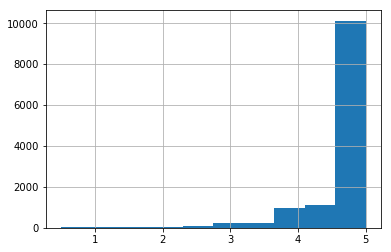

In [43]:
test_df["rating"].hist()

(array([    5.,    13.,    22.,    80.,   195.,   605.,  1430.,  2856.,
         4442.,  3219.]),
 array([ 3.78404347,  3.90563913,  4.02723478,  4.14883043,  4.27042608,
         4.39202174,  4.51361739,  4.63521304,  4.75680869,  4.87840435,  5.        ]),
 <a list of 10 Patch objects>)

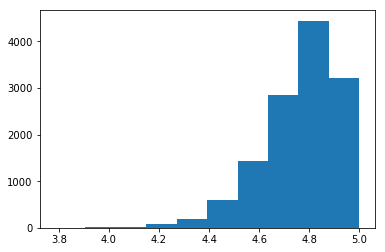

In [44]:
plt.hist(predictions_test)

In [47]:
df = pd.read_csv("processed_data.csv")

In [48]:
df[df["user_review_count"] > 4]

,Unnamed: 0,_class_x,content,course_id,created,id,modified,rating,title_x,user,...,user_rating_avg,user_review_count,course_review_count,course_rating_avg,instructor_name,instructor_title,new_course_id,new_user_id,course_category,Unnamed: 35
7,7,course_review,love it,289230,2017-07-05T01:08:27Z,7944006,2017-07-05T01:08:27Z,5.0,NaN,"{u'_class': u'user', u'display_name': u'David ...",...,5.000000,5,3597,4.797748,u'Anthony Alicea',u'Software Developer,198,90879,web development,NaN
57,57,course_review,"I knew AngularJS already, but I never felt lik...",289230,2017-06-19T05:04:08Z,7625532,2017-06-19T05:04:08Z,5.0,NaN,"{u'_class': u'user', u'display_name': u'Ankush...",...,4.714286,7,3597,4.797748,u'Anthony Alicea',u'Software Developer,198,131863,web development,NaN
61,61,course_review,very clear and informative,289230,2017-06-16T11:59:14Z,7578328,2017-06-16T11:59:14Z,5.0,NaN,"{u'_class': u'user', u'display_name': u'Ryan M...",...,5.000000,7,3597,4.797748,u'Anthony Alicea',u'Software Developer,198,115613,web development,NaN
79,79,course_review,This course has not been maintained. The CDN-U...,289230,2017-06-10T14:22:10Z,7459474,2017-06-10T14:22:10Z,2.0,NaN,"{u'_class': u'user', u'display_name': u'Hanna ...",...,4.200000,5,3597,4.797748,u'Anthony Alicea',u'Software Developer,198,226034,web development,NaN
139,139,course_review,"Great course, would love to see more new cours...",289230,2017-05-22T01:18:40Z,7056178,2017-05-22T01:18:40Z,5.0,NaN,"{u'_class': u'user', u'display_name': u'Matthe...",...,5.000000,5,3597,4.797748,u'Anthony Alicea',u'Software Developer,198,16490,web development,NaN
226,226,course_review,A really good course about angular. Learning a...,289230,2017-04-24T21:59:10Z,6607388,2017-04-24T21:59:10Z,5.0,NaN,"{u'_class': u'user', u'display_name': u'Jose A...",...,5.000000,8,3597,4.797748,u'Anthony Alicea',u'Software Developer,198,28396,web development,NaN
230,230,course_review,Course has not been updated for recent Angular...,289230,2017-04-24T11:41:44Z,6597972,2017-04-24T11:41:44Z,3.0,NaN,"{u'_class': u'user', u'display_name': u'Joel F...",...,4.300000,5,3597,4.797748,u'Anthony Alicea',u'Software Developer,198,227817,web development,NaN
241,241,course_review,great explanations so far!,289230,2017-04-20T16:53:43Z,6543922,2017-04-20T16:53:43Z,5.0,NaN,"{u'_class': u'user', u'display_name': u'Jonath...",...,4.750000,10,3597,4.797748,u'Anthony Alicea',u'Software Developer,198,130631,web development,NaN
266,266,course_review,As always a thorough exposition of what is nee...,289230,2017-04-12T17:29:10Z,6417118,2017-04-12T17:29:10Z,5.0,NaN,"{u'_class': u'user', u'display_name': u'Gordon...",...,4.666667,6,3597,4.797748,u'Anthony Alicea',u'Software Developer,198,124382,web development,NaN
286,286,course_review,Best instructor on Udemy! Very detailed and g...,289230,2017-04-05T10:32:01Z,6306738,2017-04-05T10:32:01Z,5.0,NaN,"{u'_class': u'user', u'display_name': u'Warren...",...,5.000000,11,3597,4.797748,u'Anthony Alicea',u'Software Developer,198,180788,web development,NaN


In [50]:
df[df["new_user_id"] == 90879]

,Unnamed: 0,_class_x,content,course_id,created,id,modified,rating,title_x,user,...,user_rating_avg,user_review_count,course_review_count,course_rating_avg,instructor_name,instructor_title,new_course_id,new_user_id,course_category,Unnamed: 35
7,7,course_review,love it,289230,2017-07-05T01:08:27Z,7944006,2017-07-05T01:08:27Z,5.0,NaN,"{u'_class': u'user', u'display_name': u'David ...",...,5.0,5,3597,4.797748,u'Anthony Alicea',u'Software Developer,198,90879,web development,NaN
9644,9644,course_review,very engaging,437398,2016-08-13T08:24:11Z,3088364,2016-08-29T11:39:20Z,5.0,NaN,"{u'_class': u'user', u'display_name': u'David ...",...,5.0,5,2634,4.785877,u'Jonas Schmedtmann',u'Web Developer,342,90879,web development,NaN
12278,12278,course_review,very thorough explanations,762616,2017-01-08T09:14:56Z,4830224,2017-01-08T09:15:12Z,5.0,NaN,"{u'_class': u'user', u'display_name': u'David ...",...,5.0,5,2076,4.627649,u'Jose Portilla',u'Data Scientist'}],643,90879,sql,NaN
14354,14354,course_review,"Very good course, the speed is great John even...",65830,2015-11-27T23:21:19Z,837224,2015-11-27T23:21:19Z,5.0,Very good course,"{u'_class': u'user', u'display_name': u'David ...",...,5.0,5,609,4.526273,u'John Purcell',u'Software Development Trainer',79,90879,programming,NaN
14963,14963,course_review,"the course is great, love the voice and tone o...",359550,2016-11-17T18:49:16Z,4145832,2016-11-20T17:59:25Z,5.0,NaN,"{u'_class': u'user', u'display_name': u'David ...",...,5.0,5,378,4.817460,u'Imtiaz Ahmad',u'Senior Software Engineer & Trainer @ Job Re...,258,90879,programming,NaN


In [53]:
train_df[train_df["new_user_id"] == 90879]

,new_course_id,new_user_id,rating
0,342,90879,5.0
0,198,90879,5.0
2,79,90879,5.0
1,643,90879,5.0


In [57]:
test_df["predicted_rating"] = predictions_test

In [52]:
model.recommend([90879])

new_user_id,new_course_id,score,rank
90879,442,5.04564514959,1
90879,562,5.04437109845,2
90879,610,5.03509037633,3
90879,613,5.03456509922,4
90879,794,5.03290870849,5
90879,68,5.03275319625,6
90879,860,5.0307877573,7
90879,700,5.03059380938,8
90879,522,5.02907417964,9
90879,176,5.02414825808,10


In [59]:
item_subset = graphlab.SArray([258])
recommendations = model.recommend([90879], items = item_subset)

In [60]:
recommendations

new_user_id,new_course_id,score,rank
90879,258,4.96975442831,1


In [58]:
test_df.head(50)

,new_course_id,new_user_id,rating,predicted_rating
0,258,90879,5.0,4.969754
1,198,257277,5.0,4.902578
2,495,124321,5.0,4.892088
3,403,124840,5.0,4.656327
4,635,69700,3.5,4.783893
5,198,169010,5.0,4.918869
6,198,167825,4.5,4.782731
7,198,131863,5.0,4.779060
8,710,115613,5.0,4.868530
9,495,121883,5.0,4.908391
